In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F 
import torch.autograd
from torch.autograd import Variable
import torch.optim as optim
import numpy as np
import gym
from collections import deque
import random
import sys
import pandas as pd
import matplotlib.pyplot as plt
from numpy import cos, sin
from gym import spaces
from gym.error import DependencyNotInstalled
from typing import Optional
from control.matlab import ss, lsim, linspace, c2d
from functools import partial
from state_estimation import Estimator
import math
import gym
from stable_baselines3 import PPO, SAC, TD3, DDPG, DQN, A2C
from stable_baselines3.common.env_checker import check_env
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint

In [2]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [3]:
# define CSTR model
def bicycle(x,t,u, params={}):
    lr = 1.105
    lf = 1.738
    psi = x[2]
    v = x[3]
    alpha = u[0]
    sigma = u[1]
    xdot =np.zeros(4)
    beta = math.atan((lr/(lr+lf)*math.tan(sigma)))
    xdot[0] = v*math.cos(psi+beta)
    xdot[1] = v*math.sin(psi+beta)
    xdot[2] = v/lr*math.sin(beta)
    xdot[3] = alpha
    return xdot

In [6]:
class bicycleEnv(gym.Env):
    """Custom Environment that follows gym interface."""

    metadata = {"render.modes": ["human"]}

    def __init__(self, render_mode: Optional[str] = None, g=10.0):
        super(bicycleEnv).__init__()
        # Define action and observation space
        # They must be gym.spaces objects
        # Example when using discrete actions:
        ob_high = np.ones(4)*20
        action_high = np.ones(2)*7
        self.action_space = spaces.Box(low=-action_high, high=action_high, dtype=np.float32)
        self.observation_space = spaces.Box(low=-ob_high, high=ob_high, dtype=np.float32)
        self.step_const = 20
        self.freq = 0.1
        self.steps = 0
        self.center = [1,1,0,math.sqrt(2)]
        self.reward_cache = [] # cache distances to target norm ball center
        self.final_reward_cache = [] # cache final reward
        self.state = np.random.rand(4)*2-1
        self.horizon = np.arange(0, self.step_const+2, 1)*0.1
        self.target_norm_radius = 0.8
        self.max_reward_list = []
        self.quality_list = []
        self.total_steps = 0
        self.step_history = []
        self.k = 20
    def step(self, action):
        terminated = False
        ts = [self.horizon[self.steps], self.horizon[self.steps+1] ]
        self.state = odeint(bicycle, self.state, ts, args=(action,))[-1]
        dist = np.linalg.norm(self.state - self.center)
        reward = self.target_norm_radius - dist
        self.reward_cache.append(reward)
        self.steps += 1
        self.total_steps +=1
        # quantitative semantics
        # reach reward, encourage reaching target
        if self.steps < 10:
            reach_reward = max(self.reward_cache)
        else:
            reach_reward = max(self.reward_cache[-10:])
        final_reward = reach_reward
        if dist <= self.target_norm_radius:
            final_reward = 10
        self.final_reward_cache.append(final_reward)
        if self.steps == self.step_const or max(np.absolute(self.state))>20:
            self.max_reward_list.append(max(self.final_reward_cache)) # use max final reward to measure episodes
            self.step_history.append(self.total_steps)
            self.quality_list.append(sum(self.final_reward_cache))
            terminated = True
            self.reset()

        # Return next state, reward, done, info
        return self.state, final_reward, terminated, {}

    def reset(self):
        self.steps = 0
        self.state = np.random.rand(4)*2-1
        self.reward_cache = []
#         self.step_const = random.randint(10, 30)
        self.step_const = self.k
        self.horizon = np.arange(0, self.step_const+2, 1)*0.1
        self.final_reward_cache = []
        return self.state  # reward, done, info can't be included

    def render(self, mode="human"):
        return

    def close(self):
        if self.screen is not None:
            import pygame
            pygame.display.quit()
            pygame.quit()
            self.isopen = False

In [7]:
# Training
reached = []
for k in [10,20,40,80,160]:
    env = bicycleEnv()
    env.k = k
    print('Start training with PPO ...')
    # learning_rate = 1e-3, n_steps = 1024, tune these
    model = SAC("MlpPolicy", env, verbose=1)
    model.learn(total_timesteps=300000, progress_bar=False)
    vec_env = model.get_env()
    obs = vec_env.reset()
    size = 15
    env = bicycleEnv()
    env.k = 160
    state = env.reset()
    dims0 = []
    dims1 = []
    dims2 = []
    dims3 = []
    euclids = []
    center = [1,1,0,math.sqrt(2)]
    num_reached = 0
    for j in range(1000):
        dim0 = []
        dim1 = []
        dim2 = []
        dim3 = []
        euclid = []
        state = env.reset()
        # Print initial state
        for i in range(30):
            action, _states = model.predict(state, deterministic=True)
            new_state, reward, done, _ = env.step(action)
            dim0.append(state[0])
            dim1.append(state[1])
            dim2.append(state[2])
            dim3.append(state[3])
            dist = np.linalg.norm(new_state-center)
            euclid.append(dist)
            state = new_state
            if dist <= 0.8: # stop
                num_reached += 1
                break
        dims0.append(dim0)
        dims1.append(dim1)
        dims2.append(dim2)
        dims3.append(dim3)
        euclids.append(euclid)
    reached.append(num_reached)
print(reached)

Start training with PPO ...
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -11.8    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 2228     |
|    time_elapsed    | 0        |
|    total_timesteps | 40       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -13.5    |
| time/              |          |
|    episodes        | 8        |
|    fps             | 2167     |
|    time_elapsed    | 0        |
|    total_timesteps | 80       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -14.5    |
| time/              |          |
|    episodes        | 12   

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -6.1     |
| time/              |          |
|    episodes        | 64       |
|    fps             | 78       |
|    time_elapsed    | 8        |
|    total_timesteps | 640      |
| train/             |          |
|    actor_loss      | -2.32    |
|    critic_loss     | 1.37     |
|    ent_coef        | 0.853    |
|    ent_coef_loss   | -0.495   |
|    learning_rate   | 0.0003   |
|    n_updates       | 539      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -4.37    |
| time/              |          |
|    episodes        | 68       |
|    fps             | 77       |
|    time_elapsed    | 8        |
|    total_timesteps | 680      |
| train/             |          |
|    actor_loss      | -2.91    |
|    critic_loss     | 2.97     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -1.88    |
| time/              |          |
|    episodes        | 124      |
|    fps             | 71       |
|    time_elapsed    | 17       |
|    total_timesteps | 1240     |
| train/             |          |
|    actor_loss      | -3.33    |
|    critic_loss     | 3.28     |
|    ent_coef        | 0.722    |
|    ent_coef_loss   | -0.922   |
|    learning_rate   | 0.0003   |
|    n_updates       | 1139     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 128      |
|    fps             | 70       |
|    time_elapsed    | 18       |
|    total_timesteps | 1280     |
| train/             |          |
|    actor_loss      | -3.03    |
|    critic_loss     | 5.98     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -0.567   |
| time/              |          |
|    episodes        | 184      |
|    fps             | 68       |
|    time_elapsed    | 26       |
|    total_timesteps | 1840     |
| train/             |          |
|    actor_loss      | -4.93    |
|    critic_loss     | 12       |
|    ent_coef        | 0.613    |
|    ent_coef_loss   | -1.29    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1739     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -0.694   |
| time/              |          |
|    episodes        | 188      |
|    fps             | 68       |
|    time_elapsed    | 27       |
|    total_timesteps | 1880     |
| train/             |          |
|    actor_loss      | -5.5     |
|    critic_loss     | 17.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.31     |
| time/              |          |
|    episodes        | 244      |
|    fps             | 67       |
|    time_elapsed    | 36       |
|    total_timesteps | 2440     |
| train/             |          |
|    actor_loss      | -4.08    |
|    critic_loss     | 5.07     |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | -1.67    |
|    learning_rate   | 0.0003   |
|    n_updates       | 2339     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.04     |
| time/              |          |
|    episodes        | 248      |
|    fps             | 67       |
|    time_elapsed    | 36       |
|    total_timesteps | 2480     |
| train/             |          |
|    actor_loss      | -7.09    |
|    critic_loss     | 20       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.8      |
| time/              |          |
|    episodes        | 304      |
|    fps             | 65       |
|    time_elapsed    | 46       |
|    total_timesteps | 3040     |
| train/             |          |
|    actor_loss      | -3.92    |
|    critic_loss     | 15.7     |
|    ent_coef        | 0.441    |
|    ent_coef_loss   | -2.01    |
|    learning_rate   | 0.0003   |
|    n_updates       | 2939     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 0.891    |
| time/              |          |
|    episodes        | 308      |
|    fps             | 65       |
|    time_elapsed    | 47       |
|    total_timesteps | 3080     |
| train/             |          |
|    actor_loss      | -5.33    |
|    critic_loss     | 10.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 364      |
|    fps             | 64       |
|    time_elapsed    | 56       |
|    total_timesteps | 3640     |
| train/             |          |
|    actor_loss      | -4.52    |
|    critic_loss     | 15.9     |
|    ent_coef        | 0.373    |
|    ent_coef_loss   | -2.09    |
|    learning_rate   | 0.0003   |
|    n_updates       | 3539     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 368      |
|    fps             | 64       |
|    time_elapsed    | 57       |
|    total_timesteps | 3680     |
| train/             |          |
|    actor_loss      | -6.12    |
|    critic_loss     | 12.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 0.417    |
| time/              |          |
|    episodes        | 424      |
|    fps             | 64       |
|    time_elapsed    | 65       |
|    total_timesteps | 4240     |
| train/             |          |
|    actor_loss      | -5.24    |
|    critic_loss     | 30.9     |
|    ent_coef        | 0.316    |
|    ent_coef_loss   | -2.45    |
|    learning_rate   | 0.0003   |
|    n_updates       | 4139     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 0.935    |
| time/              |          |
|    episodes        | 428      |
|    fps             | 64       |
|    time_elapsed    | 66       |
|    total_timesteps | 4280     |
| train/             |          |
|    actor_loss      | -4.24    |
|    critic_loss     | 17.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.41     |
| time/              |          |
|    episodes        | 484      |
|    fps             | 64       |
|    time_elapsed    | 75       |
|    total_timesteps | 4840     |
| train/             |          |
|    actor_loss      | -4.88    |
|    critic_loss     | 45.2     |
|    ent_coef        | 0.269    |
|    ent_coef_loss   | -2.45    |
|    learning_rate   | 0.0003   |
|    n_updates       | 4739     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.31     |
| time/              |          |
|    episodes        | 488      |
|    fps             | 64       |
|    time_elapsed    | 75       |
|    total_timesteps | 4880     |
| train/             |          |
|    actor_loss      | -5.78    |
|    critic_loss     | 27.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.95     |
| time/              |          |
|    episodes        | 544      |
|    fps             | 64       |
|    time_elapsed    | 84       |
|    total_timesteps | 5440     |
| train/             |          |
|    actor_loss      | -4.68    |
|    critic_loss     | 24.3     |
|    ent_coef        | 0.23     |
|    ent_coef_loss   | -2.85    |
|    learning_rate   | 0.0003   |
|    n_updates       | 5339     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.56     |
| time/              |          |
|    episodes        | 548      |
|    fps             | 64       |
|    time_elapsed    | 85       |
|    total_timesteps | 5480     |
| train/             |          |
|    actor_loss      | -5.43    |
|    critic_loss     | 16.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.4      |
| time/              |          |
|    episodes        | 604      |
|    fps             | 64       |
|    time_elapsed    | 93       |
|    total_timesteps | 6040     |
| train/             |          |
|    actor_loss      | -2.55    |
|    critic_loss     | 12       |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | -2.6     |
|    learning_rate   | 0.0003   |
|    n_updates       | 5939     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.71     |
| time/              |          |
|    episodes        | 608      |
|    fps             | 64       |
|    time_elapsed    | 94       |
|    total_timesteps | 6080     |
| train/             |          |
|    actor_loss      | -4.63    |
|    critic_loss     | 15.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -0.295   |
| time/              |          |
|    episodes        | 664      |
|    fps             | 64       |
|    time_elapsed    | 102      |
|    total_timesteps | 6640     |
| train/             |          |
|    actor_loss      | -4.54    |
|    critic_loss     | 19.2     |
|    ent_coef        | 0.169    |
|    ent_coef_loss   | -2.82    |
|    learning_rate   | 0.0003   |
|    n_updates       | 6539     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -0.91    |
| time/              |          |
|    episodes        | 668      |
|    fps             | 64       |
|    time_elapsed    | 103      |
|    total_timesteps | 6680     |
| train/             |          |
|    actor_loss      | -3.8     |
|    critic_loss     | 30.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -3.68    |
| time/              |          |
|    episodes        | 724      |
|    fps             | 64       |
|    time_elapsed    | 112      |
|    total_timesteps | 7240     |
| train/             |          |
|    actor_loss      | -3.49    |
|    critic_loss     | 16.5     |
|    ent_coef        | 0.146    |
|    ent_coef_loss   | -2.24    |
|    learning_rate   | 0.0003   |
|    n_updates       | 7139     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -3.59    |
| time/              |          |
|    episodes        | 728      |
|    fps             | 64       |
|    time_elapsed    | 112      |
|    total_timesteps | 7280     |
| train/             |          |
|    actor_loss      | -4.75    |
|    critic_loss     | 22.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -1.82    |
| time/              |          |
|    episodes        | 784      |
|    fps             | 64       |
|    time_elapsed    | 121      |
|    total_timesteps | 7840     |
| train/             |          |
|    actor_loss      | -3.2     |
|    critic_loss     | 11.6     |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | -3.01    |
|    learning_rate   | 0.0003   |
|    n_updates       | 7739     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 788      |
|    fps             | 64       |
|    time_elapsed    | 122      |
|    total_timesteps | 7880     |
| train/             |          |
|    actor_loss      | -5.53    |
|    critic_loss     | 15.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -0.444   |
| time/              |          |
|    episodes        | 844      |
|    fps             | 64       |
|    time_elapsed    | 130      |
|    total_timesteps | 8440     |
| train/             |          |
|    actor_loss      | -4.58    |
|    critic_loss     | 27.8     |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | -2.33    |
|    learning_rate   | 0.0003   |
|    n_updates       | 8339     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -0.438   |
| time/              |          |
|    episodes        | 848      |
|    fps             | 64       |
|    time_elapsed    | 131      |
|    total_timesteps | 8480     |
| train/             |          |
|    actor_loss      | -3.39    |
|    critic_loss     | 15.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 0.987    |
| time/              |          |
|    episodes        | 904      |
|    fps             | 64       |
|    time_elapsed    | 139      |
|    total_timesteps | 9040     |
| train/             |          |
|    actor_loss      | -5.06    |
|    critic_loss     | 19.2     |
|    ent_coef        | 0.0939   |
|    ent_coef_loss   | -1.61    |
|    learning_rate   | 0.0003   |
|    n_updates       | 8939     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.5      |
| time/              |          |
|    episodes        | 908      |
|    fps             | 64       |
|    time_elapsed    | 140      |
|    total_timesteps | 9080     |
| train/             |          |
|    actor_loss      | -5.42    |
|    critic_loss     | 67.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.36     |
| time/              |          |
|    episodes        | 964      |
|    fps             | 63       |
|    time_elapsed    | 151      |
|    total_timesteps | 9640     |
| train/             |          |
|    actor_loss      | -4.66    |
|    critic_loss     | 18       |
|    ent_coef        | 0.0819   |
|    ent_coef_loss   | -1.83    |
|    learning_rate   | 0.0003   |
|    n_updates       | 9539     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.45     |
| time/              |          |
|    episodes        | 968      |
|    fps             | 63       |
|    time_elapsed    | 152      |
|    total_timesteps | 9680     |
| train/             |          |
|    actor_loss      | -3.94    |
|    critic_loss     | 18.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.23     |
| time/              |          |
|    episodes        | 1024     |
|    fps             | 63       |
|    time_elapsed    | 161      |
|    total_timesteps | 10240    |
| train/             |          |
|    actor_loss      | -2.58    |
|    critic_loss     | 29.1     |
|    ent_coef        | 0.0725   |
|    ent_coef_loss   | -0.96    |
|    learning_rate   | 0.0003   |
|    n_updates       | 10139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.15     |
| time/              |          |
|    episodes        | 1028     |
|    fps             | 63       |
|    time_elapsed    | 161      |
|    total_timesteps | 10280    |
| train/             |          |
|    actor_loss      | -3.96    |
|    critic_loss     | 12.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.66     |
| time/              |          |
|    episodes        | 1084     |
|    fps             | 63       |
|    time_elapsed    | 170      |
|    total_timesteps | 10840    |
| train/             |          |
|    actor_loss      | -5.34    |
|    critic_loss     | 44.4     |
|    ent_coef        | 0.0651   |
|    ent_coef_loss   | -0.779   |
|    learning_rate   | 0.0003   |
|    n_updates       | 10739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.97     |
| time/              |          |
|    episodes        | 1088     |
|    fps             | 63       |
|    time_elapsed    | 171      |
|    total_timesteps | 10880    |
| train/             |          |
|    actor_loss      | -3       |
|    critic_loss     | 26.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -3.15    |
| time/              |          |
|    episodes        | 1144     |
|    fps             | 63       |
|    time_elapsed    | 179      |
|    total_timesteps | 11440    |
| train/             |          |
|    actor_loss      | -4.23    |
|    critic_loss     | 29.4     |
|    ent_coef        | 0.0596   |
|    ent_coef_loss   | -1.13    |
|    learning_rate   | 0.0003   |
|    n_updates       | 11339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -2.82    |
| time/              |          |
|    episodes        | 1148     |
|    fps             | 63       |
|    time_elapsed    | 180      |
|    total_timesteps | 11480    |
| train/             |          |
|    actor_loss      | -3.36    |
|    critic_loss     | 17.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -0.2     |
| time/              |          |
|    episodes        | 1204     |
|    fps             | 63       |
|    time_elapsed    | 189      |
|    total_timesteps | 12040    |
| train/             |          |
|    actor_loss      | -4.35    |
|    critic_loss     | 26.5     |
|    ent_coef        | 0.0554   |
|    ent_coef_loss   | -0.342   |
|    learning_rate   | 0.0003   |
|    n_updates       | 11939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -0.0745  |
| time/              |          |
|    episodes        | 1208     |
|    fps             | 63       |
|    time_elapsed    | 189      |
|    total_timesteps | 12080    |
| train/             |          |
|    actor_loss      | -3.55    |
|    critic_loss     | 21.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.68     |
| time/              |          |
|    episodes        | 1264     |
|    fps             | 63       |
|    time_elapsed    | 198      |
|    total_timesteps | 12640    |
| train/             |          |
|    actor_loss      | -4.04    |
|    critic_loss     | 49.3     |
|    ent_coef        | 0.0527   |
|    ent_coef_loss   | 0.0889   |
|    learning_rate   | 0.0003   |
|    n_updates       | 12539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.61     |
| time/              |          |
|    episodes        | 1268     |
|    fps             | 63       |
|    time_elapsed    | 199      |
|    total_timesteps | 12680    |
| train/             |          |
|    actor_loss      | -3.19    |
|    critic_loss     | 29.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.43     |
| time/              |          |
|    episodes        | 1324     |
|    fps             | 63       |
|    time_elapsed    | 207      |
|    total_timesteps | 13240    |
| train/             |          |
|    actor_loss      | -6.3     |
|    critic_loss     | 21.3     |
|    ent_coef        | 0.0506   |
|    ent_coef_loss   | 0.228    |
|    learning_rate   | 0.0003   |
|    n_updates       | 13139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.19     |
| time/              |          |
|    episodes        | 1328     |
|    fps             | 63       |
|    time_elapsed    | 208      |
|    total_timesteps | 13280    |
| train/             |          |
|    actor_loss      | -5.15    |
|    critic_loss     | 21       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.69     |
| time/              |          |
|    episodes        | 1384     |
|    fps             | 63       |
|    time_elapsed    | 217      |
|    total_timesteps | 13840    |
| train/             |          |
|    actor_loss      | -5.77    |
|    critic_loss     | 21       |
|    ent_coef        | 0.0481   |
|    ent_coef_loss   | 0.124    |
|    learning_rate   | 0.0003   |
|    n_updates       | 13739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.18     |
| time/              |          |
|    episodes        | 1388     |
|    fps             | 63       |
|    time_elapsed    | 217      |
|    total_timesteps | 13880    |
| train/             |          |
|    actor_loss      | -4.38    |
|    critic_loss     | 23.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.83     |
| time/              |          |
|    episodes        | 1444     |
|    fps             | 63       |
|    time_elapsed    | 226      |
|    total_timesteps | 14440    |
| train/             |          |
|    actor_loss      | -5.62    |
|    critic_loss     | 21.5     |
|    ent_coef        | 0.047    |
|    ent_coef_loss   | 0.353    |
|    learning_rate   | 0.0003   |
|    n_updates       | 14339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.76     |
| time/              |          |
|    episodes        | 1448     |
|    fps             | 63       |
|    time_elapsed    | 227      |
|    total_timesteps | 14480    |
| train/             |          |
|    actor_loss      | -2.92    |
|    critic_loss     | 16.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 0.979    |
| time/              |          |
|    episodes        | 1504     |
|    fps             | 63       |
|    time_elapsed    | 235      |
|    total_timesteps | 15040    |
| train/             |          |
|    actor_loss      | -3.79    |
|    critic_loss     | 42.5     |
|    ent_coef        | 0.0461   |
|    ent_coef_loss   | 0.486    |
|    learning_rate   | 0.0003   |
|    n_updates       | 14939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -0.442   |
| time/              |          |
|    episodes        | 1508     |
|    fps             | 63       |
|    time_elapsed    | 236      |
|    total_timesteps | 15080    |
| train/             |          |
|    actor_loss      | -5.43    |
|    critic_loss     | 23.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 1564     |
|    fps             | 63       |
|    time_elapsed    | 245      |
|    total_timesteps | 15640    |
| train/             |          |
|    actor_loss      | -3.73    |
|    critic_loss     | 31.7     |
|    ent_coef        | 0.0455   |
|    ent_coef_loss   | 0.307    |
|    learning_rate   | 0.0003   |
|    n_updates       | 15539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -1.35    |
| time/              |          |
|    episodes        | 1568     |
|    fps             | 63       |
|    time_elapsed    | 245      |
|    total_timesteps | 15680    |
| train/             |          |
|    actor_loss      | -2.89    |
|    critic_loss     | 33.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.34     |
| time/              |          |
|    episodes        | 1624     |
|    fps             | 63       |
|    time_elapsed    | 254      |
|    total_timesteps | 16240    |
| train/             |          |
|    actor_loss      | -4.05    |
|    critic_loss     | 41.3     |
|    ent_coef        | 0.0418   |
|    ent_coef_loss   | 0.153    |
|    learning_rate   | 0.0003   |
|    n_updates       | 16139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.06     |
| time/              |          |
|    episodes        | 1628     |
|    fps             | 63       |
|    time_elapsed    | 254      |
|    total_timesteps | 16280    |
| train/             |          |
|    actor_loss      | -2.53    |
|    critic_loss     | 23.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -0.879   |
| time/              |          |
|    episodes        | 1684     |
|    fps             | 63       |
|    time_elapsed    | 263      |
|    total_timesteps | 16840    |
| train/             |          |
|    actor_loss      | -3.66    |
|    critic_loss     | 38.1     |
|    ent_coef        | 0.0416   |
|    ent_coef_loss   | 0.0102   |
|    learning_rate   | 0.0003   |
|    n_updates       | 16739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -0.87    |
| time/              |          |
|    episodes        | 1688     |
|    fps             | 63       |
|    time_elapsed    | 264      |
|    total_timesteps | 16880    |
| train/             |          |
|    actor_loss      | -5.66    |
|    critic_loss     | 45.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.82     |
| time/              |          |
|    episodes        | 1744     |
|    fps             | 63       |
|    time_elapsed    | 272      |
|    total_timesteps | 17440    |
| train/             |          |
|    actor_loss      | -4.52    |
|    critic_loss     | 33.1     |
|    ent_coef        | 0.0417   |
|    ent_coef_loss   | 0.455    |
|    learning_rate   | 0.0003   |
|    n_updates       | 17339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.35     |
| time/              |          |
|    episodes        | 1748     |
|    fps             | 63       |
|    time_elapsed    | 273      |
|    total_timesteps | 17480    |
| train/             |          |
|    actor_loss      | -4.89    |
|    critic_loss     | 31.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.43     |
| time/              |          |
|    episodes        | 1804     |
|    fps             | 63       |
|    time_elapsed    | 282      |
|    total_timesteps | 18040    |
| train/             |          |
|    actor_loss      | -3.59    |
|    critic_loss     | 26.7     |
|    ent_coef        | 0.0434   |
|    ent_coef_loss   | -0.292   |
|    learning_rate   | 0.0003   |
|    n_updates       | 17939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.85     |
| time/              |          |
|    episodes        | 1808     |
|    fps             | 63       |
|    time_elapsed    | 282      |
|    total_timesteps | 18080    |
| train/             |          |
|    actor_loss      | -5.19    |
|    critic_loss     | 35.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.34     |
| time/              |          |
|    episodes        | 1864     |
|    fps             | 63       |
|    time_elapsed    | 291      |
|    total_timesteps | 18640    |
| train/             |          |
|    actor_loss      | -3.03    |
|    critic_loss     | 27.5     |
|    ent_coef        | 0.0436   |
|    ent_coef_loss   | 0.161    |
|    learning_rate   | 0.0003   |
|    n_updates       | 18539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.89     |
| time/              |          |
|    episodes        | 1868     |
|    fps             | 63       |
|    time_elapsed    | 292      |
|    total_timesteps | 18680    |
| train/             |          |
|    actor_loss      | -4.26    |
|    critic_loss     | 20.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.66     |
| time/              |          |
|    episodes        | 1924     |
|    fps             | 63       |
|    time_elapsed    | 300      |
|    total_timesteps | 19240    |
| train/             |          |
|    actor_loss      | -3.07    |
|    critic_loss     | 26.6     |
|    ent_coef        | 0.0424   |
|    ent_coef_loss   | -0.112   |
|    learning_rate   | 0.0003   |
|    n_updates       | 19139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.34     |
| time/              |          |
|    episodes        | 1928     |
|    fps             | 63       |
|    time_elapsed    | 301      |
|    total_timesteps | 19280    |
| train/             |          |
|    actor_loss      | -5.19    |
|    critic_loss     | 32.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.75     |
| time/              |          |
|    episodes        | 1984     |
|    fps             | 64       |
|    time_elapsed    | 309      |
|    total_timesteps | 19840    |
| train/             |          |
|    actor_loss      | -4.77    |
|    critic_loss     | 23.1     |
|    ent_coef        | 0.0428   |
|    ent_coef_loss   | 0.327    |
|    learning_rate   | 0.0003   |
|    n_updates       | 19739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.52     |
| time/              |          |
|    episodes        | 1988     |
|    fps             | 64       |
|    time_elapsed    | 310      |
|    total_timesteps | 19880    |
| train/             |          |
|    actor_loss      | -3.67    |
|    critic_loss     | 21       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.38     |
| time/              |          |
|    episodes        | 2044     |
|    fps             | 64       |
|    time_elapsed    | 319      |
|    total_timesteps | 20440    |
| train/             |          |
|    actor_loss      | -4.74    |
|    critic_loss     | 35.6     |
|    ent_coef        | 0.0437   |
|    ent_coef_loss   | -0.211   |
|    learning_rate   | 0.0003   |
|    n_updates       | 20339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.43     |
| time/              |          |
|    episodes        | 2048     |
|    fps             | 64       |
|    time_elapsed    | 319      |
|    total_timesteps | 20480    |
| train/             |          |
|    actor_loss      | -4.76    |
|    critic_loss     | 35       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.13     |
| time/              |          |
|    episodes        | 2104     |
|    fps             | 64       |
|    time_elapsed    | 328      |
|    total_timesteps | 21040    |
| train/             |          |
|    actor_loss      | -3.86    |
|    critic_loss     | 31.8     |
|    ent_coef        | 0.0438   |
|    ent_coef_loss   | 0.873    |
|    learning_rate   | 0.0003   |
|    n_updates       | 20939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.83     |
| time/              |          |
|    episodes        | 2108     |
|    fps             | 64       |
|    time_elapsed    | 329      |
|    total_timesteps | 21080    |
| train/             |          |
|    actor_loss      | -3.92    |
|    critic_loss     | 32.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.56     |
| time/              |          |
|    episodes        | 2164     |
|    fps             | 64       |
|    time_elapsed    | 337      |
|    total_timesteps | 21640    |
| train/             |          |
|    actor_loss      | -4.16    |
|    critic_loss     | 39.9     |
|    ent_coef        | 0.0441   |
|    ent_coef_loss   | 0.203    |
|    learning_rate   | 0.0003   |
|    n_updates       | 21539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.73     |
| time/              |          |
|    episodes        | 2168     |
|    fps             | 64       |
|    time_elapsed    | 338      |
|    total_timesteps | 21680    |
| train/             |          |
|    actor_loss      | -3.85    |
|    critic_loss     | 23.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.81     |
| time/              |          |
|    episodes        | 2224     |
|    fps             | 64       |
|    time_elapsed    | 347      |
|    total_timesteps | 22240    |
| train/             |          |
|    actor_loss      | -4.14    |
|    critic_loss     | 24.3     |
|    ent_coef        | 0.0439   |
|    ent_coef_loss   | 0.134    |
|    learning_rate   | 0.0003   |
|    n_updates       | 22139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.19     |
| time/              |          |
|    episodes        | 2228     |
|    fps             | 64       |
|    time_elapsed    | 347      |
|    total_timesteps | 22280    |
| train/             |          |
|    actor_loss      | -1.89    |
|    critic_loss     | 16.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.58     |
| time/              |          |
|    episodes        | 2284     |
|    fps             | 64       |
|    time_elapsed    | 356      |
|    total_timesteps | 22840    |
| train/             |          |
|    actor_loss      | -4.22    |
|    critic_loss     | 51.6     |
|    ent_coef        | 0.0437   |
|    ent_coef_loss   | 0.579    |
|    learning_rate   | 0.0003   |
|    n_updates       | 22739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.1      |
| time/              |          |
|    episodes        | 2288     |
|    fps             | 64       |
|    time_elapsed    | 357      |
|    total_timesteps | 22880    |
| train/             |          |
|    actor_loss      | -3.17    |
|    critic_loss     | 20.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.12     |
| time/              |          |
|    episodes        | 2344     |
|    fps             | 64       |
|    time_elapsed    | 365      |
|    total_timesteps | 23440    |
| train/             |          |
|    actor_loss      | -4.19    |
|    critic_loss     | 36.7     |
|    ent_coef        | 0.0441   |
|    ent_coef_loss   | 0.758    |
|    learning_rate   | 0.0003   |
|    n_updates       | 23339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.54     |
| time/              |          |
|    episodes        | 2348     |
|    fps             | 64       |
|    time_elapsed    | 366      |
|    total_timesteps | 23480    |
| train/             |          |
|    actor_loss      | -2.14    |
|    critic_loss     | 29.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.3      |
| time/              |          |
|    episodes        | 2404     |
|    fps             | 64       |
|    time_elapsed    | 375      |
|    total_timesteps | 24040    |
| train/             |          |
|    actor_loss      | -3.62    |
|    critic_loss     | 20.8     |
|    ent_coef        | 0.0457   |
|    ent_coef_loss   | -0.681   |
|    learning_rate   | 0.0003   |
|    n_updates       | 23939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.99     |
| time/              |          |
|    episodes        | 2408     |
|    fps             | 64       |
|    time_elapsed    | 375      |
|    total_timesteps | 24080    |
| train/             |          |
|    actor_loss      | -2.73    |
|    critic_loss     | 22.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.93     |
| time/              |          |
|    episodes        | 2464     |
|    fps             | 64       |
|    time_elapsed    | 384      |
|    total_timesteps | 24640    |
| train/             |          |
|    actor_loss      | -5.66    |
|    critic_loss     | 32.6     |
|    ent_coef        | 0.0458   |
|    ent_coef_loss   | -0.0428  |
|    learning_rate   | 0.0003   |
|    n_updates       | 24539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.51     |
| time/              |          |
|    episodes        | 2468     |
|    fps             | 64       |
|    time_elapsed    | 385      |
|    total_timesteps | 24680    |
| train/             |          |
|    actor_loss      | -4.24    |
|    critic_loss     | 29.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.57     |
| time/              |          |
|    episodes        | 2524     |
|    fps             | 64       |
|    time_elapsed    | 393      |
|    total_timesteps | 25240    |
| train/             |          |
|    actor_loss      | -3.64    |
|    critic_loss     | 25.9     |
|    ent_coef        | 0.0467   |
|    ent_coef_loss   | -0.787   |
|    learning_rate   | 0.0003   |
|    n_updates       | 25139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.9      |
| time/              |          |
|    episodes        | 2528     |
|    fps             | 64       |
|    time_elapsed    | 394      |
|    total_timesteps | 25280    |
| train/             |          |
|    actor_loss      | -4.18    |
|    critic_loss     | 39       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.04     |
| time/              |          |
|    episodes        | 2584     |
|    fps             | 64       |
|    time_elapsed    | 403      |
|    total_timesteps | 25840    |
| train/             |          |
|    actor_loss      | -3.13    |
|    critic_loss     | 18.6     |
|    ent_coef        | 0.0466   |
|    ent_coef_loss   | 0.171    |
|    learning_rate   | 0.0003   |
|    n_updates       | 25739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.54     |
| time/              |          |
|    episodes        | 2588     |
|    fps             | 64       |
|    time_elapsed    | 403      |
|    total_timesteps | 25880    |
| train/             |          |
|    actor_loss      | -3.84    |
|    critic_loss     | 35.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.93     |
| time/              |          |
|    episodes        | 2644     |
|    fps             | 64       |
|    time_elapsed    | 412      |
|    total_timesteps | 26440    |
| train/             |          |
|    actor_loss      | -1.94    |
|    critic_loss     | 39.7     |
|    ent_coef        | 0.0478   |
|    ent_coef_loss   | -0.909   |
|    learning_rate   | 0.0003   |
|    n_updates       | 26339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.57     |
| time/              |          |
|    episodes        | 2648     |
|    fps             | 64       |
|    time_elapsed    | 412      |
|    total_timesteps | 26480    |
| train/             |          |
|    actor_loss      | -4.15    |
|    critic_loss     | 19.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.01     |
| time/              |          |
|    episodes        | 2704     |
|    fps             | 64       |
|    time_elapsed    | 421      |
|    total_timesteps | 27040    |
| train/             |          |
|    actor_loss      | -4.44    |
|    critic_loss     | 23.7     |
|    ent_coef        | 0.0481   |
|    ent_coef_loss   | 0.355    |
|    learning_rate   | 0.0003   |
|    n_updates       | 26939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.1      |
| time/              |          |
|    episodes        | 2708     |
|    fps             | 64       |
|    time_elapsed    | 422      |
|    total_timesteps | 27080    |
| train/             |          |
|    actor_loss      | -5.24    |
|    critic_loss     | 31.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.91     |
| time/              |          |
|    episodes        | 2764     |
|    fps             | 64       |
|    time_elapsed    | 430      |
|    total_timesteps | 27640    |
| train/             |          |
|    actor_loss      | -4.52    |
|    critic_loss     | 15.8     |
|    ent_coef        | 0.0495   |
|    ent_coef_loss   | -0.31    |
|    learning_rate   | 0.0003   |
|    n_updates       | 27539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.03     |
| time/              |          |
|    episodes        | 2768     |
|    fps             | 64       |
|    time_elapsed    | 431      |
|    total_timesteps | 27680    |
| train/             |          |
|    actor_loss      | -4.77    |
|    critic_loss     | 28.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.87     |
| time/              |          |
|    episodes        | 2824     |
|    fps             | 64       |
|    time_elapsed    | 440      |
|    total_timesteps | 28240    |
| train/             |          |
|    actor_loss      | -4.83    |
|    critic_loss     | 26.8     |
|    ent_coef        | 0.0499   |
|    ent_coef_loss   | -0.634   |
|    learning_rate   | 0.0003   |
|    n_updates       | 28139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.37     |
| time/              |          |
|    episodes        | 2828     |
|    fps             | 64       |
|    time_elapsed    | 440      |
|    total_timesteps | 28280    |
| train/             |          |
|    actor_loss      | -3.52    |
|    critic_loss     | 32.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.94     |
| time/              |          |
|    episodes        | 2884     |
|    fps             | 64       |
|    time_elapsed    | 449      |
|    total_timesteps | 28840    |
| train/             |          |
|    actor_loss      | -4.11    |
|    critic_loss     | 38.6     |
|    ent_coef        | 0.0505   |
|    ent_coef_loss   | -0.301   |
|    learning_rate   | 0.0003   |
|    n_updates       | 28739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.12     |
| time/              |          |
|    episodes        | 2888     |
|    fps             | 64       |
|    time_elapsed    | 450      |
|    total_timesteps | 28880    |
| train/             |          |
|    actor_loss      | -1.66    |
|    critic_loss     | 12.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.31     |
| time/              |          |
|    episodes        | 2944     |
|    fps             | 64       |
|    time_elapsed    | 458      |
|    total_timesteps | 29440    |
| train/             |          |
|    actor_loss      | -4.79    |
|    critic_loss     | 31.2     |
|    ent_coef        | 0.0492   |
|    ent_coef_loss   | -0.658   |
|    learning_rate   | 0.0003   |
|    n_updates       | 29339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.66     |
| time/              |          |
|    episodes        | 2948     |
|    fps             | 64       |
|    time_elapsed    | 459      |
|    total_timesteps | 29480    |
| train/             |          |
|    actor_loss      | -4.23    |
|    critic_loss     | 28.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.95     |
| time/              |          |
|    episodes        | 3004     |
|    fps             | 64       |
|    time_elapsed    | 468      |
|    total_timesteps | 30040    |
| train/             |          |
|    actor_loss      | -3.31    |
|    critic_loss     | 24.6     |
|    ent_coef        | 0.0493   |
|    ent_coef_loss   | -0.382   |
|    learning_rate   | 0.0003   |
|    n_updates       | 29939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.54     |
| time/              |          |
|    episodes        | 3008     |
|    fps             | 64       |
|    time_elapsed    | 468      |
|    total_timesteps | 30080    |
| train/             |          |
|    actor_loss      | -3.09    |
|    critic_loss     | 19.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 0.257    |
| time/              |          |
|    episodes        | 3064     |
|    fps             | 64       |
|    time_elapsed    | 477      |
|    total_timesteps | 30640    |
| train/             |          |
|    actor_loss      | -5.8     |
|    critic_loss     | 37.6     |
|    ent_coef        | 0.0491   |
|    ent_coef_loss   | -0.539   |
|    learning_rate   | 0.0003   |
|    n_updates       | 30539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 0.956    |
| time/              |          |
|    episodes        | 3068     |
|    fps             | 64       |
|    time_elapsed    | 478      |
|    total_timesteps | 30680    |
| train/             |          |
|    actor_loss      | -6.85    |
|    critic_loss     | 27.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.93     |
| time/              |          |
|    episodes        | 3124     |
|    fps             | 63       |
|    time_elapsed    | 488      |
|    total_timesteps | 31240    |
| train/             |          |
|    actor_loss      | -3.99    |
|    critic_loss     | 24.1     |
|    ent_coef        | 0.0505   |
|    ent_coef_loss   | -0.272   |
|    learning_rate   | 0.0003   |
|    n_updates       | 31139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.98     |
| time/              |          |
|    episodes        | 3128     |
|    fps             | 63       |
|    time_elapsed    | 489      |
|    total_timesteps | 31280    |
| train/             |          |
|    actor_loss      | -5.21    |
|    critic_loss     | 27.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.55     |
| time/              |          |
|    episodes        | 3184     |
|    fps             | 63       |
|    time_elapsed    | 499      |
|    total_timesteps | 31840    |
| train/             |          |
|    actor_loss      | -6.16    |
|    critic_loss     | 31       |
|    ent_coef        | 0.0513   |
|    ent_coef_loss   | 0.152    |
|    learning_rate   | 0.0003   |
|    n_updates       | 31739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.96     |
| time/              |          |
|    episodes        | 3188     |
|    fps             | 63       |
|    time_elapsed    | 500      |
|    total_timesteps | 31880    |
| train/             |          |
|    actor_loss      | -4.17    |
|    critic_loss     | 30.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.96     |
| time/              |          |
|    episodes        | 3244     |
|    fps             | 63       |
|    time_elapsed    | 510      |
|    total_timesteps | 32440    |
| train/             |          |
|    actor_loss      | -6.81    |
|    critic_loss     | 20.3     |
|    ent_coef        | 0.0507   |
|    ent_coef_loss   | 0.136    |
|    learning_rate   | 0.0003   |
|    n_updates       | 32339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.58     |
| time/              |          |
|    episodes        | 3248     |
|    fps             | 63       |
|    time_elapsed    | 510      |
|    total_timesteps | 32480    |
| train/             |          |
|    actor_loss      | -4.58    |
|    critic_loss     | 14.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.11     |
| time/              |          |
|    episodes        | 3304     |
|    fps             | 63       |
|    time_elapsed    | 520      |
|    total_timesteps | 33040    |
| train/             |          |
|    actor_loss      | -5.61    |
|    critic_loss     | 14.3     |
|    ent_coef        | 0.0516   |
|    ent_coef_loss   | 1.06     |
|    learning_rate   | 0.0003   |
|    n_updates       | 32939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.68     |
| time/              |          |
|    episodes        | 3308     |
|    fps             | 63       |
|    time_elapsed    | 520      |
|    total_timesteps | 33080    |
| train/             |          |
|    actor_loss      | -7.44    |
|    critic_loss     | 29.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.49     |
| time/              |          |
|    episodes        | 3364     |
|    fps             | 63       |
|    time_elapsed    | 532      |
|    total_timesteps | 33640    |
| train/             |          |
|    actor_loss      | -4.82    |
|    critic_loss     | 34       |
|    ent_coef        | 0.0519   |
|    ent_coef_loss   | 0.466    |
|    learning_rate   | 0.0003   |
|    n_updates       | 33539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.69     |
| time/              |          |
|    episodes        | 3368     |
|    fps             | 63       |
|    time_elapsed    | 532      |
|    total_timesteps | 33680    |
| train/             |          |
|    actor_loss      | -4.56    |
|    critic_loss     | 36.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.36     |
| time/              |          |
|    episodes        | 3424     |
|    fps             | 63       |
|    time_elapsed    | 542      |
|    total_timesteps | 34240    |
| train/             |          |
|    actor_loss      | -4.62    |
|    critic_loss     | 28.3     |
|    ent_coef        | 0.0526   |
|    ent_coef_loss   | -0.0302  |
|    learning_rate   | 0.0003   |
|    n_updates       | 34139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.6      |
| time/              |          |
|    episodes        | 3428     |
|    fps             | 63       |
|    time_elapsed    | 542      |
|    total_timesteps | 34280    |
| train/             |          |
|    actor_loss      | -3.85    |
|    critic_loss     | 21.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.62     |
| time/              |          |
|    episodes        | 3484     |
|    fps             | 63       |
|    time_elapsed    | 552      |
|    total_timesteps | 34840    |
| train/             |          |
|    actor_loss      | -6.79    |
|    critic_loss     | 33       |
|    ent_coef        | 0.0529   |
|    ent_coef_loss   | 0.182    |
|    learning_rate   | 0.0003   |
|    n_updates       | 34739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.24     |
| time/              |          |
|    episodes        | 3488     |
|    fps             | 63       |
|    time_elapsed    | 552      |
|    total_timesteps | 34880    |
| train/             |          |
|    actor_loss      | -6.75    |
|    critic_loss     | 20.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.95     |
| time/              |          |
|    episodes        | 3544     |
|    fps             | 63       |
|    time_elapsed    | 561      |
|    total_timesteps | 35440    |
| train/             |          |
|    actor_loss      | -5.46    |
|    critic_loss     | 33       |
|    ent_coef        | 0.0533   |
|    ent_coef_loss   | 0.837    |
|    learning_rate   | 0.0003   |
|    n_updates       | 35339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.38     |
| time/              |          |
|    episodes        | 3548     |
|    fps             | 63       |
|    time_elapsed    | 562      |
|    total_timesteps | 35480    |
| train/             |          |
|    actor_loss      | -5.59    |
|    critic_loss     | 42       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.01     |
| time/              |          |
|    episodes        | 3604     |
|    fps             | 63       |
|    time_elapsed    | 571      |
|    total_timesteps | 36040    |
| train/             |          |
|    actor_loss      | -5.48    |
|    critic_loss     | 35.9     |
|    ent_coef        | 0.0528   |
|    ent_coef_loss   | 0.963    |
|    learning_rate   | 0.0003   |
|    n_updates       | 35939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.91     |
| time/              |          |
|    episodes        | 3608     |
|    fps             | 63       |
|    time_elapsed    | 572      |
|    total_timesteps | 36080    |
| train/             |          |
|    actor_loss      | -5.34    |
|    critic_loss     | 31.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.2      |
| time/              |          |
|    episodes        | 3664     |
|    fps             | 62       |
|    time_elapsed    | 581      |
|    total_timesteps | 36640    |
| train/             |          |
|    actor_loss      | -8.55    |
|    critic_loss     | 20.3     |
|    ent_coef        | 0.0531   |
|    ent_coef_loss   | 0.292    |
|    learning_rate   | 0.0003   |
|    n_updates       | 36539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.9      |
| time/              |          |
|    episodes        | 3668     |
|    fps             | 62       |
|    time_elapsed    | 582      |
|    total_timesteps | 36680    |
| train/             |          |
|    actor_loss      | -3.65    |
|    critic_loss     | 26       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.25     |
| time/              |          |
|    episodes        | 3724     |
|    fps             | 62       |
|    time_elapsed    | 592      |
|    total_timesteps | 37240    |
| train/             |          |
|    actor_loss      | -6.07    |
|    critic_loss     | 25.1     |
|    ent_coef        | 0.052    |
|    ent_coef_loss   | 0.804    |
|    learning_rate   | 0.0003   |
|    n_updates       | 37139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.83     |
| time/              |          |
|    episodes        | 3728     |
|    fps             | 62       |
|    time_elapsed    | 592      |
|    total_timesteps | 37280    |
| train/             |          |
|    actor_loss      | -6.07    |
|    critic_loss     | 65.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.75     |
| time/              |          |
|    episodes        | 3784     |
|    fps             | 62       |
|    time_elapsed    | 601      |
|    total_timesteps | 37840    |
| train/             |          |
|    actor_loss      | -6.56    |
|    critic_loss     | 30.1     |
|    ent_coef        | 0.0532   |
|    ent_coef_loss   | 0.353    |
|    learning_rate   | 0.0003   |
|    n_updates       | 37739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.81     |
| time/              |          |
|    episodes        | 3788     |
|    fps             | 62       |
|    time_elapsed    | 602      |
|    total_timesteps | 37880    |
| train/             |          |
|    actor_loss      | -5.97    |
|    critic_loss     | 22       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.89     |
| time/              |          |
|    episodes        | 3844     |
|    fps             | 62       |
|    time_elapsed    | 612      |
|    total_timesteps | 38440    |
| train/             |          |
|    actor_loss      | -5.86    |
|    critic_loss     | 31.9     |
|    ent_coef        | 0.0531   |
|    ent_coef_loss   | -0.686   |
|    learning_rate   | 0.0003   |
|    n_updates       | 38339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.84     |
| time/              |          |
|    episodes        | 3848     |
|    fps             | 62       |
|    time_elapsed    | 612      |
|    total_timesteps | 38480    |
| train/             |          |
|    actor_loss      | -5.73    |
|    critic_loss     | 38.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.69     |
| time/              |          |
|    episodes        | 3904     |
|    fps             | 62       |
|    time_elapsed    | 623      |
|    total_timesteps | 39040    |
| train/             |          |
|    actor_loss      | -4.81    |
|    critic_loss     | 21.4     |
|    ent_coef        | 0.0535   |
|    ent_coef_loss   | 0.606    |
|    learning_rate   | 0.0003   |
|    n_updates       | 38939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.78     |
| time/              |          |
|    episodes        | 3908     |
|    fps             | 62       |
|    time_elapsed    | 624      |
|    total_timesteps | 39080    |
| train/             |          |
|    actor_loss      | -6.56    |
|    critic_loss     | 25.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 0.291    |
| time/              |          |
|    episodes        | 3964     |
|    fps             | 62       |
|    time_elapsed    | 635      |
|    total_timesteps | 39640    |
| train/             |          |
|    actor_loss      | -6.06    |
|    critic_loss     | 38.8     |
|    ent_coef        | 0.0522   |
|    ent_coef_loss   | 0.307    |
|    learning_rate   | 0.0003   |
|    n_updates       | 39539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 0.388    |
| time/              |          |
|    episodes        | 3968     |
|    fps             | 62       |
|    time_elapsed    | 636      |
|    total_timesteps | 39680    |
| train/             |          |
|    actor_loss      | -4.42    |
|    critic_loss     | 27       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.78     |
| time/              |          |
|    episodes        | 4024     |
|    fps             | 62       |
|    time_elapsed    | 647      |
|    total_timesteps | 40240    |
| train/             |          |
|    actor_loss      | -8.15    |
|    critic_loss     | 37.6     |
|    ent_coef        | 0.0531   |
|    ent_coef_loss   | 0.382    |
|    learning_rate   | 0.0003   |
|    n_updates       | 40139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.8      |
| time/              |          |
|    episodes        | 4028     |
|    fps             | 62       |
|    time_elapsed    | 648      |
|    total_timesteps | 40280    |
| train/             |          |
|    actor_loss      | -7.79    |
|    critic_loss     | 33.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.35     |
| time/              |          |
|    episodes        | 4084     |
|    fps             | 61       |
|    time_elapsed    | 659      |
|    total_timesteps | 40840    |
| train/             |          |
|    actor_loss      | -5.77    |
|    critic_loss     | 22.7     |
|    ent_coef        | 0.0532   |
|    ent_coef_loss   | 1.04     |
|    learning_rate   | 0.0003   |
|    n_updates       | 40739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.36     |
| time/              |          |
|    episodes        | 4088     |
|    fps             | 61       |
|    time_elapsed    | 659      |
|    total_timesteps | 40880    |
| train/             |          |
|    actor_loss      | -6.12    |
|    critic_loss     | 19.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.32     |
| time/              |          |
|    episodes        | 4144     |
|    fps             | 61       |
|    time_elapsed    | 670      |
|    total_timesteps | 41440    |
| train/             |          |
|    actor_loss      | -5.48    |
|    critic_loss     | 23.3     |
|    ent_coef        | 0.0551   |
|    ent_coef_loss   | 0.454    |
|    learning_rate   | 0.0003   |
|    n_updates       | 41339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.45     |
| time/              |          |
|    episodes        | 4148     |
|    fps             | 61       |
|    time_elapsed    | 670      |
|    total_timesteps | 41480    |
| train/             |          |
|    actor_loss      | -5.1     |
|    critic_loss     | 18.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.76     |
| time/              |          |
|    episodes        | 4204     |
|    fps             | 61       |
|    time_elapsed    | 680      |
|    total_timesteps | 42040    |
| train/             |          |
|    actor_loss      | -7.49    |
|    critic_loss     | 43.2     |
|    ent_coef        | 0.0548   |
|    ent_coef_loss   | 0.642    |
|    learning_rate   | 0.0003   |
|    n_updates       | 41939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.22     |
| time/              |          |
|    episodes        | 4208     |
|    fps             | 61       |
|    time_elapsed    | 681      |
|    total_timesteps | 42080    |
| train/             |          |
|    actor_loss      | -5.31    |
|    critic_loss     | 56.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.58     |
| time/              |          |
|    episodes        | 4264     |
|    fps             | 61       |
|    time_elapsed    | 691      |
|    total_timesteps | 42640    |
| train/             |          |
|    actor_loss      | -5.32    |
|    critic_loss     | 18.9     |
|    ent_coef        | 0.0543   |
|    ent_coef_loss   | -0.493   |
|    learning_rate   | 0.0003   |
|    n_updates       | 42539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.62     |
| time/              |          |
|    episodes        | 4268     |
|    fps             | 61       |
|    time_elapsed    | 691      |
|    total_timesteps | 42680    |
| train/             |          |
|    actor_loss      | -4.62    |
|    critic_loss     | 34.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.09     |
| time/              |          |
|    episodes        | 4324     |
|    fps             | 61       |
|    time_elapsed    | 701      |
|    total_timesteps | 43240    |
| train/             |          |
|    actor_loss      | -6.81    |
|    critic_loss     | 32.3     |
|    ent_coef        | 0.0553   |
|    ent_coef_loss   | 0.0984   |
|    learning_rate   | 0.0003   |
|    n_updates       | 43139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.11     |
| time/              |          |
|    episodes        | 4328     |
|    fps             | 61       |
|    time_elapsed    | 702      |
|    total_timesteps | 43280    |
| train/             |          |
|    actor_loss      | -5.4     |
|    critic_loss     | 38.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 0.791    |
| time/              |          |
|    episodes        | 4384     |
|    fps             | 61       |
|    time_elapsed    | 711      |
|    total_timesteps | 43840    |
| train/             |          |
|    actor_loss      | -5.43    |
|    critic_loss     | 34.7     |
|    ent_coef        | 0.0553   |
|    ent_coef_loss   | -0.165   |
|    learning_rate   | 0.0003   |
|    n_updates       | 43739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 0.0445   |
| time/              |          |
|    episodes        | 4388     |
|    fps             | 61       |
|    time_elapsed    | 712      |
|    total_timesteps | 43880    |
| train/             |          |
|    actor_loss      | -3.79    |
|    critic_loss     | 33.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    episodes        | 4444     |
|    fps             | 61       |
|    time_elapsed    | 722      |
|    total_timesteps | 44440    |
| train/             |          |
|    actor_loss      | -9.36    |
|    critic_loss     | 34.1     |
|    ent_coef        | 0.0556   |
|    ent_coef_loss   | 0.816    |
|    learning_rate   | 0.0003   |
|    n_updates       | 44339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.54     |
| time/              |          |
|    episodes        | 4448     |
|    fps             | 61       |
|    time_elapsed    | 723      |
|    total_timesteps | 44480    |
| train/             |          |
|    actor_loss      | -7.27    |
|    critic_loss     | 29.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.43     |
| time/              |          |
|    episodes        | 4504     |
|    fps             | 61       |
|    time_elapsed    | 733      |
|    total_timesteps | 45040    |
| train/             |          |
|    actor_loss      | -4.08    |
|    critic_loss     | 35.9     |
|    ent_coef        | 0.0552   |
|    ent_coef_loss   | 0.0632   |
|    learning_rate   | 0.0003   |
|    n_updates       | 44939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.8      |
| time/              |          |
|    episodes        | 4508     |
|    fps             | 61       |
|    time_elapsed    | 733      |
|    total_timesteps | 45080    |
| train/             |          |
|    actor_loss      | -5.5     |
|    critic_loss     | 25.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.35     |
| time/              |          |
|    episodes        | 4564     |
|    fps             | 61       |
|    time_elapsed    | 743      |
|    total_timesteps | 45640    |
| train/             |          |
|    actor_loss      | -7.08    |
|    critic_loss     | 34.6     |
|    ent_coef        | 0.054    |
|    ent_coef_loss   | 0.202    |
|    learning_rate   | 0.0003   |
|    n_updates       | 45539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.71     |
| time/              |          |
|    episodes        | 4568     |
|    fps             | 61       |
|    time_elapsed    | 743      |
|    total_timesteps | 45680    |
| train/             |          |
|    actor_loss      | -3.93    |
|    critic_loss     | 32       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.89     |
| time/              |          |
|    episodes        | 4624     |
|    fps             | 61       |
|    time_elapsed    | 753      |
|    total_timesteps | 46240    |
| train/             |          |
|    actor_loss      | -7.39    |
|    critic_loss     | 27.8     |
|    ent_coef        | 0.0552   |
|    ent_coef_loss   | 0.175    |
|    learning_rate   | 0.0003   |
|    n_updates       | 46139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.2      |
| time/              |          |
|    episodes        | 4628     |
|    fps             | 61       |
|    time_elapsed    | 753      |
|    total_timesteps | 46280    |
| train/             |          |
|    actor_loss      | -7.4     |
|    critic_loss     | 39.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.53     |
| time/              |          |
|    episodes        | 4684     |
|    fps             | 61       |
|    time_elapsed    | 763      |
|    total_timesteps | 46840    |
| train/             |          |
|    actor_loss      | -5.38    |
|    critic_loss     | 50.4     |
|    ent_coef        | 0.0543   |
|    ent_coef_loss   | 0.0767   |
|    learning_rate   | 0.0003   |
|    n_updates       | 46739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.94     |
| time/              |          |
|    episodes        | 4688     |
|    fps             | 61       |
|    time_elapsed    | 764      |
|    total_timesteps | 46880    |
| train/             |          |
|    actor_loss      | -5.74    |
|    critic_loss     | 37.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.65     |
| time/              |          |
|    episodes        | 4744     |
|    fps             | 61       |
|    time_elapsed    | 773      |
|    total_timesteps | 47440    |
| train/             |          |
|    actor_loss      | -4.79    |
|    critic_loss     | 21.4     |
|    ent_coef        | 0.0542   |
|    ent_coef_loss   | 0.259    |
|    learning_rate   | 0.0003   |
|    n_updates       | 47339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.58     |
| time/              |          |
|    episodes        | 4748     |
|    fps             | 61       |
|    time_elapsed    | 774      |
|    total_timesteps | 47480    |
| train/             |          |
|    actor_loss      | -5.53    |
|    critic_loss     | 27.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.44     |
| time/              |          |
|    episodes        | 4804     |
|    fps             | 61       |
|    time_elapsed    | 783      |
|    total_timesteps | 48040    |
| train/             |          |
|    actor_loss      | -4.24    |
|    critic_loss     | 21.9     |
|    ent_coef        | 0.0542   |
|    ent_coef_loss   | 0.195    |
|    learning_rate   | 0.0003   |
|    n_updates       | 47939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.13     |
| time/              |          |
|    episodes        | 4808     |
|    fps             | 61       |
|    time_elapsed    | 784      |
|    total_timesteps | 48080    |
| train/             |          |
|    actor_loss      | -6.47    |
|    critic_loss     | 39.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.85     |
| time/              |          |
|    episodes        | 4864     |
|    fps             | 61       |
|    time_elapsed    | 793      |
|    total_timesteps | 48640    |
| train/             |          |
|    actor_loss      | -6.33    |
|    critic_loss     | 22.1     |
|    ent_coef        | 0.0545   |
|    ent_coef_loss   | 0.652    |
|    learning_rate   | 0.0003   |
|    n_updates       | 48539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.37     |
| time/              |          |
|    episodes        | 4868     |
|    fps             | 61       |
|    time_elapsed    | 794      |
|    total_timesteps | 48680    |
| train/             |          |
|    actor_loss      | -5.14    |
|    critic_loss     | 43.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.8      |
| time/              |          |
|    episodes        | 4924     |
|    fps             | 61       |
|    time_elapsed    | 804      |
|    total_timesteps | 49240    |
| train/             |          |
|    actor_loss      | -4.79    |
|    critic_loss     | 25.3     |
|    ent_coef        | 0.0557   |
|    ent_coef_loss   | -0.371   |
|    learning_rate   | 0.0003   |
|    n_updates       | 49139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.65     |
| time/              |          |
|    episodes        | 4928     |
|    fps             | 61       |
|    time_elapsed    | 804      |
|    total_timesteps | 49280    |
| train/             |          |
|    actor_loss      | -7.49    |
|    critic_loss     | 32.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.18     |
| time/              |          |
|    episodes        | 4984     |
|    fps             | 61       |
|    time_elapsed    | 814      |
|    total_timesteps | 49840    |
| train/             |          |
|    actor_loss      | -5.75    |
|    critic_loss     | 21.5     |
|    ent_coef        | 0.0541   |
|    ent_coef_loss   | -0.0385  |
|    learning_rate   | 0.0003   |
|    n_updates       | 49739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.14     |
| time/              |          |
|    episodes        | 4988     |
|    fps             | 61       |
|    time_elapsed    | 815      |
|    total_timesteps | 49880    |
| train/             |          |
|    actor_loss      | -4.99    |
|    critic_loss     | 36.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.68     |
| time/              |          |
|    episodes        | 5044     |
|    fps             | 61       |
|    time_elapsed    | 824      |
|    total_timesteps | 50440    |
| train/             |          |
|    actor_loss      | -5.41    |
|    critic_loss     | 35.9     |
|    ent_coef        | 0.0538   |
|    ent_coef_loss   | -0.137   |
|    learning_rate   | 0.0003   |
|    n_updates       | 50339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.68     |
| time/              |          |
|    episodes        | 5048     |
|    fps             | 61       |
|    time_elapsed    | 825      |
|    total_timesteps | 50480    |
| train/             |          |
|    actor_loss      | -6.1     |
|    critic_loss     | 31       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.09     |
| time/              |          |
|    episodes        | 5104     |
|    fps             | 61       |
|    time_elapsed    | 834      |
|    total_timesteps | 51040    |
| train/             |          |
|    actor_loss      | -2.29    |
|    critic_loss     | 23       |
|    ent_coef        | 0.055    |
|    ent_coef_loss   | -1.06    |
|    learning_rate   | 0.0003   |
|    n_updates       | 50939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.12     |
| time/              |          |
|    episodes        | 5108     |
|    fps             | 61       |
|    time_elapsed    | 835      |
|    total_timesteps | 51080    |
| train/             |          |
|    actor_loss      | -5.26    |
|    critic_loss     | 23.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.49     |
| time/              |          |
|    episodes        | 5164     |
|    fps             | 61       |
|    time_elapsed    | 845      |
|    total_timesteps | 51640    |
| train/             |          |
|    actor_loss      | -4.49    |
|    critic_loss     | 16.6     |
|    ent_coef        | 0.0552   |
|    ent_coef_loss   | -0.564   |
|    learning_rate   | 0.0003   |
|    n_updates       | 51539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.48     |
| time/              |          |
|    episodes        | 5168     |
|    fps             | 61       |
|    time_elapsed    | 845      |
|    total_timesteps | 51680    |
| train/             |          |
|    actor_loss      | -3.88    |
|    critic_loss     | 26.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.99     |
| time/              |          |
|    episodes        | 5224     |
|    fps             | 61       |
|    time_elapsed    | 855      |
|    total_timesteps | 52240    |
| train/             |          |
|    actor_loss      | -5.38    |
|    critic_loss     | 35.5     |
|    ent_coef        | 0.0563   |
|    ent_coef_loss   | -0.368   |
|    learning_rate   | 0.0003   |
|    n_updates       | 52139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.63     |
| time/              |          |
|    episodes        | 5228     |
|    fps             | 61       |
|    time_elapsed    | 856      |
|    total_timesteps | 52280    |
| train/             |          |
|    actor_loss      | -4.51    |
|    critic_loss     | 33.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.92     |
| time/              |          |
|    episodes        | 5284     |
|    fps             | 61       |
|    time_elapsed    | 865      |
|    total_timesteps | 52840    |
| train/             |          |
|    actor_loss      | -6.09    |
|    critic_loss     | 25.8     |
|    ent_coef        | 0.0576   |
|    ent_coef_loss   | -0.193   |
|    learning_rate   | 0.0003   |
|    n_updates       | 52739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.96     |
| time/              |          |
|    episodes        | 5288     |
|    fps             | 61       |
|    time_elapsed    | 866      |
|    total_timesteps | 52880    |
| train/             |          |
|    actor_loss      | -4.97    |
|    critic_loss     | 16.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.93     |
| time/              |          |
|    episodes        | 5344     |
|    fps             | 61       |
|    time_elapsed    | 875      |
|    total_timesteps | 53440    |
| train/             |          |
|    actor_loss      | -5.6     |
|    critic_loss     | 43.4     |
|    ent_coef        | 0.0579   |
|    ent_coef_loss   | -0.295   |
|    learning_rate   | 0.0003   |
|    n_updates       | 53339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.03     |
| time/              |          |
|    episodes        | 5348     |
|    fps             | 61       |
|    time_elapsed    | 876      |
|    total_timesteps | 53480    |
| train/             |          |
|    actor_loss      | -3.88    |
|    critic_loss     | 27.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.08     |
| time/              |          |
|    episodes        | 5404     |
|    fps             | 61       |
|    time_elapsed    | 885      |
|    total_timesteps | 54040    |
| train/             |          |
|    actor_loss      | -6.03    |
|    critic_loss     | 24.4     |
|    ent_coef        | 0.0577   |
|    ent_coef_loss   | -0.123   |
|    learning_rate   | 0.0003   |
|    n_updates       | 53939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.05     |
| time/              |          |
|    episodes        | 5408     |
|    fps             | 61       |
|    time_elapsed    | 886      |
|    total_timesteps | 54080    |
| train/             |          |
|    actor_loss      | -6.84    |
|    critic_loss     | 25.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.06     |
| time/              |          |
|    episodes        | 5464     |
|    fps             | 61       |
|    time_elapsed    | 895      |
|    total_timesteps | 54640    |
| train/             |          |
|    actor_loss      | -4.64    |
|    critic_loss     | 42.5     |
|    ent_coef        | 0.0578   |
|    ent_coef_loss   | 0.0132   |
|    learning_rate   | 0.0003   |
|    n_updates       | 54539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.69     |
| time/              |          |
|    episodes        | 5468     |
|    fps             | 61       |
|    time_elapsed    | 896      |
|    total_timesteps | 54680    |
| train/             |          |
|    actor_loss      | -4.98    |
|    critic_loss     | 44.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.42     |
| time/              |          |
|    episodes        | 5524     |
|    fps             | 60       |
|    time_elapsed    | 905      |
|    total_timesteps | 55240    |
| train/             |          |
|    actor_loss      | -7.22    |
|    critic_loss     | 18.3     |
|    ent_coef        | 0.058    |
|    ent_coef_loss   | 0.473    |
|    learning_rate   | 0.0003   |
|    n_updates       | 55139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.71     |
| time/              |          |
|    episodes        | 5528     |
|    fps             | 60       |
|    time_elapsed    | 906      |
|    total_timesteps | 55280    |
| train/             |          |
|    actor_loss      | -6.89    |
|    critic_loss     | 23.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.3      |
| time/              |          |
|    episodes        | 5584     |
|    fps             | 60       |
|    time_elapsed    | 915      |
|    total_timesteps | 55840    |
| train/             |          |
|    actor_loss      | -5.72    |
|    critic_loss     | 35.8     |
|    ent_coef        | 0.0583   |
|    ent_coef_loss   | -0.0357  |
|    learning_rate   | 0.0003   |
|    n_updates       | 55739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.66     |
| time/              |          |
|    episodes        | 5588     |
|    fps             | 60       |
|    time_elapsed    | 916      |
|    total_timesteps | 55880    |
| train/             |          |
|    actor_loss      | -3.69    |
|    critic_loss     | 22.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.7     |
| time/              |          |
|    episodes        | 5644     |
|    fps             | 60       |
|    time_elapsed    | 926      |
|    total_timesteps | 56440    |
| train/             |          |
|    actor_loss      | -5.18    |
|    critic_loss     | 37       |
|    ent_coef        | 0.058    |
|    ent_coef_loss   | -0.863   |
|    learning_rate   | 0.0003   |
|    n_updates       | 56339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.7     |
| time/              |          |
|    episodes        | 5648     |
|    fps             | 60       |
|    time_elapsed    | 926      |
|    total_timesteps | 56480    |
| train/             |          |
|    actor_loss      | -3.27    |
|    critic_loss     | 34.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.91     |
| time/              |          |
|    episodes        | 5704     |
|    fps             | 60       |
|    time_elapsed    | 936      |
|    total_timesteps | 57040    |
| train/             |          |
|    actor_loss      | -5.76    |
|    critic_loss     | 22.5     |
|    ent_coef        | 0.0581   |
|    ent_coef_loss   | 0.187    |
|    learning_rate   | 0.0003   |
|    n_updates       | 56939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.7      |
| time/              |          |
|    episodes        | 5708     |
|    fps             | 60       |
|    time_elapsed    | 937      |
|    total_timesteps | 57080    |
| train/             |          |
|    actor_loss      | -7.23    |
|    critic_loss     | 25.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.12     |
| time/              |          |
|    episodes        | 5764     |
|    fps             | 60       |
|    time_elapsed    | 946      |
|    total_timesteps | 57640    |
| train/             |          |
|    actor_loss      | -5.67    |
|    critic_loss     | 34.5     |
|    ent_coef        | 0.0582   |
|    ent_coef_loss   | -0.535   |
|    learning_rate   | 0.0003   |
|    n_updates       | 57539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.69     |
| time/              |          |
|    episodes        | 5768     |
|    fps             | 60       |
|    time_elapsed    | 947      |
|    total_timesteps | 57680    |
| train/             |          |
|    actor_loss      | -4.86    |
|    critic_loss     | 27.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.05     |
| time/              |          |
|    episodes        | 5824     |
|    fps             | 60       |
|    time_elapsed    | 957      |
|    total_timesteps | 58240    |
| train/             |          |
|    actor_loss      | -7.26    |
|    critic_loss     | 31       |
|    ent_coef        | 0.0583   |
|    ent_coef_loss   | 0.118    |
|    learning_rate   | 0.0003   |
|    n_updates       | 58139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.03     |
| time/              |          |
|    episodes        | 5828     |
|    fps             | 60       |
|    time_elapsed    | 957      |
|    total_timesteps | 58280    |
| train/             |          |
|    actor_loss      | -5.64    |
|    critic_loss     | 34.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.98     |
| time/              |          |
|    episodes        | 5884     |
|    fps             | 60       |
|    time_elapsed    | 967      |
|    total_timesteps | 58840    |
| train/             |          |
|    actor_loss      | -7.03    |
|    critic_loss     | 31.3     |
|    ent_coef        | 0.0582   |
|    ent_coef_loss   | -0.714   |
|    learning_rate   | 0.0003   |
|    n_updates       | 58739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.13     |
| time/              |          |
|    episodes        | 5888     |
|    fps             | 60       |
|    time_elapsed    | 968      |
|    total_timesteps | 58880    |
| train/             |          |
|    actor_loss      | -6.39    |
|    critic_loss     | 20.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.6     |
| time/              |          |
|    episodes        | 5944     |
|    fps             | 60       |
|    time_elapsed    | 978      |
|    total_timesteps | 59440    |
| train/             |          |
|    actor_loss      | -5.18    |
|    critic_loss     | 24.4     |
|    ent_coef        | 0.0597   |
|    ent_coef_loss   | -0.975   |
|    learning_rate   | 0.0003   |
|    n_updates       | 59339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.6     |
| time/              |          |
|    episodes        | 5948     |
|    fps             | 60       |
|    time_elapsed    | 978      |
|    total_timesteps | 59480    |
| train/             |          |
|    actor_loss      | -4.26    |
|    critic_loss     | 40.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.49     |
| time/              |          |
|    episodes        | 6004     |
|    fps             | 60       |
|    time_elapsed    | 988      |
|    total_timesteps | 60040    |
| train/             |          |
|    actor_loss      | -4.8     |
|    critic_loss     | 28.5     |
|    ent_coef        | 0.0587   |
|    ent_coef_loss   | 0.41     |
|    learning_rate   | 0.0003   |
|    n_updates       | 59939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.24     |
| time/              |          |
|    episodes        | 6008     |
|    fps             | 60       |
|    time_elapsed    | 989      |
|    total_timesteps | 60080    |
| train/             |          |
|    actor_loss      | -6.24    |
|    critic_loss     | 31.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.81     |
| time/              |          |
|    episodes        | 6064     |
|    fps             | 60       |
|    time_elapsed    | 999      |
|    total_timesteps | 60640    |
| train/             |          |
|    actor_loss      | -8       |
|    critic_loss     | 31.9     |
|    ent_coef        | 0.0603   |
|    ent_coef_loss   | 0.458    |
|    learning_rate   | 0.0003   |
|    n_updates       | 60539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.71     |
| time/              |          |
|    episodes        | 6068     |
|    fps             | 60       |
|    time_elapsed    | 1000     |
|    total_timesteps | 60680    |
| train/             |          |
|    actor_loss      | -7.92    |
|    critic_loss     | 53.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13       |
| time/              |          |
|    episodes        | 6124     |
|    fps             | 60       |
|    time_elapsed    | 1010     |
|    total_timesteps | 61240    |
| train/             |          |
|    actor_loss      | -5.73    |
|    critic_loss     | 59       |
|    ent_coef        | 0.0598   |
|    ent_coef_loss   | -0.189   |
|    learning_rate   | 0.0003   |
|    n_updates       | 61139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.7     |
| time/              |          |
|    episodes        | 6128     |
|    fps             | 60       |
|    time_elapsed    | 1011     |
|    total_timesteps | 61280    |
| train/             |          |
|    actor_loss      | -5.33    |
|    critic_loss     | 42.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.62     |
| time/              |          |
|    episodes        | 6184     |
|    fps             | 60       |
|    time_elapsed    | 1021     |
|    total_timesteps | 61840    |
| train/             |          |
|    actor_loss      | -6.14    |
|    critic_loss     | 40.3     |
|    ent_coef        | 0.0604   |
|    ent_coef_loss   | -0.625   |
|    learning_rate   | 0.0003   |
|    n_updates       | 61739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.27     |
| time/              |          |
|    episodes        | 6188     |
|    fps             | 60       |
|    time_elapsed    | 1022     |
|    total_timesteps | 61880    |
| train/             |          |
|    actor_loss      | -5.59    |
|    critic_loss     | 24.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 1.58     |
| time/              |          |
|    episodes        | 6244     |
|    fps             | 60       |
|    time_elapsed    | 1032     |
|    total_timesteps | 62440    |
| train/             |          |
|    actor_loss      | -6.88    |
|    critic_loss     | 56.6     |
|    ent_coef        | 0.0609   |
|    ent_coef_loss   | 0.407    |
|    learning_rate   | 0.0003   |
|    n_updates       | 62339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.32     |
| time/              |          |
|    episodes        | 6248     |
|    fps             | 60       |
|    time_elapsed    | 1033     |
|    total_timesteps | 62480    |
| train/             |          |
|    actor_loss      | -6.23    |
|    critic_loss     | 52.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.56     |
| time/              |          |
|    episodes        | 6304     |
|    fps             | 60       |
|    time_elapsed    | 1046     |
|    total_timesteps | 63040    |
| train/             |          |
|    actor_loss      | -6.47    |
|    critic_loss     | 36.1     |
|    ent_coef        | 0.061    |
|    ent_coef_loss   | 0.392    |
|    learning_rate   | 0.0003   |
|    n_updates       | 62939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.46     |
| time/              |          |
|    episodes        | 6308     |
|    fps             | 60       |
|    time_elapsed    | 1047     |
|    total_timesteps | 63080    |
| train/             |          |
|    actor_loss      | -6.21    |
|    critic_loss     | 36.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.21     |
| time/              |          |
|    episodes        | 6364     |
|    fps             | 60       |
|    time_elapsed    | 1057     |
|    total_timesteps | 63640    |
| train/             |          |
|    actor_loss      | -7.19    |
|    critic_loss     | 31.6     |
|    ent_coef        | 0.0608   |
|    ent_coef_loss   | -0.0125  |
|    learning_rate   | 0.0003   |
|    n_updates       | 63539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.45     |
| time/              |          |
|    episodes        | 6368     |
|    fps             | 60       |
|    time_elapsed    | 1058     |
|    total_timesteps | 63680    |
| train/             |          |
|    actor_loss      | -5.83    |
|    critic_loss     | 34.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.07     |
| time/              |          |
|    episodes        | 6424     |
|    fps             | 60       |
|    time_elapsed    | 1068     |
|    total_timesteps | 64240    |
| train/             |          |
|    actor_loss      | -6.84    |
|    critic_loss     | 30.8     |
|    ent_coef        | 0.0616   |
|    ent_coef_loss   | -0.164   |
|    learning_rate   | 0.0003   |
|    n_updates       | 64139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.96     |
| time/              |          |
|    episodes        | 6428     |
|    fps             | 60       |
|    time_elapsed    | 1069     |
|    total_timesteps | 64280    |
| train/             |          |
|    actor_loss      | -7.18    |
|    critic_loss     | 42.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 6484     |
|    fps             | 60       |
|    time_elapsed    | 1079     |
|    total_timesteps | 64840    |
| train/             |          |
|    actor_loss      | -5.72    |
|    critic_loss     | 50.1     |
|    ent_coef        | 0.062    |
|    ent_coef_loss   | 0.0294   |
|    learning_rate   | 0.0003   |
|    n_updates       | 64739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 6488     |
|    fps             | 60       |
|    time_elapsed    | 1080     |
|    total_timesteps | 64880    |
| train/             |          |
|    actor_loss      | -5.86    |
|    critic_loss     | 18.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.31     |
| time/              |          |
|    episodes        | 6544     |
|    fps             | 59       |
|    time_elapsed    | 1090     |
|    total_timesteps | 65440    |
| train/             |          |
|    actor_loss      | -5.31    |
|    critic_loss     | 36.4     |
|    ent_coef        | 0.0627   |
|    ent_coef_loss   | -0.0565  |
|    learning_rate   | 0.0003   |
|    n_updates       | 65339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.64     |
| time/              |          |
|    episodes        | 6548     |
|    fps             | 59       |
|    time_elapsed    | 1091     |
|    total_timesteps | 65480    |
| train/             |          |
|    actor_loss      | -7.94    |
|    critic_loss     | 44.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.81     |
| time/              |          |
|    episodes        | 6604     |
|    fps             | 59       |
|    time_elapsed    | 1101     |
|    total_timesteps | 66040    |
| train/             |          |
|    actor_loss      | -6.87    |
|    critic_loss     | 35.8     |
|    ent_coef        | 0.0622   |
|    ent_coef_loss   | 0.318    |
|    learning_rate   | 0.0003   |
|    n_updates       | 65939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.33     |
| time/              |          |
|    episodes        | 6608     |
|    fps             | 59       |
|    time_elapsed    | 1102     |
|    total_timesteps | 66080    |
| train/             |          |
|    actor_loss      | -6.02    |
|    critic_loss     | 38.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.56     |
| time/              |          |
|    episodes        | 6664     |
|    fps             | 59       |
|    time_elapsed    | 1112     |
|    total_timesteps | 66640    |
| train/             |          |
|    actor_loss      | -6.73    |
|    critic_loss     | 24.9     |
|    ent_coef        | 0.0627   |
|    ent_coef_loss   | -0.81    |
|    learning_rate   | 0.0003   |
|    n_updates       | 66539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.63     |
| time/              |          |
|    episodes        | 6668     |
|    fps             | 59       |
|    time_elapsed    | 1112     |
|    total_timesteps | 66680    |
| train/             |          |
|    actor_loss      | -6.77    |
|    critic_loss     | 30.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.05     |
| time/              |          |
|    episodes        | 6724     |
|    fps             | 59       |
|    time_elapsed    | 1123     |
|    total_timesteps | 67240    |
| train/             |          |
|    actor_loss      | -8.5     |
|    critic_loss     | 37.5     |
|    ent_coef        | 0.0626   |
|    ent_coef_loss   | 0.112    |
|    learning_rate   | 0.0003   |
|    n_updates       | 67139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.92     |
| time/              |          |
|    episodes        | 6728     |
|    fps             | 59       |
|    time_elapsed    | 1123     |
|    total_timesteps | 67280    |
| train/             |          |
|    actor_loss      | -6.56    |
|    critic_loss     | 22.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.71     |
| time/              |          |
|    episodes        | 6784     |
|    fps             | 59       |
|    time_elapsed    | 1134     |
|    total_timesteps | 67840    |
| train/             |          |
|    actor_loss      | -8.53    |
|    critic_loss     | 42.3     |
|    ent_coef        | 0.0625   |
|    ent_coef_loss   | 1.1      |
|    learning_rate   | 0.0003   |
|    n_updates       | 67739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.47     |
| time/              |          |
|    episodes        | 6788     |
|    fps             | 59       |
|    time_elapsed    | 1134     |
|    total_timesteps | 67880    |
| train/             |          |
|    actor_loss      | -4.87    |
|    critic_loss     | 17.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.26     |
| time/              |          |
|    episodes        | 6844     |
|    fps             | 59       |
|    time_elapsed    | 1144     |
|    total_timesteps | 68440    |
| train/             |          |
|    actor_loss      | -7.81    |
|    critic_loss     | 41.3     |
|    ent_coef        | 0.0633   |
|    ent_coef_loss   | 0.585    |
|    learning_rate   | 0.0003   |
|    n_updates       | 68339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.73     |
| time/              |          |
|    episodes        | 6848     |
|    fps             | 59       |
|    time_elapsed    | 1145     |
|    total_timesteps | 68480    |
| train/             |          |
|    actor_loss      | -7.85    |
|    critic_loss     | 24.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.9     |
| time/              |          |
|    episodes        | 6904     |
|    fps             | 59       |
|    time_elapsed    | 1155     |
|    total_timesteps | 69040    |
| train/             |          |
|    actor_loss      | -6.65    |
|    critic_loss     | 32.7     |
|    ent_coef        | 0.0654   |
|    ent_coef_loss   | 0.425    |
|    learning_rate   | 0.0003   |
|    n_updates       | 68939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.1     |
| time/              |          |
|    episodes        | 6908     |
|    fps             | 59       |
|    time_elapsed    | 1156     |
|    total_timesteps | 69080    |
| train/             |          |
|    actor_loss      | -6.44    |
|    critic_loss     | 21.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 6964     |
|    fps             | 59       |
|    time_elapsed    | 1166     |
|    total_timesteps | 69640    |
| train/             |          |
|    actor_loss      | -6.64    |
|    critic_loss     | 38.9     |
|    ent_coef        | 0.0651   |
|    ent_coef_loss   | -0.034   |
|    learning_rate   | 0.0003   |
|    n_updates       | 69539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15       |
| time/              |          |
|    episodes        | 6968     |
|    fps             | 59       |
|    time_elapsed    | 1166     |
|    total_timesteps | 69680    |
| train/             |          |
|    actor_loss      | -7.84    |
|    critic_loss     | 31.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.92     |
| time/              |          |
|    episodes        | 7024     |
|    fps             | 59       |
|    time_elapsed    | 1176     |
|    total_timesteps | 70240    |
| train/             |          |
|    actor_loss      | -5.05    |
|    critic_loss     | 33.9     |
|    ent_coef        | 0.066    |
|    ent_coef_loss   | -0.852   |
|    learning_rate   | 0.0003   |
|    n_updates       | 70139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.91     |
| time/              |          |
|    episodes        | 7028     |
|    fps             | 59       |
|    time_elapsed    | 1177     |
|    total_timesteps | 70280    |
| train/             |          |
|    actor_loss      | -6.97    |
|    critic_loss     | 37.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.49     |
| time/              |          |
|    episodes        | 7084     |
|    fps             | 59       |
|    time_elapsed    | 1187     |
|    total_timesteps | 70840    |
| train/             |          |
|    actor_loss      | -6.38    |
|    critic_loss     | 25.7     |
|    ent_coef        | 0.0661   |
|    ent_coef_loss   | 0.209    |
|    learning_rate   | 0.0003   |
|    n_updates       | 70739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.78     |
| time/              |          |
|    episodes        | 7088     |
|    fps             | 59       |
|    time_elapsed    | 1188     |
|    total_timesteps | 70880    |
| train/             |          |
|    actor_loss      | -5.51    |
|    critic_loss     | 30.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.6     |
| time/              |          |
|    episodes        | 7144     |
|    fps             | 59       |
|    time_elapsed    | 1198     |
|    total_timesteps | 71440    |
| train/             |          |
|    actor_loss      | -5.7     |
|    critic_loss     | 22.1     |
|    ent_coef        | 0.0665   |
|    ent_coef_loss   | -0.159   |
|    learning_rate   | 0.0003   |
|    n_updates       | 71339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.71     |
| time/              |          |
|    episodes        | 7148     |
|    fps             | 59       |
|    time_elapsed    | 1199     |
|    total_timesteps | 71480    |
| train/             |          |
|    actor_loss      | -6.12    |
|    critic_loss     | 44.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.64     |
| time/              |          |
|    episodes        | 7204     |
|    fps             | 59       |
|    time_elapsed    | 1209     |
|    total_timesteps | 72040    |
| train/             |          |
|    actor_loss      | -5.91    |
|    critic_loss     | 30.4     |
|    ent_coef        | 0.0653   |
|    ent_coef_loss   | -0.228   |
|    learning_rate   | 0.0003   |
|    n_updates       | 71939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.58     |
| time/              |          |
|    episodes        | 7208     |
|    fps             | 59       |
|    time_elapsed    | 1210     |
|    total_timesteps | 72080    |
| train/             |          |
|    actor_loss      | -5.28    |
|    critic_loss     | 30.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 7264     |
|    fps             | 59       |
|    time_elapsed    | 1219     |
|    total_timesteps | 72640    |
| train/             |          |
|    actor_loss      | -8.2     |
|    critic_loss     | 38.2     |
|    ent_coef        | 0.0666   |
|    ent_coef_loss   | 0.413    |
|    learning_rate   | 0.0003   |
|    n_updates       | 72539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.1     |
| time/              |          |
|    episodes        | 7268     |
|    fps             | 59       |
|    time_elapsed    | 1220     |
|    total_timesteps | 72680    |
| train/             |          |
|    actor_loss      | -6.5     |
|    critic_loss     | 31.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.8     |
| time/              |          |
|    episodes        | 7324     |
|    fps             | 59       |
|    time_elapsed    | 1230     |
|    total_timesteps | 73240    |
| train/             |          |
|    actor_loss      | -5.34    |
|    critic_loss     | 28.4     |
|    ent_coef        | 0.0687   |
|    ent_coef_loss   | -0.625   |
|    learning_rate   | 0.0003   |
|    n_updates       | 73139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.6     |
| time/              |          |
|    episodes        | 7328     |
|    fps             | 59       |
|    time_elapsed    | 1231     |
|    total_timesteps | 73280    |
| train/             |          |
|    actor_loss      | -6.84    |
|    critic_loss     | 51.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.72     |
| time/              |          |
|    episodes        | 7384     |
|    fps             | 59       |
|    time_elapsed    | 1241     |
|    total_timesteps | 73840    |
| train/             |          |
|    actor_loss      | -7.69    |
|    critic_loss     | 32.4     |
|    ent_coef        | 0.0669   |
|    ent_coef_loss   | 0.407    |
|    learning_rate   | 0.0003   |
|    n_updates       | 73739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.7     |
| time/              |          |
|    episodes        | 7388     |
|    fps             | 59       |
|    time_elapsed    | 1242     |
|    total_timesteps | 73880    |
| train/             |          |
|    actor_loss      | -7.49    |
|    critic_loss     | 57.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.3      |
| time/              |          |
|    episodes        | 7444     |
|    fps             | 59       |
|    time_elapsed    | 1252     |
|    total_timesteps | 74440    |
| train/             |          |
|    actor_loss      | -7.56    |
|    critic_loss     | 42.9     |
|    ent_coef        | 0.0662   |
|    ent_coef_loss   | -0.341   |
|    learning_rate   | 0.0003   |
|    n_updates       | 74339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.42     |
| time/              |          |
|    episodes        | 7448     |
|    fps             | 59       |
|    time_elapsed    | 1253     |
|    total_timesteps | 74480    |
| train/             |          |
|    actor_loss      | -7.39    |
|    critic_loss     | 55.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10       |
| time/              |          |
|    episodes        | 7504     |
|    fps             | 59       |
|    time_elapsed    | 1262     |
|    total_timesteps | 75040    |
| train/             |          |
|    actor_loss      | -5.21    |
|    critic_loss     | 33.6     |
|    ent_coef        | 0.0667   |
|    ent_coef_loss   | -0.868   |
|    learning_rate   | 0.0003   |
|    n_updates       | 74939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 7508     |
|    fps             | 59       |
|    time_elapsed    | 1263     |
|    total_timesteps | 75080    |
| train/             |          |
|    actor_loss      | -6.67    |
|    critic_loss     | 28.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.66     |
| time/              |          |
|    episodes        | 7564     |
|    fps             | 59       |
|    time_elapsed    | 1273     |
|    total_timesteps | 75640    |
| train/             |          |
|    actor_loss      | -9.82    |
|    critic_loss     | 50.7     |
|    ent_coef        | 0.0654   |
|    ent_coef_loss   | 0.152    |
|    learning_rate   | 0.0003   |
|    n_updates       | 75539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.2      |
| time/              |          |
|    episodes        | 7568     |
|    fps             | 59       |
|    time_elapsed    | 1273     |
|    total_timesteps | 75680    |
| train/             |          |
|    actor_loss      | -6.13    |
|    critic_loss     | 46.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.77     |
| time/              |          |
|    episodes        | 7624     |
|    fps             | 59       |
|    time_elapsed    | 1283     |
|    total_timesteps | 76240    |
| train/             |          |
|    actor_loss      | -6.01    |
|    critic_loss     | 26.9     |
|    ent_coef        | 0.0662   |
|    ent_coef_loss   | -0.729   |
|    learning_rate   | 0.0003   |
|    n_updates       | 76139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.56     |
| time/              |          |
|    episodes        | 7628     |
|    fps             | 59       |
|    time_elapsed    | 1284     |
|    total_timesteps | 76280    |
| train/             |          |
|    actor_loss      | -7.69    |
|    critic_loss     | 52.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 7684     |
|    fps             | 59       |
|    time_elapsed    | 1294     |
|    total_timesteps | 76840    |
| train/             |          |
|    actor_loss      | -5.69    |
|    critic_loss     | 22.3     |
|    ent_coef        | 0.0671   |
|    ent_coef_loss   | -0.568   |
|    learning_rate   | 0.0003   |
|    n_updates       | 76739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.1     |
| time/              |          |
|    episodes        | 7688     |
|    fps             | 59       |
|    time_elapsed    | 1295     |
|    total_timesteps | 76880    |
| train/             |          |
|    actor_loss      | -7.08    |
|    critic_loss     | 42.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.79     |
| time/              |          |
|    episodes        | 7744     |
|    fps             | 59       |
|    time_elapsed    | 1304     |
|    total_timesteps | 77440    |
| train/             |          |
|    actor_loss      | -7.98    |
|    critic_loss     | 43.1     |
|    ent_coef        | 0.0668   |
|    ent_coef_loss   | -0.158   |
|    learning_rate   | 0.0003   |
|    n_updates       | 77339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.24     |
| time/              |          |
|    episodes        | 7748     |
|    fps             | 59       |
|    time_elapsed    | 1305     |
|    total_timesteps | 77480    |
| train/             |          |
|    actor_loss      | -7.79    |
|    critic_loss     | 45.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.14     |
| time/              |          |
|    episodes        | 7804     |
|    fps             | 59       |
|    time_elapsed    | 1315     |
|    total_timesteps | 78040    |
| train/             |          |
|    actor_loss      | -5.92    |
|    critic_loss     | 21.3     |
|    ent_coef        | 0.0691   |
|    ent_coef_loss   | -0.581   |
|    learning_rate   | 0.0003   |
|    n_updates       | 77939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.77     |
| time/              |          |
|    episodes        | 7808     |
|    fps             | 59       |
|    time_elapsed    | 1315     |
|    total_timesteps | 78080    |
| train/             |          |
|    actor_loss      | -6.26    |
|    critic_loss     | 43       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.66     |
| time/              |          |
|    episodes        | 7864     |
|    fps             | 59       |
|    time_elapsed    | 1325     |
|    total_timesteps | 78640    |
| train/             |          |
|    actor_loss      | -4.82    |
|    critic_loss     | 19.7     |
|    ent_coef        | 0.0688   |
|    ent_coef_loss   | -0.796   |
|    learning_rate   | 0.0003   |
|    n_updates       | 78539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.81     |
| time/              |          |
|    episodes        | 7868     |
|    fps             | 59       |
|    time_elapsed    | 1326     |
|    total_timesteps | 78680    |
| train/             |          |
|    actor_loss      | -7.61    |
|    critic_loss     | 41.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.25     |
| time/              |          |
|    episodes        | 7924     |
|    fps             | 59       |
|    time_elapsed    | 1336     |
|    total_timesteps | 79240    |
| train/             |          |
|    actor_loss      | -7.96    |
|    critic_loss     | 32.5     |
|    ent_coef        | 0.0694   |
|    ent_coef_loss   | -0.0648  |
|    learning_rate   | 0.0003   |
|    n_updates       | 79139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.23     |
| time/              |          |
|    episodes        | 7928     |
|    fps             | 59       |
|    time_elapsed    | 1336     |
|    total_timesteps | 79280    |
| train/             |          |
|    actor_loss      | -7.75    |
|    critic_loss     | 27.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.5     |
| time/              |          |
|    episodes        | 7984     |
|    fps             | 59       |
|    time_elapsed    | 1346     |
|    total_timesteps | 79840    |
| train/             |          |
|    actor_loss      | -8.2     |
|    critic_loss     | 38.1     |
|    ent_coef        | 0.0687   |
|    ent_coef_loss   | 0.88     |
|    learning_rate   | 0.0003   |
|    n_updates       | 79739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 7988     |
|    fps             | 59       |
|    time_elapsed    | 1347     |
|    total_timesteps | 79880    |
| train/             |          |
|    actor_loss      | -7.5     |
|    critic_loss     | 33.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.81     |
| time/              |          |
|    episodes        | 8044     |
|    fps             | 59       |
|    time_elapsed    | 1356     |
|    total_timesteps | 80440    |
| train/             |          |
|    actor_loss      | -7.5     |
|    critic_loss     | 21.8     |
|    ent_coef        | 0.0692   |
|    ent_coef_loss   | -0.0823  |
|    learning_rate   | 0.0003   |
|    n_updates       | 80339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.75     |
| time/              |          |
|    episodes        | 8048     |
|    fps             | 59       |
|    time_elapsed    | 1357     |
|    total_timesteps | 80480    |
| train/             |          |
|    actor_loss      | -9.37    |
|    critic_loss     | 44       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.38     |
| time/              |          |
|    episodes        | 8104     |
|    fps             | 59       |
|    time_elapsed    | 1367     |
|    total_timesteps | 81040    |
| train/             |          |
|    actor_loss      | -6.46    |
|    critic_loss     | 34.9     |
|    ent_coef        | 0.0703   |
|    ent_coef_loss   | -0.256   |
|    learning_rate   | 0.0003   |
|    n_updates       | 80939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.16     |
| time/              |          |
|    episodes        | 8108     |
|    fps             | 59       |
|    time_elapsed    | 1368     |
|    total_timesteps | 81080    |
| train/             |          |
|    actor_loss      | -7.37    |
|    critic_loss     | 36       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.68     |
| time/              |          |
|    episodes        | 8164     |
|    fps             | 59       |
|    time_elapsed    | 1378     |
|    total_timesteps | 81640    |
| train/             |          |
|    actor_loss      | -7.08    |
|    critic_loss     | 32.2     |
|    ent_coef        | 0.0704   |
|    ent_coef_loss   | 0.269    |
|    learning_rate   | 0.0003   |
|    n_updates       | 81539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.24     |
| time/              |          |
|    episodes        | 8168     |
|    fps             | 59       |
|    time_elapsed    | 1378     |
|    total_timesteps | 81680    |
| train/             |          |
|    actor_loss      | -6.88    |
|    critic_loss     | 58       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.18     |
| time/              |          |
|    episodes        | 8224     |
|    fps             | 59       |
|    time_elapsed    | 1388     |
|    total_timesteps | 82240    |
| train/             |          |
|    actor_loss      | -7.35    |
|    critic_loss     | 24.7     |
|    ent_coef        | 0.0723   |
|    ent_coef_loss   | -0.326   |
|    learning_rate   | 0.0003   |
|    n_updates       | 82139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.39     |
| time/              |          |
|    episodes        | 8228     |
|    fps             | 59       |
|    time_elapsed    | 1389     |
|    total_timesteps | 82280    |
| train/             |          |
|    actor_loss      | -6.6     |
|    critic_loss     | 20.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.23     |
| time/              |          |
|    episodes        | 8284     |
|    fps             | 59       |
|    time_elapsed    | 1400     |
|    total_timesteps | 82840    |
| train/             |          |
|    actor_loss      | -6.69    |
|    critic_loss     | 41.1     |
|    ent_coef        | 0.074    |
|    ent_coef_loss   | -0.658   |
|    learning_rate   | 0.0003   |
|    n_updates       | 82739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 2.7      |
| time/              |          |
|    episodes        | 8288     |
|    fps             | 59       |
|    time_elapsed    | 1400     |
|    total_timesteps | 82880    |
| train/             |          |
|    actor_loss      | -7.63    |
|    critic_loss     | 44.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.55     |
| time/              |          |
|    episodes        | 8344     |
|    fps             | 59       |
|    time_elapsed    | 1411     |
|    total_timesteps | 83440    |
| train/             |          |
|    actor_loss      | -6.24    |
|    critic_loss     | 35.9     |
|    ent_coef        | 0.0749   |
|    ent_coef_loss   | -0.417   |
|    learning_rate   | 0.0003   |
|    n_updates       | 83339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.87     |
| time/              |          |
|    episodes        | 8348     |
|    fps             | 59       |
|    time_elapsed    | 1412     |
|    total_timesteps | 83480    |
| train/             |          |
|    actor_loss      | -8.11    |
|    critic_loss     | 54.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.98     |
| time/              |          |
|    episodes        | 8404     |
|    fps             | 59       |
|    time_elapsed    | 1422     |
|    total_timesteps | 84040    |
| train/             |          |
|    actor_loss      | -7.74    |
|    critic_loss     | 39.6     |
|    ent_coef        | 0.0733   |
|    ent_coef_loss   | -0.157   |
|    learning_rate   | 0.0003   |
|    n_updates       | 83939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.88     |
| time/              |          |
|    episodes        | 8408     |
|    fps             | 59       |
|    time_elapsed    | 1423     |
|    total_timesteps | 84080    |
| train/             |          |
|    actor_loss      | -6.27    |
|    critic_loss     | 43.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 8464     |
|    fps             | 59       |
|    time_elapsed    | 1434     |
|    total_timesteps | 84640    |
| train/             |          |
|    actor_loss      | -7.24    |
|    critic_loss     | 32.4     |
|    ent_coef        | 0.0731   |
|    ent_coef_loss   | -0.239   |
|    learning_rate   | 0.0003   |
|    n_updates       | 84539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.3     |
| time/              |          |
|    episodes        | 8468     |
|    fps             | 58       |
|    time_elapsed    | 1435     |
|    total_timesteps | 84680    |
| train/             |          |
|    actor_loss      | -8.82    |
|    critic_loss     | 33.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.84     |
| time/              |          |
|    episodes        | 8524     |
|    fps             | 58       |
|    time_elapsed    | 1445     |
|    total_timesteps | 85240    |
| train/             |          |
|    actor_loss      | -9.62    |
|    critic_loss     | 51.8     |
|    ent_coef        | 0.0746   |
|    ent_coef_loss   | 0.803    |
|    learning_rate   | 0.0003   |
|    n_updates       | 85139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.19     |
| time/              |          |
|    episodes        | 8528     |
|    fps             | 58       |
|    time_elapsed    | 1446     |
|    total_timesteps | 85280    |
| train/             |          |
|    actor_loss      | -5.99    |
|    critic_loss     | 22.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.9     |
| time/              |          |
|    episodes        | 8584     |
|    fps             | 58       |
|    time_elapsed    | 1456     |
|    total_timesteps | 85840    |
| train/             |          |
|    actor_loss      | -8.88    |
|    critic_loss     | 38.2     |
|    ent_coef        | 0.074    |
|    ent_coef_loss   | -0.506   |
|    learning_rate   | 0.0003   |
|    n_updates       | 85739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 8588     |
|    fps             | 58       |
|    time_elapsed    | 1457     |
|    total_timesteps | 85880    |
| train/             |          |
|    actor_loss      | -5.38    |
|    critic_loss     | 29       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.1      |
| time/              |          |
|    episodes        | 8644     |
|    fps             | 58       |
|    time_elapsed    | 1467     |
|    total_timesteps | 86440    |
| train/             |          |
|    actor_loss      | -9.6     |
|    critic_loss     | 43.3     |
|    ent_coef        | 0.0731   |
|    ent_coef_loss   | 0.132    |
|    learning_rate   | 0.0003   |
|    n_updates       | 86339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.35     |
| time/              |          |
|    episodes        | 8648     |
|    fps             | 58       |
|    time_elapsed    | 1467     |
|    total_timesteps | 86480    |
| train/             |          |
|    actor_loss      | -6.94    |
|    critic_loss     | 59.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.28     |
| time/              |          |
|    episodes        | 8704     |
|    fps             | 58       |
|    time_elapsed    | 1477     |
|    total_timesteps | 87040    |
| train/             |          |
|    actor_loss      | -7.01    |
|    critic_loss     | 20.4     |
|    ent_coef        | 0.075    |
|    ent_coef_loss   | -0.0823  |
|    learning_rate   | 0.0003   |
|    n_updates       | 86939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.19     |
| time/              |          |
|    episodes        | 8708     |
|    fps             | 58       |
|    time_elapsed    | 1478     |
|    total_timesteps | 87080    |
| train/             |          |
|    actor_loss      | -6.84    |
|    critic_loss     | 45       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.68     |
| time/              |          |
|    episodes        | 8764     |
|    fps             | 58       |
|    time_elapsed    | 1487     |
|    total_timesteps | 87640    |
| train/             |          |
|    actor_loss      | -9.82    |
|    critic_loss     | 38.9     |
|    ent_coef        | 0.0765   |
|    ent_coef_loss   | 0.6      |
|    learning_rate   | 0.0003   |
|    n_updates       | 87539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.64     |
| time/              |          |
|    episodes        | 8768     |
|    fps             | 58       |
|    time_elapsed    | 1488     |
|    total_timesteps | 87680    |
| train/             |          |
|    actor_loss      | -6.99    |
|    critic_loss     | 42.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.24     |
| time/              |          |
|    episodes        | 8824     |
|    fps             | 58       |
|    time_elapsed    | 1498     |
|    total_timesteps | 88240    |
| train/             |          |
|    actor_loss      | -9.47    |
|    critic_loss     | 43.9     |
|    ent_coef        | 0.0763   |
|    ent_coef_loss   | -0.208   |
|    learning_rate   | 0.0003   |
|    n_updates       | 88139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.77     |
| time/              |          |
|    episodes        | 8828     |
|    fps             | 58       |
|    time_elapsed    | 1499     |
|    total_timesteps | 88280    |
| train/             |          |
|    actor_loss      | -9.71    |
|    critic_loss     | 40.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.3     |
| time/              |          |
|    episodes        | 8884     |
|    fps             | 58       |
|    time_elapsed    | 1508     |
|    total_timesteps | 88840    |
| train/             |          |
|    actor_loss      | -7.1     |
|    critic_loss     | 46.5     |
|    ent_coef        | 0.0758   |
|    ent_coef_loss   | 0.221    |
|    learning_rate   | 0.0003   |
|    n_updates       | 88739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.4     |
| time/              |          |
|    episodes        | 8888     |
|    fps             | 58       |
|    time_elapsed    | 1509     |
|    total_timesteps | 88880    |
| train/             |          |
|    actor_loss      | -8.56    |
|    critic_loss     | 49       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.5      |
| time/              |          |
|    episodes        | 8944     |
|    fps             | 58       |
|    time_elapsed    | 1519     |
|    total_timesteps | 89440    |
| train/             |          |
|    actor_loss      | -9.48    |
|    critic_loss     | 50.7     |
|    ent_coef        | 0.0763   |
|    ent_coef_loss   | 0.4      |
|    learning_rate   | 0.0003   |
|    n_updates       | 89339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.62     |
| time/              |          |
|    episodes        | 8948     |
|    fps             | 58       |
|    time_elapsed    | 1519     |
|    total_timesteps | 89480    |
| train/             |          |
|    actor_loss      | -7.6     |
|    critic_loss     | 34.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 9004     |
|    fps             | 58       |
|    time_elapsed    | 1529     |
|    total_timesteps | 90040    |
| train/             |          |
|    actor_loss      | -7.07    |
|    critic_loss     | 33.6     |
|    ent_coef        | 0.0775   |
|    ent_coef_loss   | -0.239   |
|    learning_rate   | 0.0003   |
|    n_updates       | 89939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10       |
| time/              |          |
|    episodes        | 9008     |
|    fps             | 58       |
|    time_elapsed    | 1530     |
|    total_timesteps | 90080    |
| train/             |          |
|    actor_loss      | -8.36    |
|    critic_loss     | 43.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.9     |
| time/              |          |
|    episodes        | 9064     |
|    fps             | 58       |
|    time_elapsed    | 1539     |
|    total_timesteps | 90640    |
| train/             |          |
|    actor_loss      | -8.84    |
|    critic_loss     | 36.9     |
|    ent_coef        | 0.0785   |
|    ent_coef_loss   | 0.629    |
|    learning_rate   | 0.0003   |
|    n_updates       | 90539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.3     |
| time/              |          |
|    episodes        | 9068     |
|    fps             | 58       |
|    time_elapsed    | 1540     |
|    total_timesteps | 90680    |
| train/             |          |
|    actor_loss      | -8.26    |
|    critic_loss     | 23.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.28     |
| time/              |          |
|    episodes        | 9124     |
|    fps             | 58       |
|    time_elapsed    | 1550     |
|    total_timesteps | 91240    |
| train/             |          |
|    actor_loss      | -9.67    |
|    critic_loss     | 41.4     |
|    ent_coef        | 0.078    |
|    ent_coef_loss   | 0.484    |
|    learning_rate   | 0.0003   |
|    n_updates       | 91139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.55     |
| time/              |          |
|    episodes        | 9128     |
|    fps             | 58       |
|    time_elapsed    | 1551     |
|    total_timesteps | 91280    |
| train/             |          |
|    actor_loss      | -7.36    |
|    critic_loss     | 39.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 9184     |
|    fps             | 58       |
|    time_elapsed    | 1560     |
|    total_timesteps | 91840    |
| train/             |          |
|    actor_loss      | -9.2     |
|    critic_loss     | 51.9     |
|    ent_coef        | 0.0774   |
|    ent_coef_loss   | -0.108   |
|    learning_rate   | 0.0003   |
|    n_updates       | 91739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 9188     |
|    fps             | 58       |
|    time_elapsed    | 1561     |
|    total_timesteps | 91880    |
| train/             |          |
|    actor_loss      | -8.11    |
|    critic_loss     | 37.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.73     |
| time/              |          |
|    episodes        | 9244     |
|    fps             | 58       |
|    time_elapsed    | 1571     |
|    total_timesteps | 92440    |
| train/             |          |
|    actor_loss      | -8.32    |
|    critic_loss     | 26.4     |
|    ent_coef        | 0.0782   |
|    ent_coef_loss   | 0.0488   |
|    learning_rate   | 0.0003   |
|    n_updates       | 92339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.84     |
| time/              |          |
|    episodes        | 9248     |
|    fps             | 58       |
|    time_elapsed    | 1572     |
|    total_timesteps | 92480    |
| train/             |          |
|    actor_loss      | -9.47    |
|    critic_loss     | 78       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.1     |
| time/              |          |
|    episodes        | 9304     |
|    fps             | 58       |
|    time_elapsed    | 1581     |
|    total_timesteps | 93040    |
| train/             |          |
|    actor_loss      | -6.68    |
|    critic_loss     | 26.3     |
|    ent_coef        | 0.0797   |
|    ent_coef_loss   | -0.483   |
|    learning_rate   | 0.0003   |
|    n_updates       | 92939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 9308     |
|    fps             | 58       |
|    time_elapsed    | 1582     |
|    total_timesteps | 93080    |
| train/             |          |
|    actor_loss      | -8.12    |
|    critic_loss     | 42.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.04     |
| time/              |          |
|    episodes        | 9364     |
|    fps             | 58       |
|    time_elapsed    | 1592     |
|    total_timesteps | 93640    |
| train/             |          |
|    actor_loss      | -9.05    |
|    critic_loss     | 55.4     |
|    ent_coef        | 0.0802   |
|    ent_coef_loss   | -0.157   |
|    learning_rate   | 0.0003   |
|    n_updates       | 93539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.91     |
| time/              |          |
|    episodes        | 9368     |
|    fps             | 58       |
|    time_elapsed    | 1592     |
|    total_timesteps | 93680    |
| train/             |          |
|    actor_loss      | -8.53    |
|    critic_loss     | 73.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.94     |
| time/              |          |
|    episodes        | 9424     |
|    fps             | 58       |
|    time_elapsed    | 1602     |
|    total_timesteps | 94240    |
| train/             |          |
|    actor_loss      | -9.42    |
|    critic_loss     | 47.4     |
|    ent_coef        | 0.0801   |
|    ent_coef_loss   | 0.939    |
|    learning_rate   | 0.0003   |
|    n_updates       | 94139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.13     |
| time/              |          |
|    episodes        | 9428     |
|    fps             | 58       |
|    time_elapsed    | 1603     |
|    total_timesteps | 94280    |
| train/             |          |
|    actor_loss      | -9.55    |
|    critic_loss     | 73.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 9484     |
|    fps             | 58       |
|    time_elapsed    | 1613     |
|    total_timesteps | 94840    |
| train/             |          |
|    actor_loss      | -10.6    |
|    critic_loss     | 63.7     |
|    ent_coef        | 0.0806   |
|    ent_coef_loss   | 0.183    |
|    learning_rate   | 0.0003   |
|    n_updates       | 94739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 9488     |
|    fps             | 58       |
|    time_elapsed    | 1614     |
|    total_timesteps | 94880    |
| train/             |          |
|    actor_loss      | -8.39    |
|    critic_loss     | 40.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.22     |
| time/              |          |
|    episodes        | 9544     |
|    fps             | 58       |
|    time_elapsed    | 1624     |
|    total_timesteps | 95440    |
| train/             |          |
|    actor_loss      | -8.35    |
|    critic_loss     | 45.9     |
|    ent_coef        | 0.0812   |
|    ent_coef_loss   | -0.262   |
|    learning_rate   | 0.0003   |
|    n_updates       | 95339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.75     |
| time/              |          |
|    episodes        | 9548     |
|    fps             | 58       |
|    time_elapsed    | 1625     |
|    total_timesteps | 95480    |
| train/             |          |
|    actor_loss      | -8.52    |
|    critic_loss     | 33.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.44     |
| time/              |          |
|    episodes        | 9604     |
|    fps             | 58       |
|    time_elapsed    | 1635     |
|    total_timesteps | 96040    |
| train/             |          |
|    actor_loss      | -5.82    |
|    critic_loss     | 25       |
|    ent_coef        | 0.0818   |
|    ent_coef_loss   | 0.103    |
|    learning_rate   | 0.0003   |
|    n_updates       | 95939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.98     |
| time/              |          |
|    episodes        | 9608     |
|    fps             | 58       |
|    time_elapsed    | 1636     |
|    total_timesteps | 96080    |
| train/             |          |
|    actor_loss      | -8.34    |
|    critic_loss     | 56       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.07     |
| time/              |          |
|    episodes        | 9664     |
|    fps             | 58       |
|    time_elapsed    | 1646     |
|    total_timesteps | 96640    |
| train/             |          |
|    actor_loss      | -8.45    |
|    critic_loss     | 65.9     |
|    ent_coef        | 0.0824   |
|    ent_coef_loss   | 0.375    |
|    learning_rate   | 0.0003   |
|    n_updates       | 96539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.13     |
| time/              |          |
|    episodes        | 9668     |
|    fps             | 58       |
|    time_elapsed    | 1646     |
|    total_timesteps | 96680    |
| train/             |          |
|    actor_loss      | -7.71    |
|    critic_loss     | 43.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.09     |
| time/              |          |
|    episodes        | 9724     |
|    fps             | 58       |
|    time_elapsed    | 1656     |
|    total_timesteps | 97240    |
| train/             |          |
|    actor_loss      | -6.13    |
|    critic_loss     | 58.4     |
|    ent_coef        | 0.0843   |
|    ent_coef_loss   | -0.539   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.45     |
| time/              |          |
|    episodes        | 9728     |
|    fps             | 58       |
|    time_elapsed    | 1657     |
|    total_timesteps | 97280    |
| train/             |          |
|    actor_loss      | -8.67    |
|    critic_loss     | 63.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.28     |
| time/              |          |
|    episodes        | 9784     |
|    fps             | 58       |
|    time_elapsed    | 1667     |
|    total_timesteps | 97840    |
| train/             |          |
|    actor_loss      | -8.45    |
|    critic_loss     | 56.1     |
|    ent_coef        | 0.0816   |
|    ent_coef_loss   | 0.0258   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.17     |
| time/              |          |
|    episodes        | 9788     |
|    fps             | 58       |
|    time_elapsed    | 1668     |
|    total_timesteps | 97880    |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 41.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.22     |
| time/              |          |
|    episodes        | 9844     |
|    fps             | 58       |
|    time_elapsed    | 1678     |
|    total_timesteps | 98440    |
| train/             |          |
|    actor_loss      | -7.8     |
|    critic_loss     | 42.5     |
|    ent_coef        | 0.0811   |
|    ent_coef_loss   | -0.561   |
|    learning_rate   | 0.0003   |
|    n_updates       | 98339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.35     |
| time/              |          |
|    episodes        | 9848     |
|    fps             | 58       |
|    time_elapsed    | 1678     |
|    total_timesteps | 98480    |
| train/             |          |
|    actor_loss      | -8.5     |
|    critic_loss     | 47       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 9904     |
|    fps             | 58       |
|    time_elapsed    | 1688     |
|    total_timesteps | 99040    |
| train/             |          |
|    actor_loss      | -8.63    |
|    critic_loss     | 39.3     |
|    ent_coef        | 0.0809   |
|    ent_coef_loss   | 0.514    |
|    learning_rate   | 0.0003   |
|    n_updates       | 98939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 9908     |
|    fps             | 58       |
|    time_elapsed    | 1689     |
|    total_timesteps | 99080    |
| train/             |          |
|    actor_loss      | -8.11    |
|    critic_loss     | 42.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.3     |
| time/              |          |
|    episodes        | 9964     |
|    fps             | 58       |
|    time_elapsed    | 1699     |
|    total_timesteps | 99640    |
| train/             |          |
|    actor_loss      | -8.34    |
|    critic_loss     | 21.7     |
|    ent_coef        | 0.081    |
|    ent_coef_loss   | 0.0383   |
|    learning_rate   | 0.0003   |
|    n_updates       | 99539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.8     |
| time/              |          |
|    episodes        | 9968     |
|    fps             | 58       |
|    time_elapsed    | 1700     |
|    total_timesteps | 99680    |
| train/             |          |
|    actor_loss      | -8.8     |
|    critic_loss     | 51.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.2      |
| time/              |          |
|    episodes        | 10024    |
|    fps             | 58       |
|    time_elapsed    | 1709     |
|    total_timesteps | 100240   |
| train/             |          |
|    actor_loss      | -9.33    |
|    critic_loss     | 70.7     |
|    ent_coef        | 0.0826   |
|    ent_coef_loss   | 0.451    |
|    learning_rate   | 0.0003   |
|    n_updates       | 100139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.1      |
| time/              |          |
|    episodes        | 10028    |
|    fps             | 58       |
|    time_elapsed    | 1710     |
|    total_timesteps | 100280   |
| train/             |          |
|    actor_loss      | -8.45    |
|    critic_loss     | 44       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 10084    |
|    fps             | 58       |
|    time_elapsed    | 1720     |
|    total_timesteps | 100840   |
| train/             |          |
|    actor_loss      | -9.82    |
|    critic_loss     | 47.7     |
|    ent_coef        | 0.0855   |
|    ent_coef_loss   | 0.606    |
|    learning_rate   | 0.0003   |
|    n_updates       | 100739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11       |
| time/              |          |
|    episodes        | 10088    |
|    fps             | 58       |
|    time_elapsed    | 1721     |
|    total_timesteps | 100880   |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 37.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.06     |
| time/              |          |
|    episodes        | 10144    |
|    fps             | 58       |
|    time_elapsed    | 1731     |
|    total_timesteps | 101440   |
| train/             |          |
|    actor_loss      | -8.29    |
|    critic_loss     | 60.1     |
|    ent_coef        | 0.0828   |
|    ent_coef_loss   | 0.00389  |
|    learning_rate   | 0.0003   |
|    n_updates       | 101339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.23     |
| time/              |          |
|    episodes        | 10148    |
|    fps             | 58       |
|    time_elapsed    | 1731     |
|    total_timesteps | 101480   |
| train/             |          |
|    actor_loss      | -9.89    |
|    critic_loss     | 35.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.43     |
| time/              |          |
|    episodes        | 10204    |
|    fps             | 58       |
|    time_elapsed    | 1742     |
|    total_timesteps | 102040   |
| train/             |          |
|    actor_loss      | -7.64    |
|    critic_loss     | 42.4     |
|    ent_coef        | 0.0826   |
|    ent_coef_loss   | -0.642   |
|    learning_rate   | 0.0003   |
|    n_updates       | 101939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.54     |
| time/              |          |
|    episodes        | 10208    |
|    fps             | 58       |
|    time_elapsed    | 1742     |
|    total_timesteps | 102080   |
| train/             |          |
|    actor_loss      | -8.4     |
|    critic_loss     | 48.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 10264    |
|    fps             | 58       |
|    time_elapsed    | 1753     |
|    total_timesteps | 102640   |
| train/             |          |
|    actor_loss      | -9.21    |
|    critic_loss     | 29.8     |
|    ent_coef        | 0.0839   |
|    ent_coef_loss   | 0.446    |
|    learning_rate   | 0.0003   |
|    n_updates       | 102539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 10268    |
|    fps             | 58       |
|    time_elapsed    | 1753     |
|    total_timesteps | 102680   |
| train/             |          |
|    actor_loss      | -9.07    |
|    critic_loss     | 42.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 10324    |
|    fps             | 58       |
|    time_elapsed    | 1764     |
|    total_timesteps | 103240   |
| train/             |          |
|    actor_loss      | -9.36    |
|    critic_loss     | 36.9     |
|    ent_coef        | 0.0856   |
|    ent_coef_loss   | 0.945    |
|    learning_rate   | 0.0003   |
|    n_updates       | 103139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.5     |
| time/              |          |
|    episodes        | 10328    |
|    fps             | 58       |
|    time_elapsed    | 1764     |
|    total_timesteps | 103280   |
| train/             |          |
|    actor_loss      | -7.91    |
|    critic_loss     | 39.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 10384    |
|    fps             | 58       |
|    time_elapsed    | 1774     |
|    total_timesteps | 103840   |
| train/             |          |
|    actor_loss      | -6.31    |
|    critic_loss     | 28.2     |
|    ent_coef        | 0.0865   |
|    ent_coef_loss   | -0.0132  |
|    learning_rate   | 0.0003   |
|    n_updates       | 103739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 10388    |
|    fps             | 58       |
|    time_elapsed    | 1775     |
|    total_timesteps | 103880   |
| train/             |          |
|    actor_loss      | -7.87    |
|    critic_loss     | 24.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.1     |
| time/              |          |
|    episodes        | 10444    |
|    fps             | 58       |
|    time_elapsed    | 1785     |
|    total_timesteps | 104440   |
| train/             |          |
|    actor_loss      | -6.12    |
|    critic_loss     | 31.7     |
|    ent_coef        | 0.0875   |
|    ent_coef_loss   | 0.0253   |
|    learning_rate   | 0.0003   |
|    n_updates       | 104339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.1     |
| time/              |          |
|    episodes        | 10448    |
|    fps             | 58       |
|    time_elapsed    | 1786     |
|    total_timesteps | 104480   |
| train/             |          |
|    actor_loss      | -8.57    |
|    critic_loss     | 21.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 10504    |
|    fps             | 58       |
|    time_elapsed    | 1795     |
|    total_timesteps | 105040   |
| train/             |          |
|    actor_loss      | -7.63    |
|    critic_loss     | 46.1     |
|    ent_coef        | 0.0885   |
|    ent_coef_loss   | -0.75    |
|    learning_rate   | 0.0003   |
|    n_updates       | 104939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 10508    |
|    fps             | 58       |
|    time_elapsed    | 1796     |
|    total_timesteps | 105080   |
| train/             |          |
|    actor_loss      | -9.18    |
|    critic_loss     | 46.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.31     |
| time/              |          |
|    episodes        | 10564    |
|    fps             | 58       |
|    time_elapsed    | 1806     |
|    total_timesteps | 105640   |
| train/             |          |
|    actor_loss      | -7.6     |
|    critic_loss     | 52.4     |
|    ent_coef        | 0.088    |
|    ent_coef_loss   | -0.77    |
|    learning_rate   | 0.0003   |
|    n_updates       | 105539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.1     |
| time/              |          |
|    episodes        | 10568    |
|    fps             | 58       |
|    time_elapsed    | 1807     |
|    total_timesteps | 105680   |
| train/             |          |
|    actor_loss      | -9.56    |
|    critic_loss     | 42.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.07     |
| time/              |          |
|    episodes        | 10624    |
|    fps             | 58       |
|    time_elapsed    | 1817     |
|    total_timesteps | 106240   |
| train/             |          |
|    actor_loss      | -6.75    |
|    critic_loss     | 27       |
|    ent_coef        | 0.0905   |
|    ent_coef_loss   | -0.661   |
|    learning_rate   | 0.0003   |
|    n_updates       | 106139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.63     |
| time/              |          |
|    episodes        | 10628    |
|    fps             | 58       |
|    time_elapsed    | 1817     |
|    total_timesteps | 106280   |
| train/             |          |
|    actor_loss      | -9.08    |
|    critic_loss     | 46.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.3     |
| time/              |          |
|    episodes        | 10684    |
|    fps             | 58       |
|    time_elapsed    | 1827     |
|    total_timesteps | 106840   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 54.3     |
|    ent_coef        | 0.0894   |
|    ent_coef_loss   | 0.858    |
|    learning_rate   | 0.0003   |
|    n_updates       | 106739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.5     |
| time/              |          |
|    episodes        | 10688    |
|    fps             | 58       |
|    time_elapsed    | 1828     |
|    total_timesteps | 106880   |
| train/             |          |
|    actor_loss      | -9.66    |
|    critic_loss     | 40.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 10744    |
|    fps             | 58       |
|    time_elapsed    | 1838     |
|    total_timesteps | 107440   |
| train/             |          |
|    actor_loss      | -6.75    |
|    critic_loss     | 34.4     |
|    ent_coef        | 0.0867   |
|    ent_coef_loss   | -0.917   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 10748    |
|    fps             | 58       |
|    time_elapsed    | 1839     |
|    total_timesteps | 107480   |
| train/             |          |
|    actor_loss      | -9.05    |
|    critic_loss     | 39.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.6     |
| time/              |          |
|    episodes        | 10804    |
|    fps             | 58       |
|    time_elapsed    | 1850     |
|    total_timesteps | 108040   |
| train/             |          |
|    actor_loss      | -10      |
|    critic_loss     | 46.8     |
|    ent_coef        | 0.0866   |
|    ent_coef_loss   | 0.365    |
|    learning_rate   | 0.0003   |
|    n_updates       | 107939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 10808    |
|    fps             | 58       |
|    time_elapsed    | 1850     |
|    total_timesteps | 108080   |
| train/             |          |
|    actor_loss      | -10      |
|    critic_loss     | 39.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.4     |
| time/              |          |
|    episodes        | 10864    |
|    fps             | 58       |
|    time_elapsed    | 1861     |
|    total_timesteps | 108640   |
| train/             |          |
|    actor_loss      | -11.2    |
|    critic_loss     | 45.6     |
|    ent_coef        | 0.0865   |
|    ent_coef_loss   | 0.474    |
|    learning_rate   | 0.0003   |
|    n_updates       | 108539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.1     |
| time/              |          |
|    episodes        | 10868    |
|    fps             | 58       |
|    time_elapsed    | 1862     |
|    total_timesteps | 108680   |
| train/             |          |
|    actor_loss      | -9.18    |
|    critic_loss     | 43.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.4     |
| time/              |          |
|    episodes        | 10924    |
|    fps             | 58       |
|    time_elapsed    | 1872     |
|    total_timesteps | 109240   |
| train/             |          |
|    actor_loss      | -9.84    |
|    critic_loss     | 39.4     |
|    ent_coef        | 0.088    |
|    ent_coef_loss   | -0.127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 109139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.4      |
| time/              |          |
|    episodes        | 10928    |
|    fps             | 58       |
|    time_elapsed    | 1872     |
|    total_timesteps | 109280   |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 48.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.93     |
| time/              |          |
|    episodes        | 10984    |
|    fps             | 58       |
|    time_elapsed    | 1882     |
|    total_timesteps | 109840   |
| train/             |          |
|    actor_loss      | -8.96    |
|    critic_loss     | 54.1     |
|    ent_coef        | 0.0861   |
|    ent_coef_loss   | 0.541    |
|    learning_rate   | 0.0003   |
|    n_updates       | 109739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.62     |
| time/              |          |
|    episodes        | 10988    |
|    fps             | 58       |
|    time_elapsed    | 1883     |
|    total_timesteps | 109880   |
| train/             |          |
|    actor_loss      | -8.02    |
|    critic_loss     | 33.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.07     |
| time/              |          |
|    episodes        | 11044    |
|    fps             | 58       |
|    time_elapsed    | 1893     |
|    total_timesteps | 110440   |
| train/             |          |
|    actor_loss      | -7.93    |
|    critic_loss     | 36.2     |
|    ent_coef        | 0.0882   |
|    ent_coef_loss   | 0.257    |
|    learning_rate   | 0.0003   |
|    n_updates       | 110339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.28     |
| time/              |          |
|    episodes        | 11048    |
|    fps             | 58       |
|    time_elapsed    | 1893     |
|    total_timesteps | 110480   |
| train/             |          |
|    actor_loss      | -7.2     |
|    critic_loss     | 36.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.27     |
| time/              |          |
|    episodes        | 11104    |
|    fps             | 58       |
|    time_elapsed    | 1903     |
|    total_timesteps | 111040   |
| train/             |          |
|    actor_loss      | -9.6     |
|    critic_loss     | 51.2     |
|    ent_coef        | 0.0881   |
|    ent_coef_loss   | 0.431    |
|    learning_rate   | 0.0003   |
|    n_updates       | 110939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.3      |
| time/              |          |
|    episodes        | 11108    |
|    fps             | 58       |
|    time_elapsed    | 1904     |
|    total_timesteps | 111080   |
| train/             |          |
|    actor_loss      | -10.2    |
|    critic_loss     | 30.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.11     |
| time/              |          |
|    episodes        | 11164    |
|    fps             | 58       |
|    time_elapsed    | 1914     |
|    total_timesteps | 111640   |
| train/             |          |
|    actor_loss      | -8.91    |
|    critic_loss     | 41.9     |
|    ent_coef        | 0.0899   |
|    ent_coef_loss   | -0.25    |
|    learning_rate   | 0.0003   |
|    n_updates       | 111539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.38     |
| time/              |          |
|    episodes        | 11168    |
|    fps             | 58       |
|    time_elapsed    | 1914     |
|    total_timesteps | 111680   |
| train/             |          |
|    actor_loss      | -7.77    |
|    critic_loss     | 35       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.09     |
| time/              |          |
|    episodes        | 11224    |
|    fps             | 58       |
|    time_elapsed    | 1924     |
|    total_timesteps | 112240   |
| train/             |          |
|    actor_loss      | -8.61    |
|    critic_loss     | 47.1     |
|    ent_coef        | 0.0907   |
|    ent_coef_loss   | 0.00317  |
|    learning_rate   | 0.0003   |
|    n_updates       | 112139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.1     |
| time/              |          |
|    episodes        | 11228    |
|    fps             | 58       |
|    time_elapsed    | 1925     |
|    total_timesteps | 112280   |
| train/             |          |
|    actor_loss      | -8.09    |
|    critic_loss     | 47.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 11284    |
|    fps             | 58       |
|    time_elapsed    | 1934     |
|    total_timesteps | 112840   |
| train/             |          |
|    actor_loss      | -9.7     |
|    critic_loss     | 33.1     |
|    ent_coef        | 0.092    |
|    ent_coef_loss   | 0.734    |
|    learning_rate   | 0.0003   |
|    n_updates       | 112739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12       |
| time/              |          |
|    episodes        | 11288    |
|    fps             | 58       |
|    time_elapsed    | 1935     |
|    total_timesteps | 112880   |
| train/             |          |
|    actor_loss      | -8.54    |
|    critic_loss     | 41.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.36     |
| time/              |          |
|    episodes        | 11344    |
|    fps             | 58       |
|    time_elapsed    | 1948     |
|    total_timesteps | 113440   |
| train/             |          |
|    actor_loss      | -8.34    |
|    critic_loss     | 32.3     |
|    ent_coef        | 0.0923   |
|    ent_coef_loss   | -0.0743  |
|    learning_rate   | 0.0003   |
|    n_updates       | 113339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.3     |
| time/              |          |
|    episodes        | 11348    |
|    fps             | 58       |
|    time_elapsed    | 1948     |
|    total_timesteps | 113480   |
| train/             |          |
|    actor_loss      | -8.24    |
|    critic_loss     | 35.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.4     |
| time/              |          |
|    episodes        | 11404    |
|    fps             | 58       |
|    time_elapsed    | 1958     |
|    total_timesteps | 114040   |
| train/             |          |
|    actor_loss      | -8.49    |
|    critic_loss     | 36.4     |
|    ent_coef        | 0.0937   |
|    ent_coef_loss   | -0.282   |
|    learning_rate   | 0.0003   |
|    n_updates       | 113939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.8     |
| time/              |          |
|    episodes        | 11408    |
|    fps             | 58       |
|    time_elapsed    | 1959     |
|    total_timesteps | 114080   |
| train/             |          |
|    actor_loss      | -8.44    |
|    critic_loss     | 39.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.54     |
| time/              |          |
|    episodes        | 11464    |
|    fps             | 58       |
|    time_elapsed    | 1969     |
|    total_timesteps | 114640   |
| train/             |          |
|    actor_loss      | -8.88    |
|    critic_loss     | 44.8     |
|    ent_coef        | 0.091    |
|    ent_coef_loss   | -0.159   |
|    learning_rate   | 0.0003   |
|    n_updates       | 114539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.88     |
| time/              |          |
|    episodes        | 11468    |
|    fps             | 58       |
|    time_elapsed    | 1969     |
|    total_timesteps | 114680   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 28.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.9     |
| time/              |          |
|    episodes        | 11524    |
|    fps             | 58       |
|    time_elapsed    | 1979     |
|    total_timesteps | 115240   |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 50.1     |
|    ent_coef        | 0.0912   |
|    ent_coef_loss   | -0.139   |
|    learning_rate   | 0.0003   |
|    n_updates       | 115139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11       |
| time/              |          |
|    episodes        | 11528    |
|    fps             | 58       |
|    time_elapsed    | 1980     |
|    total_timesteps | 115280   |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 44.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.9     |
| time/              |          |
|    episodes        | 11584    |
|    fps             | 58       |
|    time_elapsed    | 1990     |
|    total_timesteps | 115840   |
| train/             |          |
|    actor_loss      | -10.9    |
|    critic_loss     | 56.5     |
|    ent_coef        | 0.0926   |
|    ent_coef_loss   | 0.331    |
|    learning_rate   | 0.0003   |
|    n_updates       | 115739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.1     |
| time/              |          |
|    episodes        | 11588    |
|    fps             | 58       |
|    time_elapsed    | 1990     |
|    total_timesteps | 115880   |
| train/             |          |
|    actor_loss      | -7.32    |
|    critic_loss     | 53.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 11644    |
|    fps             | 58       |
|    time_elapsed    | 2000     |
|    total_timesteps | 116440   |
| train/             |          |
|    actor_loss      | -8.49    |
|    critic_loss     | 61.7     |
|    ent_coef        | 0.0944   |
|    ent_coef_loss   | -0.229   |
|    learning_rate   | 0.0003   |
|    n_updates       | 116339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15       |
| time/              |          |
|    episodes        | 11648    |
|    fps             | 58       |
|    time_elapsed    | 2001     |
|    total_timesteps | 116480   |
| train/             |          |
|    actor_loss      | -8.68    |
|    critic_loss     | 28.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 11704    |
|    fps             | 58       |
|    time_elapsed    | 2011     |
|    total_timesteps | 117040   |
| train/             |          |
|    actor_loss      | -9.15    |
|    critic_loss     | 29.2     |
|    ent_coef        | 0.0957   |
|    ent_coef_loss   | 0.071    |
|    learning_rate   | 0.0003   |
|    n_updates       | 116939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 11708    |
|    fps             | 58       |
|    time_elapsed    | 2011     |
|    total_timesteps | 117080   |
| train/             |          |
|    actor_loss      | -9.13    |
|    critic_loss     | 53.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.7     |
| time/              |          |
|    episodes        | 11764    |
|    fps             | 58       |
|    time_elapsed    | 2021     |
|    total_timesteps | 117640   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 57.5     |
|    ent_coef        | 0.0956   |
|    ent_coef_loss   | 0.349    |
|    learning_rate   | 0.0003   |
|    n_updates       | 117539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.88     |
| time/              |          |
|    episodes        | 11768    |
|    fps             | 58       |
|    time_elapsed    | 2022     |
|    total_timesteps | 117680   |
| train/             |          |
|    actor_loss      | -10      |
|    critic_loss     | 48       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 11824    |
|    fps             | 58       |
|    time_elapsed    | 2032     |
|    total_timesteps | 118240   |
| train/             |          |
|    actor_loss      | -10.2    |
|    critic_loss     | 34.7     |
|    ent_coef        | 0.095    |
|    ent_coef_loss   | 0.659    |
|    learning_rate   | 0.0003   |
|    n_updates       | 118139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 11828    |
|    fps             | 58       |
|    time_elapsed    | 2033     |
|    total_timesteps | 118280   |
| train/             |          |
|    actor_loss      | -11.3    |
|    critic_loss     | 33.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 11884    |
|    fps             | 58       |
|    time_elapsed    | 2042     |
|    total_timesteps | 118840   |
| train/             |          |
|    actor_loss      | -11      |
|    critic_loss     | 64.9     |
|    ent_coef        | 0.0943   |
|    ent_coef_loss   | 0.579    |
|    learning_rate   | 0.0003   |
|    n_updates       | 118739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 11888    |
|    fps             | 58       |
|    time_elapsed    | 2043     |
|    total_timesteps | 118880   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 72.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 11944    |
|    fps             | 58       |
|    time_elapsed    | 2053     |
|    total_timesteps | 119440   |
| train/             |          |
|    actor_loss      | -11.3    |
|    critic_loss     | 53.6     |
|    ent_coef        | 0.0963   |
|    ent_coef_loss   | 0.275    |
|    learning_rate   | 0.0003   |
|    n_updates       | 119339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 11948    |
|    fps             | 58       |
|    time_elapsed    | 2053     |
|    total_timesteps | 119480   |
| train/             |          |
|    actor_loss      | -8.46    |
|    critic_loss     | 33.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.4     |
| time/              |          |
|    episodes        | 12004    |
|    fps             | 58       |
|    time_elapsed    | 2063     |
|    total_timesteps | 120040   |
| train/             |          |
|    actor_loss      | -9.51    |
|    critic_loss     | 40       |
|    ent_coef        | 0.0959   |
|    ent_coef_loss   | 0.12     |
|    learning_rate   | 0.0003   |
|    n_updates       | 119939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.1     |
| time/              |          |
|    episodes        | 12008    |
|    fps             | 58       |
|    time_elapsed    | 2064     |
|    total_timesteps | 120080   |
| train/             |          |
|    actor_loss      | -7.56    |
|    critic_loss     | 54.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 12064    |
|    fps             | 58       |
|    time_elapsed    | 2073     |
|    total_timesteps | 120640   |
| train/             |          |
|    actor_loss      | -9       |
|    critic_loss     | 52.1     |
|    ent_coef        | 0.097    |
|    ent_coef_loss   | 0.0891   |
|    learning_rate   | 0.0003   |
|    n_updates       | 120539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.5     |
| time/              |          |
|    episodes        | 12068    |
|    fps             | 58       |
|    time_elapsed    | 2074     |
|    total_timesteps | 120680   |
| train/             |          |
|    actor_loss      | -10.7    |
|    critic_loss     | 46.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 12124    |
|    fps             | 58       |
|    time_elapsed    | 2084     |
|    total_timesteps | 121240   |
| train/             |          |
|    actor_loss      | -9.92    |
|    critic_loss     | 64.4     |
|    ent_coef        | 0.0985   |
|    ent_coef_loss   | -0.181   |
|    learning_rate   | 0.0003   |
|    n_updates       | 121139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 12128    |
|    fps             | 58       |
|    time_elapsed    | 2085     |
|    total_timesteps | 121280   |
| train/             |          |
|    actor_loss      | -10.7    |
|    critic_loss     | 32       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.7     |
| time/              |          |
|    episodes        | 12184    |
|    fps             | 58       |
|    time_elapsed    | 2094     |
|    total_timesteps | 121840   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 47       |
|    ent_coef        | 0.0959   |
|    ent_coef_loss   | 0.4      |
|    learning_rate   | 0.0003   |
|    n_updates       | 121739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 12188    |
|    fps             | 58       |
|    time_elapsed    | 2095     |
|    total_timesteps | 121880   |
| train/             |          |
|    actor_loss      | -9.48    |
|    critic_loss     | 40.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.89     |
| time/              |          |
|    episodes        | 12244    |
|    fps             | 58       |
|    time_elapsed    | 2105     |
|    total_timesteps | 122440   |
| train/             |          |
|    actor_loss      | -9.21    |
|    critic_loss     | 30.5     |
|    ent_coef        | 0.0988   |
|    ent_coef_loss   | -0.117   |
|    learning_rate   | 0.0003   |
|    n_updates       | 122339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.03     |
| time/              |          |
|    episodes        | 12248    |
|    fps             | 58       |
|    time_elapsed    | 2106     |
|    total_timesteps | 122480   |
| train/             |          |
|    actor_loss      | -9.03    |
|    critic_loss     | 35.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.56     |
| time/              |          |
|    episodes        | 12304    |
|    fps             | 58       |
|    time_elapsed    | 2115     |
|    total_timesteps | 123040   |
| train/             |          |
|    actor_loss      | -10.8    |
|    critic_loss     | 52.5     |
|    ent_coef        | 0.0982   |
|    ent_coef_loss   | 0.308    |
|    learning_rate   | 0.0003   |
|    n_updates       | 122939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.7      |
| time/              |          |
|    episodes        | 12308    |
|    fps             | 58       |
|    time_elapsed    | 2116     |
|    total_timesteps | 123080   |
| train/             |          |
|    actor_loss      | -7.2     |
|    critic_loss     | 34.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.8     |
| time/              |          |
|    episodes        | 12364    |
|    fps             | 58       |
|    time_elapsed    | 2126     |
|    total_timesteps | 123640   |
| train/             |          |
|    actor_loss      | -9.56    |
|    critic_loss     | 42.4     |
|    ent_coef        | 0.103    |
|    ent_coef_loss   | -0.435   |
|    learning_rate   | 0.0003   |
|    n_updates       | 123539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12       |
| time/              |          |
|    episodes        | 12368    |
|    fps             | 58       |
|    time_elapsed    | 2127     |
|    total_timesteps | 123680   |
| train/             |          |
|    actor_loss      | -10.9    |
|    critic_loss     | 40.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.7     |
| time/              |          |
|    episodes        | 12424    |
|    fps             | 58       |
|    time_elapsed    | 2137     |
|    total_timesteps | 124240   |
| train/             |          |
|    actor_loss      | -9.8     |
|    critic_loss     | 36       |
|    ent_coef        | 0.101    |
|    ent_coef_loss   | 0.375    |
|    learning_rate   | 0.0003   |
|    n_updates       | 124139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.7     |
| time/              |          |
|    episodes        | 12428    |
|    fps             | 58       |
|    time_elapsed    | 2138     |
|    total_timesteps | 124280   |
| train/             |          |
|    actor_loss      | -8.79    |
|    critic_loss     | 36.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.47     |
| time/              |          |
|    episodes        | 12484    |
|    fps             | 58       |
|    time_elapsed    | 2148     |
|    total_timesteps | 124840   |
| train/             |          |
|    actor_loss      | -12      |
|    critic_loss     | 48.9     |
|    ent_coef        | 0.0998   |
|    ent_coef_loss   | 0.711    |
|    learning_rate   | 0.0003   |
|    n_updates       | 124739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10       |
| time/              |          |
|    episodes        | 12488    |
|    fps             | 58       |
|    time_elapsed    | 2149     |
|    total_timesteps | 124880   |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 45.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.51     |
| time/              |          |
|    episodes        | 12544    |
|    fps             | 58       |
|    time_elapsed    | 2159     |
|    total_timesteps | 125440   |
| train/             |          |
|    actor_loss      | -8.67    |
|    critic_loss     | 43.2     |
|    ent_coef        | 0.102    |
|    ent_coef_loss   | -0.504   |
|    learning_rate   | 0.0003   |
|    n_updates       | 125339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 12548    |
|    fps             | 58       |
|    time_elapsed    | 2159     |
|    total_timesteps | 125480   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 41.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 12604    |
|    fps             | 58       |
|    time_elapsed    | 2170     |
|    total_timesteps | 126040   |
| train/             |          |
|    actor_loss      | -9.09    |
|    critic_loss     | 51.6     |
|    ent_coef        | 0.101    |
|    ent_coef_loss   | 0.0481   |
|    learning_rate   | 0.0003   |
|    n_updates       | 125939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 12608    |
|    fps             | 58       |
|    time_elapsed    | 2170     |
|    total_timesteps | 126080   |
| train/             |          |
|    actor_loss      | -8.26    |
|    critic_loss     | 34.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 12664    |
|    fps             | 58       |
|    time_elapsed    | 2180     |
|    total_timesteps | 126640   |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 52       |
|    ent_coef        | 0.102    |
|    ent_coef_loss   | 0.545    |
|    learning_rate   | 0.0003   |
|    n_updates       | 126539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 12668    |
|    fps             | 58       |
|    time_elapsed    | 2181     |
|    total_timesteps | 126680   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 43.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 12724    |
|    fps             | 58       |
|    time_elapsed    | 2191     |
|    total_timesteps | 127240   |
| train/             |          |
|    actor_loss      | -10.7    |
|    critic_loss     | 46.9     |
|    ent_coef        | 0.103    |
|    ent_coef_loss   | 0.133    |
|    learning_rate   | 0.0003   |
|    n_updates       | 127139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 12728    |
|    fps             | 58       |
|    time_elapsed    | 2192     |
|    total_timesteps | 127280   |
| train/             |          |
|    actor_loss      | -9.39    |
|    critic_loss     | 38.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 12784    |
|    fps             | 58       |
|    time_elapsed    | 2202     |
|    total_timesteps | 127840   |
| train/             |          |
|    actor_loss      | -8.98    |
|    critic_loss     | 37.7     |
|    ent_coef        | 0.104    |
|    ent_coef_loss   | -0.0861  |
|    learning_rate   | 0.0003   |
|    n_updates       | 127739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 12788    |
|    fps             | 58       |
|    time_elapsed    | 2203     |
|    total_timesteps | 127880   |
| train/             |          |
|    actor_loss      | -11      |
|    critic_loss     | 38.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.2     |
| time/              |          |
|    episodes        | 12844    |
|    fps             | 58       |
|    time_elapsed    | 2214     |
|    total_timesteps | 128440   |
| train/             |          |
|    actor_loss      | -10.2    |
|    critic_loss     | 45.8     |
|    ent_coef        | 0.107    |
|    ent_coef_loss   | -0.4     |
|    learning_rate   | 0.0003   |
|    n_updates       | 128339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.1     |
| time/              |          |
|    episodes        | 12848    |
|    fps             | 58       |
|    time_elapsed    | 2214     |
|    total_timesteps | 128480   |
| train/             |          |
|    actor_loss      | -7.35    |
|    critic_loss     | 45       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 12904    |
|    fps             | 57       |
|    time_elapsed    | 2225     |
|    total_timesteps | 129040   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 43.7     |
|    ent_coef        | 0.107    |
|    ent_coef_loss   | 0.59     |
|    learning_rate   | 0.0003   |
|    n_updates       | 128939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 12908    |
|    fps             | 57       |
|    time_elapsed    | 2226     |
|    total_timesteps | 129080   |
| train/             |          |
|    actor_loss      | -9.08    |
|    critic_loss     | 37.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 12964    |
|    fps             | 57       |
|    time_elapsed    | 2236     |
|    total_timesteps | 129640   |
| train/             |          |
|    actor_loss      | -7.67    |
|    critic_loss     | 34.6     |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | -0.647   |
|    learning_rate   | 0.0003   |
|    n_updates       | 129539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 12968    |
|    fps             | 57       |
|    time_elapsed    | 2237     |
|    total_timesteps | 129680   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 79.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 13024    |
|    fps             | 57       |
|    time_elapsed    | 2247     |
|    total_timesteps | 130240   |
| train/             |          |
|    actor_loss      | -8.31    |
|    critic_loss     | 49.3     |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | -0.407   |
|    learning_rate   | 0.0003   |
|    n_updates       | 130139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 13028    |
|    fps             | 57       |
|    time_elapsed    | 2248     |
|    total_timesteps | 130280   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 40       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 13084    |
|    fps             | 57       |
|    time_elapsed    | 2259     |
|    total_timesteps | 130840   |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 74       |
|    ent_coef        | 0.109    |
|    ent_coef_loss   | -0.0524  |
|    learning_rate   | 0.0003   |
|    n_updates       | 130739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 13088    |
|    fps             | 57       |
|    time_elapsed    | 2259     |
|    total_timesteps | 130880   |
| train/             |          |
|    actor_loss      | -9.55    |
|    critic_loss     | 45.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 13144    |
|    fps             | 57       |
|    time_elapsed    | 2269     |
|    total_timesteps | 131440   |
| train/             |          |
|    actor_loss      | -8.3     |
|    critic_loss     | 59.6     |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | -0.093   |
|    learning_rate   | 0.0003   |
|    n_updates       | 131339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 13148    |
|    fps             | 57       |
|    time_elapsed    | 2270     |
|    total_timesteps | 131480   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 32.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.3     |
| time/              |          |
|    episodes        | 13204    |
|    fps             | 57       |
|    time_elapsed    | 2280     |
|    total_timesteps | 132040   |
| train/             |          |
|    actor_loss      | -11.7    |
|    critic_loss     | 41.7     |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | 0.468    |
|    learning_rate   | 0.0003   |
|    n_updates       | 131939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11       |
| time/              |          |
|    episodes        | 13208    |
|    fps             | 57       |
|    time_elapsed    | 2281     |
|    total_timesteps | 132080   |
| train/             |          |
|    actor_loss      | -10.9    |
|    critic_loss     | 101      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 13264    |
|    fps             | 57       |
|    time_elapsed    | 2291     |
|    total_timesteps | 132640   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 44       |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | 0.735    |
|    learning_rate   | 0.0003   |
|    n_updates       | 132539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.1     |
| time/              |          |
|    episodes        | 13268    |
|    fps             | 57       |
|    time_elapsed    | 2291     |
|    total_timesteps | 132680   |
| train/             |          |
|    actor_loss      | -7.81    |
|    critic_loss     | 55.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 13324    |
|    fps             | 57       |
|    time_elapsed    | 2301     |
|    total_timesteps | 133240   |
| train/             |          |
|    actor_loss      | -10.9    |
|    critic_loss     | 55.2     |
|    ent_coef        | 0.109    |
|    ent_coef_loss   | 0.0684   |
|    learning_rate   | 0.0003   |
|    n_updates       | 133139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.1     |
| time/              |          |
|    episodes        | 13328    |
|    fps             | 57       |
|    time_elapsed    | 2302     |
|    total_timesteps | 133280   |
| train/             |          |
|    actor_loss      | -9.6     |
|    critic_loss     | 40.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 13384    |
|    fps             | 57       |
|    time_elapsed    | 2312     |
|    total_timesteps | 133840   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 53.9     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | -0.169   |
|    learning_rate   | 0.0003   |
|    n_updates       | 133739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 13388    |
|    fps             | 57       |
|    time_elapsed    | 2313     |
|    total_timesteps | 133880   |
| train/             |          |
|    actor_loss      | -10.2    |
|    critic_loss     | 35.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 13444    |
|    fps             | 57       |
|    time_elapsed    | 2323     |
|    total_timesteps | 134440   |
| train/             |          |
|    actor_loss      | -10.8    |
|    critic_loss     | 48       |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | 0.677    |
|    learning_rate   | 0.0003   |
|    n_updates       | 134339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 13448    |
|    fps             | 57       |
|    time_elapsed    | 2323     |
|    total_timesteps | 134480   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 74.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 13504    |
|    fps             | 57       |
|    time_elapsed    | 2333     |
|    total_timesteps | 135040   |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 44.9     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | 0.521    |
|    learning_rate   | 0.0003   |
|    n_updates       | 134939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 13508    |
|    fps             | 57       |
|    time_elapsed    | 2334     |
|    total_timesteps | 135080   |
| train/             |          |
|    actor_loss      | -11.3    |
|    critic_loss     | 44.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 13564    |
|    fps             | 57       |
|    time_elapsed    | 2344     |
|    total_timesteps | 135640   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 61.9     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | 0.339    |
|    learning_rate   | 0.0003   |
|    n_updates       | 135539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 13568    |
|    fps             | 57       |
|    time_elapsed    | 2344     |
|    total_timesteps | 135680   |
| train/             |          |
|    actor_loss      | -8.33    |
|    critic_loss     | 36.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 13624    |
|    fps             | 57       |
|    time_elapsed    | 2354     |
|    total_timesteps | 136240   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 63       |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.479    |
|    learning_rate   | 0.0003   |
|    n_updates       | 136139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.9     |
| time/              |          |
|    episodes        | 13628    |
|    fps             | 57       |
|    time_elapsed    | 2355     |
|    total_timesteps | 136280   |
| train/             |          |
|    actor_loss      | -9.71    |
|    critic_loss     | 45.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.3     |
| time/              |          |
|    episodes        | 13684    |
|    fps             | 57       |
|    time_elapsed    | 2365     |
|    total_timesteps | 136840   |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 43.2     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.0318   |
|    learning_rate   | 0.0003   |
|    n_updates       | 136739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 13688    |
|    fps             | 57       |
|    time_elapsed    | 2366     |
|    total_timesteps | 136880   |
| train/             |          |
|    actor_loss      | -9.78    |
|    critic_loss     | 55.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.8     |
| time/              |          |
|    episodes        | 13744    |
|    fps             | 57       |
|    time_elapsed    | 2376     |
|    total_timesteps | 137440   |
| train/             |          |
|    actor_loss      | -12      |
|    critic_loss     | 17.1     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.0892   |
|    learning_rate   | 0.0003   |
|    n_updates       | 137339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.8     |
| time/              |          |
|    episodes        | 13748    |
|    fps             | 57       |
|    time_elapsed    | 2377     |
|    total_timesteps | 137480   |
| train/             |          |
|    actor_loss      | -9.12    |
|    critic_loss     | 30.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 13804    |
|    fps             | 57       |
|    time_elapsed    | 2387     |
|    total_timesteps | 138040   |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 46.2     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.392    |
|    learning_rate   | 0.0003   |
|    n_updates       | 137939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.6     |
| time/              |          |
|    episodes        | 13808    |
|    fps             | 57       |
|    time_elapsed    | 2387     |
|    total_timesteps | 138080   |
| train/             |          |
|    actor_loss      | -10.2    |
|    critic_loss     | 29.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.3     |
| time/              |          |
|    episodes        | 13864    |
|    fps             | 57       |
|    time_elapsed    | 2397     |
|    total_timesteps | 138640   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 42.9     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.373    |
|    learning_rate   | 0.0003   |
|    n_updates       | 138539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 13868    |
|    fps             | 57       |
|    time_elapsed    | 2398     |
|    total_timesteps | 138680   |
| train/             |          |
|    actor_loss      | -10.2    |
|    critic_loss     | 55.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15       |
| time/              |          |
|    episodes        | 13924    |
|    fps             | 57       |
|    time_elapsed    | 2408     |
|    total_timesteps | 139240   |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 47.7     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.19    |
|    learning_rate   | 0.0003   |
|    n_updates       | 139139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 13928    |
|    fps             | 57       |
|    time_elapsed    | 2409     |
|    total_timesteps | 139280   |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 33.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 13984    |
|    fps             | 57       |
|    time_elapsed    | 2419     |
|    total_timesteps | 139840   |
| train/             |          |
|    actor_loss      | -8.81    |
|    critic_loss     | 31.9     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.112    |
|    learning_rate   | 0.0003   |
|    n_updates       | 139739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 13988    |
|    fps             | 57       |
|    time_elapsed    | 2419     |
|    total_timesteps | 139880   |
| train/             |          |
|    actor_loss      | -8.95    |
|    critic_loss     | 49.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 14044    |
|    fps             | 57       |
|    time_elapsed    | 2429     |
|    total_timesteps | 140440   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 49.1     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.269    |
|    learning_rate   | 0.0003   |
|    n_updates       | 140339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 14048    |
|    fps             | 57       |
|    time_elapsed    | 2430     |
|    total_timesteps | 140480   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 54.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12       |
| time/              |          |
|    episodes        | 14104    |
|    fps             | 57       |
|    time_elapsed    | 2440     |
|    total_timesteps | 141040   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 57.3     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.0457  |
|    learning_rate   | 0.0003   |
|    n_updates       | 140939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11       |
| time/              |          |
|    episodes        | 14108    |
|    fps             | 57       |
|    time_elapsed    | 2441     |
|    total_timesteps | 141080   |
| train/             |          |
|    actor_loss      | -10.3    |
|    critic_loss     | 38.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.5     |
| time/              |          |
|    episodes        | 14164    |
|    fps             | 57       |
|    time_elapsed    | 2451     |
|    total_timesteps | 141640   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 30.6     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.616    |
|    learning_rate   | 0.0003   |
|    n_updates       | 141539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13       |
| time/              |          |
|    episodes        | 14168    |
|    fps             | 57       |
|    time_elapsed    | 2452     |
|    total_timesteps | 141680   |
| train/             |          |
|    actor_loss      | -11      |
|    critic_loss     | 34.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.46     |
| time/              |          |
|    episodes        | 14224    |
|    fps             | 57       |
|    time_elapsed    | 2462     |
|    total_timesteps | 142240   |
| train/             |          |
|    actor_loss      | -9.62    |
|    critic_loss     | 51.8     |
|    ent_coef        | 0.12     |
|    ent_coef_loss   | 0.265    |
|    learning_rate   | 0.0003   |
|    n_updates       | 142139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.76     |
| time/              |          |
|    episodes        | 14228    |
|    fps             | 57       |
|    time_elapsed    | 2463     |
|    total_timesteps | 142280   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 46.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.1     |
| time/              |          |
|    episodes        | 14284    |
|    fps             | 57       |
|    time_elapsed    | 2473     |
|    total_timesteps | 142840   |
| train/             |          |
|    actor_loss      | -9.99    |
|    critic_loss     | 29.8     |
|    ent_coef        | 0.121    |
|    ent_coef_loss   | -0.367   |
|    learning_rate   | 0.0003   |
|    n_updates       | 142739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 14288    |
|    fps             | 57       |
|    time_elapsed    | 2473     |
|    total_timesteps | 142880   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 48.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 14344    |
|    fps             | 57       |
|    time_elapsed    | 2483     |
|    total_timesteps | 143440   |
| train/             |          |
|    actor_loss      | -10.7    |
|    critic_loss     | 46.7     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.00797 |
|    learning_rate   | 0.0003   |
|    n_updates       | 143339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.7     |
| time/              |          |
|    episodes        | 14348    |
|    fps             | 57       |
|    time_elapsed    | 2484     |
|    total_timesteps | 143480   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 39.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 14404    |
|    fps             | 57       |
|    time_elapsed    | 2494     |
|    total_timesteps | 144040   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 61.4     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.419    |
|    learning_rate   | 0.0003   |
|    n_updates       | 143939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 14408    |
|    fps             | 57       |
|    time_elapsed    | 2495     |
|    total_timesteps | 144080   |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 53.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.2     |
| time/              |          |
|    episodes        | 14464    |
|    fps             | 57       |
|    time_elapsed    | 2505     |
|    total_timesteps | 144640   |
| train/             |          |
|    actor_loss      | -10.7    |
|    critic_loss     | 42.7     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.616    |
|    learning_rate   | 0.0003   |
|    n_updates       | 144539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 14468    |
|    fps             | 57       |
|    time_elapsed    | 2505     |
|    total_timesteps | 144680   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 48       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 14524    |
|    fps             | 57       |
|    time_elapsed    | 2515     |
|    total_timesteps | 145240   |
| train/             |          |
|    actor_loss      | -8.92    |
|    critic_loss     | 28.7     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.146   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 14528    |
|    fps             | 57       |
|    time_elapsed    | 2516     |
|    total_timesteps | 145280   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 66.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 14584    |
|    fps             | 57       |
|    time_elapsed    | 2526     |
|    total_timesteps | 145840   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 37.2     |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | -0.0271  |
|    learning_rate   | 0.0003   |
|    n_updates       | 145739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 14588    |
|    fps             | 57       |
|    time_elapsed    | 2527     |
|    total_timesteps | 145880   |
| train/             |          |
|    actor_loss      | -9.42    |
|    critic_loss     | 55.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 14644    |
|    fps             | 57       |
|    time_elapsed    | 2537     |
|    total_timesteps | 146440   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 54.8     |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | 0.247    |
|    learning_rate   | 0.0003   |
|    n_updates       | 146339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.2     |
| time/              |          |
|    episodes        | 14648    |
|    fps             | 57       |
|    time_elapsed    | 2538     |
|    total_timesteps | 146480   |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 57.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 14704    |
|    fps             | 57       |
|    time_elapsed    | 2548     |
|    total_timesteps | 147040   |
| train/             |          |
|    actor_loss      | -10.3    |
|    critic_loss     | 46.8     |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | -0.00549 |
|    learning_rate   | 0.0003   |
|    n_updates       | 146939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 14708    |
|    fps             | 57       |
|    time_elapsed    | 2548     |
|    total_timesteps | 147080   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 56.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.02     |
| time/              |          |
|    episodes        | 14764    |
|    fps             | 57       |
|    time_elapsed    | 2558     |
|    total_timesteps | 147640   |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 45.9     |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | 0.00242  |
|    learning_rate   | 0.0003   |
|    n_updates       | 147539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.23     |
| time/              |          |
|    episodes        | 14768    |
|    fps             | 57       |
|    time_elapsed    | 2559     |
|    total_timesteps | 147680   |
| train/             |          |
|    actor_loss      | -8.99    |
|    critic_loss     | 42.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.63     |
| time/              |          |
|    episodes        | 14824    |
|    fps             | 57       |
|    time_elapsed    | 2569     |
|    total_timesteps | 148240   |
| train/             |          |
|    actor_loss      | -10.6    |
|    critic_loss     | 46.3     |
|    ent_coef        | 0.124    |
|    ent_coef_loss   | -0.399   |
|    learning_rate   | 0.0003   |
|    n_updates       | 148139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.3      |
| time/              |          |
|    episodes        | 14828    |
|    fps             | 57       |
|    time_elapsed    | 2570     |
|    total_timesteps | 148280   |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 55.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.9     |
| time/              |          |
|    episodes        | 14884    |
|    fps             | 57       |
|    time_elapsed    | 2580     |
|    total_timesteps | 148840   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 44.1     |
|    ent_coef        | 0.126    |
|    ent_coef_loss   | 0.104    |
|    learning_rate   | 0.0003   |
|    n_updates       | 148739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 14888    |
|    fps             | 57       |
|    time_elapsed    | 2581     |
|    total_timesteps | 148880   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 51       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 14944    |
|    fps             | 57       |
|    time_elapsed    | 2592     |
|    total_timesteps | 149440   |
| train/             |          |
|    actor_loss      | -10.9    |
|    critic_loss     | 48.3     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | -0.316   |
|    learning_rate   | 0.0003   |
|    n_updates       | 149339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 14948    |
|    fps             | 57       |
|    time_elapsed    | 2593     |
|    total_timesteps | 149480   |
| train/             |          |
|    actor_loss      | -10.4    |
|    critic_loss     | 36.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 15004    |
|    fps             | 57       |
|    time_elapsed    | 2604     |
|    total_timesteps | 150040   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 50       |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | 0.0475   |
|    learning_rate   | 0.0003   |
|    n_updates       | 149939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15       |
| time/              |          |
|    episodes        | 15008    |
|    fps             | 57       |
|    time_elapsed    | 2604     |
|    total_timesteps | 150080   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 45.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.57     |
| time/              |          |
|    episodes        | 15064    |
|    fps             | 57       |
|    time_elapsed    | 2613     |
|    total_timesteps | 150640   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 100      |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | 0.0372   |
|    learning_rate   | 0.0003   |
|    n_updates       | 150539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.5      |
| time/              |          |
|    episodes        | 15068    |
|    fps             | 57       |
|    time_elapsed    | 2614     |
|    total_timesteps | 150680   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 42.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.4     |
| time/              |          |
|    episodes        | 15124    |
|    fps             | 57       |
|    time_elapsed    | 2623     |
|    total_timesteps | 151240   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 40.6     |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | 0.346    |
|    learning_rate   | 0.0003   |
|    n_updates       | 151139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.1     |
| time/              |          |
|    episodes        | 15128    |
|    fps             | 57       |
|    time_elapsed    | 2624     |
|    total_timesteps | 151280   |
| train/             |          |
|    actor_loss      | -10.6    |
|    critic_loss     | 65.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.8     |
| time/              |          |
|    episodes        | 15184    |
|    fps             | 57       |
|    time_elapsed    | 2633     |
|    total_timesteps | 151840   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 57.9     |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | 0.307    |
|    learning_rate   | 0.0003   |
|    n_updates       | 151739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 15188    |
|    fps             | 57       |
|    time_elapsed    | 2634     |
|    total_timesteps | 151880   |
| train/             |          |
|    actor_loss      | -14.2    |
|    critic_loss     | 69.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 15244    |
|    fps             | 57       |
|    time_elapsed    | 2643     |
|    total_timesteps | 152440   |
| train/             |          |
|    actor_loss      | -9.43    |
|    critic_loss     | 59.7     |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | -0.352   |
|    learning_rate   | 0.0003   |
|    n_updates       | 152339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 15248    |
|    fps             | 57       |
|    time_elapsed    | 2643     |
|    total_timesteps | 152480   |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 38.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 15304    |
|    fps             | 57       |
|    time_elapsed    | 2653     |
|    total_timesteps | 153040   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 47       |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | 0.224    |
|    learning_rate   | 0.0003   |
|    n_updates       | 152939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 15308    |
|    fps             | 57       |
|    time_elapsed    | 2653     |
|    total_timesteps | 153080   |
| train/             |          |
|    actor_loss      | -11      |
|    critic_loss     | 62.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 15364    |
|    fps             | 57       |
|    time_elapsed    | 2663     |
|    total_timesteps | 153640   |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 56.8     |
|    ent_coef        | 0.124    |
|    ent_coef_loss   | -0.00549 |
|    learning_rate   | 0.0003   |
|    n_updates       | 153539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 15368    |
|    fps             | 57       |
|    time_elapsed    | 2663     |
|    total_timesteps | 153680   |
| train/             |          |
|    actor_loss      | -8.16    |
|    critic_loss     | 35       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15       |
| time/              |          |
|    episodes        | 15424    |
|    fps             | 57       |
|    time_elapsed    | 2672     |
|    total_timesteps | 154240   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 57.3     |
|    ent_coef        | 0.124    |
|    ent_coef_loss   | 0.87     |
|    learning_rate   | 0.0003   |
|    n_updates       | 154139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.5     |
| time/              |          |
|    episodes        | 15428    |
|    fps             | 57       |
|    time_elapsed    | 2673     |
|    total_timesteps | 154280   |
| train/             |          |
|    actor_loss      | -9.28    |
|    critic_loss     | 40       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 15484    |
|    fps             | 57       |
|    time_elapsed    | 2682     |
|    total_timesteps | 154840   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 64.3     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | 0.211    |
|    learning_rate   | 0.0003   |
|    n_updates       | 154739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.5     |
| time/              |          |
|    episodes        | 15488    |
|    fps             | 57       |
|    time_elapsed    | 2683     |
|    total_timesteps | 154880   |
| train/             |          |
|    actor_loss      | -9.51    |
|    critic_loss     | 44.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 15544    |
|    fps             | 57       |
|    time_elapsed    | 2692     |
|    total_timesteps | 155440   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 65.7     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | 0.116    |
|    learning_rate   | 0.0003   |
|    n_updates       | 155339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.1     |
| time/              |          |
|    episodes        | 15548    |
|    fps             | 57       |
|    time_elapsed    | 2693     |
|    total_timesteps | 155480   |
| train/             |          |
|    actor_loss      | -9.16    |
|    critic_loss     | 53.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 15604    |
|    fps             | 57       |
|    time_elapsed    | 2702     |
|    total_timesteps | 156040   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 82.9     |
|    ent_coef        | 0.13     |
|    ent_coef_loss   | 0.255    |
|    learning_rate   | 0.0003   |
|    n_updates       | 155939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.3     |
| time/              |          |
|    episodes        | 15608    |
|    fps             | 57       |
|    time_elapsed    | 2702     |
|    total_timesteps | 156080   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 37.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.7     |
| time/              |          |
|    episodes        | 15664    |
|    fps             | 57       |
|    time_elapsed    | 2712     |
|    total_timesteps | 156640   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 44.3     |
|    ent_coef        | 0.13     |
|    ent_coef_loss   | 0.197    |
|    learning_rate   | 0.0003   |
|    n_updates       | 156539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 15668    |
|    fps             | 57       |
|    time_elapsed    | 2712     |
|    total_timesteps | 156680   |
| train/             |          |
|    actor_loss      | -8.42    |
|    critic_loss     | 48.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 15724    |
|    fps             | 57       |
|    time_elapsed    | 2721     |
|    total_timesteps | 157240   |
| train/             |          |
|    actor_loss      | -10.4    |
|    critic_loss     | 48.6     |
|    ent_coef        | 0.132    |
|    ent_coef_loss   | 0.268    |
|    learning_rate   | 0.0003   |
|    n_updates       | 157139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 15728    |
|    fps             | 57       |
|    time_elapsed    | 2722     |
|    total_timesteps | 157280   |
| train/             |          |
|    actor_loss      | -9.86    |
|    critic_loss     | 40.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.7     |
| time/              |          |
|    episodes        | 15784    |
|    fps             | 57       |
|    time_elapsed    | 2731     |
|    total_timesteps | 157840   |
| train/             |          |
|    actor_loss      | -9.18    |
|    critic_loss     | 42       |
|    ent_coef        | 0.132    |
|    ent_coef_loss   | -0.424   |
|    learning_rate   | 0.0003   |
|    n_updates       | 157739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 15788    |
|    fps             | 57       |
|    time_elapsed    | 2732     |
|    total_timesteps | 157880   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 23.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 15844    |
|    fps             | 57       |
|    time_elapsed    | 2741     |
|    total_timesteps | 158440   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 41.8     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | 0.0378   |
|    learning_rate   | 0.0003   |
|    n_updates       | 158339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 15848    |
|    fps             | 57       |
|    time_elapsed    | 2742     |
|    total_timesteps | 158480   |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 64.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 15904    |
|    fps             | 57       |
|    time_elapsed    | 2751     |
|    total_timesteps | 159040   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 61.1     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | -0.335   |
|    learning_rate   | 0.0003   |
|    n_updates       | 158939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.5     |
| time/              |          |
|    episodes        | 15908    |
|    fps             | 57       |
|    time_elapsed    | 2751     |
|    total_timesteps | 159080   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 44.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11       |
| time/              |          |
|    episodes        | 15964    |
|    fps             | 57       |
|    time_elapsed    | 2761     |
|    total_timesteps | 159640   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 58.9     |
|    ent_coef        | 0.132    |
|    ent_coef_loss   | 0.0369   |
|    learning_rate   | 0.0003   |
|    n_updates       | 159539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 15968    |
|    fps             | 57       |
|    time_elapsed    | 2761     |
|    total_timesteps | 159680   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 44.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 16024    |
|    fps             | 57       |
|    time_elapsed    | 2770     |
|    total_timesteps | 160240   |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 36.3     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | 0.239    |
|    learning_rate   | 0.0003   |
|    n_updates       | 160139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 16028    |
|    fps             | 57       |
|    time_elapsed    | 2771     |
|    total_timesteps | 160280   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 51.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 16084    |
|    fps             | 57       |
|    time_elapsed    | 2780     |
|    total_timesteps | 160840   |
| train/             |          |
|    actor_loss      | -10.6    |
|    critic_loss     | 41.8     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | -0.475   |
|    learning_rate   | 0.0003   |
|    n_updates       | 160739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 16088    |
|    fps             | 57       |
|    time_elapsed    | 2781     |
|    total_timesteps | 160880   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 43.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.3     |
| time/              |          |
|    episodes        | 16144    |
|    fps             | 57       |
|    time_elapsed    | 2790     |
|    total_timesteps | 161440   |
| train/             |          |
|    actor_loss      | -10.6    |
|    critic_loss     | 45.9     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | -0.142   |
|    learning_rate   | 0.0003   |
|    n_updates       | 161339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.4     |
| time/              |          |
|    episodes        | 16148    |
|    fps             | 57       |
|    time_elapsed    | 2791     |
|    total_timesteps | 161480   |
| train/             |          |
|    actor_loss      | -10.7    |
|    critic_loss     | 49.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.3     |
| time/              |          |
|    episodes        | 16204    |
|    fps             | 57       |
|    time_elapsed    | 2800     |
|    total_timesteps | 162040   |
| train/             |          |
|    actor_loss      | -11.2    |
|    critic_loss     | 56.9     |
|    ent_coef        | 0.137    |
|    ent_coef_loss   | -0.575   |
|    learning_rate   | 0.0003   |
|    n_updates       | 161939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.8     |
| time/              |          |
|    episodes        | 16208    |
|    fps             | 57       |
|    time_elapsed    | 2800     |
|    total_timesteps | 162080   |
| train/             |          |
|    actor_loss      | -11.3    |
|    critic_loss     | 40       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 16264    |
|    fps             | 57       |
|    time_elapsed    | 2809     |
|    total_timesteps | 162640   |
| train/             |          |
|    actor_loss      | -10.9    |
|    critic_loss     | 26.1     |
|    ent_coef        | 0.139    |
|    ent_coef_loss   | 0.0524   |
|    learning_rate   | 0.0003   |
|    n_updates       | 162539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 16268    |
|    fps             | 57       |
|    time_elapsed    | 2810     |
|    total_timesteps | 162680   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 42.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 16324    |
|    fps             | 57       |
|    time_elapsed    | 2819     |
|    total_timesteps | 163240   |
| train/             |          |
|    actor_loss      | -9.32    |
|    critic_loss     | 40.8     |
|    ent_coef        | 0.136    |
|    ent_coef_loss   | -0.484   |
|    learning_rate   | 0.0003   |
|    n_updates       | 163139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 16328    |
|    fps             | 57       |
|    time_elapsed    | 2820     |
|    total_timesteps | 163280   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 47.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.9     |
| time/              |          |
|    episodes        | 16384    |
|    fps             | 57       |
|    time_elapsed    | 2829     |
|    total_timesteps | 163840   |
| train/             |          |
|    actor_loss      | -10.2    |
|    critic_loss     | 35.6     |
|    ent_coef        | 0.138    |
|    ent_coef_loss   | -0.068   |
|    learning_rate   | 0.0003   |
|    n_updates       | 163739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.1     |
| time/              |          |
|    episodes        | 16388    |
|    fps             | 57       |
|    time_elapsed    | 2830     |
|    total_timesteps | 163880   |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 71.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.32     |
| time/              |          |
|    episodes        | 16444    |
|    fps             | 57       |
|    time_elapsed    | 2839     |
|    total_timesteps | 164440   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 64.3     |
|    ent_coef        | 0.139    |
|    ent_coef_loss   | 0.0974   |
|    learning_rate   | 0.0003   |
|    n_updates       | 164339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.55     |
| time/              |          |
|    episodes        | 16448    |
|    fps             | 57       |
|    time_elapsed    | 2839     |
|    total_timesteps | 164480   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 33.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 16504    |
|    fps             | 57       |
|    time_elapsed    | 2851     |
|    total_timesteps | 165040   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 33.4     |
|    ent_coef        | 0.14     |
|    ent_coef_loss   | 0.133    |
|    learning_rate   | 0.0003   |
|    n_updates       | 164939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.7     |
| time/              |          |
|    episodes        | 16508    |
|    fps             | 57       |
|    time_elapsed    | 2852     |
|    total_timesteps | 165080   |
| train/             |          |
|    actor_loss      | -10.4    |
|    critic_loss     | 50.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 16564    |
|    fps             | 57       |
|    time_elapsed    | 2861     |
|    total_timesteps | 165640   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 51.2     |
|    ent_coef        | 0.139    |
|    ent_coef_loss   | 0.00831  |
|    learning_rate   | 0.0003   |
|    n_updates       | 165539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.3     |
| time/              |          |
|    episodes        | 16568    |
|    fps             | 57       |
|    time_elapsed    | 2862     |
|    total_timesteps | 165680   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 63.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 16624    |
|    fps             | 57       |
|    time_elapsed    | 2871     |
|    total_timesteps | 166240   |
| train/             |          |
|    actor_loss      | -9.42    |
|    critic_loss     | 57.4     |
|    ent_coef        | 0.138    |
|    ent_coef_loss   | -0.587   |
|    learning_rate   | 0.0003   |
|    n_updates       | 166139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.88     |
| time/              |          |
|    episodes        | 16628    |
|    fps             | 57       |
|    time_elapsed    | 2872     |
|    total_timesteps | 166280   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 32.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 16684    |
|    fps             | 57       |
|    time_elapsed    | 2881     |
|    total_timesteps | 166840   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 43.1     |
|    ent_coef        | 0.139    |
|    ent_coef_loss   | -0.184   |
|    learning_rate   | 0.0003   |
|    n_updates       | 166739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.5     |
| time/              |          |
|    episodes        | 16688    |
|    fps             | 57       |
|    time_elapsed    | 2881     |
|    total_timesteps | 166880   |
| train/             |          |
|    actor_loss      | -11.7    |
|    critic_loss     | 47.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 16744    |
|    fps             | 57       |
|    time_elapsed    | 2890     |
|    total_timesteps | 167440   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 51.1     |
|    ent_coef        | 0.138    |
|    ent_coef_loss   | -0.345   |
|    learning_rate   | 0.0003   |
|    n_updates       | 167339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 16748    |
|    fps             | 57       |
|    time_elapsed    | 2891     |
|    total_timesteps | 167480   |
| train/             |          |
|    actor_loss      | -11.3    |
|    critic_loss     | 31       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12       |
| time/              |          |
|    episodes        | 16804    |
|    fps             | 57       |
|    time_elapsed    | 2900     |
|    total_timesteps | 168040   |
| train/             |          |
|    actor_loss      | -8.98    |
|    critic_loss     | 28.5     |
|    ent_coef        | 0.141    |
|    ent_coef_loss   | -0.475   |
|    learning_rate   | 0.0003   |
|    n_updates       | 167939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 16808    |
|    fps             | 57       |
|    time_elapsed    | 2901     |
|    total_timesteps | 168080   |
| train/             |          |
|    actor_loss      | -11      |
|    critic_loss     | 50.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.3     |
| time/              |          |
|    episodes        | 16864    |
|    fps             | 57       |
|    time_elapsed    | 2910     |
|    total_timesteps | 168640   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 52.3     |
|    ent_coef        | 0.141    |
|    ent_coef_loss   | 0.16     |
|    learning_rate   | 0.0003   |
|    n_updates       | 168539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 16868    |
|    fps             | 57       |
|    time_elapsed    | 2911     |
|    total_timesteps | 168680   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 46.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 16924    |
|    fps             | 57       |
|    time_elapsed    | 2920     |
|    total_timesteps | 169240   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 39.5     |
|    ent_coef        | 0.138    |
|    ent_coef_loss   | 0.253    |
|    learning_rate   | 0.0003   |
|    n_updates       | 169139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 16928    |
|    fps             | 57       |
|    time_elapsed    | 2920     |
|    total_timesteps | 169280   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 55.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 16984    |
|    fps             | 57       |
|    time_elapsed    | 2929     |
|    total_timesteps | 169840   |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 56.4     |
|    ent_coef        | 0.139    |
|    ent_coef_loss   | -0.416   |
|    learning_rate   | 0.0003   |
|    n_updates       | 169739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 16988    |
|    fps             | 57       |
|    time_elapsed    | 2930     |
|    total_timesteps | 169880   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 46.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.2     |
| time/              |          |
|    episodes        | 17044    |
|    fps             | 57       |
|    time_elapsed    | 2939     |
|    total_timesteps | 170440   |
| train/             |          |
|    actor_loss      | -11.2    |
|    critic_loss     | 48.7     |
|    ent_coef        | 0.14     |
|    ent_coef_loss   | -0.37    |
|    learning_rate   | 0.0003   |
|    n_updates       | 170339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.2     |
| time/              |          |
|    episodes        | 17048    |
|    fps             | 57       |
|    time_elapsed    | 2940     |
|    total_timesteps | 170480   |
| train/             |          |
|    actor_loss      | -8.83    |
|    critic_loss     | 44.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.5     |
| time/              |          |
|    episodes        | 17104    |
|    fps             | 57       |
|    time_elapsed    | 2949     |
|    total_timesteps | 171040   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 49.4     |
|    ent_coef        | 0.136    |
|    ent_coef_loss   | 0.213    |
|    learning_rate   | 0.0003   |
|    n_updates       | 170939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.5     |
| time/              |          |
|    episodes        | 17108    |
|    fps             | 57       |
|    time_elapsed    | 2949     |
|    total_timesteps | 171080   |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 48.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 17164    |
|    fps             | 58       |
|    time_elapsed    | 2959     |
|    total_timesteps | 171640   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 24.6     |
|    ent_coef        | 0.139    |
|    ent_coef_loss   | -0.0456  |
|    learning_rate   | 0.0003   |
|    n_updates       | 171539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 17168    |
|    fps             | 58       |
|    time_elapsed    | 2959     |
|    total_timesteps | 171680   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 60.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.2     |
| time/              |          |
|    episodes        | 17224    |
|    fps             | 58       |
|    time_elapsed    | 2968     |
|    total_timesteps | 172240   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 56       |
|    ent_coef        | 0.14     |
|    ent_coef_loss   | 0.6      |
|    learning_rate   | 0.0003   |
|    n_updates       | 172139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 17228    |
|    fps             | 58       |
|    time_elapsed    | 2969     |
|    total_timesteps | 172280   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 44.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 17284    |
|    fps             | 58       |
|    time_elapsed    | 2978     |
|    total_timesteps | 172840   |
| train/             |          |
|    actor_loss      | -9.74    |
|    critic_loss     | 59.7     |
|    ent_coef        | 0.142    |
|    ent_coef_loss   | -0.00262 |
|    learning_rate   | 0.0003   |
|    n_updates       | 172739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 17288    |
|    fps             | 58       |
|    time_elapsed    | 2979     |
|    total_timesteps | 172880   |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 54.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.1     |
| time/              |          |
|    episodes        | 17344    |
|    fps             | 58       |
|    time_elapsed    | 2988     |
|    total_timesteps | 173440   |
| train/             |          |
|    actor_loss      | -9.81    |
|    critic_loss     | 44.6     |
|    ent_coef        | 0.144    |
|    ent_coef_loss   | -0.142   |
|    learning_rate   | 0.0003   |
|    n_updates       | 173339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.1     |
| time/              |          |
|    episodes        | 17348    |
|    fps             | 58       |
|    time_elapsed    | 2989     |
|    total_timesteps | 173480   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 43.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.7     |
| time/              |          |
|    episodes        | 17404    |
|    fps             | 58       |
|    time_elapsed    | 2998     |
|    total_timesteps | 174040   |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 53.3     |
|    ent_coef        | 0.147    |
|    ent_coef_loss   | 0.0699   |
|    learning_rate   | 0.0003   |
|    n_updates       | 173939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 17408    |
|    fps             | 58       |
|    time_elapsed    | 2998     |
|    total_timesteps | 174080   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 52.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 17464    |
|    fps             | 58       |
|    time_elapsed    | 3007     |
|    total_timesteps | 174640   |
| train/             |          |
|    actor_loss      | -9.93    |
|    critic_loss     | 38.7     |
|    ent_coef        | 0.141    |
|    ent_coef_loss   | -0.439   |
|    learning_rate   | 0.0003   |
|    n_updates       | 174539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 17468    |
|    fps             | 58       |
|    time_elapsed    | 3008     |
|    total_timesteps | 174680   |
| train/             |          |
|    actor_loss      | -14.1    |
|    critic_loss     | 49.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 17524    |
|    fps             | 58       |
|    time_elapsed    | 3017     |
|    total_timesteps | 175240   |
| train/             |          |
|    actor_loss      | -11.2    |
|    critic_loss     | 53.1     |
|    ent_coef        | 0.142    |
|    ent_coef_loss   | -0.287   |
|    learning_rate   | 0.0003   |
|    n_updates       | 175139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 17528    |
|    fps             | 58       |
|    time_elapsed    | 3018     |
|    total_timesteps | 175280   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 50.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.1     |
| time/              |          |
|    episodes        | 17584    |
|    fps             | 58       |
|    time_elapsed    | 3027     |
|    total_timesteps | 175840   |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 72.2     |
|    ent_coef        | 0.143    |
|    ent_coef_loss   | -0.0533  |
|    learning_rate   | 0.0003   |
|    n_updates       | 175739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 17588    |
|    fps             | 58       |
|    time_elapsed    | 3027     |
|    total_timesteps | 175880   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 46.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 17644    |
|    fps             | 58       |
|    time_elapsed    | 3036     |
|    total_timesteps | 176440   |
| train/             |          |
|    actor_loss      | -11.3    |
|    critic_loss     | 24.2     |
|    ent_coef        | 0.145    |
|    ent_coef_loss   | -0.0195  |
|    learning_rate   | 0.0003   |
|    n_updates       | 176339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.3     |
| time/              |          |
|    episodes        | 17648    |
|    fps             | 58       |
|    time_elapsed    | 3037     |
|    total_timesteps | 176480   |
| train/             |          |
|    actor_loss      | -9.41    |
|    critic_loss     | 38       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.03     |
| time/              |          |
|    episodes        | 17704    |
|    fps             | 58       |
|    time_elapsed    | 3047     |
|    total_timesteps | 177040   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 53       |
|    ent_coef        | 0.141    |
|    ent_coef_loss   | 0.321    |
|    learning_rate   | 0.0003   |
|    n_updates       | 176939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.48     |
| time/              |          |
|    episodes        | 17708    |
|    fps             | 58       |
|    time_elapsed    | 3047     |
|    total_timesteps | 177080   |
| train/             |          |
|    actor_loss      | -10      |
|    critic_loss     | 37.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.5     |
| time/              |          |
|    episodes        | 17764    |
|    fps             | 58       |
|    time_elapsed    | 3056     |
|    total_timesteps | 177640   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 48.3     |
|    ent_coef        | 0.143    |
|    ent_coef_loss   | 0.104    |
|    learning_rate   | 0.0003   |
|    n_updates       | 177539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.7     |
| time/              |          |
|    episodes        | 17768    |
|    fps             | 58       |
|    time_elapsed    | 3057     |
|    total_timesteps | 177680   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 44.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 17824    |
|    fps             | 58       |
|    time_elapsed    | 3066     |
|    total_timesteps | 178240   |
| train/             |          |
|    actor_loss      | -10.6    |
|    critic_loss     | 36.3     |
|    ent_coef        | 0.145    |
|    ent_coef_loss   | -0.176   |
|    learning_rate   | 0.0003   |
|    n_updates       | 178139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 17828    |
|    fps             | 58       |
|    time_elapsed    | 3067     |
|    total_timesteps | 178280   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 46       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.74     |
| time/              |          |
|    episodes        | 17884    |
|    fps             | 58       |
|    time_elapsed    | 3076     |
|    total_timesteps | 178840   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 68       |
|    ent_coef        | 0.144    |
|    ent_coef_loss   | 0.147    |
|    learning_rate   | 0.0003   |
|    n_updates       | 178739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.63     |
| time/              |          |
|    episodes        | 17888    |
|    fps             | 58       |
|    time_elapsed    | 3076     |
|    total_timesteps | 178880   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 51.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.22     |
| time/              |          |
|    episodes        | 17944    |
|    fps             | 58       |
|    time_elapsed    | 3085     |
|    total_timesteps | 179440   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 64.4     |
|    ent_coef        | 0.147    |
|    ent_coef_loss   | 0.0148   |
|    learning_rate   | 0.0003   |
|    n_updates       | 179339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.43     |
| time/              |          |
|    episodes        | 17948    |
|    fps             | 58       |
|    time_elapsed    | 3086     |
|    total_timesteps | 179480   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 45.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 18004    |
|    fps             | 58       |
|    time_elapsed    | 3095     |
|    total_timesteps | 180040   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 52.2     |
|    ent_coef        | 0.148    |
|    ent_coef_loss   | -0.0494  |
|    learning_rate   | 0.0003   |
|    n_updates       | 179939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 18008    |
|    fps             | 58       |
|    time_elapsed    | 3096     |
|    total_timesteps | 180080   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 50.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 18064    |
|    fps             | 58       |
|    time_elapsed    | 3105     |
|    total_timesteps | 180640   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 58.3     |
|    ent_coef        | 0.149    |
|    ent_coef_loss   | 0.189    |
|    learning_rate   | 0.0003   |
|    n_updates       | 180539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 18068    |
|    fps             | 58       |
|    time_elapsed    | 3106     |
|    total_timesteps | 180680   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 48.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 18124    |
|    fps             | 58       |
|    time_elapsed    | 3115     |
|    total_timesteps | 181240   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 44.2     |
|    ent_coef        | 0.147    |
|    ent_coef_loss   | 0.203    |
|    learning_rate   | 0.0003   |
|    n_updates       | 181139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.6     |
| time/              |          |
|    episodes        | 18128    |
|    fps             | 58       |
|    time_elapsed    | 3116     |
|    total_timesteps | 181280   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 63       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 18184    |
|    fps             | 58       |
|    time_elapsed    | 3125     |
|    total_timesteps | 181840   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 68.1     |
|    ent_coef        | 0.15     |
|    ent_coef_loss   | 0.453    |
|    learning_rate   | 0.0003   |
|    n_updates       | 181739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 18188    |
|    fps             | 58       |
|    time_elapsed    | 3125     |
|    total_timesteps | 181880   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 50.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.14     |
| time/              |          |
|    episodes        | 18244    |
|    fps             | 58       |
|    time_elapsed    | 3134     |
|    total_timesteps | 182440   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 51.3     |
|    ent_coef        | 0.153    |
|    ent_coef_loss   | 0.317    |
|    learning_rate   | 0.0003   |
|    n_updates       | 182339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.1     |
| time/              |          |
|    episodes        | 18248    |
|    fps             | 58       |
|    time_elapsed    | 3135     |
|    total_timesteps | 182480   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 50.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 18304    |
|    fps             | 58       |
|    time_elapsed    | 3144     |
|    total_timesteps | 183040   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 33.2     |
|    ent_coef        | 0.151    |
|    ent_coef_loss   | 0.0963   |
|    learning_rate   | 0.0003   |
|    n_updates       | 182939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 18308    |
|    fps             | 58       |
|    time_elapsed    | 3145     |
|    total_timesteps | 183080   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 45.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 18364    |
|    fps             | 58       |
|    time_elapsed    | 3154     |
|    total_timesteps | 183640   |
| train/             |          |
|    actor_loss      | -11      |
|    critic_loss     | 67.2     |
|    ent_coef        | 0.149    |
|    ent_coef_loss   | -0.105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 183539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 18368    |
|    fps             | 58       |
|    time_elapsed    | 3155     |
|    total_timesteps | 183680   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 59       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.28     |
| time/              |          |
|    episodes        | 18424    |
|    fps             | 58       |
|    time_elapsed    | 3164     |
|    total_timesteps | 184240   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 79       |
|    ent_coef        | 0.149    |
|    ent_coef_loss   | 0.303    |
|    learning_rate   | 0.0003   |
|    n_updates       | 184139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.37     |
| time/              |          |
|    episodes        | 18428    |
|    fps             | 58       |
|    time_elapsed    | 3165     |
|    total_timesteps | 184280   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 60.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.53     |
| time/              |          |
|    episodes        | 18484    |
|    fps             | 58       |
|    time_elapsed    | 3174     |
|    total_timesteps | 184840   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 53.6     |
|    ent_coef        | 0.15     |
|    ent_coef_loss   | -0.105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 184739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.26     |
| time/              |          |
|    episodes        | 18488    |
|    fps             | 58       |
|    time_elapsed    | 3174     |
|    total_timesteps | 184880   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 51.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.77     |
| time/              |          |
|    episodes        | 18544    |
|    fps             | 58       |
|    time_elapsed    | 3184     |
|    total_timesteps | 185440   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 33.2     |
|    ent_coef        | 0.151    |
|    ent_coef_loss   | 0.434    |
|    learning_rate   | 0.0003   |
|    n_updates       | 185339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.47     |
| time/              |          |
|    episodes        | 18548    |
|    fps             | 58       |
|    time_elapsed    | 3184     |
|    total_timesteps | 185480   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 33.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.86     |
| time/              |          |
|    episodes        | 18604    |
|    fps             | 58       |
|    time_elapsed    | 3194     |
|    total_timesteps | 186040   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 53.5     |
|    ent_coef        | 0.152    |
|    ent_coef_loss   | 0.144    |
|    learning_rate   | 0.0003   |
|    n_updates       | 185939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.23     |
| time/              |          |
|    episodes        | 18608    |
|    fps             | 58       |
|    time_elapsed    | 3194     |
|    total_timesteps | 186080   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 37       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 18664    |
|    fps             | 58       |
|    time_elapsed    | 3204     |
|    total_timesteps | 186640   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 41       |
|    ent_coef        | 0.155    |
|    ent_coef_loss   | 0.0993   |
|    learning_rate   | 0.0003   |
|    n_updates       | 186539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 18668    |
|    fps             | 58       |
|    time_elapsed    | 3204     |
|    total_timesteps | 186680   |
| train/             |          |
|    actor_loss      | -10.8    |
|    critic_loss     | 57.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 18724    |
|    fps             | 58       |
|    time_elapsed    | 3214     |
|    total_timesteps | 187240   |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 62.8     |
|    ent_coef        | 0.157    |
|    ent_coef_loss   | 0.413    |
|    learning_rate   | 0.0003   |
|    n_updates       | 187139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 18728    |
|    fps             | 58       |
|    time_elapsed    | 3214     |
|    total_timesteps | 187280   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 56.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 18784    |
|    fps             | 58       |
|    time_elapsed    | 3223     |
|    total_timesteps | 187840   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 50       |
|    ent_coef        | 0.152    |
|    ent_coef_loss   | 0.0825   |
|    learning_rate   | 0.0003   |
|    n_updates       | 187739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 18788    |
|    fps             | 58       |
|    time_elapsed    | 3224     |
|    total_timesteps | 187880   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 83       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 18844    |
|    fps             | 58       |
|    time_elapsed    | 3233     |
|    total_timesteps | 188440   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 39.6     |
|    ent_coef        | 0.153    |
|    ent_coef_loss   | 0.342    |
|    learning_rate   | 0.0003   |
|    n_updates       | 188339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 18848    |
|    fps             | 58       |
|    time_elapsed    | 3234     |
|    total_timesteps | 188480   |
| train/             |          |
|    actor_loss      | -11      |
|    critic_loss     | 23.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 18904    |
|    fps             | 58       |
|    time_elapsed    | 3243     |
|    total_timesteps | 189040   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 55.5     |
|    ent_coef        | 0.151    |
|    ent_coef_loss   | 0.13     |
|    learning_rate   | 0.0003   |
|    n_updates       | 188939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 18908    |
|    fps             | 58       |
|    time_elapsed    | 3244     |
|    total_timesteps | 189080   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 36.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.9     |
| time/              |          |
|    episodes        | 18964    |
|    fps             | 58       |
|    time_elapsed    | 3253     |
|    total_timesteps | 189640   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 54.6     |
|    ent_coef        | 0.153    |
|    ent_coef_loss   | 0.313    |
|    learning_rate   | 0.0003   |
|    n_updates       | 189539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 18968    |
|    fps             | 58       |
|    time_elapsed    | 3254     |
|    total_timesteps | 189680   |
| train/             |          |
|    actor_loss      | -15.1    |
|    critic_loss     | 58.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 19024    |
|    fps             | 58       |
|    time_elapsed    | 3263     |
|    total_timesteps | 190240   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 63.7     |
|    ent_coef        | 0.152    |
|    ent_coef_loss   | 0.017    |
|    learning_rate   | 0.0003   |
|    n_updates       | 190139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 19028    |
|    fps             | 58       |
|    time_elapsed    | 3264     |
|    total_timesteps | 190280   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 50.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.9     |
| time/              |          |
|    episodes        | 19084    |
|    fps             | 58       |
|    time_elapsed    | 3273     |
|    total_timesteps | 190840   |
| train/             |          |
|    actor_loss      | -10.2    |
|    critic_loss     | 30.8     |
|    ent_coef        | 0.15     |
|    ent_coef_loss   | 0.0135   |
|    learning_rate   | 0.0003   |
|    n_updates       | 190739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.9     |
| time/              |          |
|    episodes        | 19088    |
|    fps             | 58       |
|    time_elapsed    | 3274     |
|    total_timesteps | 190880   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 51.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.49     |
| time/              |          |
|    episodes        | 19144    |
|    fps             | 58       |
|    time_elapsed    | 3283     |
|    total_timesteps | 191440   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 51.5     |
|    ent_coef        | 0.15     |
|    ent_coef_loss   | 0.338    |
|    learning_rate   | 0.0003   |
|    n_updates       | 191339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 5.51     |
| time/              |          |
|    episodes        | 19148    |
|    fps             | 58       |
|    time_elapsed    | 3284     |
|    total_timesteps | 191480   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 56.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 19204    |
|    fps             | 58       |
|    time_elapsed    | 3293     |
|    total_timesteps | 192040   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 48.8     |
|    ent_coef        | 0.153    |
|    ent_coef_loss   | 0.0661   |
|    learning_rate   | 0.0003   |
|    n_updates       | 191939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.8     |
| time/              |          |
|    episodes        | 19208    |
|    fps             | 58       |
|    time_elapsed    | 3294     |
|    total_timesteps | 192080   |
| train/             |          |
|    actor_loss      | -9.61    |
|    critic_loss     | 55.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 19264    |
|    fps             | 58       |
|    time_elapsed    | 3303     |
|    total_timesteps | 192640   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 47       |
|    ent_coef        | 0.152    |
|    ent_coef_loss   | 0.337    |
|    learning_rate   | 0.0003   |
|    n_updates       | 192539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 19268    |
|    fps             | 58       |
|    time_elapsed    | 3304     |
|    total_timesteps | 192680   |
| train/             |          |
|    actor_loss      | -11.2    |
|    critic_loss     | 69.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 19324    |
|    fps             | 58       |
|    time_elapsed    | 3313     |
|    total_timesteps | 193240   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 43.2     |
|    ent_coef        | 0.156    |
|    ent_coef_loss   | -0.624   |
|    learning_rate   | 0.0003   |
|    n_updates       | 193139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 19328    |
|    fps             | 58       |
|    time_elapsed    | 3313     |
|    total_timesteps | 193280   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 46       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 19384    |
|    fps             | 58       |
|    time_elapsed    | 3323     |
|    total_timesteps | 193840   |
| train/             |          |
|    actor_loss      | -11.7    |
|    critic_loss     | 54.7     |
|    ent_coef        | 0.158    |
|    ent_coef_loss   | -0.0177  |
|    learning_rate   | 0.0003   |
|    n_updates       | 193739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 19388    |
|    fps             | 58       |
|    time_elapsed    | 3323     |
|    total_timesteps | 193880   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 61.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 19444    |
|    fps             | 58       |
|    time_elapsed    | 3333     |
|    total_timesteps | 194440   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 60.6     |
|    ent_coef        | 0.156    |
|    ent_coef_loss   | -0.201   |
|    learning_rate   | 0.0003   |
|    n_updates       | 194339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 19448    |
|    fps             | 58       |
|    time_elapsed    | 3333     |
|    total_timesteps | 194480   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 57.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 19504    |
|    fps             | 58       |
|    time_elapsed    | 3343     |
|    total_timesteps | 195040   |
| train/             |          |
|    actor_loss      | -15.1    |
|    critic_loss     | 69.6     |
|    ent_coef        | 0.158    |
|    ent_coef_loss   | 0.248    |
|    learning_rate   | 0.0003   |
|    n_updates       | 194939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 19508    |
|    fps             | 58       |
|    time_elapsed    | 3343     |
|    total_timesteps | 195080   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 31.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 19564    |
|    fps             | 58       |
|    time_elapsed    | 3353     |
|    total_timesteps | 195640   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 60.8     |
|    ent_coef        | 0.161    |
|    ent_coef_loss   | -0.224   |
|    learning_rate   | 0.0003   |
|    n_updates       | 195539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 19568    |
|    fps             | 58       |
|    time_elapsed    | 3353     |
|    total_timesteps | 195680   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 40.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 19624    |
|    fps             | 58       |
|    time_elapsed    | 3363     |
|    total_timesteps | 196240   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 27       |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | -0.288   |
|    learning_rate   | 0.0003   |
|    n_updates       | 196139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 19628    |
|    fps             | 58       |
|    time_elapsed    | 3363     |
|    total_timesteps | 196280   |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 48.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 19684    |
|    fps             | 58       |
|    time_elapsed    | 3373     |
|    total_timesteps | 196840   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 63.2     |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | -0.162   |
|    learning_rate   | 0.0003   |
|    n_updates       | 196739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 19688    |
|    fps             | 58       |
|    time_elapsed    | 3373     |
|    total_timesteps | 196880   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 69.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 19744    |
|    fps             | 58       |
|    time_elapsed    | 3382     |
|    total_timesteps | 197440   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 42.9     |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | 0.0128   |
|    learning_rate   | 0.0003   |
|    n_updates       | 197339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 19748    |
|    fps             | 58       |
|    time_elapsed    | 3383     |
|    total_timesteps | 197480   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 41.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 19804    |
|    fps             | 58       |
|    time_elapsed    | 3392     |
|    total_timesteps | 198040   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 37.6     |
|    ent_coef        | 0.161    |
|    ent_coef_loss   | -0.287   |
|    learning_rate   | 0.0003   |
|    n_updates       | 197939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 19808    |
|    fps             | 58       |
|    time_elapsed    | 3393     |
|    total_timesteps | 198080   |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 32.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 19864    |
|    fps             | 58       |
|    time_elapsed    | 3402     |
|    total_timesteps | 198640   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 40.3     |
|    ent_coef        | 0.161    |
|    ent_coef_loss   | 0.235    |
|    learning_rate   | 0.0003   |
|    n_updates       | 198539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 19868    |
|    fps             | 58       |
|    time_elapsed    | 3403     |
|    total_timesteps | 198680   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 46.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 19924    |
|    fps             | 58       |
|    time_elapsed    | 3412     |
|    total_timesteps | 199240   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 66.6     |
|    ent_coef        | 0.161    |
|    ent_coef_loss   | -0.101   |
|    learning_rate   | 0.0003   |
|    n_updates       | 199139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 19928    |
|    fps             | 58       |
|    time_elapsed    | 3413     |
|    total_timesteps | 199280   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 58.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.4     |
| time/              |          |
|    episodes        | 19984    |
|    fps             | 58       |
|    time_elapsed    | 3422     |
|    total_timesteps | 199840   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 97.2     |
|    ent_coef        | 0.159    |
|    ent_coef_loss   | 0.707    |
|    learning_rate   | 0.0003   |
|    n_updates       | 199739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.9     |
| time/              |          |
|    episodes        | 19988    |
|    fps             | 58       |
|    time_elapsed    | 3423     |
|    total_timesteps | 199880   |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 49.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 20044    |
|    fps             | 58       |
|    time_elapsed    | 3432     |
|    total_timesteps | 200440   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 62       |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | -0.389   |
|    learning_rate   | 0.0003   |
|    n_updates       | 200339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 20048    |
|    fps             | 58       |
|    time_elapsed    | 3433     |
|    total_timesteps | 200480   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 36.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 20104    |
|    fps             | 58       |
|    time_elapsed    | 3442     |
|    total_timesteps | 201040   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 45.8     |
|    ent_coef        | 0.162    |
|    ent_coef_loss   | -0.0617  |
|    learning_rate   | 0.0003   |
|    n_updates       | 200939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 20108    |
|    fps             | 58       |
|    time_elapsed    | 3443     |
|    total_timesteps | 201080   |
| train/             |          |
|    actor_loss      | -10.8    |
|    critic_loss     | 29.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.3     |
| time/              |          |
|    episodes        | 20164    |
|    fps             | 58       |
|    time_elapsed    | 3452     |
|    total_timesteps | 201640   |
| train/             |          |
|    actor_loss      | -15.6    |
|    critic_loss     | 42.1     |
|    ent_coef        | 0.16     |
|    ent_coef_loss   | 0.383    |
|    learning_rate   | 0.0003   |
|    n_updates       | 201539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 20168    |
|    fps             | 58       |
|    time_elapsed    | 3453     |
|    total_timesteps | 201680   |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 46.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 20224    |
|    fps             | 58       |
|    time_elapsed    | 3462     |
|    total_timesteps | 202240   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 67       |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | -0.0865  |
|    learning_rate   | 0.0003   |
|    n_updates       | 202139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 20228    |
|    fps             | 58       |
|    time_elapsed    | 3463     |
|    total_timesteps | 202280   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 45.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 20284    |
|    fps             | 58       |
|    time_elapsed    | 3472     |
|    total_timesteps | 202840   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 42.6     |
|    ent_coef        | 0.161    |
|    ent_coef_loss   | -0.087   |
|    learning_rate   | 0.0003   |
|    n_updates       | 202739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 20288    |
|    fps             | 58       |
|    time_elapsed    | 3473     |
|    total_timesteps | 202880   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 37.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 20344    |
|    fps             | 58       |
|    time_elapsed    | 3482     |
|    total_timesteps | 203440   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 47.5     |
|    ent_coef        | 0.162    |
|    ent_coef_loss   | 0.00894  |
|    learning_rate   | 0.0003   |
|    n_updates       | 203339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 20348    |
|    fps             | 58       |
|    time_elapsed    | 3483     |
|    total_timesteps | 203480   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 54.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 20404    |
|    fps             | 58       |
|    time_elapsed    | 3492     |
|    total_timesteps | 204040   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 14.4     |
|    ent_coef        | 0.166    |
|    ent_coef_loss   | 0.11     |
|    learning_rate   | 0.0003   |
|    n_updates       | 203939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 20408    |
|    fps             | 58       |
|    time_elapsed    | 3493     |
|    total_timesteps | 204080   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 51       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 20464    |
|    fps             | 58       |
|    time_elapsed    | 3502     |
|    total_timesteps | 204640   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 52.7     |
|    ent_coef        | 0.164    |
|    ent_coef_loss   | 0.239    |
|    learning_rate   | 0.0003   |
|    n_updates       | 204539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 20468    |
|    fps             | 58       |
|    time_elapsed    | 3502     |
|    total_timesteps | 204680   |
| train/             |          |
|    actor_loss      | -11.3    |
|    critic_loss     | 34.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.3     |
| time/              |          |
|    episodes        | 20524    |
|    fps             | 58       |
|    time_elapsed    | 3512     |
|    total_timesteps | 205240   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 50.3     |
|    ent_coef        | 0.165    |
|    ent_coef_loss   | 0.224    |
|    learning_rate   | 0.0003   |
|    n_updates       | 205139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.6     |
| time/              |          |
|    episodes        | 20528    |
|    fps             | 58       |
|    time_elapsed    | 3512     |
|    total_timesteps | 205280   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 37.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.2     |
| time/              |          |
|    episodes        | 20584    |
|    fps             | 58       |
|    time_elapsed    | 3522     |
|    total_timesteps | 205840   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 62.3     |
|    ent_coef        | 0.161    |
|    ent_coef_loss   | -0.127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 205739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 20588    |
|    fps             | 58       |
|    time_elapsed    | 3523     |
|    total_timesteps | 205880   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 90.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 20644    |
|    fps             | 58       |
|    time_elapsed    | 3532     |
|    total_timesteps | 206440   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 65.8     |
|    ent_coef        | 0.162    |
|    ent_coef_loss   | 0.102    |
|    learning_rate   | 0.0003   |
|    n_updates       | 206339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 20648    |
|    fps             | 58       |
|    time_elapsed    | 3532     |
|    total_timesteps | 206480   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 57.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 20704    |
|    fps             | 58       |
|    time_elapsed    | 3542     |
|    total_timesteps | 207040   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 57.6     |
|    ent_coef        | 0.161    |
|    ent_coef_loss   | -0.268   |
|    learning_rate   | 0.0003   |
|    n_updates       | 206939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.3     |
| time/              |          |
|    episodes        | 20708    |
|    fps             | 58       |
|    time_elapsed    | 3542     |
|    total_timesteps | 207080   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 68.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 20764    |
|    fps             | 58       |
|    time_elapsed    | 3552     |
|    total_timesteps | 207640   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 32.9     |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | 0.385    |
|    learning_rate   | 0.0003   |
|    n_updates       | 207539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 20768    |
|    fps             | 58       |
|    time_elapsed    | 3552     |
|    total_timesteps | 207680   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 53.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 20824    |
|    fps             | 58       |
|    time_elapsed    | 3562     |
|    total_timesteps | 208240   |
| train/             |          |
|    actor_loss      | -12      |
|    critic_loss     | 53       |
|    ent_coef        | 0.165    |
|    ent_coef_loss   | -0.229   |
|    learning_rate   | 0.0003   |
|    n_updates       | 208139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 20828    |
|    fps             | 58       |
|    time_elapsed    | 3562     |
|    total_timesteps | 208280   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 60.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 20884    |
|    fps             | 58       |
|    time_elapsed    | 3572     |
|    total_timesteps | 208840   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 47.3     |
|    ent_coef        | 0.165    |
|    ent_coef_loss   | 0.0101   |
|    learning_rate   | 0.0003   |
|    n_updates       | 208739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 20888    |
|    fps             | 58       |
|    time_elapsed    | 3572     |
|    total_timesteps | 208880   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 42.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12       |
| time/              |          |
|    episodes        | 20944    |
|    fps             | 58       |
|    time_elapsed    | 3582     |
|    total_timesteps | 209440   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 41.3     |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | 0.528    |
|    learning_rate   | 0.0003   |
|    n_updates       | 209339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.1     |
| time/              |          |
|    episodes        | 20948    |
|    fps             | 58       |
|    time_elapsed    | 3582     |
|    total_timesteps | 209480   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 53.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.39     |
| time/              |          |
|    episodes        | 21004    |
|    fps             | 58       |
|    time_elapsed    | 3592     |
|    total_timesteps | 210040   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 52.8     |
|    ent_coef        | 0.168    |
|    ent_coef_loss   | -0.0861  |
|    learning_rate   | 0.0003   |
|    n_updates       | 209939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.79     |
| time/              |          |
|    episodes        | 21008    |
|    fps             | 58       |
|    time_elapsed    | 3593     |
|    total_timesteps | 210080   |
| train/             |          |
|    actor_loss      | -15.1    |
|    critic_loss     | 52.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13       |
| time/              |          |
|    episodes        | 21064    |
|    fps             | 58       |
|    time_elapsed    | 3602     |
|    total_timesteps | 210640   |
| train/             |          |
|    actor_loss      | -15.3    |
|    critic_loss     | 62.9     |
|    ent_coef        | 0.17     |
|    ent_coef_loss   | 0.213    |
|    learning_rate   | 0.0003   |
|    n_updates       | 210539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.5     |
| time/              |          |
|    episodes        | 21068    |
|    fps             | 58       |
|    time_elapsed    | 3603     |
|    total_timesteps | 210680   |
| train/             |          |
|    actor_loss      | -10.6    |
|    critic_loss     | 41.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.5     |
| time/              |          |
|    episodes        | 21124    |
|    fps             | 58       |
|    time_elapsed    | 3612     |
|    total_timesteps | 211240   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 25.4     |
|    ent_coef        | 0.17     |
|    ent_coef_loss   | 0.0802   |
|    learning_rate   | 0.0003   |
|    n_updates       | 211139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.6     |
| time/              |          |
|    episodes        | 21128    |
|    fps             | 58       |
|    time_elapsed    | 3613     |
|    total_timesteps | 211280   |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 47.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13       |
| time/              |          |
|    episodes        | 21184    |
|    fps             | 58       |
|    time_elapsed    | 3622     |
|    total_timesteps | 211840   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 58.5     |
|    ent_coef        | 0.167    |
|    ent_coef_loss   | -0.206   |
|    learning_rate   | 0.0003   |
|    n_updates       | 211739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 21188    |
|    fps             | 58       |
|    time_elapsed    | 3623     |
|    total_timesteps | 211880   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 51.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 21244    |
|    fps             | 58       |
|    time_elapsed    | 3632     |
|    total_timesteps | 212440   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 32.3     |
|    ent_coef        | 0.169    |
|    ent_coef_loss   | -0.0221  |
|    learning_rate   | 0.0003   |
|    n_updates       | 212339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 21248    |
|    fps             | 58       |
|    time_elapsed    | 3633     |
|    total_timesteps | 212480   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 32       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.6     |
| time/              |          |
|    episodes        | 21304    |
|    fps             | 58       |
|    time_elapsed    | 3643     |
|    total_timesteps | 213040   |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 47.9     |
|    ent_coef        | 0.17     |
|    ent_coef_loss   | -0.523   |
|    learning_rate   | 0.0003   |
|    n_updates       | 212939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 21308    |
|    fps             | 58       |
|    time_elapsed    | 3643     |
|    total_timesteps | 213080   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 46.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 21364    |
|    fps             | 58       |
|    time_elapsed    | 3653     |
|    total_timesteps | 213640   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 69.6     |
|    ent_coef        | 0.171    |
|    ent_coef_loss   | 0.239    |
|    learning_rate   | 0.0003   |
|    n_updates       | 213539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 21368    |
|    fps             | 58       |
|    time_elapsed    | 3653     |
|    total_timesteps | 213680   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 39.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.5     |
| time/              |          |
|    episodes        | 21424    |
|    fps             | 58       |
|    time_elapsed    | 3662     |
|    total_timesteps | 214240   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 49.5     |
|    ent_coef        | 0.169    |
|    ent_coef_loss   | -0.097   |
|    learning_rate   | 0.0003   |
|    n_updates       | 214139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 21428    |
|    fps             | 58       |
|    time_elapsed    | 3663     |
|    total_timesteps | 214280   |
| train/             |          |
|    actor_loss      | -15      |
|    critic_loss     | 31.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.9     |
| time/              |          |
|    episodes        | 21484    |
|    fps             | 58       |
|    time_elapsed    | 3672     |
|    total_timesteps | 214840   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 58.3     |
|    ent_coef        | 0.17     |
|    ent_coef_loss   | -0.225   |
|    learning_rate   | 0.0003   |
|    n_updates       | 214739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 21488    |
|    fps             | 58       |
|    time_elapsed    | 3673     |
|    total_timesteps | 214880   |
| train/             |          |
|    actor_loss      | -15.7    |
|    critic_loss     | 87       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11       |
| time/              |          |
|    episodes        | 21544    |
|    fps             | 58       |
|    time_elapsed    | 3682     |
|    total_timesteps | 215440   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 50.9     |
|    ent_coef        | 0.173    |
|    ent_coef_loss   | 0.129    |
|    learning_rate   | 0.0003   |
|    n_updates       | 215339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.3     |
| time/              |          |
|    episodes        | 21548    |
|    fps             | 58       |
|    time_elapsed    | 3683     |
|    total_timesteps | 215480   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 62.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.5     |
| time/              |          |
|    episodes        | 21604    |
|    fps             | 58       |
|    time_elapsed    | 3692     |
|    total_timesteps | 216040   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 44.4     |
|    ent_coef        | 0.174    |
|    ent_coef_loss   | 0.0132   |
|    learning_rate   | 0.0003   |
|    n_updates       | 215939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 21608    |
|    fps             | 58       |
|    time_elapsed    | 3693     |
|    total_timesteps | 216080   |
| train/             |          |
|    actor_loss      | -10.9    |
|    critic_loss     | 30.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 21664    |
|    fps             | 58       |
|    time_elapsed    | 3702     |
|    total_timesteps | 216640   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 56.2     |
|    ent_coef        | 0.174    |
|    ent_coef_loss   | -0.00886 |
|    learning_rate   | 0.0003   |
|    n_updates       | 216539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 21668    |
|    fps             | 58       |
|    time_elapsed    | 3703     |
|    total_timesteps | 216680   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 49.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 21724    |
|    fps             | 58       |
|    time_elapsed    | 3712     |
|    total_timesteps | 217240   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 27       |
|    ent_coef        | 0.172    |
|    ent_coef_loss   | 0.17     |
|    learning_rate   | 0.0003   |
|    n_updates       | 217139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 21728    |
|    fps             | 58       |
|    time_elapsed    | 3712     |
|    total_timesteps | 217280   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 46.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 21784    |
|    fps             | 58       |
|    time_elapsed    | 3722     |
|    total_timesteps | 217840   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 38.9     |
|    ent_coef        | 0.176    |
|    ent_coef_loss   | 0.0356   |
|    learning_rate   | 0.0003   |
|    n_updates       | 217739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 21788    |
|    fps             | 58       |
|    time_elapsed    | 3723     |
|    total_timesteps | 217880   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 46       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 21844    |
|    fps             | 58       |
|    time_elapsed    | 3732     |
|    total_timesteps | 218440   |
| train/             |          |
|    actor_loss      | -12      |
|    critic_loss     | 29.5     |
|    ent_coef        | 0.174    |
|    ent_coef_loss   | -0.0983  |
|    learning_rate   | 0.0003   |
|    n_updates       | 218339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 21848    |
|    fps             | 58       |
|    time_elapsed    | 3732     |
|    total_timesteps | 218480   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 73.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 21904    |
|    fps             | 58       |
|    time_elapsed    | 3742     |
|    total_timesteps | 219040   |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 79.7     |
|    ent_coef        | 0.175    |
|    ent_coef_loss   | 0.526    |
|    learning_rate   | 0.0003   |
|    n_updates       | 218939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 21908    |
|    fps             | 58       |
|    time_elapsed    | 3744     |
|    total_timesteps | 219080   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 71.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.9     |
| time/              |          |
|    episodes        | 21964    |
|    fps             | 58       |
|    time_elapsed    | 3754     |
|    total_timesteps | 219640   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 41.9     |
|    ent_coef        | 0.169    |
|    ent_coef_loss   | -0.158   |
|    learning_rate   | 0.0003   |
|    n_updates       | 219539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 21968    |
|    fps             | 58       |
|    time_elapsed    | 3755     |
|    total_timesteps | 219680   |
| train/             |          |
|    actor_loss      | -12      |
|    critic_loss     | 44.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 22024    |
|    fps             | 58       |
|    time_elapsed    | 3764     |
|    total_timesteps | 220240   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 43.5     |
|    ent_coef        | 0.172    |
|    ent_coef_loss   | 0.336    |
|    learning_rate   | 0.0003   |
|    n_updates       | 220139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 22028    |
|    fps             | 58       |
|    time_elapsed    | 3765     |
|    total_timesteps | 220280   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 44.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 22084    |
|    fps             | 58       |
|    time_elapsed    | 3774     |
|    total_timesteps | 220840   |
| train/             |          |
|    actor_loss      | -15.6    |
|    critic_loss     | 62.5     |
|    ent_coef        | 0.175    |
|    ent_coef_loss   | 0.489    |
|    learning_rate   | 0.0003   |
|    n_updates       | 220739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 22088    |
|    fps             | 58       |
|    time_elapsed    | 3775     |
|    total_timesteps | 220880   |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 42.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 22144    |
|    fps             | 58       |
|    time_elapsed    | 3784     |
|    total_timesteps | 221440   |
| train/             |          |
|    actor_loss      | -11.3    |
|    critic_loss     | 60.4     |
|    ent_coef        | 0.174    |
|    ent_coef_loss   | -0.173   |
|    learning_rate   | 0.0003   |
|    n_updates       | 221339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 22148    |
|    fps             | 58       |
|    time_elapsed    | 3785     |
|    total_timesteps | 221480   |
| train/             |          |
|    actor_loss      | -10.7    |
|    critic_loss     | 50.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 22204    |
|    fps             | 58       |
|    time_elapsed    | 3794     |
|    total_timesteps | 222040   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 34.2     |
|    ent_coef        | 0.171    |
|    ent_coef_loss   | -0.152   |
|    learning_rate   | 0.0003   |
|    n_updates       | 221939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 22208    |
|    fps             | 58       |
|    time_elapsed    | 3795     |
|    total_timesteps | 222080   |
| train/             |          |
|    actor_loss      | -10.3    |
|    critic_loss     | 37.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 22264    |
|    fps             | 58       |
|    time_elapsed    | 3804     |
|    total_timesteps | 222640   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 34.2     |
|    ent_coef        | 0.172    |
|    ent_coef_loss   | 0.211    |
|    learning_rate   | 0.0003   |
|    n_updates       | 222539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 22268    |
|    fps             | 58       |
|    time_elapsed    | 3805     |
|    total_timesteps | 222680   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 56.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.87     |
| time/              |          |
|    episodes        | 22324    |
|    fps             | 58       |
|    time_elapsed    | 3815     |
|    total_timesteps | 223240   |
| train/             |          |
|    actor_loss      | -14.5    |
|    critic_loss     | 44       |
|    ent_coef        | 0.173    |
|    ent_coef_loss   | -0.219   |
|    learning_rate   | 0.0003   |
|    n_updates       | 223139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.5      |
| time/              |          |
|    episodes        | 22328    |
|    fps             | 58       |
|    time_elapsed    | 3815     |
|    total_timesteps | 223280   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 54.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.24     |
| time/              |          |
|    episodes        | 22384    |
|    fps             | 58       |
|    time_elapsed    | 3825     |
|    total_timesteps | 223840   |
| train/             |          |
|    actor_loss      | -15.2    |
|    critic_loss     | 47.1     |
|    ent_coef        | 0.173    |
|    ent_coef_loss   | 0.237    |
|    learning_rate   | 0.0003   |
|    n_updates       | 223739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 7.64     |
| time/              |          |
|    episodes        | 22388    |
|    fps             | 58       |
|    time_elapsed    | 3825     |
|    total_timesteps | 223880   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 50.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.5     |
| time/              |          |
|    episodes        | 22444    |
|    fps             | 58       |
|    time_elapsed    | 3835     |
|    total_timesteps | 224440   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 50.4     |
|    ent_coef        | 0.174    |
|    ent_coef_loss   | 0.0475   |
|    learning_rate   | 0.0003   |
|    n_updates       | 224339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 22448    |
|    fps             | 58       |
|    time_elapsed    | 3835     |
|    total_timesteps | 224480   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 55.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 22504    |
|    fps             | 58       |
|    time_elapsed    | 3845     |
|    total_timesteps | 225040   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 65.1     |
|    ent_coef        | 0.17     |
|    ent_coef_loss   | 0.028    |
|    learning_rate   | 0.0003   |
|    n_updates       | 224939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 22508    |
|    fps             | 58       |
|    time_elapsed    | 3845     |
|    total_timesteps | 225080   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 41.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 22564    |
|    fps             | 58       |
|    time_elapsed    | 3855     |
|    total_timesteps | 225640   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 33.3     |
|    ent_coef        | 0.175    |
|    ent_coef_loss   | -0.00171 |
|    learning_rate   | 0.0003   |
|    n_updates       | 225539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 22568    |
|    fps             | 58       |
|    time_elapsed    | 3855     |
|    total_timesteps | 225680   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 35.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.5     |
| time/              |          |
|    episodes        | 22624    |
|    fps             | 58       |
|    time_elapsed    | 3865     |
|    total_timesteps | 226240   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 41.3     |
|    ent_coef        | 0.177    |
|    ent_coef_loss   | -0.0545  |
|    learning_rate   | 0.0003   |
|    n_updates       | 226139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.2     |
| time/              |          |
|    episodes        | 22628    |
|    fps             | 58       |
|    time_elapsed    | 3865     |
|    total_timesteps | 226280   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 72.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 22684    |
|    fps             | 58       |
|    time_elapsed    | 3875     |
|    total_timesteps | 226840   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 40.8     |
|    ent_coef        | 0.177    |
|    ent_coef_loss   | -0.105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 226739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 22688    |
|    fps             | 58       |
|    time_elapsed    | 3876     |
|    total_timesteps | 226880   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 33.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 22744    |
|    fps             | 58       |
|    time_elapsed    | 3886     |
|    total_timesteps | 227440   |
| train/             |          |
|    actor_loss      | -15.4    |
|    critic_loss     | 45.3     |
|    ent_coef        | 0.176    |
|    ent_coef_loss   | 0.159    |
|    learning_rate   | 0.0003   |
|    n_updates       | 227339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 22748    |
|    fps             | 58       |
|    time_elapsed    | 3887     |
|    total_timesteps | 227480   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 60.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 22804    |
|    fps             | 58       |
|    time_elapsed    | 3897     |
|    total_timesteps | 228040   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 40.6     |
|    ent_coef        | 0.174    |
|    ent_coef_loss   | 0.00703  |
|    learning_rate   | 0.0003   |
|    n_updates       | 227939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 22808    |
|    fps             | 58       |
|    time_elapsed    | 3898     |
|    total_timesteps | 228080   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 57.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.97     |
| time/              |          |
|    episodes        | 22864    |
|    fps             | 58       |
|    time_elapsed    | 3908     |
|    total_timesteps | 228640   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 69.2     |
|    ent_coef        | 0.176    |
|    ent_coef_loss   | 0.462    |
|    learning_rate   | 0.0003   |
|    n_updates       | 228539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.4     |
| time/              |          |
|    episodes        | 22868    |
|    fps             | 58       |
|    time_elapsed    | 3908     |
|    total_timesteps | 228680   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 34.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.9     |
| time/              |          |
|    episodes        | 22924    |
|    fps             | 58       |
|    time_elapsed    | 3918     |
|    total_timesteps | 229240   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 49.7     |
|    ent_coef        | 0.179    |
|    ent_coef_loss   | 0.155    |
|    learning_rate   | 0.0003   |
|    n_updates       | 229139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.7     |
| time/              |          |
|    episodes        | 22928    |
|    fps             | 58       |
|    time_elapsed    | 3919     |
|    total_timesteps | 229280   |
| train/             |          |
|    actor_loss      | -14.8    |
|    critic_loss     | 26.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 22984    |
|    fps             | 58       |
|    time_elapsed    | 3928     |
|    total_timesteps | 229840   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 62.4     |
|    ent_coef        | 0.177    |
|    ent_coef_loss   | 0.344    |
|    learning_rate   | 0.0003   |
|    n_updates       | 229739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 22988    |
|    fps             | 58       |
|    time_elapsed    | 3929     |
|    total_timesteps | 229880   |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 51.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 23044    |
|    fps             | 58       |
|    time_elapsed    | 3939     |
|    total_timesteps | 230440   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 35.5     |
|    ent_coef        | 0.179    |
|    ent_coef_loss   | 0.0977   |
|    learning_rate   | 0.0003   |
|    n_updates       | 230339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 23048    |
|    fps             | 58       |
|    time_elapsed    | 3939     |
|    total_timesteps | 230480   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 40.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 23104    |
|    fps             | 58       |
|    time_elapsed    | 3949     |
|    total_timesteps | 231040   |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 17       |
|    ent_coef        | 0.18     |
|    ent_coef_loss   | -0.47    |
|    learning_rate   | 0.0003   |
|    n_updates       | 230939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 23108    |
|    fps             | 58       |
|    time_elapsed    | 3950     |
|    total_timesteps | 231080   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 53.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 23164    |
|    fps             | 58       |
|    time_elapsed    | 3960     |
|    total_timesteps | 231640   |
| train/             |          |
|    actor_loss      | -14.2    |
|    critic_loss     | 63.3     |
|    ent_coef        | 0.18     |
|    ent_coef_loss   | 0.00996  |
|    learning_rate   | 0.0003   |
|    n_updates       | 231539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.8     |
| time/              |          |
|    episodes        | 23168    |
|    fps             | 58       |
|    time_elapsed    | 3961     |
|    total_timesteps | 231680   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 43.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 23224    |
|    fps             | 58       |
|    time_elapsed    | 3970     |
|    total_timesteps | 232240   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 49.2     |
|    ent_coef        | 0.179    |
|    ent_coef_loss   | 0.208    |
|    learning_rate   | 0.0003   |
|    n_updates       | 232139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.9     |
| time/              |          |
|    episodes        | 23228    |
|    fps             | 58       |
|    time_elapsed    | 3971     |
|    total_timesteps | 232280   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 56.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 23284    |
|    fps             | 58       |
|    time_elapsed    | 3981     |
|    total_timesteps | 232840   |
| train/             |          |
|    actor_loss      | -14.2    |
|    critic_loss     | 59.3     |
|    ent_coef        | 0.181    |
|    ent_coef_loss   | -0.19    |
|    learning_rate   | 0.0003   |
|    n_updates       | 232739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.1     |
| time/              |          |
|    episodes        | 23288    |
|    fps             | 58       |
|    time_elapsed    | 3981     |
|    total_timesteps | 232880   |
| train/             |          |
|    actor_loss      | -14.1    |
|    critic_loss     | 47.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 23344    |
|    fps             | 58       |
|    time_elapsed    | 3991     |
|    total_timesteps | 233440   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 72.2     |
|    ent_coef        | 0.181    |
|    ent_coef_loss   | 0.0899   |
|    learning_rate   | 0.0003   |
|    n_updates       | 233339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 23348    |
|    fps             | 58       |
|    time_elapsed    | 3992     |
|    total_timesteps | 233480   |
| train/             |          |
|    actor_loss      | -14.9    |
|    critic_loss     | 51.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 23404    |
|    fps             | 58       |
|    time_elapsed    | 4001     |
|    total_timesteps | 234040   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 44.6     |
|    ent_coef        | 0.182    |
|    ent_coef_loss   | 0.267    |
|    learning_rate   | 0.0003   |
|    n_updates       | 233939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.8     |
| time/              |          |
|    episodes        | 23408    |
|    fps             | 58       |
|    time_elapsed    | 4002     |
|    total_timesteps | 234080   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 40.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.6     |
| time/              |          |
|    episodes        | 23464    |
|    fps             | 58       |
|    time_elapsed    | 4011     |
|    total_timesteps | 234640   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 59.9     |
|    ent_coef        | 0.182    |
|    ent_coef_loss   | 0.0477   |
|    learning_rate   | 0.0003   |
|    n_updates       | 234539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.9     |
| time/              |          |
|    episodes        | 23468    |
|    fps             | 58       |
|    time_elapsed    | 4012     |
|    total_timesteps | 234680   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 41.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 23524    |
|    fps             | 58       |
|    time_elapsed    | 4022     |
|    total_timesteps | 235240   |
| train/             |          |
|    actor_loss      | -15.4    |
|    critic_loss     | 49.2     |
|    ent_coef        | 0.184    |
|    ent_coef_loss   | 0.4      |
|    learning_rate   | 0.0003   |
|    n_updates       | 235139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 23528    |
|    fps             | 58       |
|    time_elapsed    | 4022     |
|    total_timesteps | 235280   |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 51.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.74     |
| time/              |          |
|    episodes        | 23584    |
|    fps             | 58       |
|    time_elapsed    | 4032     |
|    total_timesteps | 235840   |
| train/             |          |
|    actor_loss      | -14.2    |
|    critic_loss     | 48.8     |
|    ent_coef        | 0.186    |
|    ent_coef_loss   | -0.104   |
|    learning_rate   | 0.0003   |
|    n_updates       | 235739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 6.11     |
| time/              |          |
|    episodes        | 23588    |
|    fps             | 58       |
|    time_elapsed    | 4032     |
|    total_timesteps | 235880   |
| train/             |          |
|    actor_loss      | -15.2    |
|    critic_loss     | 42.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 9.43     |
| time/              |          |
|    episodes        | 23644    |
|    fps             | 58       |
|    time_elapsed    | 4041     |
|    total_timesteps | 236440   |
| train/             |          |
|    actor_loss      | -14.1    |
|    critic_loss     | 68.5     |
|    ent_coef        | 0.184    |
|    ent_coef_loss   | -0.16    |
|    learning_rate   | 0.0003   |
|    n_updates       | 236339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.4     |
| time/              |          |
|    episodes        | 23648    |
|    fps             | 58       |
|    time_elapsed    | 4042     |
|    total_timesteps | 236480   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 42.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 23704    |
|    fps             | 58       |
|    time_elapsed    | 4052     |
|    total_timesteps | 237040   |
| train/             |          |
|    actor_loss      | -16.5    |
|    critic_loss     | 54.2     |
|    ent_coef        | 0.179    |
|    ent_coef_loss   | 0.162    |
|    learning_rate   | 0.0003   |
|    n_updates       | 236939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 23708    |
|    fps             | 58       |
|    time_elapsed    | 4052     |
|    total_timesteps | 237080   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 45.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 23764    |
|    fps             | 58       |
|    time_elapsed    | 4062     |
|    total_timesteps | 237640   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 40.5     |
|    ent_coef        | 0.181    |
|    ent_coef_loss   | -0.155   |
|    learning_rate   | 0.0003   |
|    n_updates       | 237539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 23768    |
|    fps             | 58       |
|    time_elapsed    | 4062     |
|    total_timesteps | 237680   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 44.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 23824    |
|    fps             | 58       |
|    time_elapsed    | 4072     |
|    total_timesteps | 238240   |
| train/             |          |
|    actor_loss      | -15.2    |
|    critic_loss     | 46       |
|    ent_coef        | 0.183    |
|    ent_coef_loss   | 0.00891  |
|    learning_rate   | 0.0003   |
|    n_updates       | 238139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 23828    |
|    fps             | 58       |
|    time_elapsed    | 4072     |
|    total_timesteps | 238280   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 23.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 23884    |
|    fps             | 58       |
|    time_elapsed    | 4081     |
|    total_timesteps | 238840   |
| train/             |          |
|    actor_loss      | -14.8    |
|    critic_loss     | 60       |
|    ent_coef        | 0.19     |
|    ent_coef_loss   | 0.026    |
|    learning_rate   | 0.0003   |
|    n_updates       | 238739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 23888    |
|    fps             | 58       |
|    time_elapsed    | 4082     |
|    total_timesteps | 238880   |
| train/             |          |
|    actor_loss      | -14.8    |
|    critic_loss     | 43.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 23944    |
|    fps             | 58       |
|    time_elapsed    | 4091     |
|    total_timesteps | 239440   |
| train/             |          |
|    actor_loss      | -15.8    |
|    critic_loss     | 83.5     |
|    ent_coef        | 0.185    |
|    ent_coef_loss   | -0.0724  |
|    learning_rate   | 0.0003   |
|    n_updates       | 239339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 23948    |
|    fps             | 58       |
|    time_elapsed    | 4092     |
|    total_timesteps | 239480   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 29.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 24004    |
|    fps             | 58       |
|    time_elapsed    | 4101     |
|    total_timesteps | 240040   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 49.9     |
|    ent_coef        | 0.185    |
|    ent_coef_loss   | -0.238   |
|    learning_rate   | 0.0003   |
|    n_updates       | 239939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 24008    |
|    fps             | 58       |
|    time_elapsed    | 4102     |
|    total_timesteps | 240080   |
| train/             |          |
|    actor_loss      | -15.7    |
|    critic_loss     | 78.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 24064    |
|    fps             | 58       |
|    time_elapsed    | 4111     |
|    total_timesteps | 240640   |
| train/             |          |
|    actor_loss      | -14.2    |
|    critic_loss     | 63.4     |
|    ent_coef        | 0.185    |
|    ent_coef_loss   | 0.115    |
|    learning_rate   | 0.0003   |
|    n_updates       | 240539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 24068    |
|    fps             | 58       |
|    time_elapsed    | 4112     |
|    total_timesteps | 240680   |
| train/             |          |
|    actor_loss      | -15.2    |
|    critic_loss     | 42.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 24124    |
|    fps             | 58       |
|    time_elapsed    | 4121     |
|    total_timesteps | 241240   |
| train/             |          |
|    actor_loss      | -16      |
|    critic_loss     | 39.8     |
|    ent_coef        | 0.185    |
|    ent_coef_loss   | 0.373    |
|    learning_rate   | 0.0003   |
|    n_updates       | 241139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 24128    |
|    fps             | 58       |
|    time_elapsed    | 4122     |
|    total_timesteps | 241280   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 44.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.8     |
| time/              |          |
|    episodes        | 24184    |
|    fps             | 58       |
|    time_elapsed    | 4131     |
|    total_timesteps | 241840   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 28.4     |
|    ent_coef        | 0.188    |
|    ent_coef_loss   | -0.0204  |
|    learning_rate   | 0.0003   |
|    n_updates       | 241739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.7     |
| time/              |          |
|    episodes        | 24188    |
|    fps             | 58       |
|    time_elapsed    | 4132     |
|    total_timesteps | 241880   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 51.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.1     |
| time/              |          |
|    episodes        | 24244    |
|    fps             | 58       |
|    time_elapsed    | 4141     |
|    total_timesteps | 242440   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 68.4     |
|    ent_coef        | 0.187    |
|    ent_coef_loss   | -0.0899  |
|    learning_rate   | 0.0003   |
|    n_updates       | 242339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.8     |
| time/              |          |
|    episodes        | 24248    |
|    fps             | 58       |
|    time_elapsed    | 4142     |
|    total_timesteps | 242480   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 45.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 24304    |
|    fps             | 58       |
|    time_elapsed    | 4151     |
|    total_timesteps | 243040   |
| train/             |          |
|    actor_loss      | -15.4    |
|    critic_loss     | 61.7     |
|    ent_coef        | 0.185    |
|    ent_coef_loss   | 0.0801   |
|    learning_rate   | 0.0003   |
|    n_updates       | 242939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 24308    |
|    fps             | 58       |
|    time_elapsed    | 4152     |
|    total_timesteps | 243080   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 78.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 24364    |
|    fps             | 58       |
|    time_elapsed    | 4161     |
|    total_timesteps | 243640   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 64.6     |
|    ent_coef        | 0.18     |
|    ent_coef_loss   | -0.283   |
|    learning_rate   | 0.0003   |
|    n_updates       | 243539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 24368    |
|    fps             | 58       |
|    time_elapsed    | 4162     |
|    total_timesteps | 243680   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 26       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 24424    |
|    fps             | 58       |
|    time_elapsed    | 4172     |
|    total_timesteps | 244240   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 67.3     |
|    ent_coef        | 0.185    |
|    ent_coef_loss   | 0.153    |
|    learning_rate   | 0.0003   |
|    n_updates       | 244139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.1     |
| time/              |          |
|    episodes        | 24428    |
|    fps             | 58       |
|    time_elapsed    | 4172     |
|    total_timesteps | 244280   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 66.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 24484    |
|    fps             | 58       |
|    time_elapsed    | 4182     |
|    total_timesteps | 244840   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 48.5     |
|    ent_coef        | 0.19     |
|    ent_coef_loss   | -0.0882  |
|    learning_rate   | 0.0003   |
|    n_updates       | 244739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.3     |
| time/              |          |
|    episodes        | 24488    |
|    fps             | 58       |
|    time_elapsed    | 4182     |
|    total_timesteps | 244880   |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 77.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 24544    |
|    fps             | 58       |
|    time_elapsed    | 4192     |
|    total_timesteps | 245440   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 60.6     |
|    ent_coef        | 0.188    |
|    ent_coef_loss   | -0.285   |
|    learning_rate   | 0.0003   |
|    n_updates       | 245339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 24548    |
|    fps             | 58       |
|    time_elapsed    | 4192     |
|    total_timesteps | 245480   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 52.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 24604    |
|    fps             | 58       |
|    time_elapsed    | 4202     |
|    total_timesteps | 246040   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 48.8     |
|    ent_coef        | 0.189    |
|    ent_coef_loss   | 0.296    |
|    learning_rate   | 0.0003   |
|    n_updates       | 245939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.1     |
| time/              |          |
|    episodes        | 24608    |
|    fps             | 58       |
|    time_elapsed    | 4202     |
|    total_timesteps | 246080   |
| train/             |          |
|    actor_loss      | -15.8    |
|    critic_loss     | 56.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 24664    |
|    fps             | 58       |
|    time_elapsed    | 4212     |
|    total_timesteps | 246640   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 60.8     |
|    ent_coef        | 0.189    |
|    ent_coef_loss   | -0.0351  |
|    learning_rate   | 0.0003   |
|    n_updates       | 246539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 24668    |
|    fps             | 58       |
|    time_elapsed    | 4213     |
|    total_timesteps | 246680   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 47.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 24724    |
|    fps             | 58       |
|    time_elapsed    | 4222     |
|    total_timesteps | 247240   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 54.9     |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | -0.123   |
|    learning_rate   | 0.0003   |
|    n_updates       | 247139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 24728    |
|    fps             | 58       |
|    time_elapsed    | 4223     |
|    total_timesteps | 247280   |
| train/             |          |
|    actor_loss      | -14.5    |
|    critic_loss     | 41.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 24784    |
|    fps             | 58       |
|    time_elapsed    | 4232     |
|    total_timesteps | 247840   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 42.2     |
|    ent_coef        | 0.19     |
|    ent_coef_loss   | 0.177    |
|    learning_rate   | 0.0003   |
|    n_updates       | 247739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 24788    |
|    fps             | 58       |
|    time_elapsed    | 4233     |
|    total_timesteps | 247880   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 51.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 24844    |
|    fps             | 58       |
|    time_elapsed    | 4242     |
|    total_timesteps | 248440   |
| train/             |          |
|    actor_loss      | -14.1    |
|    critic_loss     | 34.5     |
|    ent_coef        | 0.186    |
|    ent_coef_loss   | 0.00111  |
|    learning_rate   | 0.0003   |
|    n_updates       | 248339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 24848    |
|    fps             | 58       |
|    time_elapsed    | 4243     |
|    total_timesteps | 248480   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 48.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 24904    |
|    fps             | 58       |
|    time_elapsed    | 4253     |
|    total_timesteps | 249040   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 39.2     |
|    ent_coef        | 0.184    |
|    ent_coef_loss   | -0.124   |
|    learning_rate   | 0.0003   |
|    n_updates       | 248939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 24908    |
|    fps             | 58       |
|    time_elapsed    | 4253     |
|    total_timesteps | 249080   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 54       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 24964    |
|    fps             | 58       |
|    time_elapsed    | 4263     |
|    total_timesteps | 249640   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 37.3     |
|    ent_coef        | 0.185    |
|    ent_coef_loss   | 0.0112   |
|    learning_rate   | 0.0003   |
|    n_updates       | 249539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 24968    |
|    fps             | 58       |
|    time_elapsed    | 4263     |
|    total_timesteps | 249680   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 50.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 25024    |
|    fps             | 58       |
|    time_elapsed    | 4273     |
|    total_timesteps | 250240   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 35.1     |
|    ent_coef        | 0.191    |
|    ent_coef_loss   | -0.632   |
|    learning_rate   | 0.0003   |
|    n_updates       | 250139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 25028    |
|    fps             | 58       |
|    time_elapsed    | 4273     |
|    total_timesteps | 250280   |
| train/             |          |
|    actor_loss      | -15.2    |
|    critic_loss     | 68.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 25084    |
|    fps             | 58       |
|    time_elapsed    | 4283     |
|    total_timesteps | 250840   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 55.3     |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | 0.11     |
|    learning_rate   | 0.0003   |
|    n_updates       | 250739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 25088    |
|    fps             | 58       |
|    time_elapsed    | 4283     |
|    total_timesteps | 250880   |
| train/             |          |
|    actor_loss      | -14.8    |
|    critic_loss     | 30.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 25144    |
|    fps             | 58       |
|    time_elapsed    | 4293     |
|    total_timesteps | 251440   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 59.3     |
|    ent_coef        | 0.191    |
|    ent_coef_loss   | -0.256   |
|    learning_rate   | 0.0003   |
|    n_updates       | 251339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 25148    |
|    fps             | 58       |
|    time_elapsed    | 4294     |
|    total_timesteps | 251480   |
| train/             |          |
|    actor_loss      | -16.6    |
|    critic_loss     | 44.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 25204    |
|    fps             | 58       |
|    time_elapsed    | 4303     |
|    total_timesteps | 252040   |
| train/             |          |
|    actor_loss      | -16      |
|    critic_loss     | 69.1     |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | 0.277    |
|    learning_rate   | 0.0003   |
|    n_updates       | 251939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 25208    |
|    fps             | 58       |
|    time_elapsed    | 4304     |
|    total_timesteps | 252080   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 49.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 25264    |
|    fps             | 58       |
|    time_elapsed    | 4313     |
|    total_timesteps | 252640   |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 66.4     |
|    ent_coef        | 0.191    |
|    ent_coef_loss   | 0.342    |
|    learning_rate   | 0.0003   |
|    n_updates       | 252539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 25268    |
|    fps             | 58       |
|    time_elapsed    | 4314     |
|    total_timesteps | 252680   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 36.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 25324    |
|    fps             | 58       |
|    time_elapsed    | 4323     |
|    total_timesteps | 253240   |
| train/             |          |
|    actor_loss      | -14.8    |
|    critic_loss     | 50.5     |
|    ent_coef        | 0.191    |
|    ent_coef_loss   | 0.365    |
|    learning_rate   | 0.0003   |
|    n_updates       | 253139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 25328    |
|    fps             | 58       |
|    time_elapsed    | 4324     |
|    total_timesteps | 253280   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 30.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 25384    |
|    fps             | 58       |
|    time_elapsed    | 4333     |
|    total_timesteps | 253840   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 33.2     |
|    ent_coef        | 0.189    |
|    ent_coef_loss   | 0.0217   |
|    learning_rate   | 0.0003   |
|    n_updates       | 253739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 25388    |
|    fps             | 58       |
|    time_elapsed    | 4334     |
|    total_timesteps | 253880   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 72       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 25444    |
|    fps             | 58       |
|    time_elapsed    | 4343     |
|    total_timesteps | 254440   |
| train/             |          |
|    actor_loss      | -14.9    |
|    critic_loss     | 56.8     |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | -0.103   |
|    learning_rate   | 0.0003   |
|    n_updates       | 254339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 25448    |
|    fps             | 58       |
|    time_elapsed    | 4344     |
|    total_timesteps | 254480   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 50.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 25504    |
|    fps             | 58       |
|    time_elapsed    | 4353     |
|    total_timesteps | 255040   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 58.8     |
|    ent_coef        | 0.191    |
|    ent_coef_loss   | 0.279    |
|    learning_rate   | 0.0003   |
|    n_updates       | 254939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 25508    |
|    fps             | 58       |
|    time_elapsed    | 4354     |
|    total_timesteps | 255080   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 44.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 25564    |
|    fps             | 58       |
|    time_elapsed    | 4363     |
|    total_timesteps | 255640   |
| train/             |          |
|    actor_loss      | -17.4    |
|    critic_loss     | 48       |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | 0.405    |
|    learning_rate   | 0.0003   |
|    n_updates       | 255539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 25568    |
|    fps             | 58       |
|    time_elapsed    | 4364     |
|    total_timesteps | 255680   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 34.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 25624    |
|    fps             | 58       |
|    time_elapsed    | 4373     |
|    total_timesteps | 256240   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 44.8     |
|    ent_coef        | 0.189    |
|    ent_coef_loss   | 0.00224  |
|    learning_rate   | 0.0003   |
|    n_updates       | 256139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 25628    |
|    fps             | 58       |
|    time_elapsed    | 4374     |
|    total_timesteps | 256280   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 62.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.7     |
| time/              |          |
|    episodes        | 25684    |
|    fps             | 58       |
|    time_elapsed    | 4383     |
|    total_timesteps | 256840   |
| train/             |          |
|    actor_loss      | -15.3    |
|    critic_loss     | 50.9     |
|    ent_coef        | 0.185    |
|    ent_coef_loss   | 0.124    |
|    learning_rate   | 0.0003   |
|    n_updates       | 256739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 25688    |
|    fps             | 58       |
|    time_elapsed    | 4384     |
|    total_timesteps | 256880   |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 53.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 25744    |
|    fps             | 58       |
|    time_elapsed    | 4393     |
|    total_timesteps | 257440   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 48.2     |
|    ent_coef        | 0.188    |
|    ent_coef_loss   | -0.105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 257339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 25748    |
|    fps             | 58       |
|    time_elapsed    | 4394     |
|    total_timesteps | 257480   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 45.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 25804    |
|    fps             | 58       |
|    time_elapsed    | 4403     |
|    total_timesteps | 258040   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 45.5     |
|    ent_coef        | 0.189    |
|    ent_coef_loss   | -0.19    |
|    learning_rate   | 0.0003   |
|    n_updates       | 257939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 25808    |
|    fps             | 58       |
|    time_elapsed    | 4404     |
|    total_timesteps | 258080   |
| train/             |          |
|    actor_loss      | -16      |
|    critic_loss     | 61.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 25864    |
|    fps             | 58       |
|    time_elapsed    | 4414     |
|    total_timesteps | 258640   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 51.2     |
|    ent_coef        | 0.19     |
|    ent_coef_loss   | 0.186    |
|    learning_rate   | 0.0003   |
|    n_updates       | 258539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 25868    |
|    fps             | 58       |
|    time_elapsed    | 4414     |
|    total_timesteps | 258680   |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 45.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 25924    |
|    fps             | 58       |
|    time_elapsed    | 4424     |
|    total_timesteps | 259240   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 33.3     |
|    ent_coef        | 0.194    |
|    ent_coef_loss   | -0.238   |
|    learning_rate   | 0.0003   |
|    n_updates       | 259139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.5     |
| time/              |          |
|    episodes        | 25928    |
|    fps             | 58       |
|    time_elapsed    | 4424     |
|    total_timesteps | 259280   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 48.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 25984    |
|    fps             | 58       |
|    time_elapsed    | 4434     |
|    total_timesteps | 259840   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 50       |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | 0.171    |
|    learning_rate   | 0.0003   |
|    n_updates       | 259739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 25988    |
|    fps             | 58       |
|    time_elapsed    | 4434     |
|    total_timesteps | 259880   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 66.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 26044    |
|    fps             | 58       |
|    time_elapsed    | 4444     |
|    total_timesteps | 260440   |
| train/             |          |
|    actor_loss      | -14.9    |
|    critic_loss     | 38.4     |
|    ent_coef        | 0.191    |
|    ent_coef_loss   | 0.12     |
|    learning_rate   | 0.0003   |
|    n_updates       | 260339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 26048    |
|    fps             | 58       |
|    time_elapsed    | 4444     |
|    total_timesteps | 260480   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 46.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 26104    |
|    fps             | 58       |
|    time_elapsed    | 4454     |
|    total_timesteps | 261040   |
| train/             |          |
|    actor_loss      | -15.6    |
|    critic_loss     | 65       |
|    ent_coef        | 0.189    |
|    ent_coef_loss   | 0.253    |
|    learning_rate   | 0.0003   |
|    n_updates       | 260939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 26108    |
|    fps             | 58       |
|    time_elapsed    | 4455     |
|    total_timesteps | 261080   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 47.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 26164    |
|    fps             | 58       |
|    time_elapsed    | 4464     |
|    total_timesteps | 261640   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 63.1     |
|    ent_coef        | 0.19     |
|    ent_coef_loss   | -0.207   |
|    learning_rate   | 0.0003   |
|    n_updates       | 261539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 26168    |
|    fps             | 58       |
|    time_elapsed    | 4465     |
|    total_timesteps | 261680   |
| train/             |          |
|    actor_loss      | -12      |
|    critic_loss     | 34.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 26224    |
|    fps             | 58       |
|    time_elapsed    | 4474     |
|    total_timesteps | 262240   |
| train/             |          |
|    actor_loss      | -14.5    |
|    critic_loss     | 62.2     |
|    ent_coef        | 0.19     |
|    ent_coef_loss   | -0.032   |
|    learning_rate   | 0.0003   |
|    n_updates       | 262139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 26228    |
|    fps             | 58       |
|    time_elapsed    | 4475     |
|    total_timesteps | 262280   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 39.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.7     |
| time/              |          |
|    episodes        | 26284    |
|    fps             | 58       |
|    time_elapsed    | 4484     |
|    total_timesteps | 262840   |
| train/             |          |
|    actor_loss      | -15.2    |
|    critic_loss     | 40.3     |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | -0.305   |
|    learning_rate   | 0.0003   |
|    n_updates       | 262739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 26288    |
|    fps             | 58       |
|    time_elapsed    | 4485     |
|    total_timesteps | 262880   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 41.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 26344    |
|    fps             | 58       |
|    time_elapsed    | 4494     |
|    total_timesteps | 263440   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 43.9     |
|    ent_coef        | 0.194    |
|    ent_coef_loss   | -0.288   |
|    learning_rate   | 0.0003   |
|    n_updates       | 263339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 26348    |
|    fps             | 58       |
|    time_elapsed    | 4495     |
|    total_timesteps | 263480   |
| train/             |          |
|    actor_loss      | -14.1    |
|    critic_loss     | 47.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 26404    |
|    fps             | 58       |
|    time_elapsed    | 4504     |
|    total_timesteps | 264040   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 32.6     |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | 0.145    |
|    learning_rate   | 0.0003   |
|    n_updates       | 263939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 26408    |
|    fps             | 58       |
|    time_elapsed    | 4504     |
|    total_timesteps | 264080   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 41.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 26464    |
|    fps             | 58       |
|    time_elapsed    | 4514     |
|    total_timesteps | 264640   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 60.4     |
|    ent_coef        | 0.194    |
|    ent_coef_loss   | 0.0991   |
|    learning_rate   | 0.0003   |
|    n_updates       | 264539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 26468    |
|    fps             | 58       |
|    time_elapsed    | 4515     |
|    total_timesteps | 264680   |
| train/             |          |
|    actor_loss      | -14.2    |
|    critic_loss     | 39.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 26524    |
|    fps             | 58       |
|    time_elapsed    | 4525     |
|    total_timesteps | 265240   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 41.2     |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | 0.0686   |
|    learning_rate   | 0.0003   |
|    n_updates       | 265139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 26528    |
|    fps             | 58       |
|    time_elapsed    | 4526     |
|    total_timesteps | 265280   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 59.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.5     |
| time/              |          |
|    episodes        | 26584    |
|    fps             | 58       |
|    time_elapsed    | 4535     |
|    total_timesteps | 265840   |
| train/             |          |
|    actor_loss      | -14.5    |
|    critic_loss     | 54.3     |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | 0.432    |
|    learning_rate   | 0.0003   |
|    n_updates       | 265739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.2     |
| time/              |          |
|    episodes        | 26588    |
|    fps             | 58       |
|    time_elapsed    | 4536     |
|    total_timesteps | 265880   |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 70.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 26644    |
|    fps             | 58       |
|    time_elapsed    | 4546     |
|    total_timesteps | 266440   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 76.3     |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | -0.0262  |
|    learning_rate   | 0.0003   |
|    n_updates       | 266339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 26648    |
|    fps             | 58       |
|    time_elapsed    | 4546     |
|    total_timesteps | 266480   |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 42.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 26704    |
|    fps             | 58       |
|    time_elapsed    | 4556     |
|    total_timesteps | 267040   |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 34.8     |
|    ent_coef        | 0.198    |
|    ent_coef_loss   | 0.559    |
|    learning_rate   | 0.0003   |
|    n_updates       | 266939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 26708    |
|    fps             | 58       |
|    time_elapsed    | 4556     |
|    total_timesteps | 267080   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 66.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 26764    |
|    fps             | 58       |
|    time_elapsed    | 4566     |
|    total_timesteps | 267640   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 46.3     |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | -0.22    |
|    learning_rate   | 0.0003   |
|    n_updates       | 267539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 26768    |
|    fps             | 58       |
|    time_elapsed    | 4566     |
|    total_timesteps | 267680   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 71.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21       |
| time/              |          |
|    episodes        | 26824    |
|    fps             | 58       |
|    time_elapsed    | 4576     |
|    total_timesteps | 268240   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 57.6     |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | -0.135   |
|    learning_rate   | 0.0003   |
|    n_updates       | 268139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.7     |
| time/              |          |
|    episodes        | 26828    |
|    fps             | 58       |
|    time_elapsed    | 4576     |
|    total_timesteps | 268280   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 38.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 26884    |
|    fps             | 58       |
|    time_elapsed    | 4586     |
|    total_timesteps | 268840   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 54.7     |
|    ent_coef        | 0.198    |
|    ent_coef_loss   | -0.262   |
|    learning_rate   | 0.0003   |
|    n_updates       | 268739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.3     |
| time/              |          |
|    episodes        | 26888    |
|    fps             | 58       |
|    time_elapsed    | 4587     |
|    total_timesteps | 268880   |
| train/             |          |
|    actor_loss      | -14.1    |
|    critic_loss     | 45.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 26944    |
|    fps             | 58       |
|    time_elapsed    | 4596     |
|    total_timesteps | 269440   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 42.3     |
|    ent_coef        | 0.194    |
|    ent_coef_loss   | -0.187   |
|    learning_rate   | 0.0003   |
|    n_updates       | 269339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 26948    |
|    fps             | 58       |
|    time_elapsed    | 4597     |
|    total_timesteps | 269480   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 62       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 27004    |
|    fps             | 58       |
|    time_elapsed    | 4606     |
|    total_timesteps | 270040   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 29.1     |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | 0.0544   |
|    learning_rate   | 0.0003   |
|    n_updates       | 269939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 27008    |
|    fps             | 58       |
|    time_elapsed    | 4607     |
|    total_timesteps | 270080   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 30.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 27064    |
|    fps             | 58       |
|    time_elapsed    | 4616     |
|    total_timesteps | 270640   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 67.4     |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | -0.0577  |
|    learning_rate   | 0.0003   |
|    n_updates       | 270539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 27068    |
|    fps             | 58       |
|    time_elapsed    | 4617     |
|    total_timesteps | 270680   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 40.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 27124    |
|    fps             | 58       |
|    time_elapsed    | 4626     |
|    total_timesteps | 271240   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 33       |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | -0.151   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 27128    |
|    fps             | 58       |
|    time_elapsed    | 4627     |
|    total_timesteps | 271280   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 49.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 27184    |
|    fps             | 58       |
|    time_elapsed    | 4636     |
|    total_timesteps | 271840   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 76       |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | 0.027    |
|    learning_rate   | 0.0003   |
|    n_updates       | 271739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 27188    |
|    fps             | 58       |
|    time_elapsed    | 4637     |
|    total_timesteps | 271880   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 75.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 27244    |
|    fps             | 58       |
|    time_elapsed    | 4649     |
|    total_timesteps | 272440   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 48.4     |
|    ent_coef        | 0.19     |
|    ent_coef_loss   | -0.122   |
|    learning_rate   | 0.0003   |
|    n_updates       | 272339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 27248    |
|    fps             | 58       |
|    time_elapsed    | 4650     |
|    total_timesteps | 272480   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 25       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 27304    |
|    fps             | 58       |
|    time_elapsed    | 4659     |
|    total_timesteps | 273040   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 51.2     |
|    ent_coef        | 0.198    |
|    ent_coef_loss   | 0.422    |
|    learning_rate   | 0.0003   |
|    n_updates       | 272939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 27308    |
|    fps             | 58       |
|    time_elapsed    | 4660     |
|    total_timesteps | 273080   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 48.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 27364    |
|    fps             | 58       |
|    time_elapsed    | 4669     |
|    total_timesteps | 273640   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 55.4     |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | -0.289   |
|    learning_rate   | 0.0003   |
|    n_updates       | 273539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 27368    |
|    fps             | 58       |
|    time_elapsed    | 4670     |
|    total_timesteps | 273680   |
| train/             |          |
|    actor_loss      | -15.4    |
|    critic_loss     | 35.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 27424    |
|    fps             | 58       |
|    time_elapsed    | 4679     |
|    total_timesteps | 274240   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 45.1     |
|    ent_coef        | 0.198    |
|    ent_coef_loss   | 0.194    |
|    learning_rate   | 0.0003   |
|    n_updates       | 274139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25       |
| time/              |          |
|    episodes        | 27428    |
|    fps             | 58       |
|    time_elapsed    | 4680     |
|    total_timesteps | 274280   |
| train/             |          |
|    actor_loss      | -14.1    |
|    critic_loss     | 40.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 27484    |
|    fps             | 58       |
|    time_elapsed    | 4689     |
|    total_timesteps | 274840   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 42.7     |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | -0.117   |
|    learning_rate   | 0.0003   |
|    n_updates       | 274739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 27488    |
|    fps             | 58       |
|    time_elapsed    | 4690     |
|    total_timesteps | 274880   |
| train/             |          |
|    actor_loss      | -11.2    |
|    critic_loss     | 29       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 27544    |
|    fps             | 58       |
|    time_elapsed    | 4700     |
|    total_timesteps | 275440   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 62.4     |
|    ent_coef        | 0.203    |
|    ent_coef_loss   | -0.165   |
|    learning_rate   | 0.0003   |
|    n_updates       | 275339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 27548    |
|    fps             | 58       |
|    time_elapsed    | 4700     |
|    total_timesteps | 275480   |
| train/             |          |
|    actor_loss      | -14.2    |
|    critic_loss     | 30.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 27604    |
|    fps             | 58       |
|    time_elapsed    | 4710     |
|    total_timesteps | 276040   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 39.4     |
|    ent_coef        | 0.201    |
|    ent_coef_loss   | -0.0491  |
|    learning_rate   | 0.0003   |
|    n_updates       | 275939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 27608    |
|    fps             | 58       |
|    time_elapsed    | 4710     |
|    total_timesteps | 276080   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 39.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 27664    |
|    fps             | 58       |
|    time_elapsed    | 4720     |
|    total_timesteps | 276640   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 31.6     |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.05     |
|    learning_rate   | 0.0003   |
|    n_updates       | 276539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 27668    |
|    fps             | 58       |
|    time_elapsed    | 4720     |
|    total_timesteps | 276680   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 46       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 27724    |
|    fps             | 58       |
|    time_elapsed    | 4730     |
|    total_timesteps | 277240   |
| train/             |          |
|    actor_loss      | -14.5    |
|    critic_loss     | 45.8     |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | 0.24     |
|    learning_rate   | 0.0003   |
|    n_updates       | 277139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.5     |
| time/              |          |
|    episodes        | 27728    |
|    fps             | 58       |
|    time_elapsed    | 4731     |
|    total_timesteps | 277280   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 47.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.3     |
| time/              |          |
|    episodes        | 27784    |
|    fps             | 58       |
|    time_elapsed    | 4741     |
|    total_timesteps | 277840   |
| train/             |          |
|    actor_loss      | -15.4    |
|    critic_loss     | 69       |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | 0.151    |
|    learning_rate   | 0.0003   |
|    n_updates       | 277739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 27788    |
|    fps             | 58       |
|    time_elapsed    | 4742     |
|    total_timesteps | 277880   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 40.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 27844    |
|    fps             | 58       |
|    time_elapsed    | 4752     |
|    total_timesteps | 278440   |
| train/             |          |
|    actor_loss      | -15.1    |
|    critic_loss     | 71       |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.132    |
|    learning_rate   | 0.0003   |
|    n_updates       | 278339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 27848    |
|    fps             | 58       |
|    time_elapsed    | 4753     |
|    total_timesteps | 278480   |
| train/             |          |
|    actor_loss      | -15.3    |
|    critic_loss     | 42.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 27904    |
|    fps             | 58       |
|    time_elapsed    | 4762     |
|    total_timesteps | 279040   |
| train/             |          |
|    actor_loss      | -15.6    |
|    critic_loss     | 43.1     |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.0723   |
|    learning_rate   | 0.0003   |
|    n_updates       | 278939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 27908    |
|    fps             | 58       |
|    time_elapsed    | 4763     |
|    total_timesteps | 279080   |
| train/             |          |
|    actor_loss      | -14.5    |
|    critic_loss     | 66.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 27964    |
|    fps             | 58       |
|    time_elapsed    | 4772     |
|    total_timesteps | 279640   |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 43.8     |
|    ent_coef        | 0.202    |
|    ent_coef_loss   | 0.197    |
|    learning_rate   | 0.0003   |
|    n_updates       | 279539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 27968    |
|    fps             | 58       |
|    time_elapsed    | 4773     |
|    total_timesteps | 279680   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 53.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 28024    |
|    fps             | 58       |
|    time_elapsed    | 4783     |
|    total_timesteps | 280240   |
| train/             |          |
|    actor_loss      | -15.2    |
|    critic_loss     | 67.6     |
|    ent_coef        | 0.201    |
|    ent_coef_loss   | -0.0506  |
|    learning_rate   | 0.0003   |
|    n_updates       | 280139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 28028    |
|    fps             | 58       |
|    time_elapsed    | 4784     |
|    total_timesteps | 280280   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 52       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 28084    |
|    fps             | 58       |
|    time_elapsed    | 4794     |
|    total_timesteps | 280840   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 66.2     |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | -0.0356  |
|    learning_rate   | 0.0003   |
|    n_updates       | 280739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 28088    |
|    fps             | 58       |
|    time_elapsed    | 4795     |
|    total_timesteps | 280880   |
| train/             |          |
|    actor_loss      | -15.8    |
|    critic_loss     | 67.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 28144    |
|    fps             | 58       |
|    time_elapsed    | 4805     |
|    total_timesteps | 281440   |
| train/             |          |
|    actor_loss      | -16.9    |
|    critic_loss     | 45.6     |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.484    |
|    learning_rate   | 0.0003   |
|    n_updates       | 281339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 28148    |
|    fps             | 58       |
|    time_elapsed    | 4806     |
|    total_timesteps | 281480   |
| train/             |          |
|    actor_loss      | -15      |
|    critic_loss     | 59.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 28204    |
|    fps             | 58       |
|    time_elapsed    | 4816     |
|    total_timesteps | 282040   |
| train/             |          |
|    actor_loss      | -16.6    |
|    critic_loss     | 70.3     |
|    ent_coef        | 0.203    |
|    ent_coef_loss   | 0.314    |
|    learning_rate   | 0.0003   |
|    n_updates       | 281939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 28208    |
|    fps             | 58       |
|    time_elapsed    | 4817     |
|    total_timesteps | 282080   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 47.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 28264    |
|    fps             | 58       |
|    time_elapsed    | 4830     |
|    total_timesteps | 282640   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 57.2     |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | -0.0184  |
|    learning_rate   | 0.0003   |
|    n_updates       | 282539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 28268    |
|    fps             | 58       |
|    time_elapsed    | 4830     |
|    total_timesteps | 282680   |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 35.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 28324    |
|    fps             | 58       |
|    time_elapsed    | 4841     |
|    total_timesteps | 283240   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 75.4     |
|    ent_coef        | 0.204    |
|    ent_coef_loss   | 0.0744   |
|    learning_rate   | 0.0003   |
|    n_updates       | 283139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 28328    |
|    fps             | 58       |
|    time_elapsed    | 4841     |
|    total_timesteps | 283280   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 45.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 28384    |
|    fps             | 58       |
|    time_elapsed    | 4851     |
|    total_timesteps | 283840   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 44       |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | -0.197   |
|    learning_rate   | 0.0003   |
|    n_updates       | 283739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 28388    |
|    fps             | 58       |
|    time_elapsed    | 4852     |
|    total_timesteps | 283880   |
| train/             |          |
|    actor_loss      | -14.5    |
|    critic_loss     | 56.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 28444    |
|    fps             | 58       |
|    time_elapsed    | 4862     |
|    total_timesteps | 284440   |
| train/             |          |
|    actor_loss      | -15.7    |
|    critic_loss     | 75.1     |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | -0.0341  |
|    learning_rate   | 0.0003   |
|    n_updates       | 284339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 28448    |
|    fps             | 58       |
|    time_elapsed    | 4862     |
|    total_timesteps | 284480   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 55.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 28504    |
|    fps             | 58       |
|    time_elapsed    | 4872     |
|    total_timesteps | 285040   |
| train/             |          |
|    actor_loss      | -15.7    |
|    critic_loss     | 59.4     |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | 0.512    |
|    learning_rate   | 0.0003   |
|    n_updates       | 284939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 28508    |
|    fps             | 58       |
|    time_elapsed    | 4872     |
|    total_timesteps | 285080   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 50.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 28564    |
|    fps             | 58       |
|    time_elapsed    | 4882     |
|    total_timesteps | 285640   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 65       |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | 0.0167   |
|    learning_rate   | 0.0003   |
|    n_updates       | 285539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.6     |
| time/              |          |
|    episodes        | 28568    |
|    fps             | 58       |
|    time_elapsed    | 4883     |
|    total_timesteps | 285680   |
| train/             |          |
|    actor_loss      | -15.7    |
|    critic_loss     | 49.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 28624    |
|    fps             | 58       |
|    time_elapsed    | 4892     |
|    total_timesteps | 286240   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 63.6     |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | -0.086   |
|    learning_rate   | 0.0003   |
|    n_updates       | 286139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 28628    |
|    fps             | 58       |
|    time_elapsed    | 4893     |
|    total_timesteps | 286280   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 48.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 28684    |
|    fps             | 58       |
|    time_elapsed    | 4903     |
|    total_timesteps | 286840   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 46.6     |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | 0.0753   |
|    learning_rate   | 0.0003   |
|    n_updates       | 286739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 28688    |
|    fps             | 58       |
|    time_elapsed    | 4903     |
|    total_timesteps | 286880   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 48.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.7     |
| time/              |          |
|    episodes        | 28744    |
|    fps             | 58       |
|    time_elapsed    | 4913     |
|    total_timesteps | 287440   |
| train/             |          |
|    actor_loss      | -14.9    |
|    critic_loss     | 64.9     |
|    ent_coef        | 0.198    |
|    ent_coef_loss   | 0.158    |
|    learning_rate   | 0.0003   |
|    n_updates       | 287339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 28748    |
|    fps             | 58       |
|    time_elapsed    | 4913     |
|    total_timesteps | 287480   |
| train/             |          |
|    actor_loss      | -16.4    |
|    critic_loss     | 49.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 28804    |
|    fps             | 58       |
|    time_elapsed    | 4923     |
|    total_timesteps | 288040   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 46.1     |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | -0.0482  |
|    learning_rate   | 0.0003   |
|    n_updates       | 287939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 28808    |
|    fps             | 58       |
|    time_elapsed    | 4924     |
|    total_timesteps | 288080   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 53.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 28864    |
|    fps             | 58       |
|    time_elapsed    | 4933     |
|    total_timesteps | 288640   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 45.9     |
|    ent_coef        | 0.204    |
|    ent_coef_loss   | -0.0922  |
|    learning_rate   | 0.0003   |
|    n_updates       | 288539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 28868    |
|    fps             | 58       |
|    time_elapsed    | 4934     |
|    total_timesteps | 288680   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 41.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 28924    |
|    fps             | 58       |
|    time_elapsed    | 4943     |
|    total_timesteps | 289240   |
| train/             |          |
|    actor_loss      | -14.2    |
|    critic_loss     | 47       |
|    ent_coef        | 0.205    |
|    ent_coef_loss   | 0.121    |
|    learning_rate   | 0.0003   |
|    n_updates       | 289139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 28928    |
|    fps             | 58       |
|    time_elapsed    | 4944     |
|    total_timesteps | 289280   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 59       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 28984    |
|    fps             | 58       |
|    time_elapsed    | 4954     |
|    total_timesteps | 289840   |
| train/             |          |
|    actor_loss      | -15.5    |
|    critic_loss     | 68.2     |
|    ent_coef        | 0.202    |
|    ent_coef_loss   | 0.209    |
|    learning_rate   | 0.0003   |
|    n_updates       | 289739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 28988    |
|    fps             | 58       |
|    time_elapsed    | 4954     |
|    total_timesteps | 289880   |
| train/             |          |
|    actor_loss      | -15      |
|    critic_loss     | 46.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.7     |
| time/              |          |
|    episodes        | 29044    |
|    fps             | 58       |
|    time_elapsed    | 4964     |
|    total_timesteps | 290440   |
| train/             |          |
|    actor_loss      | -14.5    |
|    critic_loss     | 38.7     |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | -0.263   |
|    learning_rate   | 0.0003   |
|    n_updates       | 290339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 29048    |
|    fps             | 58       |
|    time_elapsed    | 4964     |
|    total_timesteps | 290480   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 54.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 29104    |
|    fps             | 58       |
|    time_elapsed    | 4974     |
|    total_timesteps | 291040   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 45.4     |
|    ent_coef        | 0.203    |
|    ent_coef_loss   | -0.233   |
|    learning_rate   | 0.0003   |
|    n_updates       | 290939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 29108    |
|    fps             | 58       |
|    time_elapsed    | 4975     |
|    total_timesteps | 291080   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 58.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 29164    |
|    fps             | 58       |
|    time_elapsed    | 4984     |
|    total_timesteps | 291640   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 42.9     |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | -0.227   |
|    learning_rate   | 0.0003   |
|    n_updates       | 291539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 29168    |
|    fps             | 58       |
|    time_elapsed    | 4985     |
|    total_timesteps | 291680   |
| train/             |          |
|    actor_loss      | -16.9    |
|    critic_loss     | 60       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 29224    |
|    fps             | 58       |
|    time_elapsed    | 4994     |
|    total_timesteps | 292240   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 51.8     |
|    ent_coef        | 0.198    |
|    ent_coef_loss   | -0.264   |
|    learning_rate   | 0.0003   |
|    n_updates       | 292139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 29228    |
|    fps             | 58       |
|    time_elapsed    | 4995     |
|    total_timesteps | 292280   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 43.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 29284    |
|    fps             | 58       |
|    time_elapsed    | 5005     |
|    total_timesteps | 292840   |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 55.5     |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.262    |
|    learning_rate   | 0.0003   |
|    n_updates       | 292739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 29288    |
|    fps             | 58       |
|    time_elapsed    | 5005     |
|    total_timesteps | 292880   |
| train/             |          |
|    actor_loss      | -10.9    |
|    critic_loss     | 25.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 29344    |
|    fps             | 58       |
|    time_elapsed    | 5015     |
|    total_timesteps | 293440   |
| train/             |          |
|    actor_loss      | -14.1    |
|    critic_loss     | 56.6     |
|    ent_coef        | 0.203    |
|    ent_coef_loss   | -0.0758  |
|    learning_rate   | 0.0003   |
|    n_updates       | 293339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 29348    |
|    fps             | 58       |
|    time_elapsed    | 5016     |
|    total_timesteps | 293480   |
| train/             |          |
|    actor_loss      | -15.2    |
|    critic_loss     | 52.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 29404    |
|    fps             | 58       |
|    time_elapsed    | 5025     |
|    total_timesteps | 294040   |
| train/             |          |
|    actor_loss      | -14.8    |
|    critic_loss     | 46.2     |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.102    |
|    learning_rate   | 0.0003   |
|    n_updates       | 293939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 29408    |
|    fps             | 58       |
|    time_elapsed    | 5026     |
|    total_timesteps | 294080   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 65.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 29464    |
|    fps             | 58       |
|    time_elapsed    | 5036     |
|    total_timesteps | 294640   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 49       |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | -0.221   |
|    learning_rate   | 0.0003   |
|    n_updates       | 294539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.3     |
| time/              |          |
|    episodes        | 29468    |
|    fps             | 58       |
|    time_elapsed    | 5036     |
|    total_timesteps | 294680   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 43.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 29524    |
|    fps             | 58       |
|    time_elapsed    | 5046     |
|    total_timesteps | 295240   |
| train/             |          |
|    actor_loss      | -15.4    |
|    critic_loss     | 67.7     |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | 0.023    |
|    learning_rate   | 0.0003   |
|    n_updates       | 295139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 29528    |
|    fps             | 58       |
|    time_elapsed    | 5046     |
|    total_timesteps | 295280   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 57.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.9     |
| time/              |          |
|    episodes        | 29584    |
|    fps             | 58       |
|    time_elapsed    | 5056     |
|    total_timesteps | 295840   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 59.7     |
|    ent_coef        | 0.203    |
|    ent_coef_loss   | -0.15    |
|    learning_rate   | 0.0003   |
|    n_updates       | 295739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21       |
| time/              |          |
|    episodes        | 29588    |
|    fps             | 58       |
|    time_elapsed    | 5057     |
|    total_timesteps | 295880   |
| train/             |          |
|    actor_loss      | -16.6    |
|    critic_loss     | 37.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.9     |
| time/              |          |
|    episodes        | 29644    |
|    fps             | 58       |
|    time_elapsed    | 5066     |
|    total_timesteps | 296440   |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 56       |
|    ent_coef        | 0.205    |
|    ent_coef_loss   | -0.368   |
|    learning_rate   | 0.0003   |
|    n_updates       | 296339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 29648    |
|    fps             | 58       |
|    time_elapsed    | 5067     |
|    total_timesteps | 296480   |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 71.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 29704    |
|    fps             | 58       |
|    time_elapsed    | 5076     |
|    total_timesteps | 297040   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 34.2     |
|    ent_coef        | 0.205    |
|    ent_coef_loss   | -0.156   |
|    learning_rate   | 0.0003   |
|    n_updates       | 296939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 29708    |
|    fps             | 58       |
|    time_elapsed    | 5077     |
|    total_timesteps | 297080   |
| train/             |          |
|    actor_loss      | -15.1    |
|    critic_loss     | 62.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.1     |
| time/              |          |
|    episodes        | 29764    |
|    fps             | 58       |
|    time_elapsed    | 5087     |
|    total_timesteps | 297640   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 31.2     |
|    ent_coef        | 0.202    |
|    ent_coef_loss   | -0.193   |
|    learning_rate   | 0.0003   |
|    n_updates       | 297539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 29768    |
|    fps             | 58       |
|    time_elapsed    | 5087     |
|    total_timesteps | 297680   |
| train/             |          |
|    actor_loss      | -15.3    |
|    critic_loss     | 71.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 29824    |
|    fps             | 58       |
|    time_elapsed    | 5097     |
|    total_timesteps | 298240   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 49.5     |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | -0.233   |
|    learning_rate   | 0.0003   |
|    n_updates       | 298139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 29828    |
|    fps             | 58       |
|    time_elapsed    | 5097     |
|    total_timesteps | 298280   |
| train/             |          |
|    actor_loss      | -16.2    |
|    critic_loss     | 51.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 29884    |
|    fps             | 58       |
|    time_elapsed    | 5107     |
|    total_timesteps | 298840   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 51.9     |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.15     |
|    learning_rate   | 0.0003   |
|    n_updates       | 298739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 29888    |
|    fps             | 58       |
|    time_elapsed    | 5108     |
|    total_timesteps | 298880   |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 58.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 29944    |
|    fps             | 58       |
|    time_elapsed    | 5117     |
|    total_timesteps | 299440   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 50.6     |
|    ent_coef        | 0.206    |
|    ent_coef_loss   | -0.0355  |
|    learning_rate   | 0.0003   |
|    n_updates       | 299339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 29948    |
|    fps             | 58       |
|    time_elapsed    | 5118     |
|    total_timesteps | 299480   |
| train/             |          |
|    actor_loss      | -15.6    |
|    critic_loss     | 58.3     |
|    ent_coef 

Start training with PPO ...
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -15.1    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 2110     |
|    time_elapsed    | 0        |
|    total_timesteps | 80       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -19.1    |
| time/              |          |
|    episodes        | 8        |
|    fps             | 169      |
|    time_elapsed    | 0        |
|    total_timesteps | 160      |
| train/             |          |
|    actor_loss      | -1.6     |
|    critic_loss     | 0.902    |
|    ent_coef        | 0.983    |
|    ent_coef_loss   | -0.0587  |
|    learning_rate   | 0.0003   |
|    n_updates       | 59   

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -15      |
| time/              |          |
|    episodes        | 64       |
|    fps             | 69       |
|    time_elapsed    | 18       |
|    total_timesteps | 1280     |
| train/             |          |
|    actor_loss      | -2.29    |
|    critic_loss     | 2.93     |
|    ent_coef        | 0.708    |
|    ent_coef_loss   | -1.02    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1179     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -12.6    |
| time/              |          |
|    episodes        | 68       |
|    fps             | 69       |
|    time_elapsed    | 19       |
|    total_timesteps | 1360     |
| train/             |          |
|    actor_loss      | -2.7     |
|    critic_loss     | 2.42     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 1.5      |
| time/              |          |
|    episodes        | 124      |
|    fps             | 66       |
|    time_elapsed    | 37       |
|    total_timesteps | 2480     |
| train/             |          |
|    actor_loss      | -4.72    |
|    critic_loss     | 6.91     |
|    ent_coef        | 0.507    |
|    ent_coef_loss   | -1.79    |
|    learning_rate   | 0.0003   |
|    n_updates       | 2379     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 1.59     |
| time/              |          |
|    episodes        | 128      |
|    fps             | 66       |
|    time_elapsed    | 38       |
|    total_timesteps | 2560     |
| train/             |          |
|    actor_loss      | -7.15    |
|    critic_loss     | 6.68     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 184      |
|    fps             | 65       |
|    time_elapsed    | 56       |
|    total_timesteps | 3680     |
| train/             |          |
|    actor_loss      | -8.04    |
|    critic_loss     | 20.8     |
|    ent_coef        | 0.369    |
|    ent_coef_loss   | -2.28    |
|    learning_rate   | 0.0003   |
|    n_updates       | 3579     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 188      |
|    fps             | 65       |
|    time_elapsed    | 57       |
|    total_timesteps | 3760     |
| train/             |          |
|    actor_loss      | -8.92    |
|    critic_loss     | 10.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 8.69     |
| time/              |          |
|    episodes        | 244      |
|    fps             | 65       |
|    time_elapsed    | 74       |
|    total_timesteps | 4880     |
| train/             |          |
|    actor_loss      | -15      |
|    critic_loss     | 36.7     |
|    ent_coef        | 0.266    |
|    ent_coef_loss   | -2.31    |
|    learning_rate   | 0.0003   |
|    n_updates       | 4779     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 9.82     |
| time/              |          |
|    episodes        | 248      |
|    fps             | 65       |
|    time_elapsed    | 76       |
|    total_timesteps | 4960     |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 21.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 7.58     |
| time/              |          |
|    episodes        | 304      |
|    fps             | 64       |
|    time_elapsed    | 93       |
|    total_timesteps | 6080     |
| train/             |          |
|    actor_loss      | -10.7    |
|    critic_loss     | 21.8     |
|    ent_coef        | 0.194    |
|    ent_coef_loss   | -3.1     |
|    learning_rate   | 0.0003   |
|    n_updates       | 5979     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 7.06     |
| time/              |          |
|    episodes        | 308      |
|    fps             | 64       |
|    time_elapsed    | 95       |
|    total_timesteps | 6160     |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 18.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -9.4     |
| time/              |          |
|    episodes        | 364      |
|    fps             | 64       |
|    time_elapsed    | 112      |
|    total_timesteps | 7280     |
| train/             |          |
|    actor_loss      | -8.23    |
|    critic_loss     | 19.3     |
|    ent_coef        | 0.145    |
|    ent_coef_loss   | -2.61    |
|    learning_rate   | 0.0003   |
|    n_updates       | 7179     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -9.76    |
| time/              |          |
|    episodes        | 368      |
|    fps             | 64       |
|    time_elapsed    | 113      |
|    total_timesteps | 7360     |
| train/             |          |
|    actor_loss      | -9.38    |
|    critic_loss     | 18.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -8.02    |
| time/              |          |
|    episodes        | 424      |
|    fps             | 64       |
|    time_elapsed    | 131      |
|    total_timesteps | 8480     |
| train/             |          |
|    actor_loss      | -7.19    |
|    critic_loss     | 20.8     |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | -2.02    |
|    learning_rate   | 0.0003   |
|    n_updates       | 8379     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -8.2     |
| time/              |          |
|    episodes        | 428      |
|    fps             | 64       |
|    time_elapsed    | 132      |
|    total_timesteps | 8560     |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 22.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 0.566    |
| time/              |          |
|    episodes        | 484      |
|    fps             | 64       |
|    time_elapsed    | 150      |
|    total_timesteps | 9680     |
| train/             |          |
|    actor_loss      | -6.94    |
|    critic_loss     | 17.9     |
|    ent_coef        | 0.083    |
|    ent_coef_loss   | -1.56    |
|    learning_rate   | 0.0003   |
|    n_updates       | 9579     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 0.154    |
| time/              |          |
|    episodes        | 488      |
|    fps             | 64       |
|    time_elapsed    | 151      |
|    total_timesteps | 9760     |
| train/             |          |
|    actor_loss      | -4.59    |
|    critic_loss     | 24.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 544      |
|    fps             | 64       |
|    time_elapsed    | 169      |
|    total_timesteps | 10880    |
| train/             |          |
|    actor_loss      | -5.57    |
|    critic_loss     | 27.3     |
|    ent_coef        | 0.0644   |
|    ent_coef_loss   | -2.19    |
|    learning_rate   | 0.0003   |
|    n_updates       | 10779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -1.98    |
| time/              |          |
|    episodes        | 548      |
|    fps             | 64       |
|    time_elapsed    | 170      |
|    total_timesteps | 10960    |
| train/             |          |
|    actor_loss      | -6.41    |
|    critic_loss     | 36.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -7.21    |
| time/              |          |
|    episodes        | 604      |
|    fps             | 64       |
|    time_elapsed    | 188      |
|    total_timesteps | 12080    |
| train/             |          |
|    actor_loss      | -6.35    |
|    critic_loss     | 33.5     |
|    ent_coef        | 0.0516   |
|    ent_coef_loss   | -0.361   |
|    learning_rate   | 0.0003   |
|    n_updates       | 11979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -5.44    |
| time/              |          |
|    episodes        | 608      |
|    fps             | 64       |
|    time_elapsed    | 189      |
|    total_timesteps | 12160    |
| train/             |          |
|    actor_loss      | -6.42    |
|    critic_loss     | 38.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -1.09    |
| time/              |          |
|    episodes        | 664      |
|    fps             | 64       |
|    time_elapsed    | 207      |
|    total_timesteps | 13280    |
| train/             |          |
|    actor_loss      | -3.47    |
|    critic_loss     | 24       |
|    ent_coef        | 0.0468   |
|    ent_coef_loss   | -0.176   |
|    learning_rate   | 0.0003   |
|    n_updates       | 13179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -1.88    |
| time/              |          |
|    episodes        | 668      |
|    fps             | 64       |
|    time_elapsed    | 208      |
|    total_timesteps | 13360    |
| train/             |          |
|    actor_loss      | -5.48    |
|    critic_loss     | 33.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 9.82     |
| time/              |          |
|    episodes        | 724      |
|    fps             | 64       |
|    time_elapsed    | 226      |
|    total_timesteps | 14480    |
| train/             |          |
|    actor_loss      | -7.31    |
|    critic_loss     | 31.3     |
|    ent_coef        | 0.0498   |
|    ent_coef_loss   | 0.555    |
|    learning_rate   | 0.0003   |
|    n_updates       | 14379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 12.1     |
| time/              |          |
|    episodes        | 728      |
|    fps             | 64       |
|    time_elapsed    | 227      |
|    total_timesteps | 14560    |
| train/             |          |
|    actor_loss      | -5.81    |
|    critic_loss     | 27.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 784      |
|    fps             | 63       |
|    time_elapsed    | 245      |
|    total_timesteps | 15680    |
| train/             |          |
|    actor_loss      | -3.24    |
|    critic_loss     | 23.8     |
|    ent_coef        | 0.0542   |
|    ent_coef_loss   | -0.339   |
|    learning_rate   | 0.0003   |
|    n_updates       | 15579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 788      |
|    fps             | 63       |
|    time_elapsed    | 246      |
|    total_timesteps | 15760    |
| train/             |          |
|    actor_loss      | -6.12    |
|    critic_loss     | 30.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 844      |
|    fps             | 63       |
|    time_elapsed    | 264      |
|    total_timesteps | 16880    |
| train/             |          |
|    actor_loss      | -4.19    |
|    critic_loss     | 16.7     |
|    ent_coef        | 0.0573   |
|    ent_coef_loss   | -1.39    |
|    learning_rate   | 0.0003   |
|    n_updates       | 16779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 12.6     |
| time/              |          |
|    episodes        | 848      |
|    fps             | 63       |
|    time_elapsed    | 265      |
|    total_timesteps | 16960    |
| train/             |          |
|    actor_loss      | -2.53    |
|    critic_loss     | 40.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 904      |
|    fps             | 63       |
|    time_elapsed    | 283      |
|    total_timesteps | 18080    |
| train/             |          |
|    actor_loss      | -7       |
|    critic_loss     | 41       |
|    ent_coef        | 0.0554   |
|    ent_coef_loss   | -0.234   |
|    learning_rate   | 0.0003   |
|    n_updates       | 17979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 908      |
|    fps             | 63       |
|    time_elapsed    | 284      |
|    total_timesteps | 18160    |
| train/             |          |
|    actor_loss      | -5.82    |
|    critic_loss     | 34.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 8.78     |
| time/              |          |
|    episodes        | 964      |
|    fps             | 63       |
|    time_elapsed    | 302      |
|    total_timesteps | 19280    |
| train/             |          |
|    actor_loss      | -4.94    |
|    critic_loss     | 27       |
|    ent_coef        | 0.0564   |
|    ent_coef_loss   | -0.276   |
|    learning_rate   | 0.0003   |
|    n_updates       | 19179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 11       |
| time/              |          |
|    episodes        | 968      |
|    fps             | 63       |
|    time_elapsed    | 303      |
|    total_timesteps | 19360    |
| train/             |          |
|    actor_loss      | -7.52    |
|    critic_loss     | 25       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 6.85     |
| time/              |          |
|    episodes        | 1024     |
|    fps             | 63       |
|    time_elapsed    | 322      |
|    total_timesteps | 20480    |
| train/             |          |
|    actor_loss      | -5.22    |
|    critic_loss     | 18.8     |
|    ent_coef        | 0.0569   |
|    ent_coef_loss   | -0.122   |
|    learning_rate   | 0.0003   |
|    n_updates       | 20379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 5.65     |
| time/              |          |
|    episodes        | 1028     |
|    fps             | 63       |
|    time_elapsed    | 323      |
|    total_timesteps | 20560    |
| train/             |          |
|    actor_loss      | -6.94    |
|    critic_loss     | 32.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 1084     |
|    fps             | 63       |
|    time_elapsed    | 341      |
|    total_timesteps | 21680    |
| train/             |          |
|    actor_loss      | -8.79    |
|    critic_loss     | 30.5     |
|    ent_coef        | 0.0546   |
|    ent_coef_loss   | -0.04    |
|    learning_rate   | 0.0003   |
|    n_updates       | 21579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 8.62     |
| time/              |          |
|    episodes        | 1088     |
|    fps             | 63       |
|    time_elapsed    | 343      |
|    total_timesteps | 21760    |
| train/             |          |
|    actor_loss      | -11.3    |
|    critic_loss     | 35.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 3.98     |
| time/              |          |
|    episodes        | 1144     |
|    fps             | 63       |
|    time_elapsed    | 361      |
|    total_timesteps | 22880    |
| train/             |          |
|    actor_loss      | -6.98    |
|    critic_loss     | 42.1     |
|    ent_coef        | 0.049    |
|    ent_coef_loss   | -0.0681  |
|    learning_rate   | 0.0003   |
|    n_updates       | 22779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 1.18     |
| time/              |          |
|    episodes        | 1148     |
|    fps             | 63       |
|    time_elapsed    | 362      |
|    total_timesteps | 22960    |
| train/             |          |
|    actor_loss      | -8.78    |
|    critic_loss     | 22.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 15       |
| time/              |          |
|    episodes        | 1204     |
|    fps             | 63       |
|    time_elapsed    | 380      |
|    total_timesteps | 24080    |
| train/             |          |
|    actor_loss      | -6.12    |
|    critic_loss     | 41.6     |
|    ent_coef        | 0.0498   |
|    ent_coef_loss   | -0.153   |
|    learning_rate   | 0.0003   |
|    n_updates       | 23979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 1208     |
|    fps             | 63       |
|    time_elapsed    | 381      |
|    total_timesteps | 24160    |
| train/             |          |
|    actor_loss      | -8.12    |
|    critic_loss     | 43.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 12.7     |
| time/              |          |
|    episodes        | 1264     |
|    fps             | 63       |
|    time_elapsed    | 399      |
|    total_timesteps | 25280    |
| train/             |          |
|    actor_loss      | -6.39    |
|    critic_loss     | 45       |
|    ent_coef        | 0.0539   |
|    ent_coef_loss   | 0.353    |
|    learning_rate   | 0.0003   |
|    n_updates       | 25179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 11.6     |
| time/              |          |
|    episodes        | 1268     |
|    fps             | 63       |
|    time_elapsed    | 400      |
|    total_timesteps | 25360    |
| train/             |          |
|    actor_loss      | -6.27    |
|    critic_loss     | 25.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 7.29     |
| time/              |          |
|    episodes        | 1324     |
|    fps             | 62       |
|    time_elapsed    | 421      |
|    total_timesteps | 26480    |
| train/             |          |
|    actor_loss      | -5.5     |
|    critic_loss     | 32.4     |
|    ent_coef        | 0.0537   |
|    ent_coef_loss   | -0.0845  |
|    learning_rate   | 0.0003   |
|    n_updates       | 26379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 10.1     |
| time/              |          |
|    episodes        | 1328     |
|    fps             | 62       |
|    time_elapsed    | 422      |
|    total_timesteps | 26560    |
| train/             |          |
|    actor_loss      | -6.85    |
|    critic_loss     | 35.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 12.5     |
| time/              |          |
|    episodes        | 1384     |
|    fps             | 62       |
|    time_elapsed    | 440      |
|    total_timesteps | 27680    |
| train/             |          |
|    actor_loss      | -10.2    |
|    critic_loss     | 32.3     |
|    ent_coef        | 0.0575   |
|    ent_coef_loss   | 0.788    |
|    learning_rate   | 0.0003   |
|    n_updates       | 27579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 1388     |
|    fps             | 62       |
|    time_elapsed    | 441      |
|    total_timesteps | 27760    |
| train/             |          |
|    actor_loss      | -4.63    |
|    critic_loss     | 35.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 1444     |
|    fps             | 62       |
|    time_elapsed    | 459      |
|    total_timesteps | 28880    |
| train/             |          |
|    actor_loss      | -6.63    |
|    critic_loss     | 30.3     |
|    ent_coef        | 0.0581   |
|    ent_coef_loss   | -0.436   |
|    learning_rate   | 0.0003   |
|    n_updates       | 28779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 1448     |
|    fps             | 62       |
|    time_elapsed    | 460      |
|    total_timesteps | 28960    |
| train/             |          |
|    actor_loss      | -5.08    |
|    critic_loss     | 40.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 1504     |
|    fps             | 62       |
|    time_elapsed    | 478      |
|    total_timesteps | 30080    |
| train/             |          |
|    actor_loss      | -8       |
|    critic_loss     | 37.5     |
|    ent_coef        | 0.0594   |
|    ent_coef_loss   | -0.674   |
|    learning_rate   | 0.0003   |
|    n_updates       | 29979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 1508     |
|    fps             | 62       |
|    time_elapsed    | 479      |
|    total_timesteps | 30160    |
| train/             |          |
|    actor_loss      | -8.51    |
|    critic_loss     | 25.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 17.3     |
| time/              |          |
|    episodes        | 1564     |
|    fps             | 62       |
|    time_elapsed    | 497      |
|    total_timesteps | 31280    |
| train/             |          |
|    actor_loss      | -5.94    |
|    critic_loss     | 41.3     |
|    ent_coef        | 0.0582   |
|    ent_coef_loss   | -1.02    |
|    learning_rate   | 0.0003   |
|    n_updates       | 31179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 1568     |
|    fps             | 62       |
|    time_elapsed    | 498      |
|    total_timesteps | 31360    |
| train/             |          |
|    actor_loss      | -11.7    |
|    critic_loss     | 41.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 10.4     |
| time/              |          |
|    episodes        | 1624     |
|    fps             | 62       |
|    time_elapsed    | 516      |
|    total_timesteps | 32480    |
| train/             |          |
|    actor_loss      | -8.34    |
|    critic_loss     | 36.1     |
|    ent_coef        | 0.059    |
|    ent_coef_loss   | -0.329   |
|    learning_rate   | 0.0003   |
|    n_updates       | 32379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 9.95     |
| time/              |          |
|    episodes        | 1628     |
|    fps             | 62       |
|    time_elapsed    | 517      |
|    total_timesteps | 32560    |
| train/             |          |
|    actor_loss      | -8.05    |
|    critic_loss     | 46.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 10.7     |
| time/              |          |
|    episodes        | 1684     |
|    fps             | 62       |
|    time_elapsed    | 535      |
|    total_timesteps | 33680    |
| train/             |          |
|    actor_loss      | -8.8     |
|    critic_loss     | 27.4     |
|    ent_coef        | 0.0629   |
|    ent_coef_loss   | -0.247   |
|    learning_rate   | 0.0003   |
|    n_updates       | 33579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 1688     |
|    fps             | 62       |
|    time_elapsed    | 536      |
|    total_timesteps | 33760    |
| train/             |          |
|    actor_loss      | -8.55    |
|    critic_loss     | 28       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 13       |
| time/              |          |
|    episodes        | 1744     |
|    fps             | 62       |
|    time_elapsed    | 554      |
|    total_timesteps | 34880    |
| train/             |          |
|    actor_loss      | -4.27    |
|    critic_loss     | 15.8     |
|    ent_coef        | 0.0636   |
|    ent_coef_loss   | -1.07    |
|    learning_rate   | 0.0003   |
|    n_updates       | 34779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14.1     |
| time/              |          |
|    episodes        | 1748     |
|    fps             | 62       |
|    time_elapsed    | 556      |
|    total_timesteps | 34960    |
| train/             |          |
|    actor_loss      | -7.19    |
|    critic_loss     | 46.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 1804     |
|    fps             | 62       |
|    time_elapsed    | 573      |
|    total_timesteps | 36080    |
| train/             |          |
|    actor_loss      | -8.23    |
|    critic_loss     | 26.7     |
|    ent_coef        | 0.0636   |
|    ent_coef_loss   | 0.63     |
|    learning_rate   | 0.0003   |
|    n_updates       | 35979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 1808     |
|    fps             | 62       |
|    time_elapsed    | 575      |
|    total_timesteps | 36160    |
| train/             |          |
|    actor_loss      | -9.18    |
|    critic_loss     | 34.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 1864     |
|    fps             | 62       |
|    time_elapsed    | 592      |
|    total_timesteps | 37280    |
| train/             |          |
|    actor_loss      | -7.39    |
|    critic_loss     | 24.7     |
|    ent_coef        | 0.0631   |
|    ent_coef_loss   | 0.0726   |
|    learning_rate   | 0.0003   |
|    n_updates       | 37179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 12       |
| time/              |          |
|    episodes        | 1868     |
|    fps             | 62       |
|    time_elapsed    | 594      |
|    total_timesteps | 37360    |
| train/             |          |
|    actor_loss      | -7.3     |
|    critic_loss     | 19.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 1924     |
|    fps             | 62       |
|    time_elapsed    | 611      |
|    total_timesteps | 38480    |
| train/             |          |
|    actor_loss      | -7.16    |
|    critic_loss     | 32       |
|    ent_coef        | 0.0624   |
|    ent_coef_loss   | -0.0114  |
|    learning_rate   | 0.0003   |
|    n_updates       | 38379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 1928     |
|    fps             | 62       |
|    time_elapsed    | 613      |
|    total_timesteps | 38560    |
| train/             |          |
|    actor_loss      | -7.37    |
|    critic_loss     | 36.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 1984     |
|    fps             | 62       |
|    time_elapsed    | 631      |
|    total_timesteps | 39680    |
| train/             |          |
|    actor_loss      | -7.66    |
|    critic_loss     | 32.2     |
|    ent_coef        | 0.0642   |
|    ent_coef_loss   | -0.151   |
|    learning_rate   | 0.0003   |
|    n_updates       | 39579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 1988     |
|    fps             | 62       |
|    time_elapsed    | 632      |
|    total_timesteps | 39760    |
| train/             |          |
|    actor_loss      | -6.43    |
|    critic_loss     | 30.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 13.7     |
| time/              |          |
|    episodes        | 2044     |
|    fps             | 62       |
|    time_elapsed    | 650      |
|    total_timesteps | 40880    |
| train/             |          |
|    actor_loss      | -8.05    |
|    critic_loss     | 40.6     |
|    ent_coef        | 0.0649   |
|    ent_coef_loss   | -0.309   |
|    learning_rate   | 0.0003   |
|    n_updates       | 40779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 11.8     |
| time/              |          |
|    episodes        | 2048     |
|    fps             | 62       |
|    time_elapsed    | 651      |
|    total_timesteps | 40960    |
| train/             |          |
|    actor_loss      | -7.59    |
|    critic_loss     | 28.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 9.97     |
| time/              |          |
|    episodes        | 2104     |
|    fps             | 62       |
|    time_elapsed    | 669      |
|    total_timesteps | 42080    |
| train/             |          |
|    actor_loss      | -8.47    |
|    critic_loss     | 41.1     |
|    ent_coef        | 0.0649   |
|    ent_coef_loss   | -0.594   |
|    learning_rate   | 0.0003   |
|    n_updates       | 41979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 9.55     |
| time/              |          |
|    episodes        | 2108     |
|    fps             | 62       |
|    time_elapsed    | 670      |
|    total_timesteps | 42160    |
| train/             |          |
|    actor_loss      | -7.23    |
|    critic_loss     | 36.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 2164     |
|    fps             | 62       |
|    time_elapsed    | 688      |
|    total_timesteps | 43280    |
| train/             |          |
|    actor_loss      | -5.7     |
|    critic_loss     | 32.2     |
|    ent_coef        | 0.0632   |
|    ent_coef_loss   | -0.812   |
|    learning_rate   | 0.0003   |
|    n_updates       | 43179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 2168     |
|    fps             | 62       |
|    time_elapsed    | 689      |
|    total_timesteps | 43360    |
| train/             |          |
|    actor_loss      | -3.56    |
|    critic_loss     | 23.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 2224     |
|    fps             | 62       |
|    time_elapsed    | 708      |
|    total_timesteps | 44480    |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 31.3     |
|    ent_coef        | 0.0623   |
|    ent_coef_loss   | 0.367    |
|    learning_rate   | 0.0003   |
|    n_updates       | 44379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 15       |
| time/              |          |
|    episodes        | 2228     |
|    fps             | 62       |
|    time_elapsed    | 710      |
|    total_timesteps | 44560    |
| train/             |          |
|    actor_loss      | -8.35    |
|    critic_loss     | 36.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 5.6      |
| time/              |          |
|    episodes        | 2284     |
|    fps             | 62       |
|    time_elapsed    | 729      |
|    total_timesteps | 45680    |
| train/             |          |
|    actor_loss      | -7.73    |
|    critic_loss     | 37.3     |
|    ent_coef        | 0.0579   |
|    ent_coef_loss   | -0.199   |
|    learning_rate   | 0.0003   |
|    n_updates       | 45579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 6.96     |
| time/              |          |
|    episodes        | 2288     |
|    fps             | 62       |
|    time_elapsed    | 730      |
|    total_timesteps | 45760    |
| train/             |          |
|    actor_loss      | -7.44    |
|    critic_loss     | 33.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 2344     |
|    fps             | 62       |
|    time_elapsed    | 748      |
|    total_timesteps | 46880    |
| train/             |          |
|    actor_loss      | -8.29    |
|    critic_loss     | 39.4     |
|    ent_coef        | 0.0605   |
|    ent_coef_loss   | 0.452    |
|    learning_rate   | 0.0003   |
|    n_updates       | 46779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 2348     |
|    fps             | 62       |
|    time_elapsed    | 749      |
|    total_timesteps | 46960    |
| train/             |          |
|    actor_loss      | -10.2    |
|    critic_loss     | 31.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 2404     |
|    fps             | 62       |
|    time_elapsed    | 767      |
|    total_timesteps | 48080    |
| train/             |          |
|    actor_loss      | -8.83    |
|    critic_loss     | 35.1     |
|    ent_coef        | 0.0601   |
|    ent_coef_loss   | 0.00746  |
|    learning_rate   | 0.0003   |
|    n_updates       | 47979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 2408     |
|    fps             | 62       |
|    time_elapsed    | 768      |
|    total_timesteps | 48160    |
| train/             |          |
|    actor_loss      | -7.74    |
|    critic_loss     | 24.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 2464     |
|    fps             | 62       |
|    time_elapsed    | 786      |
|    total_timesteps | 49280    |
| train/             |          |
|    actor_loss      | -7.14    |
|    critic_loss     | 28.7     |
|    ent_coef        | 0.0608   |
|    ent_coef_loss   | -0.618   |
|    learning_rate   | 0.0003   |
|    n_updates       | 49179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 2468     |
|    fps             | 62       |
|    time_elapsed    | 788      |
|    total_timesteps | 49360    |
| train/             |          |
|    actor_loss      | -9.47    |
|    critic_loss     | 35.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 23.8     |
| time/              |          |
|    episodes        | 2524     |
|    fps             | 62       |
|    time_elapsed    | 806      |
|    total_timesteps | 50480    |
| train/             |          |
|    actor_loss      | -11.2    |
|    critic_loss     | 39.4     |
|    ent_coef        | 0.0622   |
|    ent_coef_loss   | 0.975    |
|    learning_rate   | 0.0003   |
|    n_updates       | 50379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 2528     |
|    fps             | 62       |
|    time_elapsed    | 807      |
|    total_timesteps | 50560    |
| train/             |          |
|    actor_loss      | -10.6    |
|    critic_loss     | 44.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 20.2     |
| time/              |          |
|    episodes        | 2584     |
|    fps             | 62       |
|    time_elapsed    | 825      |
|    total_timesteps | 51680    |
| train/             |          |
|    actor_loss      | -9.76    |
|    critic_loss     | 30.6     |
|    ent_coef        | 0.0633   |
|    ent_coef_loss   | -0.111   |
|    learning_rate   | 0.0003   |
|    n_updates       | 51579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 2588     |
|    fps             | 62       |
|    time_elapsed    | 826      |
|    total_timesteps | 51760    |
| train/             |          |
|    actor_loss      | -7.13    |
|    critic_loss     | 39.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 24.5     |
| time/              |          |
|    episodes        | 2644     |
|    fps             | 62       |
|    time_elapsed    | 844      |
|    total_timesteps | 52880    |
| train/             |          |
|    actor_loss      | -7.39    |
|    critic_loss     | 38.5     |
|    ent_coef        | 0.0648   |
|    ent_coef_loss   | -0.278   |
|    learning_rate   | 0.0003   |
|    n_updates       | 52779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 2648     |
|    fps             | 62       |
|    time_elapsed    | 846      |
|    total_timesteps | 52960    |
| train/             |          |
|    actor_loss      | -10.4    |
|    critic_loss     | 53.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 2704     |
|    fps             | 62       |
|    time_elapsed    | 864      |
|    total_timesteps | 54080    |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 32.4     |
|    ent_coef        | 0.0654   |
|    ent_coef_loss   | 0.43     |
|    learning_rate   | 0.0003   |
|    n_updates       | 53979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 2708     |
|    fps             | 62       |
|    time_elapsed    | 865      |
|    total_timesteps | 54160    |
| train/             |          |
|    actor_loss      | -7.31    |
|    critic_loss     | 42.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 2764     |
|    fps             | 62       |
|    time_elapsed    | 883      |
|    total_timesteps | 55280    |
| train/             |          |
|    actor_loss      | -5.83    |
|    critic_loss     | 21.2     |
|    ent_coef        | 0.0667   |
|    ent_coef_loss   | -0.229   |
|    learning_rate   | 0.0003   |
|    n_updates       | 55179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 2768     |
|    fps             | 62       |
|    time_elapsed    | 884      |
|    total_timesteps | 55360    |
| train/             |          |
|    actor_loss      | -2.74    |
|    critic_loss     | 33.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 2824     |
|    fps             | 62       |
|    time_elapsed    | 902      |
|    total_timesteps | 56480    |
| train/             |          |
|    actor_loss      | -8.66    |
|    critic_loss     | 36.6     |
|    ent_coef        | 0.0673   |
|    ent_coef_loss   | -0.529   |
|    learning_rate   | 0.0003   |
|    n_updates       | 56379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 29.1     |
| time/              |          |
|    episodes        | 2828     |
|    fps             | 62       |
|    time_elapsed    | 904      |
|    total_timesteps | 56560    |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 41.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 11.8     |
| time/              |          |
|    episodes        | 2884     |
|    fps             | 62       |
|    time_elapsed    | 922      |
|    total_timesteps | 57680    |
| train/             |          |
|    actor_loss      | -9.81    |
|    critic_loss     | 38.8     |
|    ent_coef        | 0.0667   |
|    ent_coef_loss   | 0.135    |
|    learning_rate   | 0.0003   |
|    n_updates       | 57579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 10.9     |
| time/              |          |
|    episodes        | 2888     |
|    fps             | 62       |
|    time_elapsed    | 924      |
|    total_timesteps | 57760    |
| train/             |          |
|    actor_loss      | -8.03    |
|    critic_loss     | 35.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 2944     |
|    fps             | 62       |
|    time_elapsed    | 942      |
|    total_timesteps | 58880    |
| train/             |          |
|    actor_loss      | -8.16    |
|    critic_loss     | 67.2     |
|    ent_coef        | 0.0694   |
|    ent_coef_loss   | -0.928   |
|    learning_rate   | 0.0003   |
|    n_updates       | 58779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 2948     |
|    fps             | 62       |
|    time_elapsed    | 943      |
|    total_timesteps | 58960    |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 39.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 3004     |
|    fps             | 62       |
|    time_elapsed    | 961      |
|    total_timesteps | 60080    |
| train/             |          |
|    actor_loss      | -8.72    |
|    critic_loss     | 50.9     |
|    ent_coef        | 0.0677   |
|    ent_coef_loss   | -0.287   |
|    learning_rate   | 0.0003   |
|    n_updates       | 59979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 3008     |
|    fps             | 62       |
|    time_elapsed    | 962      |
|    total_timesteps | 60160    |
| train/             |          |
|    actor_loss      | -8.77    |
|    critic_loss     | 37.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 3064     |
|    fps             | 62       |
|    time_elapsed    | 980      |
|    total_timesteps | 61280    |
| train/             |          |
|    actor_loss      | -10.8    |
|    critic_loss     | 33.4     |
|    ent_coef        | 0.069    |
|    ent_coef_loss   | -0.136   |
|    learning_rate   | 0.0003   |
|    n_updates       | 61179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 3068     |
|    fps             | 62       |
|    time_elapsed    | 982      |
|    total_timesteps | 61360    |
| train/             |          |
|    actor_loss      | -7       |
|    critic_loss     | 29.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 3124     |
|    fps             | 62       |
|    time_elapsed    | 1000     |
|    total_timesteps | 62480    |
| train/             |          |
|    actor_loss      | -9.35    |
|    critic_loss     | 39.5     |
|    ent_coef        | 0.0701   |
|    ent_coef_loss   | 0.582    |
|    learning_rate   | 0.0003   |
|    n_updates       | 62379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 27.8     |
| time/              |          |
|    episodes        | 3128     |
|    fps             | 62       |
|    time_elapsed    | 1001     |
|    total_timesteps | 62560    |
| train/             |          |
|    actor_loss      | -8.81    |
|    critic_loss     | 37.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 26.5     |
| time/              |          |
|    episodes        | 3184     |
|    fps             | 62       |
|    time_elapsed    | 1019     |
|    total_timesteps | 63680    |
| train/             |          |
|    actor_loss      | -9.95    |
|    critic_loss     | 36       |
|    ent_coef        | 0.0717   |
|    ent_coef_loss   | -0.408   |
|    learning_rate   | 0.0003   |
|    n_updates       | 63579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 3188     |
|    fps             | 62       |
|    time_elapsed    | 1020     |
|    total_timesteps | 63760    |
| train/             |          |
|    actor_loss      | -10.4    |
|    critic_loss     | 39.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 3244     |
|    fps             | 62       |
|    time_elapsed    | 1039     |
|    total_timesteps | 64880    |
| train/             |          |
|    actor_loss      | -9.19    |
|    critic_loss     | 35.1     |
|    ent_coef        | 0.0722   |
|    ent_coef_loss   | -0.104   |
|    learning_rate   | 0.0003   |
|    n_updates       | 64779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 30.4     |
| time/              |          |
|    episodes        | 3248     |
|    fps             | 62       |
|    time_elapsed    | 1040     |
|    total_timesteps | 64960    |
| train/             |          |
|    actor_loss      | -10.9    |
|    critic_loss     | 48.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 3304     |
|    fps             | 62       |
|    time_elapsed    | 1058     |
|    total_timesteps | 66080    |
| train/             |          |
|    actor_loss      | -10.2    |
|    critic_loss     | 50.3     |
|    ent_coef        | 0.0778   |
|    ent_coef_loss   | 0.108    |
|    learning_rate   | 0.0003   |
|    n_updates       | 65979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 3308     |
|    fps             | 62       |
|    time_elapsed    | 1059     |
|    total_timesteps | 66160    |
| train/             |          |
|    actor_loss      | -7.48    |
|    critic_loss     | 20.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 11.5     |
| time/              |          |
|    episodes        | 3364     |
|    fps             | 62       |
|    time_elapsed    | 1078     |
|    total_timesteps | 67280    |
| train/             |          |
|    actor_loss      | -9.74    |
|    critic_loss     | 27.5     |
|    ent_coef        | 0.0818   |
|    ent_coef_loss   | -0.028   |
|    learning_rate   | 0.0003   |
|    n_updates       | 67179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 13       |
| time/              |          |
|    episodes        | 3368     |
|    fps             | 62       |
|    time_elapsed    | 1079     |
|    total_timesteps | 67360    |
| train/             |          |
|    actor_loss      | -8.67    |
|    critic_loss     | 43.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 20.9     |
| time/              |          |
|    episodes        | 3424     |
|    fps             | 62       |
|    time_elapsed    | 1098     |
|    total_timesteps | 68480    |
| train/             |          |
|    actor_loss      | -10.4    |
|    critic_loss     | 39.9     |
|    ent_coef        | 0.0844   |
|    ent_coef_loss   | -0.28    |
|    learning_rate   | 0.0003   |
|    n_updates       | 68379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 3428     |
|    fps             | 62       |
|    time_elapsed    | 1099     |
|    total_timesteps | 68560    |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 54.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 29.3     |
| time/              |          |
|    episodes        | 3484     |
|    fps             | 62       |
|    time_elapsed    | 1117     |
|    total_timesteps | 69680    |
| train/             |          |
|    actor_loss      | -8.14    |
|    critic_loss     | 34.8     |
|    ent_coef        | 0.082    |
|    ent_coef_loss   | -0.191   |
|    learning_rate   | 0.0003   |
|    n_updates       | 69579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 3488     |
|    fps             | 62       |
|    time_elapsed    | 1118     |
|    total_timesteps | 69760    |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 51       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 3544     |
|    fps             | 62       |
|    time_elapsed    | 1137     |
|    total_timesteps | 70880    |
| train/             |          |
|    actor_loss      | -8.03    |
|    critic_loss     | 65.3     |
|    ent_coef        | 0.0818   |
|    ent_coef_loss   | -0.16    |
|    learning_rate   | 0.0003   |
|    n_updates       | 70779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 3548     |
|    fps             | 62       |
|    time_elapsed    | 1138     |
|    total_timesteps | 70960    |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 74.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 3604     |
|    fps             | 62       |
|    time_elapsed    | 1157     |
|    total_timesteps | 72080    |
| train/             |          |
|    actor_loss      | -11.7    |
|    critic_loss     | 34.7     |
|    ent_coef        | 0.0826   |
|    ent_coef_loss   | 0.247    |
|    learning_rate   | 0.0003   |
|    n_updates       | 71979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 21.8     |
| time/              |          |
|    episodes        | 3608     |
|    fps             | 62       |
|    time_elapsed    | 1158     |
|    total_timesteps | 72160    |
| train/             |          |
|    actor_loss      | -8.34    |
|    critic_loss     | 37.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 3664     |
|    fps             | 62       |
|    time_elapsed    | 1176     |
|    total_timesteps | 73280    |
| train/             |          |
|    actor_loss      | -6.6     |
|    critic_loss     | 39.8     |
|    ent_coef        | 0.0854   |
|    ent_coef_loss   | -0.628   |
|    learning_rate   | 0.0003   |
|    n_updates       | 73179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 3668     |
|    fps             | 62       |
|    time_elapsed    | 1178     |
|    total_timesteps | 73360    |
| train/             |          |
|    actor_loss      | -6.76    |
|    critic_loss     | 28.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 3724     |
|    fps             | 62       |
|    time_elapsed    | 1196     |
|    total_timesteps | 74480    |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 25.9     |
|    ent_coef        | 0.0838   |
|    ent_coef_loss   | 0.0583   |
|    learning_rate   | 0.0003   |
|    n_updates       | 74379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 3728     |
|    fps             | 62       |
|    time_elapsed    | 1198     |
|    total_timesteps | 74560    |
| train/             |          |
|    actor_loss      | -9.36    |
|    critic_loss     | 33       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 3784     |
|    fps             | 62       |
|    time_elapsed    | 1216     |
|    total_timesteps | 75680    |
| train/             |          |
|    actor_loss      | -8.07    |
|    critic_loss     | 40.7     |
|    ent_coef        | 0.0874   |
|    ent_coef_loss   | -0.471   |
|    learning_rate   | 0.0003   |
|    n_updates       | 75579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 3788     |
|    fps             | 62       |
|    time_elapsed    | 1218     |
|    total_timesteps | 75760    |
| train/             |          |
|    actor_loss      | -10.3    |
|    critic_loss     | 31.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 3844     |
|    fps             | 62       |
|    time_elapsed    | 1236     |
|    total_timesteps | 76880    |
| train/             |          |
|    actor_loss      | -8.87    |
|    critic_loss     | 37.1     |
|    ent_coef        | 0.0834   |
|    ent_coef_loss   | -0.0499  |
|    learning_rate   | 0.0003   |
|    n_updates       | 76779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 3848     |
|    fps             | 62       |
|    time_elapsed    | 1237     |
|    total_timesteps | 76960    |
| train/             |          |
|    actor_loss      | -10.4    |
|    critic_loss     | 60.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 3904     |
|    fps             | 62       |
|    time_elapsed    | 1256     |
|    total_timesteps | 78080    |
| train/             |          |
|    actor_loss      | -11.2    |
|    critic_loss     | 32.3     |
|    ent_coef        | 0.0851   |
|    ent_coef_loss   | 0.302    |
|    learning_rate   | 0.0003   |
|    n_updates       | 77979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 3908     |
|    fps             | 62       |
|    time_elapsed    | 1257     |
|    total_timesteps | 78160    |
| train/             |          |
|    actor_loss      | -9.21    |
|    critic_loss     | 44.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 3964     |
|    fps             | 62       |
|    time_elapsed    | 1276     |
|    total_timesteps | 79280    |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 39.4     |
|    ent_coef        | 0.0855   |
|    ent_coef_loss   | 0.279    |
|    learning_rate   | 0.0003   |
|    n_updates       | 79179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 3968     |
|    fps             | 62       |
|    time_elapsed    | 1277     |
|    total_timesteps | 79360    |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 66.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 4024     |
|    fps             | 62       |
|    time_elapsed    | 1296     |
|    total_timesteps | 80480    |
| train/             |          |
|    actor_loss      | -8.81    |
|    critic_loss     | 27.1     |
|    ent_coef        | 0.0859   |
|    ent_coef_loss   | 0.074    |
|    learning_rate   | 0.0003   |
|    n_updates       | 80379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 4028     |
|    fps             | 62       |
|    time_elapsed    | 1297     |
|    total_timesteps | 80560    |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 50.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 4084     |
|    fps             | 61       |
|    time_elapsed    | 1318     |
|    total_timesteps | 81680    |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 38.1     |
|    ent_coef        | 0.0858   |
|    ent_coef_loss   | -0.407   |
|    learning_rate   | 0.0003   |
|    n_updates       | 81579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 28.3     |
| time/              |          |
|    episodes        | 4088     |
|    fps             | 61       |
|    time_elapsed    | 1320     |
|    total_timesteps | 81760    |
| train/             |          |
|    actor_loss      | -11      |
|    critic_loss     | 40.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 4144     |
|    fps             | 61       |
|    time_elapsed    | 1338     |
|    total_timesteps | 82880    |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 51.5     |
|    ent_coef        | 0.0871   |
|    ent_coef_loss   | -0.0322  |
|    learning_rate   | 0.0003   |
|    n_updates       | 82779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 29.3     |
| time/              |          |
|    episodes        | 4148     |
|    fps             | 61       |
|    time_elapsed    | 1340     |
|    total_timesteps | 82960    |
| train/             |          |
|    actor_loss      | -8.81    |
|    critic_loss     | 27.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 4204     |
|    fps             | 61       |
|    time_elapsed    | 1358     |
|    total_timesteps | 84080    |
| train/             |          |
|    actor_loss      | -10.7    |
|    critic_loss     | 47.9     |
|    ent_coef        | 0.0859   |
|    ent_coef_loss   | 0.0231   |
|    learning_rate   | 0.0003   |
|    n_updates       | 83979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 24.6     |
| time/              |          |
|    episodes        | 4208     |
|    fps             | 61       |
|    time_elapsed    | 1359     |
|    total_timesteps | 84160    |
| train/             |          |
|    actor_loss      | -11.9    |
|    critic_loss     | 31.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 4264     |
|    fps             | 61       |
|    time_elapsed    | 1378     |
|    total_timesteps | 85280    |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 30       |
|    ent_coef        | 0.0872   |
|    ent_coef_loss   | -0.0241  |
|    learning_rate   | 0.0003   |
|    n_updates       | 85179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 4268     |
|    fps             | 61       |
|    time_elapsed    | 1379     |
|    total_timesteps | 85360    |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 42.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 25.6     |
| time/              |          |
|    episodes        | 4324     |
|    fps             | 61       |
|    time_elapsed    | 1398     |
|    total_timesteps | 86480    |
| train/             |          |
|    actor_loss      | -14.1    |
|    critic_loss     | 56       |
|    ent_coef        | 0.0891   |
|    ent_coef_loss   | 0.416    |
|    learning_rate   | 0.0003   |
|    n_updates       | 86379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 4328     |
|    fps             | 61       |
|    time_elapsed    | 1399     |
|    total_timesteps | 86560    |
| train/             |          |
|    actor_loss      | -10.7    |
|    critic_loss     | 46.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 4384     |
|    fps             | 61       |
|    time_elapsed    | 1418     |
|    total_timesteps | 87680    |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 87.2     |
|    ent_coef        | 0.0908   |
|    ent_coef_loss   | 0.224    |
|    learning_rate   | 0.0003   |
|    n_updates       | 87579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 4388     |
|    fps             | 61       |
|    time_elapsed    | 1419     |
|    total_timesteps | 87760    |
| train/             |          |
|    actor_loss      | -12      |
|    critic_loss     | 77.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 27.9     |
| time/              |          |
|    episodes        | 4444     |
|    fps             | 61       |
|    time_elapsed    | 1438     |
|    total_timesteps | 88880    |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 50.9     |
|    ent_coef        | 0.091    |
|    ent_coef_loss   | -0.102   |
|    learning_rate   | 0.0003   |
|    n_updates       | 88779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 27.9     |
| time/              |          |
|    episodes        | 4448     |
|    fps             | 61       |
|    time_elapsed    | 1439     |
|    total_timesteps | 88960    |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 26.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 25.9     |
| time/              |          |
|    episodes        | 4504     |
|    fps             | 61       |
|    time_elapsed    | 1458     |
|    total_timesteps | 90080    |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 78.3     |
|    ent_coef        | 0.0926   |
|    ent_coef_loss   | -0.5     |
|    learning_rate   | 0.0003   |
|    n_updates       | 89979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 25.6     |
| time/              |          |
|    episodes        | 4508     |
|    fps             | 61       |
|    time_elapsed    | 1459     |
|    total_timesteps | 90160    |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 41.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 4564     |
|    fps             | 61       |
|    time_elapsed    | 1478     |
|    total_timesteps | 91280    |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 89.3     |
|    ent_coef        | 0.0907   |
|    ent_coef_loss   | -0.153   |
|    learning_rate   | 0.0003   |
|    n_updates       | 91179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 4568     |
|    fps             | 61       |
|    time_elapsed    | 1479     |
|    total_timesteps | 91360    |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 63.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 4624     |
|    fps             | 61       |
|    time_elapsed    | 1498     |
|    total_timesteps | 92480    |
| train/             |          |
|    actor_loss      | -8.25    |
|    critic_loss     | 34.7     |
|    ent_coef        | 0.0961   |
|    ent_coef_loss   | -0.537   |
|    learning_rate   | 0.0003   |
|    n_updates       | 92379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 26.7     |
| time/              |          |
|    episodes        | 4628     |
|    fps             | 61       |
|    time_elapsed    | 1499     |
|    total_timesteps | 92560    |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 25.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 25       |
| time/              |          |
|    episodes        | 4684     |
|    fps             | 61       |
|    time_elapsed    | 1518     |
|    total_timesteps | 93680    |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 86.1     |
|    ent_coef        | 0.095    |
|    ent_coef_loss   | -0.213   |
|    learning_rate   | 0.0003   |
|    n_updates       | 93579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 4688     |
|    fps             | 61       |
|    time_elapsed    | 1519     |
|    total_timesteps | 93760    |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 62.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 26.2     |
| time/              |          |
|    episodes        | 4744     |
|    fps             | 61       |
|    time_elapsed    | 1538     |
|    total_timesteps | 94880    |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 32.3     |
|    ent_coef        | 0.0954   |
|    ent_coef_loss   | 0.000797 |
|    learning_rate   | 0.0003   |
|    n_updates       | 94779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 4748     |
|    fps             | 61       |
|    time_elapsed    | 1539     |
|    total_timesteps | 94960    |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 31.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 26.6     |
| time/              |          |
|    episodes        | 4804     |
|    fps             | 61       |
|    time_elapsed    | 1558     |
|    total_timesteps | 96080    |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 63.7     |
|    ent_coef        | 0.0973   |
|    ent_coef_loss   | 0.11     |
|    learning_rate   | 0.0003   |
|    n_updates       | 95979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 25.1     |
| time/              |          |
|    episodes        | 4808     |
|    fps             | 61       |
|    time_elapsed    | 1559     |
|    total_timesteps | 96160    |
| train/             |          |
|    actor_loss      | -11.1    |
|    critic_loss     | 35.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 4864     |
|    fps             | 61       |
|    time_elapsed    | 1578     |
|    total_timesteps | 97280    |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 44       |
|    ent_coef        | 0.0973   |
|    ent_coef_loss   | -0.685   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 4868     |
|    fps             | 61       |
|    time_elapsed    | 1579     |
|    total_timesteps | 97360    |
| train/             |          |
|    actor_loss      | -12.1    |
|    critic_loss     | 39.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 4924     |
|    fps             | 61       |
|    time_elapsed    | 1598     |
|    total_timesteps | 98480    |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 44.6     |
|    ent_coef        | 0.0982   |
|    ent_coef_loss   | -0.0376  |
|    learning_rate   | 0.0003   |
|    n_updates       | 98379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 4928     |
|    fps             | 61       |
|    time_elapsed    | 1599     |
|    total_timesteps | 98560    |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 31.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 4984     |
|    fps             | 61       |
|    time_elapsed    | 1618     |
|    total_timesteps | 99680    |
| train/             |          |
|    actor_loss      | -9.2     |
|    critic_loss     | 38.7     |
|    ent_coef        | 0.105    |
|    ent_coef_loss   | -0.985   |
|    learning_rate   | 0.0003   |
|    n_updates       | 99579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 37       |
| time/              |          |
|    episodes        | 4988     |
|    fps             | 61       |
|    time_elapsed    | 1619     |
|    total_timesteps | 99760    |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 35.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 5044     |
|    fps             | 61       |
|    time_elapsed    | 1638     |
|    total_timesteps | 100880   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 72.9     |
|    ent_coef        | 0.1      |
|    ent_coef_loss   | -0.365   |
|    learning_rate   | 0.0003   |
|    n_updates       | 100779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 5048     |
|    fps             | 61       |
|    time_elapsed    | 1639     |
|    total_timesteps | 100960   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 81       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 5104     |
|    fps             | 61       |
|    time_elapsed    | 1658     |
|    total_timesteps | 102080   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 63.9     |
|    ent_coef        | 0.102    |
|    ent_coef_loss   | -0.757   |
|    learning_rate   | 0.0003   |
|    n_updates       | 101979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 5108     |
|    fps             | 61       |
|    time_elapsed    | 1659     |
|    total_timesteps | 102160   |
| train/             |          |
|    actor_loss      | -11.4    |
|    critic_loss     | 40.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 42.5     |
| time/              |          |
|    episodes        | 5164     |
|    fps             | 61       |
|    time_elapsed    | 1678     |
|    total_timesteps | 103280   |
| train/             |          |
|    actor_loss      | -16.2    |
|    critic_loss     | 35.4     |
|    ent_coef        | 0.103    |
|    ent_coef_loss   | -0.269   |
|    learning_rate   | 0.0003   |
|    n_updates       | 103179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 44.5     |
| time/              |          |
|    episodes        | 5168     |
|    fps             | 61       |
|    time_elapsed    | 1679     |
|    total_timesteps | 103360   |
| train/             |          |
|    actor_loss      | -14.5    |
|    critic_loss     | 32.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 51.4     |
| time/              |          |
|    episodes        | 5224     |
|    fps             | 61       |
|    time_elapsed    | 1698     |
|    total_timesteps | 104480   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 68.9     |
|    ent_coef        | 0.107    |
|    ent_coef_loss   | 0.797    |
|    learning_rate   | 0.0003   |
|    n_updates       | 104379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 48.8     |
| time/              |          |
|    episodes        | 5228     |
|    fps             | 61       |
|    time_elapsed    | 1699     |
|    total_timesteps | 104560   |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 60.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 5284     |
|    fps             | 61       |
|    time_elapsed    | 1718     |
|    total_timesteps | 105680   |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 45.9     |
|    ent_coef        | 0.106    |
|    ent_coef_loss   | -0.339   |
|    learning_rate   | 0.0003   |
|    n_updates       | 105579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 5288     |
|    fps             | 61       |
|    time_elapsed    | 1719     |
|    total_timesteps | 105760   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 47.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 38.5     |
| time/              |          |
|    episodes        | 5344     |
|    fps             | 61       |
|    time_elapsed    | 1737     |
|    total_timesteps | 106880   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 61.1     |
|    ent_coef        | 0.109    |
|    ent_coef_loss   | -0.327   |
|    learning_rate   | 0.0003   |
|    n_updates       | 106779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 5348     |
|    fps             | 61       |
|    time_elapsed    | 1739     |
|    total_timesteps | 106960   |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 38.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 42       |
| time/              |          |
|    episodes        | 5404     |
|    fps             | 61       |
|    time_elapsed    | 1757     |
|    total_timesteps | 108080   |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 64.1     |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | -0.611   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 41.4     |
| time/              |          |
|    episodes        | 5408     |
|    fps             | 61       |
|    time_elapsed    | 1759     |
|    total_timesteps | 108160   |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 37.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 43       |
| time/              |          |
|    episodes        | 5464     |
|    fps             | 61       |
|    time_elapsed    | 1777     |
|    total_timesteps | 109280   |
| train/             |          |
|    actor_loss      | -15      |
|    critic_loss     | 25.9     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.12     |
|    learning_rate   | 0.0003   |
|    n_updates       | 109179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 40.9     |
| time/              |          |
|    episodes        | 5468     |
|    fps             | 61       |
|    time_elapsed    | 1779     |
|    total_timesteps | 109360   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 26.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 5524     |
|    fps             | 61       |
|    time_elapsed    | 1797     |
|    total_timesteps | 110480   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 55.6     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.434    |
|    learning_rate   | 0.0003   |
|    n_updates       | 110379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 5528     |
|    fps             | 61       |
|    time_elapsed    | 1799     |
|    total_timesteps | 110560   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 32.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 5584     |
|    fps             | 61       |
|    time_elapsed    | 1817     |
|    total_timesteps | 111680   |
| train/             |          |
|    actor_loss      | -17      |
|    critic_loss     | 49.5     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.252   |
|    learning_rate   | 0.0003   |
|    n_updates       | 111579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 5588     |
|    fps             | 61       |
|    time_elapsed    | 1819     |
|    total_timesteps | 111760   |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 39.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 5644     |
|    fps             | 61       |
|    time_elapsed    | 1837     |
|    total_timesteps | 112880   |
| train/             |          |
|    actor_loss      | -14.9    |
|    critic_loss     | 61.9     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.133   |
|    learning_rate   | 0.0003   |
|    n_updates       | 112779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 5648     |
|    fps             | 61       |
|    time_elapsed    | 1838     |
|    total_timesteps | 112960   |
| train/             |          |
|    actor_loss      | -17      |
|    critic_loss     | 39       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 36.7     |
| time/              |          |
|    episodes        | 5704     |
|    fps             | 61       |
|    time_elapsed    | 1857     |
|    total_timesteps | 114080   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 20.1     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.456    |
|    learning_rate   | 0.0003   |
|    n_updates       | 113979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 39.2     |
| time/              |          |
|    episodes        | 5708     |
|    fps             | 61       |
|    time_elapsed    | 1858     |
|    total_timesteps | 114160   |
| train/             |          |
|    actor_loss      | -16.1    |
|    critic_loss     | 40.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 5764     |
|    fps             | 61       |
|    time_elapsed    | 1877     |
|    total_timesteps | 115280   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 53.6     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.0141   |
|    learning_rate   | 0.0003   |
|    n_updates       | 115179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 43       |
| time/              |          |
|    episodes        | 5768     |
|    fps             | 61       |
|    time_elapsed    | 1878     |
|    total_timesteps | 115360   |
| train/             |          |
|    actor_loss      | -16.6    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 40       |
| time/              |          |
|    episodes        | 5824     |
|    fps             | 61       |
|    time_elapsed    | 1897     |
|    total_timesteps | 116480   |
| train/             |          |
|    actor_loss      | -16.1    |
|    critic_loss     | 18.6     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | -0.317   |
|    learning_rate   | 0.0003   |
|    n_updates       | 116379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 39.7     |
| time/              |          |
|    episodes        | 5828     |
|    fps             | 61       |
|    time_elapsed    | 1898     |
|    total_timesteps | 116560   |
| train/             |          |
|    actor_loss      | -16.9    |
|    critic_loss     | 27.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 5884     |
|    fps             | 61       |
|    time_elapsed    | 1917     |
|    total_timesteps | 117680   |
| train/             |          |
|    actor_loss      | -16.8    |
|    critic_loss     | 42       |
|    ent_coef        | 0.121    |
|    ent_coef_loss   | 0.184    |
|    learning_rate   | 0.0003   |
|    n_updates       | 117579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 5888     |
|    fps             | 61       |
|    time_elapsed    | 1918     |
|    total_timesteps | 117760   |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 65.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 5944     |
|    fps             | 61       |
|    time_elapsed    | 1937     |
|    total_timesteps | 118880   |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 26.8     |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | -0.0239  |
|    learning_rate   | 0.0003   |
|    n_updates       | 118779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 5948     |
|    fps             | 61       |
|    time_elapsed    | 1938     |
|    total_timesteps | 118960   |
| train/             |          |
|    actor_loss      | -22.9    |
|    critic_loss     | 44.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 44.5     |
| time/              |          |
|    episodes        | 6004     |
|    fps             | 61       |
|    time_elapsed    | 1957     |
|    total_timesteps | 120080   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 105      |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | 0.24     |
|    learning_rate   | 0.0003   |
|    n_updates       | 119979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 43.7     |
| time/              |          |
|    episodes        | 6008     |
|    fps             | 61       |
|    time_elapsed    | 1958     |
|    total_timesteps | 120160   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 51.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 46.3     |
| time/              |          |
|    episodes        | 6064     |
|    fps             | 61       |
|    time_elapsed    | 1977     |
|    total_timesteps | 121280   |
| train/             |          |
|    actor_loss      | -11.2    |
|    critic_loss     | 28.1     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | -0.211   |
|    learning_rate   | 0.0003   |
|    n_updates       | 121179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 44.8     |
| time/              |          |
|    episodes        | 6068     |
|    fps             | 61       |
|    time_elapsed    | 1978     |
|    total_timesteps | 121360   |
| train/             |          |
|    actor_loss      | -16.2    |
|    critic_loss     | 38.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 40.4     |
| time/              |          |
|    episodes        | 6124     |
|    fps             | 61       |
|    time_elapsed    | 1997     |
|    total_timesteps | 122480   |
| train/             |          |
|    actor_loss      | -16.1    |
|    critic_loss     | 27.6     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | 0.229    |
|    learning_rate   | 0.0003   |
|    n_updates       | 122379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 6128     |
|    fps             | 61       |
|    time_elapsed    | 1998     |
|    total_timesteps | 122560   |
| train/             |          |
|    actor_loss      | -16.4    |
|    critic_loss     | 31.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 40.8     |
| time/              |          |
|    episodes        | 6184     |
|    fps             | 61       |
|    time_elapsed    | 2017     |
|    total_timesteps | 123680   |
| train/             |          |
|    actor_loss      | -16.8    |
|    critic_loss     | 75.5     |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | -0.103   |
|    learning_rate   | 0.0003   |
|    n_updates       | 123579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 6188     |
|    fps             | 61       |
|    time_elapsed    | 2018     |
|    total_timesteps | 123760   |
| train/             |          |
|    actor_loss      | -15.1    |
|    critic_loss     | 28.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 6244     |
|    fps             | 61       |
|    time_elapsed    | 2037     |
|    total_timesteps | 124880   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 54.8     |
|    ent_coef        | 0.132    |
|    ent_coef_loss   | 0.0257   |
|    learning_rate   | 0.0003   |
|    n_updates       | 124779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 39.5     |
| time/              |          |
|    episodes        | 6248     |
|    fps             | 61       |
|    time_elapsed    | 2039     |
|    total_timesteps | 124960   |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 70.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 6304     |
|    fps             | 61       |
|    time_elapsed    | 2057     |
|    total_timesteps | 126080   |
| train/             |          |
|    actor_loss      | -17.2    |
|    critic_loss     | 79.3     |
|    ent_coef        | 0.133    |
|    ent_coef_loss   | 0.0669   |
|    learning_rate   | 0.0003   |
|    n_updates       | 125979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 6308     |
|    fps             | 61       |
|    time_elapsed    | 2059     |
|    total_timesteps | 126160   |
| train/             |          |
|    actor_loss      | -14.8    |
|    critic_loss     | 43       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 28.5     |
| time/              |          |
|    episodes        | 6364     |
|    fps             | 61       |
|    time_elapsed    | 2077     |
|    total_timesteps | 127280   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 40.5     |
|    ent_coef        | 0.134    |
|    ent_coef_loss   | 0.15     |
|    learning_rate   | 0.0003   |
|    n_updates       | 127179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 6368     |
|    fps             | 61       |
|    time_elapsed    | 2078     |
|    total_timesteps | 127360   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 32.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 39.9     |
| time/              |          |
|    episodes        | 6424     |
|    fps             | 61       |
|    time_elapsed    | 2096     |
|    total_timesteps | 128480   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 37.6     |
|    ent_coef        | 0.139    |
|    ent_coef_loss   | 0.0157   |
|    learning_rate   | 0.0003   |
|    n_updates       | 128379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 41.3     |
| time/              |          |
|    episodes        | 6428     |
|    fps             | 61       |
|    time_elapsed    | 2097     |
|    total_timesteps | 128560   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 59       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 41.7     |
| time/              |          |
|    episodes        | 6484     |
|    fps             | 61       |
|    time_elapsed    | 2116     |
|    total_timesteps | 129680   |
| train/             |          |
|    actor_loss      | -16.6    |
|    critic_loss     | 36.9     |
|    ent_coef        | 0.138    |
|    ent_coef_loss   | 0.304    |
|    learning_rate   | 0.0003   |
|    n_updates       | 129579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 38.6     |
| time/              |          |
|    episodes        | 6488     |
|    fps             | 61       |
|    time_elapsed    | 2117     |
|    total_timesteps | 129760   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 42.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 39.1     |
| time/              |          |
|    episodes        | 6544     |
|    fps             | 61       |
|    time_elapsed    | 2135     |
|    total_timesteps | 130880   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 68.1     |
|    ent_coef        | 0.143    |
|    ent_coef_loss   | 0.129    |
|    learning_rate   | 0.0003   |
|    n_updates       | 130779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 6548     |
|    fps             | 61       |
|    time_elapsed    | 2136     |
|    total_timesteps | 130960   |
| train/             |          |
|    actor_loss      | -17      |
|    critic_loss     | 53       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 39.1     |
| time/              |          |
|    episodes        | 6604     |
|    fps             | 61       |
|    time_elapsed    | 2154     |
|    total_timesteps | 132080   |
| train/             |          |
|    actor_loss      | -16.6    |
|    critic_loss     | 29.7     |
|    ent_coef        | 0.142    |
|    ent_coef_loss   | -0.276   |
|    learning_rate   | 0.0003   |
|    n_updates       | 131979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 6608     |
|    fps             | 61       |
|    time_elapsed    | 2156     |
|    total_timesteps | 132160   |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 38.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 6664     |
|    fps             | 61       |
|    time_elapsed    | 2173     |
|    total_timesteps | 133280   |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 47.8     |
|    ent_coef        | 0.148    |
|    ent_coef_loss   | -0.147   |
|    learning_rate   | 0.0003   |
|    n_updates       | 133179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 41.3     |
| time/              |          |
|    episodes        | 6668     |
|    fps             | 61       |
|    time_elapsed    | 2175     |
|    total_timesteps | 133360   |
| train/             |          |
|    actor_loss      | -16.5    |
|    critic_loss     | 28.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 43.7     |
| time/              |          |
|    episodes        | 6724     |
|    fps             | 61       |
|    time_elapsed    | 2192     |
|    total_timesteps | 134480   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 37       |
|    ent_coef        | 0.151    |
|    ent_coef_loss   | -0.167   |
|    learning_rate   | 0.0003   |
|    n_updates       | 134379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 44.7     |
| time/              |          |
|    episodes        | 6728     |
|    fps             | 61       |
|    time_elapsed    | 2194     |
|    total_timesteps | 134560   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 65.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 51.6     |
| time/              |          |
|    episodes        | 6784     |
|    fps             | 61       |
|    time_elapsed    | 2214     |
|    total_timesteps | 135680   |
| train/             |          |
|    actor_loss      | -16      |
|    critic_loss     | 48.4     |
|    ent_coef        | 0.15     |
|    ent_coef_loss   | -0.455   |
|    learning_rate   | 0.0003   |
|    n_updates       | 135579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 54.6     |
| time/              |          |
|    episodes        | 6788     |
|    fps             | 61       |
|    time_elapsed    | 2215     |
|    total_timesteps | 135760   |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 34.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 50.8     |
| time/              |          |
|    episodes        | 6844     |
|    fps             | 61       |
|    time_elapsed    | 2233     |
|    total_timesteps | 136880   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 33.4     |
|    ent_coef        | 0.153    |
|    ent_coef_loss   | 0.301    |
|    learning_rate   | 0.0003   |
|    n_updates       | 136779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 51       |
| time/              |          |
|    episodes        | 6848     |
|    fps             | 61       |
|    time_elapsed    | 2234     |
|    total_timesteps | 136960   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 51.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 55.5     |
| time/              |          |
|    episodes        | 6904     |
|    fps             | 61       |
|    time_elapsed    | 2252     |
|    total_timesteps | 138080   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 25.6     |
|    ent_coef        | 0.152    |
|    ent_coef_loss   | -0.271   |
|    learning_rate   | 0.0003   |
|    n_updates       | 137979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 53.8     |
| time/              |          |
|    episodes        | 6908     |
|    fps             | 61       |
|    time_elapsed    | 2254     |
|    total_timesteps | 138160   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 39.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 40.9     |
| time/              |          |
|    episodes        | 6964     |
|    fps             | 61       |
|    time_elapsed    | 2271     |
|    total_timesteps | 139280   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 46.8     |
|    ent_coef        | 0.156    |
|    ent_coef_loss   | 0.0985   |
|    learning_rate   | 0.0003   |
|    n_updates       | 139179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 43.6     |
| time/              |          |
|    episodes        | 6968     |
|    fps             | 61       |
|    time_elapsed    | 2273     |
|    total_timesteps | 139360   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 76.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 7024     |
|    fps             | 61       |
|    time_elapsed    | 2290     |
|    total_timesteps | 140480   |
| train/             |          |
|    actor_loss      | -16.1    |
|    critic_loss     | 28.2     |
|    ent_coef        | 0.157    |
|    ent_coef_loss   | -0.0587  |
|    learning_rate   | 0.0003   |
|    n_updates       | 140379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 7028     |
|    fps             | 61       |
|    time_elapsed    | 2292     |
|    total_timesteps | 140560   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 41       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 7084     |
|    fps             | 61       |
|    time_elapsed    | 2310     |
|    total_timesteps | 141680   |
| train/             |          |
|    actor_loss      | -21.4    |
|    critic_loss     | 76.5     |
|    ent_coef        | 0.155    |
|    ent_coef_loss   | 0.34     |
|    learning_rate   | 0.0003   |
|    n_updates       | 141579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 7088     |
|    fps             | 61       |
|    time_elapsed    | 2311     |
|    total_timesteps | 141760   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 44.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 46.5     |
| time/              |          |
|    episodes        | 7144     |
|    fps             | 61       |
|    time_elapsed    | 2329     |
|    total_timesteps | 142880   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 19.6     |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | -0.0215  |
|    learning_rate   | 0.0003   |
|    n_updates       | 142779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 45.4     |
| time/              |          |
|    episodes        | 7148     |
|    fps             | 61       |
|    time_elapsed    | 2330     |
|    total_timesteps | 142960   |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 38       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 47.6     |
| time/              |          |
|    episodes        | 7204     |
|    fps             | 61       |
|    time_elapsed    | 2348     |
|    total_timesteps | 144080   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 44.7     |
|    ent_coef        | 0.162    |
|    ent_coef_loss   | -0.0944  |
|    learning_rate   | 0.0003   |
|    n_updates       | 143979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 48.5     |
| time/              |          |
|    episodes        | 7208     |
|    fps             | 61       |
|    time_elapsed    | 2349     |
|    total_timesteps | 144160   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 43.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 46.9     |
| time/              |          |
|    episodes        | 7264     |
|    fps             | 61       |
|    time_elapsed    | 2367     |
|    total_timesteps | 145280   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 36.5     |
|    ent_coef        | 0.168    |
|    ent_coef_loss   | -0.282   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 45.2     |
| time/              |          |
|    episodes        | 7268     |
|    fps             | 61       |
|    time_elapsed    | 2368     |
|    total_timesteps | 145360   |
| train/             |          |
|    actor_loss      | -21.5    |
|    critic_loss     | 29       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 45.4     |
| time/              |          |
|    episodes        | 7324     |
|    fps             | 61       |
|    time_elapsed    | 2386     |
|    total_timesteps | 146480   |
| train/             |          |
|    actor_loss      | -25.8    |
|    critic_loss     | 61.3     |
|    ent_coef        | 0.166    |
|    ent_coef_loss   | 0.185    |
|    learning_rate   | 0.0003   |
|    n_updates       | 146379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 44.1     |
| time/              |          |
|    episodes        | 7328     |
|    fps             | 61       |
|    time_elapsed    | 2387     |
|    total_timesteps | 146560   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 67       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 50.3     |
| time/              |          |
|    episodes        | 7384     |
|    fps             | 61       |
|    time_elapsed    | 2405     |
|    total_timesteps | 147680   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 59.4     |
|    ent_coef        | 0.171    |
|    ent_coef_loss   | 0.314    |
|    learning_rate   | 0.0003   |
|    n_updates       | 147579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 50.7     |
| time/              |          |
|    episodes        | 7388     |
|    fps             | 61       |
|    time_elapsed    | 2406     |
|    total_timesteps | 147760   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 77.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 55.4     |
| time/              |          |
|    episodes        | 7444     |
|    fps             | 61       |
|    time_elapsed    | 2424     |
|    total_timesteps | 148880   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 57.5     |
|    ent_coef        | 0.171    |
|    ent_coef_loss   | 0.102    |
|    learning_rate   | 0.0003   |
|    n_updates       | 148779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 51.2     |
| time/              |          |
|    episodes        | 7448     |
|    fps             | 61       |
|    time_elapsed    | 2425     |
|    total_timesteps | 148960   |
| train/             |          |
|    actor_loss      | -15      |
|    critic_loss     | 33.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 48.2     |
| time/              |          |
|    episodes        | 7504     |
|    fps             | 61       |
|    time_elapsed    | 2443     |
|    total_timesteps | 150080   |
| train/             |          |
|    actor_loss      | -16.3    |
|    critic_loss     | 37.2     |
|    ent_coef        | 0.173    |
|    ent_coef_loss   | -0.208   |
|    learning_rate   | 0.0003   |
|    n_updates       | 149979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 50.9     |
| time/              |          |
|    episodes        | 7508     |
|    fps             | 61       |
|    time_elapsed    | 2444     |
|    total_timesteps | 150160   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 61.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 42.9     |
| time/              |          |
|    episodes        | 7564     |
|    fps             | 61       |
|    time_elapsed    | 2462     |
|    total_timesteps | 151280   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 57.2     |
|    ent_coef        | 0.179    |
|    ent_coef_loss   | -0.465   |
|    learning_rate   | 0.0003   |
|    n_updates       | 151179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 42.7     |
| time/              |          |
|    episodes        | 7568     |
|    fps             | 61       |
|    time_elapsed    | 2463     |
|    total_timesteps | 151360   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 74.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 52.8     |
| time/              |          |
|    episodes        | 7624     |
|    fps             | 61       |
|    time_elapsed    | 2481     |
|    total_timesteps | 152480   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 50.6     |
|    ent_coef        | 0.18     |
|    ent_coef_loss   | -0.0144  |
|    learning_rate   | 0.0003   |
|    n_updates       | 152379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 49.5     |
| time/              |          |
|    episodes        | 7628     |
|    fps             | 61       |
|    time_elapsed    | 2483     |
|    total_timesteps | 152560   |
| train/             |          |
|    actor_loss      | -23.1    |
|    critic_loss     | 38.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 51.7     |
| time/              |          |
|    episodes        | 7684     |
|    fps             | 61       |
|    time_elapsed    | 2500     |
|    total_timesteps | 153680   |
| train/             |          |
|    actor_loss      | -24.2    |
|    critic_loss     | 45.8     |
|    ent_coef        | 0.183    |
|    ent_coef_loss   | 0.0488   |
|    learning_rate   | 0.0003   |
|    n_updates       | 153579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 51.3     |
| time/              |          |
|    episodes        | 7688     |
|    fps             | 61       |
|    time_elapsed    | 2502     |
|    total_timesteps | 153760   |
| train/             |          |
|    actor_loss      | -24.4    |
|    critic_loss     | 29.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 47.2     |
| time/              |          |
|    episodes        | 7744     |
|    fps             | 61       |
|    time_elapsed    | 2519     |
|    total_timesteps | 154880   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 51.3     |
|    ent_coef        | 0.185    |
|    ent_coef_loss   | 0.227    |
|    learning_rate   | 0.0003   |
|    n_updates       | 154779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 45.6     |
| time/              |          |
|    episodes        | 7748     |
|    fps             | 61       |
|    time_elapsed    | 2521     |
|    total_timesteps | 154960   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 92.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 56.9     |
| time/              |          |
|    episodes        | 7804     |
|    fps             | 61       |
|    time_elapsed    | 2539     |
|    total_timesteps | 156080   |
| train/             |          |
|    actor_loss      | -23.3    |
|    critic_loss     | 27.3     |
|    ent_coef        | 0.191    |
|    ent_coef_loss   | -0.175   |
|    learning_rate   | 0.0003   |
|    n_updates       | 155979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 57       |
| time/              |          |
|    episodes        | 7808     |
|    fps             | 61       |
|    time_elapsed    | 2540     |
|    total_timesteps | 156160   |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 49.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.6     |
| time/              |          |
|    episodes        | 7864     |
|    fps             | 61       |
|    time_elapsed    | 2558     |
|    total_timesteps | 157280   |
| train/             |          |
|    actor_loss      | -22.9    |
|    critic_loss     | 35.1     |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | -0.149   |
|    learning_rate   | 0.0003   |
|    n_updates       | 157179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 60       |
| time/              |          |
|    episodes        | 7868     |
|    fps             | 61       |
|    time_elapsed    | 2559     |
|    total_timesteps | 157360   |
| train/             |          |
|    actor_loss      | -26.2    |
|    critic_loss     | 79.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 41.6     |
| time/              |          |
|    episodes        | 7924     |
|    fps             | 61       |
|    time_elapsed    | 2577     |
|    total_timesteps | 158480   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 53.8     |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | -0.0957  |
|    learning_rate   | 0.0003   |
|    n_updates       | 158379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 38.5     |
| time/              |          |
|    episodes        | 7928     |
|    fps             | 61       |
|    time_elapsed    | 2578     |
|    total_timesteps | 158560   |
| train/             |          |
|    actor_loss      | -23      |
|    critic_loss     | 25.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 43.3     |
| time/              |          |
|    episodes        | 7984     |
|    fps             | 61       |
|    time_elapsed    | 2596     |
|    total_timesteps | 159680   |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 63.7     |
|    ent_coef        | 0.191    |
|    ent_coef_loss   | 0.00201  |
|    learning_rate   | 0.0003   |
|    n_updates       | 159579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 43       |
| time/              |          |
|    episodes        | 7988     |
|    fps             | 61       |
|    time_elapsed    | 2597     |
|    total_timesteps | 159760   |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 63       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 50.5     |
| time/              |          |
|    episodes        | 8044     |
|    fps             | 61       |
|    time_elapsed    | 2615     |
|    total_timesteps | 160880   |
| train/             |          |
|    actor_loss      | -24.2    |
|    critic_loss     | 62       |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | 0.0404   |
|    learning_rate   | 0.0003   |
|    n_updates       | 160779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 51.9     |
| time/              |          |
|    episodes        | 8048     |
|    fps             | 61       |
|    time_elapsed    | 2616     |
|    total_timesteps | 160960   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 28.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 53.1     |
| time/              |          |
|    episodes        | 8104     |
|    fps             | 61       |
|    time_elapsed    | 2634     |
|    total_timesteps | 162080   |
| train/             |          |
|    actor_loss      | -23.7    |
|    critic_loss     | 48.2     |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | 0.00801  |
|    learning_rate   | 0.0003   |
|    n_updates       | 161979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 50.4     |
| time/              |          |
|    episodes        | 8108     |
|    fps             | 61       |
|    time_elapsed    | 2635     |
|    total_timesteps | 162160   |
| train/             |          |
|    actor_loss      | -21.2    |
|    critic_loss     | 53.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 54       |
| time/              |          |
|    episodes        | 8164     |
|    fps             | 61       |
|    time_elapsed    | 2653     |
|    total_timesteps | 163280   |
| train/             |          |
|    actor_loss      | -25.1    |
|    critic_loss     | 41.1     |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.354    |
|    learning_rate   | 0.0003   |
|    n_updates       | 163179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 53.3     |
| time/              |          |
|    episodes        | 8168     |
|    fps             | 61       |
|    time_elapsed    | 2654     |
|    total_timesteps | 163360   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 46.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 55.2     |
| time/              |          |
|    episodes        | 8224     |
|    fps             | 61       |
|    time_elapsed    | 2672     |
|    total_timesteps | 164480   |
| train/             |          |
|    actor_loss      | -25.5    |
|    critic_loss     | 55.8     |
|    ent_coef        | 0.21     |
|    ent_coef_loss   | 0.427    |
|    learning_rate   | 0.0003   |
|    n_updates       | 164379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 55.8     |
| time/              |          |
|    episodes        | 8228     |
|    fps             | 61       |
|    time_elapsed    | 2673     |
|    total_timesteps | 164560   |
| train/             |          |
|    actor_loss      | -24.2    |
|    critic_loss     | 60.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 54.4     |
| time/              |          |
|    episodes        | 8284     |
|    fps             | 61       |
|    time_elapsed    | 2691     |
|    total_timesteps | 165680   |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 39.3     |
|    ent_coef        | 0.213    |
|    ent_coef_loss   | -0.116   |
|    learning_rate   | 0.0003   |
|    n_updates       | 165579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 52.6     |
| time/              |          |
|    episodes        | 8288     |
|    fps             | 61       |
|    time_elapsed    | 2692     |
|    total_timesteps | 165760   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 25.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.6     |
| time/              |          |
|    episodes        | 8344     |
|    fps             | 61       |
|    time_elapsed    | 2711     |
|    total_timesteps | 166880   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 79.8     |
|    ent_coef        | 0.215    |
|    ent_coef_loss   | 0.418    |
|    learning_rate   | 0.0003   |
|    n_updates       | 166779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 61.9     |
| time/              |          |
|    episodes        | 8348     |
|    fps             | 61       |
|    time_elapsed    | 2712     |
|    total_timesteps | 166960   |
| train/             |          |
|    actor_loss      | -21.4    |
|    critic_loss     | 65.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 55.7     |
| time/              |          |
|    episodes        | 8404     |
|    fps             | 61       |
|    time_elapsed    | 2730     |
|    total_timesteps | 168080   |
| train/             |          |
|    actor_loss      | -22.4    |
|    critic_loss     | 45.2     |
|    ent_coef        | 0.215    |
|    ent_coef_loss   | 0.0166   |
|    learning_rate   | 0.0003   |
|    n_updates       | 167979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 54.6     |
| time/              |          |
|    episodes        | 8408     |
|    fps             | 61       |
|    time_elapsed    | 2731     |
|    total_timesteps | 168160   |
| train/             |          |
|    actor_loss      | -24.9    |
|    critic_loss     | 30.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 47.6     |
| time/              |          |
|    episodes        | 8464     |
|    fps             | 61       |
|    time_elapsed    | 2749     |
|    total_timesteps | 169280   |
| train/             |          |
|    actor_loss      | -24.6    |
|    critic_loss     | 45.8     |
|    ent_coef        | 0.224    |
|    ent_coef_loss   | 0.15     |
|    learning_rate   | 0.0003   |
|    n_updates       | 169179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 50       |
| time/              |          |
|    episodes        | 8468     |
|    fps             | 61       |
|    time_elapsed    | 2750     |
|    total_timesteps | 169360   |
| train/             |          |
|    actor_loss      | -24.5    |
|    critic_loss     | 48.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 49.6     |
| time/              |          |
|    episodes        | 8524     |
|    fps             | 61       |
|    time_elapsed    | 2768     |
|    total_timesteps | 170480   |
| train/             |          |
|    actor_loss      | -25.8    |
|    critic_loss     | 62.5     |
|    ent_coef        | 0.218    |
|    ent_coef_loss   | -0.175   |
|    learning_rate   | 0.0003   |
|    n_updates       | 170379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 47.9     |
| time/              |          |
|    episodes        | 8528     |
|    fps             | 61       |
|    time_elapsed    | 2769     |
|    total_timesteps | 170560   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 77.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 45.8     |
| time/              |          |
|    episodes        | 8584     |
|    fps             | 61       |
|    time_elapsed    | 2787     |
|    total_timesteps | 171680   |
| train/             |          |
|    actor_loss      | -27.5    |
|    critic_loss     | 41.2     |
|    ent_coef        | 0.224    |
|    ent_coef_loss   | -0.0224  |
|    learning_rate   | 0.0003   |
|    n_updates       | 171579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 46.5     |
| time/              |          |
|    episodes        | 8588     |
|    fps             | 61       |
|    time_elapsed    | 2788     |
|    total_timesteps | 171760   |
| train/             |          |
|    actor_loss      | -22.6    |
|    critic_loss     | 36.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 58.5     |
| time/              |          |
|    episodes        | 8644     |
|    fps             | 61       |
|    time_elapsed    | 2806     |
|    total_timesteps | 172880   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 60.6     |
|    ent_coef        | 0.221    |
|    ent_coef_loss   | -0.367   |
|    learning_rate   | 0.0003   |
|    n_updates       | 172779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 57.2     |
| time/              |          |
|    episodes        | 8648     |
|    fps             | 61       |
|    time_elapsed    | 2807     |
|    total_timesteps | 172960   |
| train/             |          |
|    actor_loss      | -23      |
|    critic_loss     | 55.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 60.3     |
| time/              |          |
|    episodes        | 8704     |
|    fps             | 61       |
|    time_elapsed    | 2825     |
|    total_timesteps | 174080   |
| train/             |          |
|    actor_loss      | -24      |
|    critic_loss     | 93.2     |
|    ent_coef        | 0.229    |
|    ent_coef_loss   | -0.00711 |
|    learning_rate   | 0.0003   |
|    n_updates       | 173979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 56.9     |
| time/              |          |
|    episodes        | 8708     |
|    fps             | 61       |
|    time_elapsed    | 2826     |
|    total_timesteps | 174160   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 56.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 60.7     |
| time/              |          |
|    episodes        | 8764     |
|    fps             | 61       |
|    time_elapsed    | 2844     |
|    total_timesteps | 175280   |
| train/             |          |
|    actor_loss      | -27      |
|    critic_loss     | 24.5     |
|    ent_coef        | 0.234    |
|    ent_coef_loss   | -0.0498  |
|    learning_rate   | 0.0003   |
|    n_updates       | 175179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 61.4     |
| time/              |          |
|    episodes        | 8768     |
|    fps             | 61       |
|    time_elapsed    | 2845     |
|    total_timesteps | 175360   |
| train/             |          |
|    actor_loss      | -25.1    |
|    critic_loss     | 48.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 66.1     |
| time/              |          |
|    episodes        | 8824     |
|    fps             | 61       |
|    time_elapsed    | 2863     |
|    total_timesteps | 176480   |
| train/             |          |
|    actor_loss      | -24.7    |
|    critic_loss     | 35.7     |
|    ent_coef        | 0.234    |
|    ent_coef_loss   | 0.0314   |
|    learning_rate   | 0.0003   |
|    n_updates       | 176379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 65.2     |
| time/              |          |
|    episodes        | 8828     |
|    fps             | 61       |
|    time_elapsed    | 2865     |
|    total_timesteps | 176560   |
| train/             |          |
|    actor_loss      | -22.7    |
|    critic_loss     | 82.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 64.2     |
| time/              |          |
|    episodes        | 8884     |
|    fps             | 61       |
|    time_elapsed    | 2883     |
|    total_timesteps | 177680   |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 27.9     |
|    ent_coef        | 0.234    |
|    ent_coef_loss   | 0.0436   |
|    learning_rate   | 0.0003   |
|    n_updates       | 177579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 64.8     |
| time/              |          |
|    episodes        | 8888     |
|    fps             | 61       |
|    time_elapsed    | 2884     |
|    total_timesteps | 177760   |
| train/             |          |
|    actor_loss      | -24.9    |
|    critic_loss     | 79       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.7     |
| time/              |          |
|    episodes        | 8944     |
|    fps             | 61       |
|    time_elapsed    | 2902     |
|    total_timesteps | 178880   |
| train/             |          |
|    actor_loss      | -25.2    |
|    critic_loss     | 52.9     |
|    ent_coef        | 0.245    |
|    ent_coef_loss   | 0.162    |
|    learning_rate   | 0.0003   |
|    n_updates       | 178779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 66.2     |
| time/              |          |
|    episodes        | 8948     |
|    fps             | 61       |
|    time_elapsed    | 2903     |
|    total_timesteps | 178960   |
| train/             |          |
|    actor_loss      | -26.6    |
|    critic_loss     | 38.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.4     |
| time/              |          |
|    episodes        | 9004     |
|    fps             | 61       |
|    time_elapsed    | 2921     |
|    total_timesteps | 180080   |
| train/             |          |
|    actor_loss      | -24.2    |
|    critic_loss     | 29.5     |
|    ent_coef        | 0.25     |
|    ent_coef_loss   | 0.00448  |
|    learning_rate   | 0.0003   |
|    n_updates       | 179979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.1     |
| time/              |          |
|    episodes        | 9008     |
|    fps             | 61       |
|    time_elapsed    | 2922     |
|    total_timesteps | 180160   |
| train/             |          |
|    actor_loss      | -25.1    |
|    critic_loss     | 32.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 61.9     |
| time/              |          |
|    episodes        | 9064     |
|    fps             | 61       |
|    time_elapsed    | 2940     |
|    total_timesteps | 181280   |
| train/             |          |
|    actor_loss      | -26.7    |
|    critic_loss     | 48.9     |
|    ent_coef        | 0.253    |
|    ent_coef_loss   | -0.0146  |
|    learning_rate   | 0.0003   |
|    n_updates       | 181179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62       |
| time/              |          |
|    episodes        | 9068     |
|    fps             | 61       |
|    time_elapsed    | 2941     |
|    total_timesteps | 181360   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 64.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 56       |
| time/              |          |
|    episodes        | 9124     |
|    fps             | 61       |
|    time_elapsed    | 2959     |
|    total_timesteps | 182480   |
| train/             |          |
|    actor_loss      | -25.9    |
|    critic_loss     | 67.8     |
|    ent_coef        | 0.258    |
|    ent_coef_loss   | -0.164   |
|    learning_rate   | 0.0003   |
|    n_updates       | 182379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 53.5     |
| time/              |          |
|    episodes        | 9128     |
|    fps             | 61       |
|    time_elapsed    | 2960     |
|    total_timesteps | 182560   |
| train/             |          |
|    actor_loss      | -26.9    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 56.5     |
| time/              |          |
|    episodes        | 9184     |
|    fps             | 61       |
|    time_elapsed    | 2978     |
|    total_timesteps | 183680   |
| train/             |          |
|    actor_loss      | -23.1    |
|    critic_loss     | 43.6     |
|    ent_coef        | 0.26     |
|    ent_coef_loss   | 0.0128   |
|    learning_rate   | 0.0003   |
|    n_updates       | 183579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 59       |
| time/              |          |
|    episodes        | 9188     |
|    fps             | 61       |
|    time_elapsed    | 2979     |
|    total_timesteps | 183760   |
| train/             |          |
|    actor_loss      | -26.4    |
|    critic_loss     | 42.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 65.5     |
| time/              |          |
|    episodes        | 9244     |
|    fps             | 61       |
|    time_elapsed    | 2997     |
|    total_timesteps | 184880   |
| train/             |          |
|    actor_loss      | -26.5    |
|    critic_loss     | 47.3     |
|    ent_coef        | 0.26     |
|    ent_coef_loss   | -0.146   |
|    learning_rate   | 0.0003   |
|    n_updates       | 184779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69       |
| time/              |          |
|    episodes        | 9248     |
|    fps             | 61       |
|    time_elapsed    | 2998     |
|    total_timesteps | 184960   |
| train/             |          |
|    actor_loss      | -26.7    |
|    critic_loss     | 30.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 66.1     |
| time/              |          |
|    episodes        | 9304     |
|    fps             | 61       |
|    time_elapsed    | 3016     |
|    total_timesteps | 186080   |
| train/             |          |
|    actor_loss      | -27.6    |
|    critic_loss     | 68.9     |
|    ent_coef        | 0.265    |
|    ent_coef_loss   | 0.18     |
|    learning_rate   | 0.0003   |
|    n_updates       | 185979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 66.3     |
| time/              |          |
|    episodes        | 9308     |
|    fps             | 61       |
|    time_elapsed    | 3017     |
|    total_timesteps | 186160   |
| train/             |          |
|    actor_loss      | -23      |
|    critic_loss     | 75.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67       |
| time/              |          |
|    episodes        | 9364     |
|    fps             | 61       |
|    time_elapsed    | 3035     |
|    total_timesteps | 187280   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 53       |
|    ent_coef        | 0.265    |
|    ent_coef_loss   | -0.026   |
|    learning_rate   | 0.0003   |
|    n_updates       | 187179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.4     |
| time/              |          |
|    episodes        | 9368     |
|    fps             | 61       |
|    time_elapsed    | 3037     |
|    total_timesteps | 187360   |
| train/             |          |
|    actor_loss      | -23.7    |
|    critic_loss     | 75.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.1     |
| time/              |          |
|    episodes        | 9424     |
|    fps             | 61       |
|    time_elapsed    | 3055     |
|    total_timesteps | 188480   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 84.4     |
|    ent_coef        | 0.277    |
|    ent_coef_loss   | 0.163    |
|    learning_rate   | 0.0003   |
|    n_updates       | 188379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70       |
| time/              |          |
|    episodes        | 9428     |
|    fps             | 61       |
|    time_elapsed    | 3056     |
|    total_timesteps | 188560   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 55.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 59.3     |
| time/              |          |
|    episodes        | 9484     |
|    fps             | 61       |
|    time_elapsed    | 3074     |
|    total_timesteps | 189680   |
| train/             |          |
|    actor_loss      | -24      |
|    critic_loss     | 46.1     |
|    ent_coef        | 0.279    |
|    ent_coef_loss   | -0.117   |
|    learning_rate   | 0.0003   |
|    n_updates       | 189579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 57.3     |
| time/              |          |
|    episodes        | 9488     |
|    fps             | 61       |
|    time_elapsed    | 3076     |
|    total_timesteps | 189760   |
| train/             |          |
|    actor_loss      | -23.9    |
|    critic_loss     | 46.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.1     |
| time/              |          |
|    episodes        | 9544     |
|    fps             | 61       |
|    time_elapsed    | 3094     |
|    total_timesteps | 190880   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 61.6     |
|    ent_coef        | 0.277    |
|    ent_coef_loss   | 0.141    |
|    learning_rate   | 0.0003   |
|    n_updates       | 190779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.2     |
| time/              |          |
|    episodes        | 9548     |
|    fps             | 61       |
|    time_elapsed    | 3095     |
|    total_timesteps | 190960   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 58.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.3     |
| time/              |          |
|    episodes        | 9604     |
|    fps             | 61       |
|    time_elapsed    | 3116     |
|    total_timesteps | 192080   |
| train/             |          |
|    actor_loss      | -24.9    |
|    critic_loss     | 88.3     |
|    ent_coef        | 0.283    |
|    ent_coef_loss   | -0.227   |
|    learning_rate   | 0.0003   |
|    n_updates       | 191979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.3     |
| time/              |          |
|    episodes        | 9608     |
|    fps             | 61       |
|    time_elapsed    | 3117     |
|    total_timesteps | 192160   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 60.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.1     |
| time/              |          |
|    episodes        | 9664     |
|    fps             | 61       |
|    time_elapsed    | 3135     |
|    total_timesteps | 193280   |
| train/             |          |
|    actor_loss      | -25.3    |
|    critic_loss     | 58.9     |
|    ent_coef        | 0.281    |
|    ent_coef_loss   | -0.0787  |
|    learning_rate   | 0.0003   |
|    n_updates       | 193179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69       |
| time/              |          |
|    episodes        | 9668     |
|    fps             | 61       |
|    time_elapsed    | 3137     |
|    total_timesteps | 193360   |
| train/             |          |
|    actor_loss      | -25.8    |
|    critic_loss     | 75.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.2     |
| time/              |          |
|    episodes        | 9724     |
|    fps             | 61       |
|    time_elapsed    | 3154     |
|    total_timesteps | 194480   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 103      |
|    ent_coef        | 0.283    |
|    ent_coef_loss   | -0.188   |
|    learning_rate   | 0.0003   |
|    n_updates       | 194379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.3     |
| time/              |          |
|    episodes        | 9728     |
|    fps             | 61       |
|    time_elapsed    | 3156     |
|    total_timesteps | 194560   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 55.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.5     |
| time/              |          |
|    episodes        | 9784     |
|    fps             | 61       |
|    time_elapsed    | 3173     |
|    total_timesteps | 195680   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 44.1     |
|    ent_coef        | 0.29     |
|    ent_coef_loss   | 0.161    |
|    learning_rate   | 0.0003   |
|    n_updates       | 195579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.8     |
| time/              |          |
|    episodes        | 9788     |
|    fps             | 61       |
|    time_elapsed    | 3175     |
|    total_timesteps | 195760   |
| train/             |          |
|    actor_loss      | -27.3    |
|    critic_loss     | 59.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 66.4     |
| time/              |          |
|    episodes        | 9844     |
|    fps             | 61       |
|    time_elapsed    | 3193     |
|    total_timesteps | 196880   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 43.7     |
|    ent_coef        | 0.29     |
|    ent_coef_loss   | 0.316    |
|    learning_rate   | 0.0003   |
|    n_updates       | 196779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 66.2     |
| time/              |          |
|    episodes        | 9848     |
|    fps             | 61       |
|    time_elapsed    | 3194     |
|    total_timesteps | 196960   |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 39.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.9     |
| time/              |          |
|    episodes        | 9904     |
|    fps             | 61       |
|    time_elapsed    | 3212     |
|    total_timesteps | 198080   |
| train/             |          |
|    actor_loss      | -25.9    |
|    critic_loss     | 54.5     |
|    ent_coef        | 0.293    |
|    ent_coef_loss   | -0.336   |
|    learning_rate   | 0.0003   |
|    n_updates       | 197979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.1     |
| time/              |          |
|    episodes        | 9908     |
|    fps             | 61       |
|    time_elapsed    | 3213     |
|    total_timesteps | 198160   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 22.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.1     |
| time/              |          |
|    episodes        | 9964     |
|    fps             | 61       |
|    time_elapsed    | 3231     |
|    total_timesteps | 199280   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 70.1     |
|    ent_coef        | 0.298    |
|    ent_coef_loss   | 0.0485   |
|    learning_rate   | 0.0003   |
|    n_updates       | 199179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78       |
| time/              |          |
|    episodes        | 9968     |
|    fps             | 61       |
|    time_elapsed    | 3232     |
|    total_timesteps | 199360   |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 49.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.6     |
| time/              |          |
|    episodes        | 10024    |
|    fps             | 61       |
|    time_elapsed    | 3250     |
|    total_timesteps | 200480   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 17.8     |
|    ent_coef        | 0.3      |
|    ent_coef_loss   | -0.112   |
|    learning_rate   | 0.0003   |
|    n_updates       | 200379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.3     |
| time/              |          |
|    episodes        | 10028    |
|    fps             | 61       |
|    time_elapsed    | 3251     |
|    total_timesteps | 200560   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 53.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.5     |
| time/              |          |
|    episodes        | 10084    |
|    fps             | 61       |
|    time_elapsed    | 3269     |
|    total_timesteps | 201680   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 55       |
|    ent_coef        | 0.3      |
|    ent_coef_loss   | -0.0721  |
|    learning_rate   | 0.0003   |
|    n_updates       | 201579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.6     |
| time/              |          |
|    episodes        | 10088    |
|    fps             | 61       |
|    time_elapsed    | 3271     |
|    total_timesteps | 201760   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 71.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.9     |
| time/              |          |
|    episodes        | 10144    |
|    fps             | 61       |
|    time_elapsed    | 3289     |
|    total_timesteps | 202880   |
| train/             |          |
|    actor_loss      | -34.7    |
|    critic_loss     | 77.9     |
|    ent_coef        | 0.307    |
|    ent_coef_loss   | -0.0239  |
|    learning_rate   | 0.0003   |
|    n_updates       | 202779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.5     |
| time/              |          |
|    episodes        | 10148    |
|    fps             | 61       |
|    time_elapsed    | 3290     |
|    total_timesteps | 202960   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 73.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.1     |
| time/              |          |
|    episodes        | 10204    |
|    fps             | 61       |
|    time_elapsed    | 3308     |
|    total_timesteps | 204080   |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 105      |
|    ent_coef        | 0.305    |
|    ent_coef_loss   | 0.232    |
|    learning_rate   | 0.0003   |
|    n_updates       | 203979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72       |
| time/              |          |
|    episodes        | 10208    |
|    fps             | 61       |
|    time_elapsed    | 3309     |
|    total_timesteps | 204160   |
| train/             |          |
|    actor_loss      | -34.4    |
|    critic_loss     | 37.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.5     |
| time/              |          |
|    episodes        | 10264    |
|    fps             | 61       |
|    time_elapsed    | 3327     |
|    total_timesteps | 205280   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 61.3     |
|    ent_coef        | 0.312    |
|    ent_coef_loss   | 0.0833   |
|    learning_rate   | 0.0003   |
|    n_updates       | 205179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.6     |
| time/              |          |
|    episodes        | 10268    |
|    fps             | 61       |
|    time_elapsed    | 3329     |
|    total_timesteps | 205360   |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 50.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 65.4     |
| time/              |          |
|    episodes        | 10324    |
|    fps             | 61       |
|    time_elapsed    | 3347     |
|    total_timesteps | 206480   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 84.6     |
|    ent_coef        | 0.315    |
|    ent_coef_loss   | 0.0543   |
|    learning_rate   | 0.0003   |
|    n_updates       | 206379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.2     |
| time/              |          |
|    episodes        | 10328    |
|    fps             | 61       |
|    time_elapsed    | 3348     |
|    total_timesteps | 206560   |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 47.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72       |
| time/              |          |
|    episodes        | 10384    |
|    fps             | 61       |
|    time_elapsed    | 3366     |
|    total_timesteps | 207680   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 54.9     |
|    ent_coef        | 0.314    |
|    ent_coef_loss   | 0.246    |
|    learning_rate   | 0.0003   |
|    n_updates       | 207579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.4     |
| time/              |          |
|    episodes        | 10388    |
|    fps             | 61       |
|    time_elapsed    | 3367     |
|    total_timesteps | 207760   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 33.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.5     |
| time/              |          |
|    episodes        | 10444    |
|    fps             | 61       |
|    time_elapsed    | 3385     |
|    total_timesteps | 208880   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 67.7     |
|    ent_coef        | 0.319    |
|    ent_coef_loss   | -0.115   |
|    learning_rate   | 0.0003   |
|    n_updates       | 208779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.3     |
| time/              |          |
|    episodes        | 10448    |
|    fps             | 61       |
|    time_elapsed    | 3387     |
|    total_timesteps | 208960   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 28.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81.1     |
| time/              |          |
|    episodes        | 10504    |
|    fps             | 61       |
|    time_elapsed    | 3405     |
|    total_timesteps | 210080   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 29.1     |
|    ent_coef        | 0.319    |
|    ent_coef_loss   | -0.0892  |
|    learning_rate   | 0.0003   |
|    n_updates       | 209979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.4     |
| time/              |          |
|    episodes        | 10508    |
|    fps             | 61       |
|    time_elapsed    | 3406     |
|    total_timesteps | 210160   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 45.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67       |
| time/              |          |
|    episodes        | 10564    |
|    fps             | 61       |
|    time_elapsed    | 3424     |
|    total_timesteps | 211280   |
| train/             |          |
|    actor_loss      | -33.7    |
|    critic_loss     | 69.7     |
|    ent_coef        | 0.332    |
|    ent_coef_loss   | 0.178    |
|    learning_rate   | 0.0003   |
|    n_updates       | 211179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.6     |
| time/              |          |
|    episodes        | 10568    |
|    fps             | 61       |
|    time_elapsed    | 3425     |
|    total_timesteps | 211360   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 49.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71       |
| time/              |          |
|    episodes        | 10624    |
|    fps             | 61       |
|    time_elapsed    | 3443     |
|    total_timesteps | 212480   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 55.9     |
|    ent_coef        | 0.326    |
|    ent_coef_loss   | -0.0243  |
|    learning_rate   | 0.0003   |
|    n_updates       | 212379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.3     |
| time/              |          |
|    episodes        | 10628    |
|    fps             | 61       |
|    time_elapsed    | 3444     |
|    total_timesteps | 212560   |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 50       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.5     |
| time/              |          |
|    episodes        | 10684    |
|    fps             | 61       |
|    time_elapsed    | 3462     |
|    total_timesteps | 213680   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 68.5     |
|    ent_coef        | 0.329    |
|    ent_coef_loss   | -0.025   |
|    learning_rate   | 0.0003   |
|    n_updates       | 213579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.1     |
| time/              |          |
|    episodes        | 10688    |
|    fps             | 61       |
|    time_elapsed    | 3463     |
|    total_timesteps | 213760   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 87.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.1     |
| time/              |          |
|    episodes        | 10744    |
|    fps             | 61       |
|    time_elapsed    | 3481     |
|    total_timesteps | 214880   |
| train/             |          |
|    actor_loss      | -33.8    |
|    critic_loss     | 60.1     |
|    ent_coef        | 0.329    |
|    ent_coef_loss   | 0.11     |
|    learning_rate   | 0.0003   |
|    n_updates       | 214779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.4     |
| time/              |          |
|    episodes        | 10748    |
|    fps             | 61       |
|    time_elapsed    | 3483     |
|    total_timesteps | 214960   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 81.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.2     |
| time/              |          |
|    episodes        | 10804    |
|    fps             | 61       |
|    time_elapsed    | 3500     |
|    total_timesteps | 216080   |
| train/             |          |
|    actor_loss      | -33.5    |
|    critic_loss     | 29.4     |
|    ent_coef        | 0.334    |
|    ent_coef_loss   | -0.123   |
|    learning_rate   | 0.0003   |
|    n_updates       | 215979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.4     |
| time/              |          |
|    episodes        | 10808    |
|    fps             | 61       |
|    time_elapsed    | 3502     |
|    total_timesteps | 216160   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 61.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.3     |
| time/              |          |
|    episodes        | 10864    |
|    fps             | 61       |
|    time_elapsed    | 3520     |
|    total_timesteps | 217280   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 50.1     |
|    ent_coef        | 0.346    |
|    ent_coef_loss   | 0.209    |
|    learning_rate   | 0.0003   |
|    n_updates       | 217179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.5     |
| time/              |          |
|    episodes        | 10868    |
|    fps             | 61       |
|    time_elapsed    | 3521     |
|    total_timesteps | 217360   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 74.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.9     |
| time/              |          |
|    episodes        | 10924    |
|    fps             | 61       |
|    time_elapsed    | 3539     |
|    total_timesteps | 218480   |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 43.7     |
|    ent_coef        | 0.344    |
|    ent_coef_loss   | -0.066   |
|    learning_rate   | 0.0003   |
|    n_updates       | 218379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.9     |
| time/              |          |
|    episodes        | 10928    |
|    fps             | 61       |
|    time_elapsed    | 3540     |
|    total_timesteps | 218560   |
| train/             |          |
|    actor_loss      | -33      |
|    critic_loss     | 98.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.1     |
| time/              |          |
|    episodes        | 10984    |
|    fps             | 61       |
|    time_elapsed    | 3558     |
|    total_timesteps | 219680   |
| train/             |          |
|    actor_loss      | -34.3    |
|    critic_loss     | 99       |
|    ent_coef        | 0.34     |
|    ent_coef_loss   | 0.279    |
|    learning_rate   | 0.0003   |
|    n_updates       | 219579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.8     |
| time/              |          |
|    episodes        | 10988    |
|    fps             | 61       |
|    time_elapsed    | 3559     |
|    total_timesteps | 219760   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 44.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.8     |
| time/              |          |
|    episodes        | 11044    |
|    fps             | 61       |
|    time_elapsed    | 3577     |
|    total_timesteps | 220880   |
| train/             |          |
|    actor_loss      | -37.4    |
|    critic_loss     | 54.5     |
|    ent_coef        | 0.346    |
|    ent_coef_loss   | 0.0141   |
|    learning_rate   | 0.0003   |
|    n_updates       | 220779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.9     |
| time/              |          |
|    episodes        | 11048    |
|    fps             | 61       |
|    time_elapsed    | 3578     |
|    total_timesteps | 220960   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 96.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.9     |
| time/              |          |
|    episodes        | 11104    |
|    fps             | 61       |
|    time_elapsed    | 3597     |
|    total_timesteps | 222080   |
| train/             |          |
|    actor_loss      | -33.7    |
|    critic_loss     | 98.3     |
|    ent_coef        | 0.343    |
|    ent_coef_loss   | 0.0488   |
|    learning_rate   | 0.0003   |
|    n_updates       | 221979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.5     |
| time/              |          |
|    episodes        | 11108    |
|    fps             | 61       |
|    time_elapsed    | 3598     |
|    total_timesteps | 222160   |
| train/             |          |
|    actor_loss      | -35.1    |
|    critic_loss     | 33.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.3     |
| time/              |          |
|    episodes        | 11164    |
|    fps             | 61       |
|    time_elapsed    | 3616     |
|    total_timesteps | 223280   |
| train/             |          |
|    actor_loss      | -32.9    |
|    critic_loss     | 89.5     |
|    ent_coef        | 0.345    |
|    ent_coef_loss   | 0.114    |
|    learning_rate   | 0.0003   |
|    n_updates       | 223179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.7     |
| time/              |          |
|    episodes        | 11168    |
|    fps             | 61       |
|    time_elapsed    | 3617     |
|    total_timesteps | 223360   |
| train/             |          |
|    actor_loss      | -36.3    |
|    critic_loss     | 74.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.4     |
| time/              |          |
|    episodes        | 11224    |
|    fps             | 61       |
|    time_elapsed    | 3635     |
|    total_timesteps | 224480   |
| train/             |          |
|    actor_loss      | -33.7    |
|    critic_loss     | 22.3     |
|    ent_coef        | 0.347    |
|    ent_coef_loss   | 0.0584   |
|    learning_rate   | 0.0003   |
|    n_updates       | 224379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.9     |
| time/              |          |
|    episodes        | 11228    |
|    fps             | 61       |
|    time_elapsed    | 3636     |
|    total_timesteps | 224560   |
| train/             |          |
|    actor_loss      | -36.5    |
|    critic_loss     | 27.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.9     |
| time/              |          |
|    episodes        | 11284    |
|    fps             | 61       |
|    time_elapsed    | 3654     |
|    total_timesteps | 225680   |
| train/             |          |
|    actor_loss      | -35      |
|    critic_loss     | 61.1     |
|    ent_coef        | 0.345    |
|    ent_coef_loss   | -0.0866  |
|    learning_rate   | 0.0003   |
|    n_updates       | 225579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.8     |
| time/              |          |
|    episodes        | 11288    |
|    fps             | 61       |
|    time_elapsed    | 3656     |
|    total_timesteps | 225760   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 27.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.3     |
| time/              |          |
|    episodes        | 11344    |
|    fps             | 61       |
|    time_elapsed    | 3673     |
|    total_timesteps | 226880   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 62.8     |
|    ent_coef        | 0.355    |
|    ent_coef_loss   | -0.00568 |
|    learning_rate   | 0.0003   |
|    n_updates       | 226779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.3     |
| time/              |          |
|    episodes        | 11348    |
|    fps             | 61       |
|    time_elapsed    | 3675     |
|    total_timesteps | 226960   |
| train/             |          |
|    actor_loss      | -33.9    |
|    critic_loss     | 62.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.3     |
| time/              |          |
|    episodes        | 11404    |
|    fps             | 61       |
|    time_elapsed    | 3693     |
|    total_timesteps | 228080   |
| train/             |          |
|    actor_loss      | -36.4    |
|    critic_loss     | 73.2     |
|    ent_coef        | 0.351    |
|    ent_coef_loss   | 0.32     |
|    learning_rate   | 0.0003   |
|    n_updates       | 227979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74       |
| time/              |          |
|    episodes        | 11408    |
|    fps             | 61       |
|    time_elapsed    | 3694     |
|    total_timesteps | 228160   |
| train/             |          |
|    actor_loss      | -33.1    |
|    critic_loss     | 64.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.1     |
| time/              |          |
|    episodes        | 11464    |
|    fps             | 61       |
|    time_elapsed    | 3712     |
|    total_timesteps | 229280   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 45.4     |
|    ent_coef        | 0.358    |
|    ent_coef_loss   | -0.0641  |
|    learning_rate   | 0.0003   |
|    n_updates       | 229179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.7     |
| time/              |          |
|    episodes        | 11468    |
|    fps             | 61       |
|    time_elapsed    | 3713     |
|    total_timesteps | 229360   |
| train/             |          |
|    actor_loss      | -38.7    |
|    critic_loss     | 55.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.6     |
| time/              |          |
|    episodes        | 11524    |
|    fps             | 61       |
|    time_elapsed    | 3731     |
|    total_timesteps | 230480   |
| train/             |          |
|    actor_loss      | -35.5    |
|    critic_loss     | 42.6     |
|    ent_coef        | 0.354    |
|    ent_coef_loss   | -0.0325  |
|    learning_rate   | 0.0003   |
|    n_updates       | 230379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74       |
| time/              |          |
|    episodes        | 11528    |
|    fps             | 61       |
|    time_elapsed    | 3733     |
|    total_timesteps | 230560   |
| train/             |          |
|    actor_loss      | -33.1    |
|    critic_loss     | 67       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81.4     |
| time/              |          |
|    episodes        | 11584    |
|    fps             | 61       |
|    time_elapsed    | 3750     |
|    total_timesteps | 231680   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 54.3     |
|    ent_coef        | 0.356    |
|    ent_coef_loss   | -0.29    |
|    learning_rate   | 0.0003   |
|    n_updates       | 231579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.8     |
| time/              |          |
|    episodes        | 11588    |
|    fps             | 61       |
|    time_elapsed    | 3752     |
|    total_timesteps | 231760   |
| train/             |          |
|    actor_loss      | -35.1    |
|    critic_loss     | 43.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.9     |
| time/              |          |
|    episodes        | 11644    |
|    fps             | 61       |
|    time_elapsed    | 3770     |
|    total_timesteps | 232880   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 33.5     |
|    ent_coef        | 0.367    |
|    ent_coef_loss   | -0.272   |
|    learning_rate   | 0.0003   |
|    n_updates       | 232779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.8     |
| time/              |          |
|    episodes        | 11648    |
|    fps             | 61       |
|    time_elapsed    | 3771     |
|    total_timesteps | 232960   |
| train/             |          |
|    actor_loss      | -33.8    |
|    critic_loss     | 63.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.8     |
| time/              |          |
|    episodes        | 11704    |
|    fps             | 61       |
|    time_elapsed    | 3789     |
|    total_timesteps | 234080   |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 40.2     |
|    ent_coef        | 0.364    |
|    ent_coef_loss   | -0.0613  |
|    learning_rate   | 0.0003   |
|    n_updates       | 233979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.7     |
| time/              |          |
|    episodes        | 11708    |
|    fps             | 61       |
|    time_elapsed    | 3790     |
|    total_timesteps | 234160   |
| train/             |          |
|    actor_loss      | -34.2    |
|    critic_loss     | 43.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71       |
| time/              |          |
|    episodes        | 11764    |
|    fps             | 61       |
|    time_elapsed    | 3808     |
|    total_timesteps | 235280   |
| train/             |          |
|    actor_loss      | -33.1    |
|    critic_loss     | 126      |
|    ent_coef        | 0.376    |
|    ent_coef_loss   | 0.0415   |
|    learning_rate   | 0.0003   |
|    n_updates       | 235179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.9     |
| time/              |          |
|    episodes        | 11768    |
|    fps             | 61       |
|    time_elapsed    | 3809     |
|    total_timesteps | 235360   |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 81.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.8     |
| time/              |          |
|    episodes        | 11824    |
|    fps             | 61       |
|    time_elapsed    | 3827     |
|    total_timesteps | 236480   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 55.2     |
|    ent_coef        | 0.37     |
|    ent_coef_loss   | -0.147   |
|    learning_rate   | 0.0003   |
|    n_updates       | 236379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.5     |
| time/              |          |
|    episodes        | 11828    |
|    fps             | 61       |
|    time_elapsed    | 3829     |
|    total_timesteps | 236560   |
| train/             |          |
|    actor_loss      | -37      |
|    critic_loss     | 31.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.2     |
| time/              |          |
|    episodes        | 11884    |
|    fps             | 61       |
|    time_elapsed    | 3847     |
|    total_timesteps | 237680   |
| train/             |          |
|    actor_loss      | -36.6    |
|    critic_loss     | 44.2     |
|    ent_coef        | 0.364    |
|    ent_coef_loss   | 0.259    |
|    learning_rate   | 0.0003   |
|    n_updates       | 237579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.5     |
| time/              |          |
|    episodes        | 11888    |
|    fps             | 61       |
|    time_elapsed    | 3848     |
|    total_timesteps | 237760   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.7     |
| time/              |          |
|    episodes        | 11944    |
|    fps             | 61       |
|    time_elapsed    | 3866     |
|    total_timesteps | 238880   |
| train/             |          |
|    actor_loss      | -36      |
|    critic_loss     | 80.7     |
|    ent_coef        | 0.366    |
|    ent_coef_loss   | 0.237    |
|    learning_rate   | 0.0003   |
|    n_updates       | 238779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.2     |
| time/              |          |
|    episodes        | 11948    |
|    fps             | 61       |
|    time_elapsed    | 3867     |
|    total_timesteps | 238960   |
| train/             |          |
|    actor_loss      | -34.5    |
|    critic_loss     | 47.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73       |
| time/              |          |
|    episodes        | 12004    |
|    fps             | 61       |
|    time_elapsed    | 3885     |
|    total_timesteps | 240080   |
| train/             |          |
|    actor_loss      | -34.6    |
|    critic_loss     | 60.9     |
|    ent_coef        | 0.377    |
|    ent_coef_loss   | 0.016    |
|    learning_rate   | 0.0003   |
|    n_updates       | 239979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.6     |
| time/              |          |
|    episodes        | 12008    |
|    fps             | 61       |
|    time_elapsed    | 3887     |
|    total_timesteps | 240160   |
| train/             |          |
|    actor_loss      | -34.5    |
|    critic_loss     | 31.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.6     |
| time/              |          |
|    episodes        | 12064    |
|    fps             | 61       |
|    time_elapsed    | 3905     |
|    total_timesteps | 241280   |
| train/             |          |
|    actor_loss      | -36.5    |
|    critic_loss     | 93.8     |
|    ent_coef        | 0.369    |
|    ent_coef_loss   | 0.0638   |
|    learning_rate   | 0.0003   |
|    n_updates       | 241179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.7     |
| time/              |          |
|    episodes        | 12068    |
|    fps             | 61       |
|    time_elapsed    | 3906     |
|    total_timesteps | 241360   |
| train/             |          |
|    actor_loss      | -38.5    |
|    critic_loss     | 51       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.3     |
| time/              |          |
|    episodes        | 12124    |
|    fps             | 61       |
|    time_elapsed    | 3925     |
|    total_timesteps | 242480   |
| train/             |          |
|    actor_loss      | -38.6    |
|    critic_loss     | 78.2     |
|    ent_coef        | 0.372    |
|    ent_coef_loss   | -0.0163  |
|    learning_rate   | 0.0003   |
|    n_updates       | 242379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.3     |
| time/              |          |
|    episodes        | 12128    |
|    fps             | 61       |
|    time_elapsed    | 3926     |
|    total_timesteps | 242560   |
| train/             |          |
|    actor_loss      | -32.9    |
|    critic_loss     | 30.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.1     |
| time/              |          |
|    episodes        | 12184    |
|    fps             | 61       |
|    time_elapsed    | 3944     |
|    total_timesteps | 243680   |
| train/             |          |
|    actor_loss      | -34.2    |
|    critic_loss     | 48.3     |
|    ent_coef        | 0.38     |
|    ent_coef_loss   | -0.25    |
|    learning_rate   | 0.0003   |
|    n_updates       | 243579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.5     |
| time/              |          |
|    episodes        | 12188    |
|    fps             | 61       |
|    time_elapsed    | 3945     |
|    total_timesteps | 243760   |
| train/             |          |
|    actor_loss      | -37.3    |
|    critic_loss     | 67.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.1     |
| time/              |          |
|    episodes        | 12244    |
|    fps             | 61       |
|    time_elapsed    | 3963     |
|    total_timesteps | 244880   |
| train/             |          |
|    actor_loss      | -36.2    |
|    critic_loss     | 29.3     |
|    ent_coef        | 0.374    |
|    ent_coef_loss   | 0.0613   |
|    learning_rate   | 0.0003   |
|    n_updates       | 244779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.7     |
| time/              |          |
|    episodes        | 12248    |
|    fps             | 61       |
|    time_elapsed    | 3965     |
|    total_timesteps | 244960   |
| train/             |          |
|    actor_loss      | -35.9    |
|    critic_loss     | 80.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.1     |
| time/              |          |
|    episodes        | 12304    |
|    fps             | 61       |
|    time_elapsed    | 3983     |
|    total_timesteps | 246080   |
| train/             |          |
|    actor_loss      | -35.9    |
|    critic_loss     | 27.2     |
|    ent_coef        | 0.382    |
|    ent_coef_loss   | -0.11    |
|    learning_rate   | 0.0003   |
|    n_updates       | 245979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75       |
| time/              |          |
|    episodes        | 12308    |
|    fps             | 61       |
|    time_elapsed    | 3984     |
|    total_timesteps | 246160   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 37.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81.5     |
| time/              |          |
|    episodes        | 12364    |
|    fps             | 61       |
|    time_elapsed    | 4002     |
|    total_timesteps | 247280   |
| train/             |          |
|    actor_loss      | -36.7    |
|    critic_loss     | 98.4     |
|    ent_coef        | 0.379    |
|    ent_coef_loss   | -0.017   |
|    learning_rate   | 0.0003   |
|    n_updates       | 247179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.4     |
| time/              |          |
|    episodes        | 12368    |
|    fps             | 61       |
|    time_elapsed    | 4003     |
|    total_timesteps | 247360   |
| train/             |          |
|    actor_loss      | -41.4    |
|    critic_loss     | 44.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.6     |
| time/              |          |
|    episodes        | 12424    |
|    fps             | 61       |
|    time_elapsed    | 4024     |
|    total_timesteps | 248480   |
| train/             |          |
|    actor_loss      | -35.1    |
|    critic_loss     | 68.2     |
|    ent_coef        | 0.392    |
|    ent_coef_loss   | -0.0569  |
|    learning_rate   | 0.0003   |
|    n_updates       | 248379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.4     |
| time/              |          |
|    episodes        | 12428    |
|    fps             | 61       |
|    time_elapsed    | 4025     |
|    total_timesteps | 248560   |
| train/             |          |
|    actor_loss      | -33.5    |
|    critic_loss     | 63       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.4     |
| time/              |          |
|    episodes        | 12484    |
|    fps             | 61       |
|    time_elapsed    | 4043     |
|    total_timesteps | 249680   |
| train/             |          |
|    actor_loss      | -33.3    |
|    critic_loss     | 84.6     |
|    ent_coef        | 0.389    |
|    ent_coef_loss   | 0.03     |
|    learning_rate   | 0.0003   |
|    n_updates       | 249579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.4     |
| time/              |          |
|    episodes        | 12488    |
|    fps             | 61       |
|    time_elapsed    | 4044     |
|    total_timesteps | 249760   |
| train/             |          |
|    actor_loss      | -34.5    |
|    critic_loss     | 52.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.1     |
| time/              |          |
|    episodes        | 12544    |
|    fps             | 61       |
|    time_elapsed    | 4062     |
|    total_timesteps | 250880   |
| train/             |          |
|    actor_loss      | -33.4    |
|    critic_loss     | 26.1     |
|    ent_coef        | 0.392    |
|    ent_coef_loss   | -0.0782  |
|    learning_rate   | 0.0003   |
|    n_updates       | 250779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.3     |
| time/              |          |
|    episodes        | 12548    |
|    fps             | 61       |
|    time_elapsed    | 4064     |
|    total_timesteps | 250960   |
| train/             |          |
|    actor_loss      | -36.3    |
|    critic_loss     | 55.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.2     |
| time/              |          |
|    episodes        | 12604    |
|    fps             | 61       |
|    time_elapsed    | 4082     |
|    total_timesteps | 252080   |
| train/             |          |
|    actor_loss      | -35.8    |
|    critic_loss     | 84.9     |
|    ent_coef        | 0.389    |
|    ent_coef_loss   | 0.0611   |
|    learning_rate   | 0.0003   |
|    n_updates       | 251979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82.5     |
| time/              |          |
|    episodes        | 12608    |
|    fps             | 61       |
|    time_elapsed    | 4083     |
|    total_timesteps | 252160   |
| train/             |          |
|    actor_loss      | -37.1    |
|    critic_loss     | 46.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.2     |
| time/              |          |
|    episodes        | 12664    |
|    fps             | 61       |
|    time_elapsed    | 4101     |
|    total_timesteps | 253280   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 48.7     |
|    ent_coef        | 0.389    |
|    ent_coef_loss   | -0.0131  |
|    learning_rate   | 0.0003   |
|    n_updates       | 253179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.7     |
| time/              |          |
|    episodes        | 12668    |
|    fps             | 61       |
|    time_elapsed    | 4102     |
|    total_timesteps | 253360   |
| train/             |          |
|    actor_loss      | -34.3    |
|    critic_loss     | 81.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.5     |
| time/              |          |
|    episodes        | 12724    |
|    fps             | 61       |
|    time_elapsed    | 4120     |
|    total_timesteps | 254480   |
| train/             |          |
|    actor_loss      | -40.5    |
|    critic_loss     | 63.5     |
|    ent_coef        | 0.395    |
|    ent_coef_loss   | 0.105    |
|    learning_rate   | 0.0003   |
|    n_updates       | 254379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.3     |
| time/              |          |
|    episodes        | 12728    |
|    fps             | 61       |
|    time_elapsed    | 4121     |
|    total_timesteps | 254560   |
| train/             |          |
|    actor_loss      | -35.8    |
|    critic_loss     | 95.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.7     |
| time/              |          |
|    episodes        | 12784    |
|    fps             | 61       |
|    time_elapsed    | 4139     |
|    total_timesteps | 255680   |
| train/             |          |
|    actor_loss      | -34.4    |
|    critic_loss     | 106      |
|    ent_coef        | 0.391    |
|    ent_coef_loss   | -0.167   |
|    learning_rate   | 0.0003   |
|    n_updates       | 255579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.5     |
| time/              |          |
|    episodes        | 12788    |
|    fps             | 61       |
|    time_elapsed    | 4141     |
|    total_timesteps | 255760   |
| train/             |          |
|    actor_loss      | -35.5    |
|    critic_loss     | 40.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.1     |
| time/              |          |
|    episodes        | 12844    |
|    fps             | 61       |
|    time_elapsed    | 4159     |
|    total_timesteps | 256880   |
| train/             |          |
|    actor_loss      | -37.2    |
|    critic_loss     | 71.3     |
|    ent_coef        | 0.39     |
|    ent_coef_loss   | 0.164    |
|    learning_rate   | 0.0003   |
|    n_updates       | 256779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.3     |
| time/              |          |
|    episodes        | 12848    |
|    fps             | 61       |
|    time_elapsed    | 4160     |
|    total_timesteps | 256960   |
| train/             |          |
|    actor_loss      | -38.2    |
|    critic_loss     | 34.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.7     |
| time/              |          |
|    episodes        | 12904    |
|    fps             | 61       |
|    time_elapsed    | 4178     |
|    total_timesteps | 258080   |
| train/             |          |
|    actor_loss      | -38.7    |
|    critic_loss     | 101      |
|    ent_coef        | 0.395    |
|    ent_coef_loss   | 0.215    |
|    learning_rate   | 0.0003   |
|    n_updates       | 257979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.1     |
| time/              |          |
|    episodes        | 12908    |
|    fps             | 61       |
|    time_elapsed    | 4179     |
|    total_timesteps | 258160   |
| train/             |          |
|    actor_loss      | -35.7    |
|    critic_loss     | 29.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.2     |
| time/              |          |
|    episodes        | 12964    |
|    fps             | 61       |
|    time_elapsed    | 4197     |
|    total_timesteps | 259280   |
| train/             |          |
|    actor_loss      | -34.6    |
|    critic_loss     | 35.6     |
|    ent_coef        | 0.396    |
|    ent_coef_loss   | -0.0503  |
|    learning_rate   | 0.0003   |
|    n_updates       | 259179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.7     |
| time/              |          |
|    episodes        | 12968    |
|    fps             | 61       |
|    time_elapsed    | 4198     |
|    total_timesteps | 259360   |
| train/             |          |
|    actor_loss      | -41.3    |
|    critic_loss     | 40.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 85.5     |
| time/              |          |
|    episodes        | 13024    |
|    fps             | 61       |
|    time_elapsed    | 4216     |
|    total_timesteps | 260480   |
| train/             |          |
|    actor_loss      | -36.7    |
|    critic_loss     | 32.9     |
|    ent_coef        | 0.406    |
|    ent_coef_loss   | 0.059    |
|    learning_rate   | 0.0003   |
|    n_updates       | 260379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.4     |
| time/              |          |
|    episodes        | 13028    |
|    fps             | 61       |
|    time_elapsed    | 4218     |
|    total_timesteps | 260560   |
| train/             |          |
|    actor_loss      | -40.4    |
|    critic_loss     | 67.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.2     |
| time/              |          |
|    episodes        | 13084    |
|    fps             | 61       |
|    time_elapsed    | 4236     |
|    total_timesteps | 261680   |
| train/             |          |
|    actor_loss      | -40.3    |
|    critic_loss     | 67.7     |
|    ent_coef        | 0.401    |
|    ent_coef_loss   | 0.0318   |
|    learning_rate   | 0.0003   |
|    n_updates       | 261579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.5     |
| time/              |          |
|    episodes        | 13088    |
|    fps             | 61       |
|    time_elapsed    | 4237     |
|    total_timesteps | 261760   |
| train/             |          |
|    actor_loss      | -41      |
|    critic_loss     | 42.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.7     |
| time/              |          |
|    episodes        | 13144    |
|    fps             | 61       |
|    time_elapsed    | 4255     |
|    total_timesteps | 262880   |
| train/             |          |
|    actor_loss      | -40.4    |
|    critic_loss     | 43.9     |
|    ent_coef        | 0.393    |
|    ent_coef_loss   | 0.0456   |
|    learning_rate   | 0.0003   |
|    n_updates       | 262779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.1     |
| time/              |          |
|    episodes        | 13148    |
|    fps             | 61       |
|    time_elapsed    | 4256     |
|    total_timesteps | 262960   |
| train/             |          |
|    actor_loss      | -38.4    |
|    critic_loss     | 71.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.6     |
| time/              |          |
|    episodes        | 13204    |
|    fps             | 61       |
|    time_elapsed    | 4274     |
|    total_timesteps | 264080   |
| train/             |          |
|    actor_loss      | -35.9    |
|    critic_loss     | 102      |
|    ent_coef        | 0.398    |
|    ent_coef_loss   | -0.00243 |
|    learning_rate   | 0.0003   |
|    n_updates       | 263979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.3     |
| time/              |          |
|    episodes        | 13208    |
|    fps             | 61       |
|    time_elapsed    | 4275     |
|    total_timesteps | 264160   |
| train/             |          |
|    actor_loss      | -36.4    |
|    critic_loss     | 43.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.3     |
| time/              |          |
|    episodes        | 13264    |
|    fps             | 61       |
|    time_elapsed    | 4293     |
|    total_timesteps | 265280   |
| train/             |          |
|    actor_loss      | -37.9    |
|    critic_loss     | 61.2     |
|    ent_coef        | 0.411    |
|    ent_coef_loss   | 0.0709   |
|    learning_rate   | 0.0003   |
|    n_updates       | 265179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.6     |
| time/              |          |
|    episodes        | 13268    |
|    fps             | 61       |
|    time_elapsed    | 4295     |
|    total_timesteps | 265360   |
| train/             |          |
|    actor_loss      | -35.7    |
|    critic_loss     | 96       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.3     |
| time/              |          |
|    episodes        | 13324    |
|    fps             | 61       |
|    time_elapsed    | 4313     |
|    total_timesteps | 266480   |
| train/             |          |
|    actor_loss      | -38.7    |
|    critic_loss     | 59.1     |
|    ent_coef        | 0.409    |
|    ent_coef_loss   | 0.0722   |
|    learning_rate   | 0.0003   |
|    n_updates       | 266379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.7     |
| time/              |          |
|    episodes        | 13328    |
|    fps             | 61       |
|    time_elapsed    | 4314     |
|    total_timesteps | 266560   |
| train/             |          |
|    actor_loss      | -39.4    |
|    critic_loss     | 101      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.9     |
| time/              |          |
|    episodes        | 13384    |
|    fps             | 61       |
|    time_elapsed    | 4332     |
|    total_timesteps | 267680   |
| train/             |          |
|    actor_loss      | -37.4    |
|    critic_loss     | 101      |
|    ent_coef        | 0.4      |
|    ent_coef_loss   | -0.0689  |
|    learning_rate   | 0.0003   |
|    n_updates       | 267579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86       |
| time/              |          |
|    episodes        | 13388    |
|    fps             | 61       |
|    time_elapsed    | 4334     |
|    total_timesteps | 267760   |
| train/             |          |
|    actor_loss      | -34.8    |
|    critic_loss     | 76       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.2     |
| time/              |          |
|    episodes        | 13444    |
|    fps             | 61       |
|    time_elapsed    | 4353     |
|    total_timesteps | 268880   |
| train/             |          |
|    actor_loss      | -36.4    |
|    critic_loss     | 39       |
|    ent_coef        | 0.407    |
|    ent_coef_loss   | -0.218   |
|    learning_rate   | 0.0003   |
|    n_updates       | 268779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.4     |
| time/              |          |
|    episodes        | 13448    |
|    fps             | 61       |
|    time_elapsed    | 4354     |
|    total_timesteps | 268960   |
| train/             |          |
|    actor_loss      | -35.5    |
|    critic_loss     | 39.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.7     |
| time/              |          |
|    episodes        | 13504    |
|    fps             | 61       |
|    time_elapsed    | 4373     |
|    total_timesteps | 270080   |
| train/             |          |
|    actor_loss      | -34.5    |
|    critic_loss     | 72.5     |
|    ent_coef        | 0.406    |
|    ent_coef_loss   | -0.273   |
|    learning_rate   | 0.0003   |
|    n_updates       | 269979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.2     |
| time/              |          |
|    episodes        | 13508    |
|    fps             | 61       |
|    time_elapsed    | 4374     |
|    total_timesteps | 270160   |
| train/             |          |
|    actor_loss      | -41.2    |
|    critic_loss     | 87.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.5     |
| time/              |          |
|    episodes        | 13564    |
|    fps             | 61       |
|    time_elapsed    | 4392     |
|    total_timesteps | 271280   |
| train/             |          |
|    actor_loss      | -43.5    |
|    critic_loss     | 184      |
|    ent_coef        | 0.407    |
|    ent_coef_loss   | 0.139    |
|    learning_rate   | 0.0003   |
|    n_updates       | 271179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.7     |
| time/              |          |
|    episodes        | 13568    |
|    fps             | 61       |
|    time_elapsed    | 4393     |
|    total_timesteps | 271360   |
| train/             |          |
|    actor_loss      | -41.8    |
|    critic_loss     | 27.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.6     |
| time/              |          |
|    episodes        | 13624    |
|    fps             | 61       |
|    time_elapsed    | 4411     |
|    total_timesteps | 272480   |
| train/             |          |
|    actor_loss      | -35.7    |
|    critic_loss     | 16.9     |
|    ent_coef        | 0.414    |
|    ent_coef_loss   | -0.114   |
|    learning_rate   | 0.0003   |
|    n_updates       | 272379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.5     |
| time/              |          |
|    episodes        | 13628    |
|    fps             | 61       |
|    time_elapsed    | 4413     |
|    total_timesteps | 272560   |
| train/             |          |
|    actor_loss      | -38.1    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.7     |
| time/              |          |
|    episodes        | 13684    |
|    fps             | 61       |
|    time_elapsed    | 4431     |
|    total_timesteps | 273680   |
| train/             |          |
|    actor_loss      | -42.7    |
|    critic_loss     | 110      |
|    ent_coef        | 0.415    |
|    ent_coef_loss   | -0.022   |
|    learning_rate   | 0.0003   |
|    n_updates       | 273579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.7     |
| time/              |          |
|    episodes        | 13688    |
|    fps             | 61       |
|    time_elapsed    | 4432     |
|    total_timesteps | 273760   |
| train/             |          |
|    actor_loss      | -40      |
|    critic_loss     | 69.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.7     |
| time/              |          |
|    episodes        | 13744    |
|    fps             | 61       |
|    time_elapsed    | 4450     |
|    total_timesteps | 274880   |
| train/             |          |
|    actor_loss      | -34      |
|    critic_loss     | 35.6     |
|    ent_coef        | 0.419    |
|    ent_coef_loss   | 0.0546   |
|    learning_rate   | 0.0003   |
|    n_updates       | 274779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.3     |
| time/              |          |
|    episodes        | 13748    |
|    fps             | 61       |
|    time_elapsed    | 4451     |
|    total_timesteps | 274960   |
| train/             |          |
|    actor_loss      | -37.9    |
|    critic_loss     | 23.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.6     |
| time/              |          |
|    episodes        | 13804    |
|    fps             | 61       |
|    time_elapsed    | 4469     |
|    total_timesteps | 276080   |
| train/             |          |
|    actor_loss      | -44.1    |
|    critic_loss     | 39.6     |
|    ent_coef        | 0.426    |
|    ent_coef_loss   | 0.324    |
|    learning_rate   | 0.0003   |
|    n_updates       | 275979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.4     |
| time/              |          |
|    episodes        | 13808    |
|    fps             | 61       |
|    time_elapsed    | 4470     |
|    total_timesteps | 276160   |
| train/             |          |
|    actor_loss      | -37.5    |
|    critic_loss     | 29.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 85.7     |
| time/              |          |
|    episodes        | 13864    |
|    fps             | 61       |
|    time_elapsed    | 4489     |
|    total_timesteps | 277280   |
| train/             |          |
|    actor_loss      | -38.1    |
|    critic_loss     | 69.2     |
|    ent_coef        | 0.418    |
|    ent_coef_loss   | -0.263   |
|    learning_rate   | 0.0003   |
|    n_updates       | 277179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 85.2     |
| time/              |          |
|    episodes        | 13868    |
|    fps             | 61       |
|    time_elapsed    | 4490     |
|    total_timesteps | 277360   |
| train/             |          |
|    actor_loss      | -39.2    |
|    critic_loss     | 39.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.6     |
| time/              |          |
|    episodes        | 13924    |
|    fps             | 61       |
|    time_elapsed    | 4508     |
|    total_timesteps | 278480   |
| train/             |          |
|    actor_loss      | -41.2    |
|    critic_loss     | 46.6     |
|    ent_coef        | 0.411    |
|    ent_coef_loss   | 0.199    |
|    learning_rate   | 0.0003   |
|    n_updates       | 278379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.5     |
| time/              |          |
|    episodes        | 13928    |
|    fps             | 61       |
|    time_elapsed    | 4509     |
|    total_timesteps | 278560   |
| train/             |          |
|    actor_loss      | -38.3    |
|    critic_loss     | 62.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.9     |
| time/              |          |
|    episodes        | 13984    |
|    fps             | 61       |
|    time_elapsed    | 4528     |
|    total_timesteps | 279680   |
| train/             |          |
|    actor_loss      | -35.4    |
|    critic_loss     | 36.5     |
|    ent_coef        | 0.417    |
|    ent_coef_loss   | -0.0839  |
|    learning_rate   | 0.0003   |
|    n_updates       | 279579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.2     |
| time/              |          |
|    episodes        | 13988    |
|    fps             | 61       |
|    time_elapsed    | 4529     |
|    total_timesteps | 279760   |
| train/             |          |
|    actor_loss      | -41      |
|    critic_loss     | 45.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.2     |
| time/              |          |
|    episodes        | 14044    |
|    fps             | 61       |
|    time_elapsed    | 4547     |
|    total_timesteps | 280880   |
| train/             |          |
|    actor_loss      | -41.7    |
|    critic_loss     | 29.3     |
|    ent_coef        | 0.417    |
|    ent_coef_loss   | 0.26     |
|    learning_rate   | 0.0003   |
|    n_updates       | 280779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.9     |
| time/              |          |
|    episodes        | 14048    |
|    fps             | 61       |
|    time_elapsed    | 4548     |
|    total_timesteps | 280960   |
| train/             |          |
|    actor_loss      | -41.1    |
|    critic_loss     | 37.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.4     |
| time/              |          |
|    episodes        | 14104    |
|    fps             | 61       |
|    time_elapsed    | 4566     |
|    total_timesteps | 282080   |
| train/             |          |
|    actor_loss      | -37.7    |
|    critic_loss     | 37.2     |
|    ent_coef        | 0.425    |
|    ent_coef_loss   | -0.0522  |
|    learning_rate   | 0.0003   |
|    n_updates       | 281979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74       |
| time/              |          |
|    episodes        | 14108    |
|    fps             | 61       |
|    time_elapsed    | 4568     |
|    total_timesteps | 282160   |
| train/             |          |
|    actor_loss      | -41.9    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.1     |
| time/              |          |
|    episodes        | 14164    |
|    fps             | 61       |
|    time_elapsed    | 4586     |
|    total_timesteps | 283280   |
| train/             |          |
|    actor_loss      | -39.6    |
|    critic_loss     | 114      |
|    ent_coef        | 0.425    |
|    ent_coef_loss   | 0.0111   |
|    learning_rate   | 0.0003   |
|    n_updates       | 283179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.2     |
| time/              |          |
|    episodes        | 14168    |
|    fps             | 61       |
|    time_elapsed    | 4587     |
|    total_timesteps | 283360   |
| train/             |          |
|    actor_loss      | -39.7    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.2     |
| time/              |          |
|    episodes        | 14224    |
|    fps             | 61       |
|    time_elapsed    | 4605     |
|    total_timesteps | 284480   |
| train/             |          |
|    actor_loss      | -38.9    |
|    critic_loss     | 59.3     |
|    ent_coef        | 0.423    |
|    ent_coef_loss   | -0.158   |
|    learning_rate   | 0.0003   |
|    n_updates       | 284379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.9     |
| time/              |          |
|    episodes        | 14228    |
|    fps             | 61       |
|    time_elapsed    | 4606     |
|    total_timesteps | 284560   |
| train/             |          |
|    actor_loss      | -40.3    |
|    critic_loss     | 78.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75       |
| time/              |          |
|    episodes        | 14284    |
|    fps             | 61       |
|    time_elapsed    | 4624     |
|    total_timesteps | 285680   |
| train/             |          |
|    actor_loss      | -35.5    |
|    critic_loss     | 68.6     |
|    ent_coef        | 0.432    |
|    ent_coef_loss   | -0.0882  |
|    learning_rate   | 0.0003   |
|    n_updates       | 285579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.3     |
| time/              |          |
|    episodes        | 14288    |
|    fps             | 61       |
|    time_elapsed    | 4626     |
|    total_timesteps | 285760   |
| train/             |          |
|    actor_loss      | -36.1    |
|    critic_loss     | 30.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75       |
| time/              |          |
|    episodes        | 14344    |
|    fps             | 61       |
|    time_elapsed    | 4644     |
|    total_timesteps | 286880   |
| train/             |          |
|    actor_loss      | -39.9    |
|    critic_loss     | 45.7     |
|    ent_coef        | 0.432    |
|    ent_coef_loss   | 0.112    |
|    learning_rate   | 0.0003   |
|    n_updates       | 286779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.4     |
| time/              |          |
|    episodes        | 14348    |
|    fps             | 61       |
|    time_elapsed    | 4645     |
|    total_timesteps | 286960   |
| train/             |          |
|    actor_loss      | -37.9    |
|    critic_loss     | 17.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 85.3     |
| time/              |          |
|    episodes        | 14404    |
|    fps             | 61       |
|    time_elapsed    | 4663     |
|    total_timesteps | 288080   |
| train/             |          |
|    actor_loss      | -35.6    |
|    critic_loss     | 59.8     |
|    ent_coef        | 0.438    |
|    ent_coef_loss   | -0.309   |
|    learning_rate   | 0.0003   |
|    n_updates       | 287979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82.5     |
| time/              |          |
|    episodes        | 14408    |
|    fps             | 61       |
|    time_elapsed    | 4664     |
|    total_timesteps | 288160   |
| train/             |          |
|    actor_loss      | -39.1    |
|    critic_loss     | 85.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.8     |
| time/              |          |
|    episodes        | 14464    |
|    fps             | 61       |
|    time_elapsed    | 4683     |
|    total_timesteps | 289280   |
| train/             |          |
|    actor_loss      | -39      |
|    critic_loss     | 127      |
|    ent_coef        | 0.422    |
|    ent_coef_loss   | 0.0544   |
|    learning_rate   | 0.0003   |
|    n_updates       | 289179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.7     |
| time/              |          |
|    episodes        | 14468    |
|    fps             | 61       |
|    time_elapsed    | 4684     |
|    total_timesteps | 289360   |
| train/             |          |
|    actor_loss      | -39.4    |
|    critic_loss     | 46.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.1     |
| time/              |          |
|    episodes        | 14524    |
|    fps             | 61       |
|    time_elapsed    | 4702     |
|    total_timesteps | 290480   |
| train/             |          |
|    actor_loss      | -41.2    |
|    critic_loss     | 54.5     |
|    ent_coef        | 0.437    |
|    ent_coef_loss   | 0.17     |
|    learning_rate   | 0.0003   |
|    n_updates       | 290379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.1     |
| time/              |          |
|    episodes        | 14528    |
|    fps             | 61       |
|    time_elapsed    | 4703     |
|    total_timesteps | 290560   |
| train/             |          |
|    actor_loss      | -42.1    |
|    critic_loss     | 72.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.6     |
| time/              |          |
|    episodes        | 14584    |
|    fps             | 61       |
|    time_elapsed    | 4722     |
|    total_timesteps | 291680   |
| train/             |          |
|    actor_loss      | -41.6    |
|    critic_loss     | 27.2     |
|    ent_coef        | 0.427    |
|    ent_coef_loss   | -0.0482  |
|    learning_rate   | 0.0003   |
|    n_updates       | 291579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.7     |
| time/              |          |
|    episodes        | 14588    |
|    fps             | 61       |
|    time_elapsed    | 4723     |
|    total_timesteps | 291760   |
| train/             |          |
|    actor_loss      | -39.2    |
|    critic_loss     | 63.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.3     |
| time/              |          |
|    episodes        | 14644    |
|    fps             | 61       |
|    time_elapsed    | 4741     |
|    total_timesteps | 292880   |
| train/             |          |
|    actor_loss      | -42.6    |
|    critic_loss     | 89.2     |
|    ent_coef        | 0.429    |
|    ent_coef_loss   | 0.0896   |
|    learning_rate   | 0.0003   |
|    n_updates       | 292779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.8     |
| time/              |          |
|    episodes        | 14648    |
|    fps             | 61       |
|    time_elapsed    | 4742     |
|    total_timesteps | 292960   |
| train/             |          |
|    actor_loss      | -43.8    |
|    critic_loss     | 50.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.4     |
| time/              |          |
|    episodes        | 14704    |
|    fps             | 61       |
|    time_elapsed    | 4760     |
|    total_timesteps | 294080   |
| train/             |          |
|    actor_loss      | -39.6    |
|    critic_loss     | 43.4     |
|    ent_coef        | 0.437    |
|    ent_coef_loss   | -0.101   |
|    learning_rate   | 0.0003   |
|    n_updates       | 293979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.5     |
| time/              |          |
|    episodes        | 14708    |
|    fps             | 61       |
|    time_elapsed    | 4762     |
|    total_timesteps | 294160   |
| train/             |          |
|    actor_loss      | -38.7    |
|    critic_loss     | 61       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.8     |
| time/              |          |
|    episodes        | 14764    |
|    fps             | 61       |
|    time_elapsed    | 4780     |
|    total_timesteps | 295280   |
| train/             |          |
|    actor_loss      | -43.5    |
|    critic_loss     | 53.4     |
|    ent_coef        | 0.433    |
|    ent_coef_loss   | 0.197    |
|    learning_rate   | 0.0003   |
|    n_updates       | 295179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.3     |
| time/              |          |
|    episodes        | 14768    |
|    fps             | 61       |
|    time_elapsed    | 4781     |
|    total_timesteps | 295360   |
| train/             |          |
|    actor_loss      | -35.6    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.9     |
| time/              |          |
|    episodes        | 14824    |
|    fps             | 61       |
|    time_elapsed    | 4799     |
|    total_timesteps | 296480   |
| train/             |          |
|    actor_loss      | -36.8    |
|    critic_loss     | 20.2     |
|    ent_coef        | 0.436    |
|    ent_coef_loss   | -0.221   |
|    learning_rate   | 0.0003   |
|    n_updates       | 296379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.5     |
| time/              |          |
|    episodes        | 14828    |
|    fps             | 61       |
|    time_elapsed    | 4801     |
|    total_timesteps | 296560   |
| train/             |          |
|    actor_loss      | -42.1    |
|    critic_loss     | 47.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.1     |
| time/              |          |
|    episodes        | 14884    |
|    fps             | 61       |
|    time_elapsed    | 4819     |
|    total_timesteps | 297680   |
| train/             |          |
|    actor_loss      | -42.4    |
|    critic_loss     | 34.6     |
|    ent_coef        | 0.45     |
|    ent_coef_loss   | -0.0774  |
|    learning_rate   | 0.0003   |
|    n_updates       | 297579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 85.6     |
| time/              |          |
|    episodes        | 14888    |
|    fps             | 61       |
|    time_elapsed    | 4820     |
|    total_timesteps | 297760   |
| train/             |          |
|    actor_loss      | -39.8    |
|    critic_loss     | 68.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.5     |
| time/              |          |
|    episodes        | 14944    |
|    fps             | 61       |
|    time_elapsed    | 4838     |
|    total_timesteps | 298880   |
| train/             |          |
|    actor_loss      | -41.2    |
|    critic_loss     | 21       |
|    ent_coef        | 0.436    |
|    ent_coef_loss   | -0.0934  |
|    learning_rate   | 0.0003   |
|    n_updates       | 298779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.3     |
| time/              |          |
|    episodes        | 14948    |
|    fps             | 61       |
|    time_elapsed    | 4839     |
|    total_timesteps | 298960   |
| train/             |          |
|    actor_loss      | -41.2    |
|    critic_loss     | 53.2     |
|    ent_coef 

Start training with PPO ...
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -42.3    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 175      |
|    time_elapsed    | 0        |
|    total_timesteps | 160      |
| train/             |          |
|    actor_loss      | -1.08    |
|    critic_loss     | 7.96     |
|    ent_coef        | 0.983    |
|    ent_coef_loss   | -0.0583  |
|    learning_rate   | 0.0003   |
|    n_updates       | 59       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -63.3    |
| time/              |          |
|    episodes        | 8        |
|    fps             | 95       |
|    time_elapsed    | 3        |
|    total_timesteps | 320  

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -53.6    |
| time/              |          |
|    episodes        | 60       |
|    fps             | 67       |
|    time_elapsed    | 35       |
|    total_timesteps | 2400     |
| train/             |          |
|    actor_loss      | 2.97     |
|    critic_loss     | 8.66     |
|    ent_coef        | 0.517    |
|    ent_coef_loss   | -1.73    |
|    learning_rate   | 0.0003   |
|    n_updates       | 2299     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -51.6    |
| time/              |          |
|    episodes        | 64       |
|    fps             | 67       |
|    time_elapsed    | 37       |
|    total_timesteps | 2560     |
| train/             |          |
|    actor_loss      | 2.31     |
|    critic_loss     | 7.98     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -32.2    |
| time/              |          |
|    episodes        | 120      |
|    fps             | 62       |
|    time_elapsed    | 76       |
|    total_timesteps | 4800     |
| train/             |          |
|    actor_loss      | 0.0822   |
|    critic_loss     | 19.9     |
|    ent_coef        | 0.271    |
|    ent_coef_loss   | -2.44    |
|    learning_rate   | 0.0003   |
|    n_updates       | 4699     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -26.1    |
| time/              |          |
|    episodes        | 124      |
|    fps             | 62       |
|    time_elapsed    | 78       |
|    total_timesteps | 4960     |
| train/             |          |
|    actor_loss      | 2.05     |
|    critic_loss     | 16.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -20      |
| time/              |          |
|    episodes        | 180      |
|    fps             | 63       |
|    time_elapsed    | 113      |
|    total_timesteps | 7200     |
| train/             |          |
|    actor_loss      | 5.07     |
|    critic_loss     | 21.8     |
|    ent_coef        | 0.145    |
|    ent_coef_loss   | -2.71    |
|    learning_rate   | 0.0003   |
|    n_updates       | 7099     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -20.7    |
| time/              |          |
|    episodes        | 184      |
|    fps             | 63       |
|    time_elapsed    | 115      |
|    total_timesteps | 7360     |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 24.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -23.6    |
| time/              |          |
|    episodes        | 240      |
|    fps             | 64       |
|    time_elapsed    | 149      |
|    total_timesteps | 9600     |
| train/             |          |
|    actor_loss      | 2.91     |
|    critic_loss     | 18.4     |
|    ent_coef        | 0.0918   |
|    ent_coef_loss   | -1.58    |
|    learning_rate   | 0.0003   |
|    n_updates       | 9499     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -20.1    |
| time/              |          |
|    episodes        | 244      |
|    fps             | 64       |
|    time_elapsed    | 151      |
|    total_timesteps | 9760     |
| train/             |          |
|    actor_loss      | 3.11     |
|    critic_loss     | 14.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -3.76    |
| time/              |          |
|    episodes        | 300      |
|    fps             | 64       |
|    time_elapsed    | 186      |
|    total_timesteps | 12000    |
| train/             |          |
|    actor_loss      | 0.862    |
|    critic_loss     | 29.4     |
|    ent_coef        | 0.0667   |
|    ent_coef_loss   | -0.185   |
|    learning_rate   | 0.0003   |
|    n_updates       | 11899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | -1.35    |
| time/              |          |
|    episodes        | 304      |
|    fps             | 64       |
|    time_elapsed    | 188      |
|    total_timesteps | 12160    |
| train/             |          |
|    actor_loss      | -1.22    |
|    critic_loss     | 18.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 360      |
|    fps             | 64       |
|    time_elapsed    | 222      |
|    total_timesteps | 14400    |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 28.2     |
|    ent_coef        | 0.0628   |
|    ent_coef_loss   | 0.288    |
|    learning_rate   | 0.0003   |
|    n_updates       | 14299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 364      |
|    fps             | 64       |
|    time_elapsed    | 225      |
|    total_timesteps | 14560    |
| train/             |          |
|    actor_loss      | 1.81     |
|    critic_loss     | 28.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 1.66     |
| time/              |          |
|    episodes        | 420      |
|    fps             | 64       |
|    time_elapsed    | 260      |
|    total_timesteps | 16800    |
| train/             |          |
|    actor_loss      | 2.09     |
|    critic_loss     | 33.1     |
|    ent_coef        | 0.0652   |
|    ent_coef_loss   | -0.0477  |
|    learning_rate   | 0.0003   |
|    n_updates       | 16699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 1.84     |
| time/              |          |
|    episodes        | 424      |
|    fps             | 64       |
|    time_elapsed    | 262      |
|    total_timesteps | 16960    |
| train/             |          |
|    actor_loss      | -0.998   |
|    critic_loss     | 26.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 7.18     |
| time/              |          |
|    episodes        | 480      |
|    fps             | 64       |
|    time_elapsed    | 297      |
|    total_timesteps | 19200    |
| train/             |          |
|    actor_loss      | 4.07     |
|    critic_loss     | 17.3     |
|    ent_coef        | 0.0645   |
|    ent_coef_loss   | -0.44    |
|    learning_rate   | 0.0003   |
|    n_updates       | 19099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 11.5     |
| time/              |          |
|    episodes        | 484      |
|    fps             | 64       |
|    time_elapsed    | 300      |
|    total_timesteps | 19360    |
| train/             |          |
|    actor_loss      | -0.975   |
|    critic_loss     | 21.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 24.4     |
| time/              |          |
|    episodes        | 540      |
|    fps             | 64       |
|    time_elapsed    | 334      |
|    total_timesteps | 21600    |
| train/             |          |
|    actor_loss      | -2.02    |
|    critic_loss     | 30.3     |
|    ent_coef        | 0.0741   |
|    ent_coef_loss   | -0.556   |
|    learning_rate   | 0.0003   |
|    n_updates       | 21499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 21.5     |
| time/              |          |
|    episodes        | 544      |
|    fps             | 64       |
|    time_elapsed    | 337      |
|    total_timesteps | 21760    |
| train/             |          |
|    actor_loss      | -1.09    |
|    critic_loss     | 22.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 600      |
|    fps             | 64       |
|    time_elapsed    | 371      |
|    total_timesteps | 24000    |
| train/             |          |
|    actor_loss      | -0.5     |
|    critic_loss     | 41.2     |
|    ent_coef        | 0.0802   |
|    ent_coef_loss   | -0.55    |
|    learning_rate   | 0.0003   |
|    n_updates       | 23899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 604      |
|    fps             | 64       |
|    time_elapsed    | 374      |
|    total_timesteps | 24160    |
| train/             |          |
|    actor_loss      | -0.262   |
|    critic_loss     | 33.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 660      |
|    fps             | 64       |
|    time_elapsed    | 409      |
|    total_timesteps | 26400    |
| train/             |          |
|    actor_loss      | 0.173    |
|    critic_loss     | 38.5     |
|    ent_coef        | 0.083    |
|    ent_coef_loss   | 0.236    |
|    learning_rate   | 0.0003   |
|    n_updates       | 26299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 664      |
|    fps             | 64       |
|    time_elapsed    | 412      |
|    total_timesteps | 26560    |
| train/             |          |
|    actor_loss      | -1.52    |
|    critic_loss     | 47.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 720      |
|    fps             | 64       |
|    time_elapsed    | 447      |
|    total_timesteps | 28800    |
| train/             |          |
|    actor_loss      | -2.54    |
|    critic_loss     | 48.7     |
|    ent_coef        | 0.0856   |
|    ent_coef_loss   | -0.75    |
|    learning_rate   | 0.0003   |
|    n_updates       | 28699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 14.1     |
| time/              |          |
|    episodes        | 724      |
|    fps             | 64       |
|    time_elapsed    | 450      |
|    total_timesteps | 28960    |
| train/             |          |
|    actor_loss      | -5.35    |
|    critic_loss     | 21       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 780      |
|    fps             | 64       |
|    time_elapsed    | 487      |
|    total_timesteps | 31200    |
| train/             |          |
|    actor_loss      | -2.66    |
|    critic_loss     | 32.4     |
|    ent_coef        | 0.0898   |
|    ent_coef_loss   | 0.205    |
|    learning_rate   | 0.0003   |
|    n_updates       | 31099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 784      |
|    fps             | 63       |
|    time_elapsed    | 490      |
|    total_timesteps | 31360    |
| train/             |          |
|    actor_loss      | -4.85    |
|    critic_loss     | 59.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 28.9     |
| time/              |          |
|    episodes        | 840      |
|    fps             | 64       |
|    time_elapsed    | 524      |
|    total_timesteps | 33600    |
| train/             |          |
|    actor_loss      | -5.96    |
|    critic_loss     | 52.5     |
|    ent_coef        | 0.0867   |
|    ent_coef_loss   | -0.103   |
|    learning_rate   | 0.0003   |
|    n_updates       | 33499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 844      |
|    fps             | 64       |
|    time_elapsed    | 527      |
|    total_timesteps | 33760    |
| train/             |          |
|    actor_loss      | -8.34    |
|    critic_loss     | 33.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 900      |
|    fps             | 64       |
|    time_elapsed    | 561      |
|    total_timesteps | 36000    |
| train/             |          |
|    actor_loss      | -10.1    |
|    critic_loss     | 52.5     |
|    ent_coef        | 0.0915   |
|    ent_coef_loss   | 0.622    |
|    learning_rate   | 0.0003   |
|    n_updates       | 35899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 904      |
|    fps             | 64       |
|    time_elapsed    | 564      |
|    total_timesteps | 36160    |
| train/             |          |
|    actor_loss      | -5.74    |
|    critic_loss     | 42.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 48.4     |
| time/              |          |
|    episodes        | 960      |
|    fps             | 64       |
|    time_elapsed    | 598      |
|    total_timesteps | 38400    |
| train/             |          |
|    actor_loss      | -5.02    |
|    critic_loss     | 72.9     |
|    ent_coef        | 0.1      |
|    ent_coef_loss   | -0.261   |
|    learning_rate   | 0.0003   |
|    n_updates       | 38299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 47.7     |
| time/              |          |
|    episodes        | 964      |
|    fps             | 64       |
|    time_elapsed    | 601      |
|    total_timesteps | 38560    |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 40.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 50.4     |
| time/              |          |
|    episodes        | 1020     |
|    fps             | 64       |
|    time_elapsed    | 635      |
|    total_timesteps | 40800    |
| train/             |          |
|    actor_loss      | -16.8    |
|    critic_loss     | 73.8     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.316    |
|    learning_rate   | 0.0003   |
|    n_updates       | 40699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 51.8     |
| time/              |          |
|    episodes        | 1024     |
|    fps             | 64       |
|    time_elapsed    | 638      |
|    total_timesteps | 40960    |
| train/             |          |
|    actor_loss      | -9.69    |
|    critic_loss     | 64.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 58.5     |
| time/              |          |
|    episodes        | 1080     |
|    fps             | 64       |
|    time_elapsed    | 672      |
|    total_timesteps | 43200    |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 57       |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.691    |
|    learning_rate   | 0.0003   |
|    n_updates       | 43099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 57.3     |
| time/              |          |
|    episodes        | 1084     |
|    fps             | 64       |
|    time_elapsed    | 675      |
|    total_timesteps | 43360    |
| train/             |          |
|    actor_loss      | -11.5    |
|    critic_loss     | 84.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 51.1     |
| time/              |          |
|    episodes        | 1140     |
|    fps             | 64       |
|    time_elapsed    | 709      |
|    total_timesteps | 45600    |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 67.4     |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | 0.562    |
|    learning_rate   | 0.0003   |
|    n_updates       | 45499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 50.6     |
| time/              |          |
|    episodes        | 1144     |
|    fps             | 64       |
|    time_elapsed    | 712      |
|    total_timesteps | 45760    |
| train/             |          |
|    actor_loss      | -15.7    |
|    critic_loss     | 86.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 49.3     |
| time/              |          |
|    episodes        | 1200     |
|    fps             | 64       |
|    time_elapsed    | 746      |
|    total_timesteps | 48000    |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 81       |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | 0.0531   |
|    learning_rate   | 0.0003   |
|    n_updates       | 47899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 53.1     |
| time/              |          |
|    episodes        | 1204     |
|    fps             | 64       |
|    time_elapsed    | 749      |
|    total_timesteps | 48160    |
| train/             |          |
|    actor_loss      | -16.2    |
|    critic_loss     | 61.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 45.6     |
| time/              |          |
|    episodes        | 1260     |
|    fps             | 64       |
|    time_elapsed    | 784      |
|    total_timesteps | 50400    |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 113      |
|    ent_coef        | 0.137    |
|    ent_coef_loss   | 0.144    |
|    learning_rate   | 0.0003   |
|    n_updates       | 50299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 43.1     |
| time/              |          |
|    episodes        | 1264     |
|    fps             | 64       |
|    time_elapsed    | 786      |
|    total_timesteps | 50560    |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 101      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 49.5     |
| time/              |          |
|    episodes        | 1320     |
|    fps             | 64       |
|    time_elapsed    | 821      |
|    total_timesteps | 52800    |
| train/             |          |
|    actor_loss      | -15.2    |
|    critic_loss     | 107      |
|    ent_coef        | 0.142    |
|    ent_coef_loss   | -0.384   |
|    learning_rate   | 0.0003   |
|    n_updates       | 52699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 51.6     |
| time/              |          |
|    episodes        | 1324     |
|    fps             | 64       |
|    time_elapsed    | 824      |
|    total_timesteps | 52960    |
| train/             |          |
|    actor_loss      | -21.2    |
|    critic_loss     | 92.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 82.1     |
| time/              |          |
|    episodes        | 1380     |
|    fps             | 64       |
|    time_elapsed    | 859      |
|    total_timesteps | 55200    |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 48.8     |
|    ent_coef        | 0.154    |
|    ent_coef_loss   | -0.121   |
|    learning_rate   | 0.0003   |
|    n_updates       | 55099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 81.4     |
| time/              |          |
|    episodes        | 1384     |
|    fps             | 64       |
|    time_elapsed    | 862      |
|    total_timesteps | 55360    |
| train/             |          |
|    actor_loss      | -25.3    |
|    critic_loss     | 76.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 81.7     |
| time/              |          |
|    episodes        | 1440     |
|    fps             | 64       |
|    time_elapsed    | 897      |
|    total_timesteps | 57600    |
| train/             |          |
|    actor_loss      | -24.2    |
|    critic_loss     | 60.8     |
|    ent_coef        | 0.158    |
|    ent_coef_loss   | 0.176    |
|    learning_rate   | 0.0003   |
|    n_updates       | 57499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 80.4     |
| time/              |          |
|    episodes        | 1444     |
|    fps             | 64       |
|    time_elapsed    | 900      |
|    total_timesteps | 57760    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 68       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 81.8     |
| time/              |          |
|    episodes        | 1500     |
|    fps             | 64       |
|    time_elapsed    | 934      |
|    total_timesteps | 60000    |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 55.5     |
|    ent_coef        | 0.166    |
|    ent_coef_loss   | 0.0337   |
|    learning_rate   | 0.0003   |
|    n_updates       | 59899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 80.7     |
| time/              |          |
|    episodes        | 1504     |
|    fps             | 64       |
|    time_elapsed    | 937      |
|    total_timesteps | 60160    |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 83.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 87.5     |
| time/              |          |
|    episodes        | 1560     |
|    fps             | 63       |
|    time_elapsed    | 977      |
|    total_timesteps | 62400    |
| train/             |          |
|    actor_loss      | -27      |
|    critic_loss     | 103      |
|    ent_coef        | 0.172    |
|    ent_coef_loss   | -0.109   |
|    learning_rate   | 0.0003   |
|    n_updates       | 62299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 86.7     |
| time/              |          |
|    episodes        | 1564     |
|    fps             | 63       |
|    time_elapsed    | 980      |
|    total_timesteps | 62560    |
| train/             |          |
|    actor_loss      | -25      |
|    critic_loss     | 55.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 94.6     |
| time/              |          |
|    episodes        | 1620     |
|    fps             | 63       |
|    time_elapsed    | 1021     |
|    total_timesteps | 64800    |
| train/             |          |
|    actor_loss      | -26.4    |
|    critic_loss     | 71.9     |
|    ent_coef        | 0.186    |
|    ent_coef_loss   | -0.18    |
|    learning_rate   | 0.0003   |
|    n_updates       | 64699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 92.2     |
| time/              |          |
|    episodes        | 1624     |
|    fps             | 63       |
|    time_elapsed    | 1023     |
|    total_timesteps | 64960    |
| train/             |          |
|    actor_loss      | -26      |
|    critic_loss     | 105      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 84.9     |
| time/              |          |
|    episodes        | 1680     |
|    fps             | 63       |
|    time_elapsed    | 1062     |
|    total_timesteps | 67200    |
| train/             |          |
|    actor_loss      | -37.8    |
|    critic_loss     | 49.3     |
|    ent_coef        | 0.186    |
|    ent_coef_loss   | -0.131   |
|    learning_rate   | 0.0003   |
|    n_updates       | 67099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 86.5     |
| time/              |          |
|    episodes        | 1684     |
|    fps             | 63       |
|    time_elapsed    | 1064     |
|    total_timesteps | 67360    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 55       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 85.2     |
| time/              |          |
|    episodes        | 1740     |
|    fps             | 63       |
|    time_elapsed    | 1101     |
|    total_timesteps | 69600    |
| train/             |          |
|    actor_loss      | -34.7    |
|    critic_loss     | 78.3     |
|    ent_coef        | 0.187    |
|    ent_coef_loss   | -0.0206  |
|    learning_rate   | 0.0003   |
|    n_updates       | 69499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 88.4     |
| time/              |          |
|    episodes        | 1744     |
|    fps             | 63       |
|    time_elapsed    | 1104     |
|    total_timesteps | 69760    |
| train/             |          |
|    actor_loss      | -32.9    |
|    critic_loss     | 81.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 89       |
| time/              |          |
|    episodes        | 1800     |
|    fps             | 62       |
|    time_elapsed    | 1142     |
|    total_timesteps | 72000    |
| train/             |          |
|    actor_loss      | -36.1    |
|    critic_loss     | 65.3     |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | 0.272    |
|    learning_rate   | 0.0003   |
|    n_updates       | 71899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 91.2     |
| time/              |          |
|    episodes        | 1804     |
|    fps             | 62       |
|    time_elapsed    | 1145     |
|    total_timesteps | 72160    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 1860     |
|    fps             | 62       |
|    time_elapsed    | 1184     |
|    total_timesteps | 74400    |
| train/             |          |
|    actor_loss      | -37.8    |
|    critic_loss     | 104      |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | -0.541   |
|    learning_rate   | 0.0003   |
|    n_updates       | 74299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 1864     |
|    fps             | 62       |
|    time_elapsed    | 1187     |
|    total_timesteps | 74560    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 47.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 1920     |
|    fps             | 62       |
|    time_elapsed    | 1227     |
|    total_timesteps | 76800    |
| train/             |          |
|    actor_loss      | -38.8    |
|    critic_loss     | 53.7     |
|    ent_coef        | 0.212    |
|    ent_coef_loss   | 0.112    |
|    learning_rate   | 0.0003   |
|    n_updates       | 76699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 1924     |
|    fps             | 62       |
|    time_elapsed    | 1230     |
|    total_timesteps | 76960    |
| train/             |          |
|    actor_loss      | -36.4    |
|    critic_loss     | 95.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 91       |
| time/              |          |
|    episodes        | 1980     |
|    fps             | 62       |
|    time_elapsed    | 1269     |
|    total_timesteps | 79200    |
| train/             |          |
|    actor_loss      | -34.1    |
|    critic_loss     | 128      |
|    ent_coef        | 0.22     |
|    ent_coef_loss   | -0.316   |
|    learning_rate   | 0.0003   |
|    n_updates       | 79099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 95.1     |
| time/              |          |
|    episodes        | 1984     |
|    fps             | 62       |
|    time_elapsed    | 1271     |
|    total_timesteps | 79360    |
| train/             |          |
|    actor_loss      | -38.2    |
|    critic_loss     | 58.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 2040     |
|    fps             | 62       |
|    time_elapsed    | 1313     |
|    total_timesteps | 81600    |
| train/             |          |
|    actor_loss      | -39.2    |
|    critic_loss     | 79.8     |
|    ent_coef        | 0.22     |
|    ent_coef_loss   | 0.162    |
|    learning_rate   | 0.0003   |
|    n_updates       | 81499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 98.6     |
| time/              |          |
|    episodes        | 2044     |
|    fps             | 62       |
|    time_elapsed    | 1316     |
|    total_timesteps | 81760    |
| train/             |          |
|    actor_loss      | -43.3    |
|    critic_loss     | 79.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 119      |
| time/              |          |
|    episodes        | 2100     |
|    fps             | 61       |
|    time_elapsed    | 1357     |
|    total_timesteps | 84000    |
| train/             |          |
|    actor_loss      | -40.8    |
|    critic_loss     | 28.7     |
|    ent_coef        | 0.225    |
|    ent_coef_loss   | -0.0478  |
|    learning_rate   | 0.0003   |
|    n_updates       | 83899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 124      |
| time/              |          |
|    episodes        | 2104     |
|    fps             | 61       |
|    time_elapsed    | 1359     |
|    total_timesteps | 84160    |
| train/             |          |
|    actor_loss      | -37.4    |
|    critic_loss     | 42.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 128      |
| time/              |          |
|    episodes        | 2160     |
|    fps             | 61       |
|    time_elapsed    | 1400     |
|    total_timesteps | 86400    |
| train/             |          |
|    actor_loss      | -41.8    |
|    critic_loss     | 65.3     |
|    ent_coef        | 0.237    |
|    ent_coef_loss   | 0.0286   |
|    learning_rate   | 0.0003   |
|    n_updates       | 86299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 132      |
| time/              |          |
|    episodes        | 2164     |
|    fps             | 61       |
|    time_elapsed    | 1402     |
|    total_timesteps | 86560    |
| train/             |          |
|    actor_loss      | -43.4    |
|    critic_loss     | 75.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 2220     |
|    fps             | 61       |
|    time_elapsed    | 1443     |
|    total_timesteps | 88800    |
| train/             |          |
|    actor_loss      | -44.8    |
|    critic_loss     | 62.7     |
|    ent_coef        | 0.233    |
|    ent_coef_loss   | 0.00328  |
|    learning_rate   | 0.0003   |
|    n_updates       | 88699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 111      |
| time/              |          |
|    episodes        | 2224     |
|    fps             | 61       |
|    time_elapsed    | 1446     |
|    total_timesteps | 88960    |
| train/             |          |
|    actor_loss      | -45      |
|    critic_loss     | 45.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 2280     |
|    fps             | 61       |
|    time_elapsed    | 1486     |
|    total_timesteps | 91200    |
| train/             |          |
|    actor_loss      | -49.8    |
|    critic_loss     | 94.6     |
|    ent_coef        | 0.242    |
|    ent_coef_loss   | 0.119    |
|    learning_rate   | 0.0003   |
|    n_updates       | 91099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 2284     |
|    fps             | 61       |
|    time_elapsed    | 1489     |
|    total_timesteps | 91360    |
| train/             |          |
|    actor_loss      | -43.6    |
|    critic_loss     | 92.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 117      |
| time/              |          |
|    episodes        | 2340     |
|    fps             | 61       |
|    time_elapsed    | 1528     |
|    total_timesteps | 93600    |
| train/             |          |
|    actor_loss      | -45.6    |
|    critic_loss     | 52.9     |
|    ent_coef        | 0.241    |
|    ent_coef_loss   | 0.00122  |
|    learning_rate   | 0.0003   |
|    n_updates       | 93499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 115      |
| time/              |          |
|    episodes        | 2344     |
|    fps             | 61       |
|    time_elapsed    | 1531     |
|    total_timesteps | 93760    |
| train/             |          |
|    actor_loss      | -47      |
|    critic_loss     | 51.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 111      |
| time/              |          |
|    episodes        | 2400     |
|    fps             | 61       |
|    time_elapsed    | 1571     |
|    total_timesteps | 96000    |
| train/             |          |
|    actor_loss      | -43.6    |
|    critic_loss     | 73.2     |
|    ent_coef        | 0.25     |
|    ent_coef_loss   | 0.101    |
|    learning_rate   | 0.0003   |
|    n_updates       | 95899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 115      |
| time/              |          |
|    episodes        | 2404     |
|    fps             | 61       |
|    time_elapsed    | 1574     |
|    total_timesteps | 96160    |
| train/             |          |
|    actor_loss      | -47.7    |
|    critic_loss     | 52.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 112      |
| time/              |          |
|    episodes        | 2460     |
|    fps             | 60       |
|    time_elapsed    | 1615     |
|    total_timesteps | 98400    |
| train/             |          |
|    actor_loss      | -40.5    |
|    critic_loss     | 68.9     |
|    ent_coef        | 0.247    |
|    ent_coef_loss   | -0.283   |
|    learning_rate   | 0.0003   |
|    n_updates       | 98299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 113      |
| time/              |          |
|    episodes        | 2464     |
|    fps             | 60       |
|    time_elapsed    | 1618     |
|    total_timesteps | 98560    |
| train/             |          |
|    actor_loss      | -49.1    |
|    critic_loss     | 56.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 129      |
| time/              |          |
|    episodes        | 2520     |
|    fps             | 60       |
|    time_elapsed    | 1658     |
|    total_timesteps | 100800   |
| train/             |          |
|    actor_loss      | -50.7    |
|    critic_loss     | 65.3     |
|    ent_coef        | 0.259    |
|    ent_coef_loss   | -0.155   |
|    learning_rate   | 0.0003   |
|    n_updates       | 100699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 130      |
| time/              |          |
|    episodes        | 2524     |
|    fps             | 60       |
|    time_elapsed    | 1660     |
|    total_timesteps | 100960   |
| train/             |          |
|    actor_loss      | -42.1    |
|    critic_loss     | 49.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 123      |
| time/              |          |
|    episodes        | 2580     |
|    fps             | 60       |
|    time_elapsed    | 1701     |
|    total_timesteps | 103200   |
| train/             |          |
|    actor_loss      | -54.4    |
|    critic_loss     | 86.2     |
|    ent_coef        | 0.265    |
|    ent_coef_loss   | 0.0986   |
|    learning_rate   | 0.0003   |
|    n_updates       | 103099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 122      |
| time/              |          |
|    episodes        | 2584     |
|    fps             | 60       |
|    time_elapsed    | 1703     |
|    total_timesteps | 103360   |
| train/             |          |
|    actor_loss      | -46.4    |
|    critic_loss     | 95.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 124      |
| time/              |          |
|    episodes        | 2640     |
|    fps             | 60       |
|    time_elapsed    | 1744     |
|    total_timesteps | 105600   |
| train/             |          |
|    actor_loss      | -50.3    |
|    critic_loss     | 117      |
|    ent_coef        | 0.267    |
|    ent_coef_loss   | 0.131    |
|    learning_rate   | 0.0003   |
|    n_updates       | 105499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 122      |
| time/              |          |
|    episodes        | 2644     |
|    fps             | 60       |
|    time_elapsed    | 1747     |
|    total_timesteps | 105760   |
| train/             |          |
|    actor_loss      | -53.6    |
|    critic_loss     | 51.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 129      |
| time/              |          |
|    episodes        | 2700     |
|    fps             | 60       |
|    time_elapsed    | 1787     |
|    total_timesteps | 108000   |
| train/             |          |
|    actor_loss      | -52.7    |
|    critic_loss     | 59.8     |
|    ent_coef        | 0.275    |
|    ent_coef_loss   | -0.275   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 129      |
| time/              |          |
|    episodes        | 2704     |
|    fps             | 60       |
|    time_elapsed    | 1790     |
|    total_timesteps | 108160   |
| train/             |          |
|    actor_loss      | -53.5    |
|    critic_loss     | 86       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 111      |
| time/              |          |
|    episodes        | 2760     |
|    fps             | 60       |
|    time_elapsed    | 1831     |
|    total_timesteps | 110400   |
| train/             |          |
|    actor_loss      | -55.9    |
|    critic_loss     | 107      |
|    ent_coef        | 0.268    |
|    ent_coef_loss   | 0.124    |
|    learning_rate   | 0.0003   |
|    n_updates       | 110299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 2764     |
|    fps             | 60       |
|    time_elapsed    | 1834     |
|    total_timesteps | 110560   |
| train/             |          |
|    actor_loss      | -53.7    |
|    critic_loss     | 83       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 113      |
| time/              |          |
|    episodes        | 2820     |
|    fps             | 60       |
|    time_elapsed    | 1878     |
|    total_timesteps | 112800   |
| train/             |          |
|    actor_loss      | -55.6    |
|    critic_loss     | 74.6     |
|    ent_coef        | 0.279    |
|    ent_coef_loss   | -0.166   |
|    learning_rate   | 0.0003   |
|    n_updates       | 112699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 114      |
| time/              |          |
|    episodes        | 2824     |
|    fps             | 60       |
|    time_elapsed    | 1880     |
|    total_timesteps | 112960   |
| train/             |          |
|    actor_loss      | -52.3    |
|    critic_loss     | 94.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 126      |
| time/              |          |
|    episodes        | 2880     |
|    fps             | 59       |
|    time_elapsed    | 1921     |
|    total_timesteps | 115200   |
| train/             |          |
|    actor_loss      | -52.6    |
|    critic_loss     | 89.9     |
|    ent_coef        | 0.288    |
|    ent_coef_loss   | -0.0317  |
|    learning_rate   | 0.0003   |
|    n_updates       | 115099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 129      |
| time/              |          |
|    episodes        | 2884     |
|    fps             | 59       |
|    time_elapsed    | 1924     |
|    total_timesteps | 115360   |
| train/             |          |
|    actor_loss      | -51.9    |
|    critic_loss     | 60.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 122      |
| time/              |          |
|    episodes        | 2940     |
|    fps             | 59       |
|    time_elapsed    | 1964     |
|    total_timesteps | 117600   |
| train/             |          |
|    actor_loss      | -52.4    |
|    critic_loss     | 123      |
|    ent_coef        | 0.298    |
|    ent_coef_loss   | -0.0906  |
|    learning_rate   | 0.0003   |
|    n_updates       | 117499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 120      |
| time/              |          |
|    episodes        | 2944     |
|    fps             | 59       |
|    time_elapsed    | 1967     |
|    total_timesteps | 117760   |
| train/             |          |
|    actor_loss      | -56.4    |
|    critic_loss     | 80.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 126      |
| time/              |          |
|    episodes        | 3000     |
|    fps             | 59       |
|    time_elapsed    | 2008     |
|    total_timesteps | 120000   |
| train/             |          |
|    actor_loss      | -54.3    |
|    critic_loss     | 154      |
|    ent_coef        | 0.296    |
|    ent_coef_loss   | 0.00695  |
|    learning_rate   | 0.0003   |
|    n_updates       | 119899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 131      |
| time/              |          |
|    episodes        | 3004     |
|    fps             | 59       |
|    time_elapsed    | 2011     |
|    total_timesteps | 120160   |
| train/             |          |
|    actor_loss      | -55.4    |
|    critic_loss     | 93.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 145      |
| time/              |          |
|    episodes        | 3060     |
|    fps             | 59       |
|    time_elapsed    | 2051     |
|    total_timesteps | 122400   |
| train/             |          |
|    actor_loss      | -55.5    |
|    critic_loss     | 88       |
|    ent_coef        | 0.314    |
|    ent_coef_loss   | 0.0588   |
|    learning_rate   | 0.0003   |
|    n_updates       | 122299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 145      |
| time/              |          |
|    episodes        | 3064     |
|    fps             | 59       |
|    time_elapsed    | 2054     |
|    total_timesteps | 122560   |
| train/             |          |
|    actor_loss      | -56.2    |
|    critic_loss     | 43.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 126      |
| time/              |          |
|    episodes        | 3120     |
|    fps             | 59       |
|    time_elapsed    | 2095     |
|    total_timesteps | 124800   |
| train/             |          |
|    actor_loss      | -58.1    |
|    critic_loss     | 152      |
|    ent_coef        | 0.309    |
|    ent_coef_loss   | -0.00706 |
|    learning_rate   | 0.0003   |
|    n_updates       | 124699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 126      |
| time/              |          |
|    episodes        | 3124     |
|    fps             | 59       |
|    time_elapsed    | 2098     |
|    total_timesteps | 124960   |
| train/             |          |
|    actor_loss      | -53.5    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 128      |
| time/              |          |
|    episodes        | 3180     |
|    fps             | 59       |
|    time_elapsed    | 2138     |
|    total_timesteps | 127200   |
| train/             |          |
|    actor_loss      | -54.7    |
|    critic_loss     | 73.4     |
|    ent_coef        | 0.315    |
|    ent_coef_loss   | 0.3      |
|    learning_rate   | 0.0003   |
|    n_updates       | 127099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 124      |
| time/              |          |
|    episodes        | 3184     |
|    fps             | 59       |
|    time_elapsed    | 2140     |
|    total_timesteps | 127360   |
| train/             |          |
|    actor_loss      | -57.9    |
|    critic_loss     | 73.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 134      |
| time/              |          |
|    episodes        | 3240     |
|    fps             | 59       |
|    time_elapsed    | 2181     |
|    total_timesteps | 129600   |
| train/             |          |
|    actor_loss      | -55.3    |
|    critic_loss     | 175      |
|    ent_coef        | 0.314    |
|    ent_coef_loss   | -0.00972 |
|    learning_rate   | 0.0003   |
|    n_updates       | 129499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 134      |
| time/              |          |
|    episodes        | 3244     |
|    fps             | 59       |
|    time_elapsed    | 2183     |
|    total_timesteps | 129760   |
| train/             |          |
|    actor_loss      | -59.6    |
|    critic_loss     | 89.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 138      |
| time/              |          |
|    episodes        | 3300     |
|    fps             | 59       |
|    time_elapsed    | 2225     |
|    total_timesteps | 132000   |
| train/             |          |
|    actor_loss      | -60.2    |
|    critic_loss     | 85.2     |
|    ent_coef        | 0.325    |
|    ent_coef_loss   | 0.0765   |
|    learning_rate   | 0.0003   |
|    n_updates       | 131899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 138      |
| time/              |          |
|    episodes        | 3304     |
|    fps             | 59       |
|    time_elapsed    | 2228     |
|    total_timesteps | 132160   |
| train/             |          |
|    actor_loss      | -55.7    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 146      |
| time/              |          |
|    episodes        | 3360     |
|    fps             | 59       |
|    time_elapsed    | 2268     |
|    total_timesteps | 134400   |
| train/             |          |
|    actor_loss      | -56.9    |
|    critic_loss     | 160      |
|    ent_coef        | 0.326    |
|    ent_coef_loss   | -0.286   |
|    learning_rate   | 0.0003   |
|    n_updates       | 134299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 145      |
| time/              |          |
|    episodes        | 3364     |
|    fps             | 59       |
|    time_elapsed    | 2270     |
|    total_timesteps | 134560   |
| train/             |          |
|    actor_loss      | -51.8    |
|    critic_loss     | 98.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 153      |
| time/              |          |
|    episodes        | 3420     |
|    fps             | 59       |
|    time_elapsed    | 2314     |
|    total_timesteps | 136800   |
| train/             |          |
|    actor_loss      | -58.2    |
|    critic_loss     | 75.7     |
|    ent_coef        | 0.335    |
|    ent_coef_loss   | -0.182   |
|    learning_rate   | 0.0003   |
|    n_updates       | 136699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 152      |
| time/              |          |
|    episodes        | 3424     |
|    fps             | 59       |
|    time_elapsed    | 2316     |
|    total_timesteps | 136960   |
| train/             |          |
|    actor_loss      | -56.4    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 155      |
| time/              |          |
|    episodes        | 3480     |
|    fps             | 59       |
|    time_elapsed    | 2355     |
|    total_timesteps | 139200   |
| train/             |          |
|    actor_loss      | -58.1    |
|    critic_loss     | 111      |
|    ent_coef        | 0.34     |
|    ent_coef_loss   | 0.155    |
|    learning_rate   | 0.0003   |
|    n_updates       | 139099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 158      |
| time/              |          |
|    episodes        | 3484     |
|    fps             | 59       |
|    time_elapsed    | 2358     |
|    total_timesteps | 139360   |
| train/             |          |
|    actor_loss      | -58.6    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 150      |
| time/              |          |
|    episodes        | 3540     |
|    fps             | 59       |
|    time_elapsed    | 2398     |
|    total_timesteps | 141600   |
| train/             |          |
|    actor_loss      | -59.4    |
|    critic_loss     | 241      |
|    ent_coef        | 0.348    |
|    ent_coef_loss   | -0.122   |
|    learning_rate   | 0.0003   |
|    n_updates       | 141499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 151      |
| time/              |          |
|    episodes        | 3544     |
|    fps             | 59       |
|    time_elapsed    | 2401     |
|    total_timesteps | 141760   |
| train/             |          |
|    actor_loss      | -63.7    |
|    critic_loss     | 91.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 152      |
| time/              |          |
|    episodes        | 3600     |
|    fps             | 58       |
|    time_elapsed    | 2442     |
|    total_timesteps | 144000   |
| train/             |          |
|    actor_loss      | -59.2    |
|    critic_loss     | 111      |
|    ent_coef        | 0.348    |
|    ent_coef_loss   | -0.033   |
|    learning_rate   | 0.0003   |
|    n_updates       | 143899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 151      |
| time/              |          |
|    episodes        | 3604     |
|    fps             | 58       |
|    time_elapsed    | 2444     |
|    total_timesteps | 144160   |
| train/             |          |
|    actor_loss      | -56.4    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 151      |
| time/              |          |
|    episodes        | 3660     |
|    fps             | 58       |
|    time_elapsed    | 2484     |
|    total_timesteps | 146400   |
| train/             |          |
|    actor_loss      | -56      |
|    critic_loss     | 131      |
|    ent_coef        | 0.358    |
|    ent_coef_loss   | 0.0963   |
|    learning_rate   | 0.0003   |
|    n_updates       | 146299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 155      |
| time/              |          |
|    episodes        | 3664     |
|    fps             | 58       |
|    time_elapsed    | 2486     |
|    total_timesteps | 146560   |
| train/             |          |
|    actor_loss      | -54.9    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 141      |
| time/              |          |
|    episodes        | 3720     |
|    fps             | 58       |
|    time_elapsed    | 2525     |
|    total_timesteps | 148800   |
| train/             |          |
|    actor_loss      | -61.1    |
|    critic_loss     | 126      |
|    ent_coef        | 0.352    |
|    ent_coef_loss   | 0.12     |
|    learning_rate   | 0.0003   |
|    n_updates       | 148699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 142      |
| time/              |          |
|    episodes        | 3724     |
|    fps             | 58       |
|    time_elapsed    | 2527     |
|    total_timesteps | 148960   |
| train/             |          |
|    actor_loss      | -63      |
|    critic_loss     | 172      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 143      |
| time/              |          |
|    episodes        | 3780     |
|    fps             | 58       |
|    time_elapsed    | 2565     |
|    total_timesteps | 151200   |
| train/             |          |
|    actor_loss      | -59.3    |
|    critic_loss     | 128      |
|    ent_coef        | 0.363    |
|    ent_coef_loss   | 0.158    |
|    learning_rate   | 0.0003   |
|    n_updates       | 151099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 145      |
| time/              |          |
|    episodes        | 3784     |
|    fps             | 58       |
|    time_elapsed    | 2568     |
|    total_timesteps | 151360   |
| train/             |          |
|    actor_loss      | -60.8    |
|    critic_loss     | 177      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 160      |
| time/              |          |
|    episodes        | 3840     |
|    fps             | 58       |
|    time_elapsed    | 2605     |
|    total_timesteps | 153600   |
| train/             |          |
|    actor_loss      | -63      |
|    critic_loss     | 58.6     |
|    ent_coef        | 0.371    |
|    ent_coef_loss   | -0.0851  |
|    learning_rate   | 0.0003   |
|    n_updates       | 153499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 159      |
| time/              |          |
|    episodes        | 3844     |
|    fps             | 58       |
|    time_elapsed    | 2608     |
|    total_timesteps | 153760   |
| train/             |          |
|    actor_loss      | -65.2    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 154      |
| time/              |          |
|    episodes        | 3900     |
|    fps             | 58       |
|    time_elapsed    | 2647     |
|    total_timesteps | 156000   |
| train/             |          |
|    actor_loss      | -64.1    |
|    critic_loss     | 85.4     |
|    ent_coef        | 0.366    |
|    ent_coef_loss   | 0.0661   |
|    learning_rate   | 0.0003   |
|    n_updates       | 155899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 155      |
| time/              |          |
|    episodes        | 3904     |
|    fps             | 58       |
|    time_elapsed    | 2650     |
|    total_timesteps | 156160   |
| train/             |          |
|    actor_loss      | -62.1    |
|    critic_loss     | 85.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 146      |
| time/              |          |
|    episodes        | 3960     |
|    fps             | 58       |
|    time_elapsed    | 2690     |
|    total_timesteps | 158400   |
| train/             |          |
|    actor_loss      | -67.1    |
|    critic_loss     | 37.9     |
|    ent_coef        | 0.379    |
|    ent_coef_loss   | 0.214    |
|    learning_rate   | 0.0003   |
|    n_updates       | 158299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 148      |
| time/              |          |
|    episodes        | 3964     |
|    fps             | 58       |
|    time_elapsed    | 2692     |
|    total_timesteps | 158560   |
| train/             |          |
|    actor_loss      | -63.6    |
|    critic_loss     | 81.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 144      |
| time/              |          |
|    episodes        | 4020     |
|    fps             | 58       |
|    time_elapsed    | 2731     |
|    total_timesteps | 160800   |
| train/             |          |
|    actor_loss      | -63.2    |
|    critic_loss     | 122      |
|    ent_coef        | 0.391    |
|    ent_coef_loss   | -0.0447  |
|    learning_rate   | 0.0003   |
|    n_updates       | 160699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 145      |
| time/              |          |
|    episodes        | 4024     |
|    fps             | 58       |
|    time_elapsed    | 2734     |
|    total_timesteps | 160960   |
| train/             |          |
|    actor_loss      | -65.8    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 143      |
| time/              |          |
|    episodes        | 4080     |
|    fps             | 58       |
|    time_elapsed    | 2775     |
|    total_timesteps | 163200   |
| train/             |          |
|    actor_loss      | -60.5    |
|    critic_loss     | 75       |
|    ent_coef        | 0.399    |
|    ent_coef_loss   | 0.0431   |
|    learning_rate   | 0.0003   |
|    n_updates       | 163099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 140      |
| time/              |          |
|    episodes        | 4084     |
|    fps             | 58       |
|    time_elapsed    | 2777     |
|    total_timesteps | 163360   |
| train/             |          |
|    actor_loss      | -59.5    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 146      |
| time/              |          |
|    episodes        | 4140     |
|    fps             | 58       |
|    time_elapsed    | 2816     |
|    total_timesteps | 165600   |
| train/             |          |
|    actor_loss      | -63.3    |
|    critic_loss     | 116      |
|    ent_coef        | 0.401    |
|    ent_coef_loss   | 0.0547   |
|    learning_rate   | 0.0003   |
|    n_updates       | 165499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 149      |
| time/              |          |
|    episodes        | 4144     |
|    fps             | 58       |
|    time_elapsed    | 2819     |
|    total_timesteps | 165760   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 67.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 149      |
| time/              |          |
|    episodes        | 4200     |
|    fps             | 58       |
|    time_elapsed    | 2856     |
|    total_timesteps | 168000   |
| train/             |          |
|    actor_loss      | -63.3    |
|    critic_loss     | 161      |
|    ent_coef        | 0.409    |
|    ent_coef_loss   | 0.139    |
|    learning_rate   | 0.0003   |
|    n_updates       | 167899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 146      |
| time/              |          |
|    episodes        | 4204     |
|    fps             | 58       |
|    time_elapsed    | 2859     |
|    total_timesteps | 168160   |
| train/             |          |
|    actor_loss      | -56.3    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 160      |
| time/              |          |
|    episodes        | 4260     |
|    fps             | 58       |
|    time_elapsed    | 2896     |
|    total_timesteps | 170400   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 233      |
|    ent_coef        | 0.415    |
|    ent_coef_loss   | 0.0202   |
|    learning_rate   | 0.0003   |
|    n_updates       | 170299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 164      |
| time/              |          |
|    episodes        | 4264     |
|    fps             | 58       |
|    time_elapsed    | 2899     |
|    total_timesteps | 170560   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 94.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 168      |
| time/              |          |
|    episodes        | 4320     |
|    fps             | 58       |
|    time_elapsed    | 2935     |
|    total_timesteps | 172800   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 62.8     |
|    ent_coef        | 0.428    |
|    ent_coef_loss   | -0.027   |
|    learning_rate   | 0.0003   |
|    n_updates       | 172699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 170      |
| time/              |          |
|    episodes        | 4324     |
|    fps             | 58       |
|    time_elapsed    | 2938     |
|    total_timesteps | 172960   |
| train/             |          |
|    actor_loss      | -63.1    |
|    critic_loss     | 98.4     |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 162       |
| time/              |           |
|    episodes        | 4380      |
|    fps             | 58        |
|    time_elapsed    | 2975      |
|    total_timesteps | 175200    |
| train/             |           |
|    actor_loss      | -64.3     |
|    critic_loss     | 142       |
|    ent_coef        | 0.422     |
|    ent_coef_loss   | -0.000148 |
|    learning_rate   | 0.0003    |
|    n_updates       | 175099    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 162      |
| time/              |          |
|    episodes        | 4384     |
|    fps             | 58       |
|    time_elapsed    | 2977     |
|    total_timesteps | 175360   |
| train/             |          |
|    actor_loss      | -61.1    |
|    critic_loss     | 145     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 166      |
| time/              |          |
|    episodes        | 4440     |
|    fps             | 58       |
|    time_elapsed    | 3014     |
|    total_timesteps | 177600   |
| train/             |          |
|    actor_loss      | -63.6    |
|    critic_loss     | 130      |
|    ent_coef        | 0.426    |
|    ent_coef_loss   | -0.0312  |
|    learning_rate   | 0.0003   |
|    n_updates       | 177499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 165      |
| time/              |          |
|    episodes        | 4444     |
|    fps             | 58       |
|    time_elapsed    | 3016     |
|    total_timesteps | 177760   |
| train/             |          |
|    actor_loss      | -67      |
|    critic_loss     | 83       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 176      |
| time/              |          |
|    episodes        | 4500     |
|    fps             | 58       |
|    time_elapsed    | 3053     |
|    total_timesteps | 180000   |
| train/             |          |
|    actor_loss      | -72.8    |
|    critic_loss     | 69.4     |
|    ent_coef        | 0.44     |
|    ent_coef_loss   | 0.14     |
|    learning_rate   | 0.0003   |
|    n_updates       | 179899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 174      |
| time/              |          |
|    episodes        | 4504     |
|    fps             | 58       |
|    time_elapsed    | 3055     |
|    total_timesteps | 180160   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 173      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 169      |
| time/              |          |
|    episodes        | 4560     |
|    fps             | 58       |
|    time_elapsed    | 3092     |
|    total_timesteps | 182400   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 49.3     |
|    ent_coef        | 0.434    |
|    ent_coef_loss   | -0.0242  |
|    learning_rate   | 0.0003   |
|    n_updates       | 182299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 170      |
| time/              |          |
|    episodes        | 4564     |
|    fps             | 58       |
|    time_elapsed    | 3094     |
|    total_timesteps | 182560   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 84.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 165      |
| time/              |          |
|    episodes        | 4620     |
|    fps             | 58       |
|    time_elapsed    | 3132     |
|    total_timesteps | 184800   |
| train/             |          |
|    actor_loss      | -66.9    |
|    critic_loss     | 255      |
|    ent_coef        | 0.452    |
|    ent_coef_loss   | 0.119    |
|    learning_rate   | 0.0003   |
|    n_updates       | 184699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 164      |
| time/              |          |
|    episodes        | 4624     |
|    fps             | 58       |
|    time_elapsed    | 3135     |
|    total_timesteps | 184960   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 155      |
| time/              |          |
|    episodes        | 4680     |
|    fps             | 59       |
|    time_elapsed    | 3172     |
|    total_timesteps | 187200   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 71.8     |
|    ent_coef        | 0.455    |
|    ent_coef_loss   | -0.039   |
|    learning_rate   | 0.0003   |
|    n_updates       | 187099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 160      |
| time/              |          |
|    episodes        | 4684     |
|    fps             | 59       |
|    time_elapsed    | 3175     |
|    total_timesteps | 187360   |
| train/             |          |
|    actor_loss      | -65.9    |
|    critic_loss     | 228      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 166      |
| time/              |          |
|    episodes        | 4740     |
|    fps             | 59       |
|    time_elapsed    | 3211     |
|    total_timesteps | 189600   |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 60.7     |
|    ent_coef        | 0.456    |
|    ent_coef_loss   | -0.0404  |
|    learning_rate   | 0.0003   |
|    n_updates       | 189499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 165      |
| time/              |          |
|    episodes        | 4744     |
|    fps             | 59       |
|    time_elapsed    | 3214     |
|    total_timesteps | 189760   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 157      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 163      |
| time/              |          |
|    episodes        | 4800     |
|    fps             | 59       |
|    time_elapsed    | 3251     |
|    total_timesteps | 192000   |
| train/             |          |
|    actor_loss      | -76.2    |
|    critic_loss     | 183      |
|    ent_coef        | 0.469    |
|    ent_coef_loss   | 0.257    |
|    learning_rate   | 0.0003   |
|    n_updates       | 191899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 161      |
| time/              |          |
|    episodes        | 4804     |
|    fps             | 59       |
|    time_elapsed    | 3253     |
|    total_timesteps | 192160   |
| train/             |          |
|    actor_loss      | -64.8    |
|    critic_loss     | 52.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 171      |
| time/              |          |
|    episodes        | 4860     |
|    fps             | 59       |
|    time_elapsed    | 3290     |
|    total_timesteps | 194400   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 198      |
|    ent_coef        | 0.474    |
|    ent_coef_loss   | 0.0836   |
|    learning_rate   | 0.0003   |
|    n_updates       | 194299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 168      |
| time/              |          |
|    episodes        | 4864     |
|    fps             | 59       |
|    time_elapsed    | 3292     |
|    total_timesteps | 194560   |
| train/             |          |
|    actor_loss      | -65.1    |
|    critic_loss     | 40.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 173      |
| time/              |          |
|    episodes        | 4920     |
|    fps             | 59       |
|    time_elapsed    | 3329     |
|    total_timesteps | 196800   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 134      |
|    ent_coef        | 0.487    |
|    ent_coef_loss   | 0.0294   |
|    learning_rate   | 0.0003   |
|    n_updates       | 196699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 174      |
| time/              |          |
|    episodes        | 4924     |
|    fps             | 59       |
|    time_elapsed    | 3331     |
|    total_timesteps | 196960   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 183      |
| time/              |          |
|    episodes        | 4980     |
|    fps             | 59       |
|    time_elapsed    | 3367     |
|    total_timesteps | 199200   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 259      |
|    ent_coef        | 0.484    |
|    ent_coef_loss   | 0.0399   |
|    learning_rate   | 0.0003   |
|    n_updates       | 199099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 181      |
| time/              |          |
|    episodes        | 4984     |
|    fps             | 59       |
|    time_elapsed    | 3370     |
|    total_timesteps | 199360   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 96.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 182      |
| time/              |          |
|    episodes        | 5040     |
|    fps             | 59       |
|    time_elapsed    | 3406     |
|    total_timesteps | 201600   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 90.1     |
|    ent_coef        | 0.489    |
|    ent_coef_loss   | 0.0138   |
|    learning_rate   | 0.0003   |
|    n_updates       | 201499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 179      |
| time/              |          |
|    episodes        | 5044     |
|    fps             | 59       |
|    time_elapsed    | 3409     |
|    total_timesteps | 201760   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 195      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 188      |
| time/              |          |
|    episodes        | 5100     |
|    fps             | 59       |
|    time_elapsed    | 3445     |
|    total_timesteps | 204000   |
| train/             |          |
|    actor_loss      | -72      |
|    critic_loss     | 157      |
|    ent_coef        | 0.497    |
|    ent_coef_loss   | -0.0077  |
|    learning_rate   | 0.0003   |
|    n_updates       | 203899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 188      |
| time/              |          |
|    episodes        | 5104     |
|    fps             | 59       |
|    time_elapsed    | 3448     |
|    total_timesteps | 204160   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 53       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 185      |
| time/              |          |
|    episodes        | 5160     |
|    fps             | 59       |
|    time_elapsed    | 3484     |
|    total_timesteps | 206400   |
| train/             |          |
|    actor_loss      | -67      |
|    critic_loss     | 48.7     |
|    ent_coef        | 0.509    |
|    ent_coef_loss   | -0.0858  |
|    learning_rate   | 0.0003   |
|    n_updates       | 206299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 187      |
| time/              |          |
|    episodes        | 5164     |
|    fps             | 59       |
|    time_elapsed    | 3487     |
|    total_timesteps | 206560   |
| train/             |          |
|    actor_loss      | -71.7    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 193      |
| time/              |          |
|    episodes        | 5220     |
|    fps             | 59       |
|    time_elapsed    | 3523     |
|    total_timesteps | 208800   |
| train/             |          |
|    actor_loss      | -65.2    |
|    critic_loss     | 99.7     |
|    ent_coef        | 0.503    |
|    ent_coef_loss   | -0.122   |
|    learning_rate   | 0.0003   |
|    n_updates       | 208699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 193      |
| time/              |          |
|    episodes        | 5224     |
|    fps             | 59       |
|    time_elapsed    | 3526     |
|    total_timesteps | 208960   |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 74.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 185      |
| time/              |          |
|    episodes        | 5280     |
|    fps             | 59       |
|    time_elapsed    | 3563     |
|    total_timesteps | 211200   |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 264      |
|    ent_coef        | 0.515    |
|    ent_coef_loss   | -0.0243  |
|    learning_rate   | 0.0003   |
|    n_updates       | 211099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 182      |
| time/              |          |
|    episodes        | 5284     |
|    fps             | 59       |
|    time_elapsed    | 3565     |
|    total_timesteps | 211360   |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 186      |
| time/              |          |
|    episodes        | 5340     |
|    fps             | 59       |
|    time_elapsed    | 3601     |
|    total_timesteps | 213600   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 135      |
|    ent_coef        | 0.527    |
|    ent_coef_loss   | 0.0855   |
|    learning_rate   | 0.0003   |
|    n_updates       | 213499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 186      |
| time/              |          |
|    episodes        | 5344     |
|    fps             | 59       |
|    time_elapsed    | 3604     |
|    total_timesteps | 213760   |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 201      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 204      |
| time/              |          |
|    episodes        | 5400     |
|    fps             | 59       |
|    time_elapsed    | 3640     |
|    total_timesteps | 216000   |
| train/             |          |
|    actor_loss      | -75.6    |
|    critic_loss     | 76       |
|    ent_coef        | 0.528    |
|    ent_coef_loss   | -0.0171  |
|    learning_rate   | 0.0003   |
|    n_updates       | 215899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 203      |
| time/              |          |
|    episodes        | 5404     |
|    fps             | 59       |
|    time_elapsed    | 3645     |
|    total_timesteps | 216160   |
| train/             |          |
|    actor_loss      | -70.6    |
|    critic_loss     | 83.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 178      |
| time/              |          |
|    episodes        | 5460     |
|    fps             | 59       |
|    time_elapsed    | 3682     |
|    total_timesteps | 218400   |
| train/             |          |
|    actor_loss      | -78.6    |
|    critic_loss     | 122      |
|    ent_coef        | 0.548    |
|    ent_coef_loss   | 0.154    |
|    learning_rate   | 0.0003   |
|    n_updates       | 218299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 179      |
| time/              |          |
|    episodes        | 5464     |
|    fps             | 59       |
|    time_elapsed    | 3685     |
|    total_timesteps | 218560   |
| train/             |          |
|    actor_loss      | -70.3    |
|    critic_loss     | 74.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 178      |
| time/              |          |
|    episodes        | 5520     |
|    fps             | 59       |
|    time_elapsed    | 3722     |
|    total_timesteps | 220800   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 220      |
|    ent_coef        | 0.541    |
|    ent_coef_loss   | 0.045    |
|    learning_rate   | 0.0003   |
|    n_updates       | 220699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 182      |
| time/              |          |
|    episodes        | 5524     |
|    fps             | 59       |
|    time_elapsed    | 3724     |
|    total_timesteps | 220960   |
| train/             |          |
|    actor_loss      | -73.4    |
|    critic_loss     | 59.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 187      |
| time/              |          |
|    episodes        | 5580     |
|    fps             | 59       |
|    time_elapsed    | 3761     |
|    total_timesteps | 223200   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 231      |
|    ent_coef        | 0.55     |
|    ent_coef_loss   | -0.0879  |
|    learning_rate   | 0.0003   |
|    n_updates       | 223099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 188      |
| time/              |          |
|    episodes        | 5584     |
|    fps             | 59       |
|    time_elapsed    | 3763     |
|    total_timesteps | 223360   |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 20       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 195      |
| time/              |          |
|    episodes        | 5640     |
|    fps             | 59       |
|    time_elapsed    | 3800     |
|    total_timesteps | 225600   |
| train/             |          |
|    actor_loss      | -75.3    |
|    critic_loss     | 194      |
|    ent_coef        | 0.565    |
|    ent_coef_loss   | 0.0477   |
|    learning_rate   | 0.0003   |
|    n_updates       | 225499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 195      |
| time/              |          |
|    episodes        | 5644     |
|    fps             | 59       |
|    time_elapsed    | 3802     |
|    total_timesteps | 225760   |
| train/             |          |
|    actor_loss      | -71.9    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 204      |
| time/              |          |
|    episodes        | 5700     |
|    fps             | 59       |
|    time_elapsed    | 3839     |
|    total_timesteps | 228000   |
| train/             |          |
|    actor_loss      | -74.6    |
|    critic_loss     | 216      |
|    ent_coef        | 0.551    |
|    ent_coef_loss   | -0.0296  |
|    learning_rate   | 0.0003   |
|    n_updates       | 227899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 204      |
| time/              |          |
|    episodes        | 5704     |
|    fps             | 59       |
|    time_elapsed    | 3842     |
|    total_timesteps | 228160   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 282      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 211      |
| time/              |          |
|    episodes        | 5760     |
|    fps             | 59       |
|    time_elapsed    | 3878     |
|    total_timesteps | 230400   |
| train/             |          |
|    actor_loss      | -74.3    |
|    critic_loss     | 52.9     |
|    ent_coef        | 0.561    |
|    ent_coef_loss   | -0.101   |
|    learning_rate   | 0.0003   |
|    n_updates       | 230299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 208      |
| time/              |          |
|    episodes        | 5764     |
|    fps             | 59       |
|    time_elapsed    | 3881     |
|    total_timesteps | 230560   |
| train/             |          |
|    actor_loss      | -77.9    |
|    critic_loss     | 273      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 211      |
| time/              |          |
|    episodes        | 5820     |
|    fps             | 59       |
|    time_elapsed    | 3917     |
|    total_timesteps | 232800   |
| train/             |          |
|    actor_loss      | -81.1    |
|    critic_loss     | 101      |
|    ent_coef        | 0.58     |
|    ent_coef_loss   | -0.0156  |
|    learning_rate   | 0.0003   |
|    n_updates       | 232699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 212      |
| time/              |          |
|    episodes        | 5824     |
|    fps             | 59       |
|    time_elapsed    | 3919     |
|    total_timesteps | 232960   |
| train/             |          |
|    actor_loss      | -74.7    |
|    critic_loss     | 225      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 203      |
| time/              |          |
|    episodes        | 5880     |
|    fps             | 59       |
|    time_elapsed    | 3955     |
|    total_timesteps | 235200   |
| train/             |          |
|    actor_loss      | -77.7    |
|    critic_loss     | 137      |
|    ent_coef        | 0.588    |
|    ent_coef_loss   | -0.0179  |
|    learning_rate   | 0.0003   |
|    n_updates       | 235099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 202      |
| time/              |          |
|    episodes        | 5884     |
|    fps             | 59       |
|    time_elapsed    | 3958     |
|    total_timesteps | 235360   |
| train/             |          |
|    actor_loss      | -73.8    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 201      |
| time/              |          |
|    episodes        | 5940     |
|    fps             | 59       |
|    time_elapsed    | 3994     |
|    total_timesteps | 237600   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 127      |
|    ent_coef        | 0.576    |
|    ent_coef_loss   | -0.0121  |
|    learning_rate   | 0.0003   |
|    n_updates       | 237499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 204      |
| time/              |          |
|    episodes        | 5944     |
|    fps             | 59       |
|    time_elapsed    | 3997     |
|    total_timesteps | 237760   |
| train/             |          |
|    actor_loss      | -79.3    |
|    critic_loss     | 20.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 192      |
| time/              |          |
|    episodes        | 6000     |
|    fps             | 59       |
|    time_elapsed    | 4033     |
|    total_timesteps | 240000   |
| train/             |          |
|    actor_loss      | -72.4    |
|    critic_loss     | 203      |
|    ent_coef        | 0.588    |
|    ent_coef_loss   | 0.0285   |
|    learning_rate   | 0.0003   |
|    n_updates       | 239899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 192      |
| time/              |          |
|    episodes        | 6004     |
|    fps             | 59       |
|    time_elapsed    | 4036     |
|    total_timesteps | 240160   |
| train/             |          |
|    actor_loss      | -75      |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 190      |
| time/              |          |
|    episodes        | 6060     |
|    fps             | 59       |
|    time_elapsed    | 4072     |
|    total_timesteps | 242400   |
| train/             |          |
|    actor_loss      | -73.4    |
|    critic_loss     | 152      |
|    ent_coef        | 0.587    |
|    ent_coef_loss   | -0.0833  |
|    learning_rate   | 0.0003   |
|    n_updates       | 242299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 190      |
| time/              |          |
|    episodes        | 6064     |
|    fps             | 59       |
|    time_elapsed    | 4075     |
|    total_timesteps | 242560   |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 296      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 188      |
| time/              |          |
|    episodes        | 6120     |
|    fps             | 59       |
|    time_elapsed    | 4111     |
|    total_timesteps | 244800   |
| train/             |          |
|    actor_loss      | -76      |
|    critic_loss     | 174      |
|    ent_coef        | 0.589    |
|    ent_coef_loss   | 0.0699   |
|    learning_rate   | 0.0003   |
|    n_updates       | 244699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 185      |
| time/              |          |
|    episodes        | 6124     |
|    fps             | 59       |
|    time_elapsed    | 4114     |
|    total_timesteps | 244960   |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 170      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 203      |
| time/              |          |
|    episodes        | 6180     |
|    fps             | 59       |
|    time_elapsed    | 4150     |
|    total_timesteps | 247200   |
| train/             |          |
|    actor_loss      | -80.6    |
|    critic_loss     | 244      |
|    ent_coef        | 0.601    |
|    ent_coef_loss   | 0.0557   |
|    learning_rate   | 0.0003   |
|    n_updates       | 247099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 202      |
| time/              |          |
|    episodes        | 6184     |
|    fps             | 59       |
|    time_elapsed    | 4153     |
|    total_timesteps | 247360   |
| train/             |          |
|    actor_loss      | -76.6    |
|    critic_loss     | 330      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 206      |
| time/              |          |
|    episodes        | 6240     |
|    fps             | 59       |
|    time_elapsed    | 4189     |
|    total_timesteps | 249600   |
| train/             |          |
|    actor_loss      | -77.2    |
|    critic_loss     | 175      |
|    ent_coef        | 0.609    |
|    ent_coef_loss   | 0.0362   |
|    learning_rate   | 0.0003   |
|    n_updates       | 249499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 206      |
| time/              |          |
|    episodes        | 6244     |
|    fps             | 59       |
|    time_elapsed    | 4192     |
|    total_timesteps | 249760   |
| train/             |          |
|    actor_loss      | -78.3    |
|    critic_loss     | 56.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 215      |
| time/              |          |
|    episodes        | 6300     |
|    fps             | 59       |
|    time_elapsed    | 4228     |
|    total_timesteps | 252000   |
| train/             |          |
|    actor_loss      | -77.4    |
|    critic_loss     | 82.6     |
|    ent_coef        | 0.616    |
|    ent_coef_loss   | 0.0337   |
|    learning_rate   | 0.0003   |
|    n_updates       | 251899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 216      |
| time/              |          |
|    episodes        | 6304     |
|    fps             | 59       |
|    time_elapsed    | 4231     |
|    total_timesteps | 252160   |
| train/             |          |
|    actor_loss      | -72.6    |
|    critic_loss     | 94.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 217      |
| time/              |          |
|    episodes        | 6360     |
|    fps             | 59       |
|    time_elapsed    | 4268     |
|    total_timesteps | 254400   |
| train/             |          |
|    actor_loss      | -77.1    |
|    critic_loss     | 132      |
|    ent_coef        | 0.629    |
|    ent_coef_loss   | 0.0172   |
|    learning_rate   | 0.0003   |
|    n_updates       | 254299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 214      |
| time/              |          |
|    episodes        | 6364     |
|    fps             | 59       |
|    time_elapsed    | 4270     |
|    total_timesteps | 254560   |
| train/             |          |
|    actor_loss      | -79.7    |
|    critic_loss     | 81.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 199      |
| time/              |          |
|    episodes        | 6420     |
|    fps             | 59       |
|    time_elapsed    | 4307     |
|    total_timesteps | 256800   |
| train/             |          |
|    actor_loss      | -83.7    |
|    critic_loss     | 282      |
|    ent_coef        | 0.634    |
|    ent_coef_loss   | 0.0277   |
|    learning_rate   | 0.0003   |
|    n_updates       | 256699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 201      |
| time/              |          |
|    episodes        | 6424     |
|    fps             | 59       |
|    time_elapsed    | 4309     |
|    total_timesteps | 256960   |
| train/             |          |
|    actor_loss      | -74.4    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 187      |
| time/              |          |
|    episodes        | 6480     |
|    fps             | 59       |
|    time_elapsed    | 4346     |
|    total_timesteps | 259200   |
| train/             |          |
|    actor_loss      | -78.7    |
|    critic_loss     | 31.5     |
|    ent_coef        | 0.642    |
|    ent_coef_loss   | 0.0329   |
|    learning_rate   | 0.0003   |
|    n_updates       | 259099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 187      |
| time/              |          |
|    episodes        | 6484     |
|    fps             | 59       |
|    time_elapsed    | 4349     |
|    total_timesteps | 259360   |
| train/             |          |
|    actor_loss      | -76.7    |
|    critic_loss     | 59.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 189      |
| time/              |          |
|    episodes        | 6540     |
|    fps             | 59       |
|    time_elapsed    | 4385     |
|    total_timesteps | 261600   |
| train/             |          |
|    actor_loss      | -74.7    |
|    critic_loss     | 94.3     |
|    ent_coef        | 0.652    |
|    ent_coef_loss   | -0.0352  |
|    learning_rate   | 0.0003   |
|    n_updates       | 261499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 189      |
| time/              |          |
|    episodes        | 6544     |
|    fps             | 59       |
|    time_elapsed    | 4388     |
|    total_timesteps | 261760   |
| train/             |          |
|    actor_loss      | -77.2    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 194      |
| time/              |          |
|    episodes        | 6600     |
|    fps             | 59       |
|    time_elapsed    | 4425     |
|    total_timesteps | 264000   |
| train/             |          |
|    actor_loss      | -77.2    |
|    critic_loss     | 26.6     |
|    ent_coef        | 0.641    |
|    ent_coef_loss   | 0.139    |
|    learning_rate   | 0.0003   |
|    n_updates       | 263899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 199      |
| time/              |          |
|    episodes        | 6604     |
|    fps             | 59       |
|    time_elapsed    | 4427     |
|    total_timesteps | 264160   |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 33.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 193      |
| time/              |          |
|    episodes        | 6660     |
|    fps             | 59       |
|    time_elapsed    | 4465     |
|    total_timesteps | 266400   |
| train/             |          |
|    actor_loss      | -78.8    |
|    critic_loss     | 142      |
|    ent_coef        | 0.659    |
|    ent_coef_loss   | -0.0281  |
|    learning_rate   | 0.0003   |
|    n_updates       | 266299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 191      |
| time/              |          |
|    episodes        | 6664     |
|    fps             | 59       |
|    time_elapsed    | 4467     |
|    total_timesteps | 266560   |
| train/             |          |
|    actor_loss      | -79.4    |
|    critic_loss     | 66.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 186      |
| time/              |          |
|    episodes        | 6720     |
|    fps             | 59       |
|    time_elapsed    | 4504     |
|    total_timesteps | 268800   |
| train/             |          |
|    actor_loss      | -81.9    |
|    critic_loss     | 231      |
|    ent_coef        | 0.663    |
|    ent_coef_loss   | 0.0103   |
|    learning_rate   | 0.0003   |
|    n_updates       | 268699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 186      |
| time/              |          |
|    episodes        | 6724     |
|    fps             | 59       |
|    time_elapsed    | 4507     |
|    total_timesteps | 268960   |
| train/             |          |
|    actor_loss      | -78.8    |
|    critic_loss     | 96.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 215      |
| time/              |          |
|    episodes        | 6780     |
|    fps             | 59       |
|    time_elapsed    | 4545     |
|    total_timesteps | 271200   |
| train/             |          |
|    actor_loss      | -83.1    |
|    critic_loss     | 191      |
|    ent_coef        | 0.657    |
|    ent_coef_loss   | 0.122    |
|    learning_rate   | 0.0003   |
|    n_updates       | 271099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 216      |
| time/              |          |
|    episodes        | 6784     |
|    fps             | 59       |
|    time_elapsed    | 4548     |
|    total_timesteps | 271360   |
| train/             |          |
|    actor_loss      | -78.5    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 212      |
| time/              |          |
|    episodes        | 6840     |
|    fps             | 59       |
|    time_elapsed    | 4585     |
|    total_timesteps | 273600   |
| train/             |          |
|    actor_loss      | -77      |
|    critic_loss     | 110      |
|    ent_coef        | 0.656    |
|    ent_coef_loss   | -0.0208  |
|    learning_rate   | 0.0003   |
|    n_updates       | 273499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 209      |
| time/              |          |
|    episodes        | 6844     |
|    fps             | 59       |
|    time_elapsed    | 4588     |
|    total_timesteps | 273760   |
| train/             |          |
|    actor_loss      | -81      |
|    critic_loss     | 65       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 200      |
| time/              |          |
|    episodes        | 6900     |
|    fps             | 59       |
|    time_elapsed    | 4625     |
|    total_timesteps | 276000   |
| train/             |          |
|    actor_loss      | -79.1    |
|    critic_loss     | 99       |
|    ent_coef        | 0.659    |
|    ent_coef_loss   | -0.0753  |
|    learning_rate   | 0.0003   |
|    n_updates       | 275899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 199      |
| time/              |          |
|    episodes        | 6904     |
|    fps             | 59       |
|    time_elapsed    | 4628     |
|    total_timesteps | 276160   |
| train/             |          |
|    actor_loss      | -79.9    |
|    critic_loss     | 44.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 210      |
| time/              |          |
|    episodes        | 6960     |
|    fps             | 59       |
|    time_elapsed    | 4664     |
|    total_timesteps | 278400   |
| train/             |          |
|    actor_loss      | -77.6    |
|    critic_loss     | 141      |
|    ent_coef        | 0.672    |
|    ent_coef_loss   | 0.0183   |
|    learning_rate   | 0.0003   |
|    n_updates       | 278299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 211      |
| time/              |          |
|    episodes        | 6964     |
|    fps             | 59       |
|    time_elapsed    | 4667     |
|    total_timesteps | 278560   |
| train/             |          |
|    actor_loss      | -81.7    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 216      |
| time/              |          |
|    episodes        | 7020     |
|    fps             | 59       |
|    time_elapsed    | 4704     |
|    total_timesteps | 280800   |
| train/             |          |
|    actor_loss      | -76.6    |
|    critic_loss     | 128      |
|    ent_coef        | 0.67     |
|    ent_coef_loss   | 0.0012   |
|    learning_rate   | 0.0003   |
|    n_updates       | 280699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 208      |
| time/              |          |
|    episodes        | 7024     |
|    fps             | 59       |
|    time_elapsed    | 4706     |
|    total_timesteps | 280960   |
| train/             |          |
|    actor_loss      | -70.3    |
|    critic_loss     | 187      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 201      |
| time/              |          |
|    episodes        | 7080     |
|    fps             | 59       |
|    time_elapsed    | 4743     |
|    total_timesteps | 283200   |
| train/             |          |
|    actor_loss      | -77.2    |
|    critic_loss     | 214      |
|    ent_coef        | 0.694    |
|    ent_coef_loss   | -0.0139  |
|    learning_rate   | 0.0003   |
|    n_updates       | 283099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 197      |
| time/              |          |
|    episodes        | 7084     |
|    fps             | 59       |
|    time_elapsed    | 4746     |
|    total_timesteps | 283360   |
| train/             |          |
|    actor_loss      | -74.4    |
|    critic_loss     | 91.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 202      |
| time/              |          |
|    episodes        | 7140     |
|    fps             | 59       |
|    time_elapsed    | 4783     |
|    total_timesteps | 285600   |
| train/             |          |
|    actor_loss      | -78      |
|    critic_loss     | 146      |
|    ent_coef        | 0.692    |
|    ent_coef_loss   | -0.0358  |
|    learning_rate   | 0.0003   |
|    n_updates       | 285499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 204      |
| time/              |          |
|    episodes        | 7144     |
|    fps             | 59       |
|    time_elapsed    | 4786     |
|    total_timesteps | 285760   |
| train/             |          |
|    actor_loss      | -77      |
|    critic_loss     | 315      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 214      |
| time/              |          |
|    episodes        | 7200     |
|    fps             | 59       |
|    time_elapsed    | 4822     |
|    total_timesteps | 288000   |
| train/             |          |
|    actor_loss      | -84.8    |
|    critic_loss     | 256      |
|    ent_coef        | 0.702    |
|    ent_coef_loss   | -0.0346  |
|    learning_rate   | 0.0003   |
|    n_updates       | 287899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 214      |
| time/              |          |
|    episodes        | 7204     |
|    fps             | 59       |
|    time_elapsed    | 4825     |
|    total_timesteps | 288160   |
| train/             |          |
|    actor_loss      | -75.5    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 214      |
| time/              |          |
|    episodes        | 7260     |
|    fps             | 59       |
|    time_elapsed    | 4862     |
|    total_timesteps | 290400   |
| train/             |          |
|    actor_loss      | -75.8    |
|    critic_loss     | 61.1     |
|    ent_coef        | 0.698    |
|    ent_coef_loss   | -0.0226  |
|    learning_rate   | 0.0003   |
|    n_updates       | 290299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 214      |
| time/              |          |
|    episodes        | 7264     |
|    fps             | 59       |
|    time_elapsed    | 4865     |
|    total_timesteps | 290560   |
| train/             |          |
|    actor_loss      | -76.7    |
|    critic_loss     | 98.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 219      |
| time/              |          |
|    episodes        | 7320     |
|    fps             | 59       |
|    time_elapsed    | 4902     |
|    total_timesteps | 292800   |
| train/             |          |
|    actor_loss      | -79.3    |
|    critic_loss     | 74.4     |
|    ent_coef        | 0.712    |
|    ent_coef_loss   | -0.00659 |
|    learning_rate   | 0.0003   |
|    n_updates       | 292699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 223      |
| time/              |          |
|    episodes        | 7324     |
|    fps             | 59       |
|    time_elapsed    | 4904     |
|    total_timesteps | 292960   |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 227      |
| time/              |          |
|    episodes        | 7380     |
|    fps             | 59       |
|    time_elapsed    | 4941     |
|    total_timesteps | 295200   |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 111      |
|    ent_coef        | 0.696    |
|    ent_coef_loss   | -0.047   |
|    learning_rate   | 0.0003   |
|    n_updates       | 295099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 221      |
| time/              |          |
|    episodes        | 7384     |
|    fps             | 59       |
|    time_elapsed    | 4944     |
|    total_timesteps | 295360   |
| train/             |          |
|    actor_loss      | -73.4    |
|    critic_loss     | 167      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 211      |
| time/              |          |
|    episodes        | 7440     |
|    fps             | 59       |
|    time_elapsed    | 4981     |
|    total_timesteps | 297600   |
| train/             |          |
|    actor_loss      | -76      |
|    critic_loss     | 91.6     |
|    ent_coef        | 0.703    |
|    ent_coef_loss   | -0.0177  |
|    learning_rate   | 0.0003   |
|    n_updates       | 297499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 214      |
| time/              |          |
|    episodes        | 7444     |
|    fps             | 59       |
|    time_elapsed    | 4983     |
|    total_timesteps | 297760   |
| train/             |          |
|    actor_loss      | -79      |
|    critic_loss     | 320      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 221      |
| time/              |          |
|    episodes        | 7500     |
|    fps             | 59       |
|    time_elapsed    | 5020     |
|    total_timesteps | 300000   |
| train/             |          |
|    actor_loss      | -78.6    |
|    critic_loss     | 230      |
|    ent_coef        | 0.702    |
|    ent_coef_loss   | 0.0372   |
|    learning_rate   | 0.0003   |
|    n_updates       | 299899   |
---------------------------------
Start training with PPO ...
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | -142     |
| time/              |          |
|    episodes        | 4        |
|    fps             | 95       |
|    time_elapsed    | 3        |
|    total_timesteps | 320  

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.8     |
|    ep_rew_mean     | -189     |
| time/              |          |
|    episodes        | 56       |
|    fps             | 65       |
|    time_elapsed    | 67       |
|    total_timesteps | 4414     |
| train/             |          |
|    actor_loss      | 28.4     |
|    critic_loss     | 63.6     |
|    ent_coef        | 0.312    |
|    ent_coef_loss   | -1.78    |
|    learning_rate   | 0.0003   |
|    n_updates       | 4313     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.9     |
|    ep_rew_mean     | -181     |
| time/              |          |
|    episodes        | 60       |
|    fps             | 65       |
|    time_elapsed    | 71       |
|    total_timesteps | 4734     |
| train/             |          |
|    actor_loss      | 24.7     |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.7     |
|    ep_rew_mean     | -138     |
| time/              |          |
|    episodes        | 116      |
|    fps             | 65       |
|    time_elapsed    | 139      |
|    total_timesteps | 9099     |
| train/             |          |
|    actor_loss      | 29.2     |
|    critic_loss     | 34.1     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | -0.377   |
|    learning_rate   | 0.0003   |
|    n_updates       | 8998     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.7     |
|    ep_rew_mean     | -129     |
| time/              |          |
|    episodes        | 120      |
|    fps             | 65       |
|    time_elapsed    | 144      |
|    total_timesteps | 9419     |
| train/             |          |
|    actor_loss      | 24.4     |
|    critic_loss     | 18.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.6     |
|    ep_rew_mean     | -117     |
| time/              |          |
|    episodes        | 176      |
|    fps             | 64       |
|    time_elapsed    | 214      |
|    total_timesteps | 13870    |
| train/             |          |
|    actor_loss      | 22.3     |
|    critic_loss     | 17.4     |
|    ent_coef        | 0.0991   |
|    ent_coef_loss   | 0.289    |
|    learning_rate   | 0.0003   |
|    n_updates       | 13769    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.3     |
|    ep_rew_mean     | -103     |
| time/              |          |
|    episodes        | 180      |
|    fps             | 64       |
|    time_elapsed    | 219      |
|    total_timesteps | 14190    |
| train/             |          |
|    actor_loss      | 22.6     |
|    critic_loss     | 16.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | -63.5    |
| time/              |          |
|    episodes        | 236      |
|    fps             | 63       |
|    time_elapsed    | 291      |
|    total_timesteps | 18670    |
| train/             |          |
|    actor_loss      | 21.1     |
|    critic_loss     | 33.8     |
|    ent_coef        | 0.102    |
|    ent_coef_loss   | 0.295    |
|    learning_rate   | 0.0003   |
|    n_updates       | 18569    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | -62.2    |
| time/              |          |
|    episodes        | 240      |
|    fps             | 63       |
|    time_elapsed    | 297      |
|    total_timesteps | 18990    |
| train/             |          |
|    actor_loss      | 19.2     |
|    critic_loss     | 17       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | -18.9    |
| time/              |          |
|    episodes        | 296      |
|    fps             | 63       |
|    time_elapsed    | 368      |
|    total_timesteps | 23470    |
| train/             |          |
|    actor_loss      | 14.5     |
|    critic_loss     | 27.5     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | 0.052    |
|    learning_rate   | 0.0003   |
|    n_updates       | 23369    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | -16.9    |
| time/              |          |
|    episodes        | 300      |
|    fps             | 63       |
|    time_elapsed    | 373      |
|    total_timesteps | 23790    |
| train/             |          |
|    actor_loss      | 13.7     |
|    critic_loss     | 62       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 5.13     |
| time/              |          |
|    episodes        | 356      |
|    fps             | 63       |
|    time_elapsed    | 448      |
|    total_timesteps | 28270    |
| train/             |          |
|    actor_loss      | 10.9     |
|    critic_loss     | 17.1     |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | 0.328    |
|    learning_rate   | 0.0003   |
|    n_updates       | 28169    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 9.99     |
| time/              |          |
|    episodes        | 360      |
|    fps             | 63       |
|    time_elapsed    | 453      |
|    total_timesteps | 28590    |
| train/             |          |
|    actor_loss      | 13.5     |
|    critic_loss     | 31.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 4.05     |
| time/              |          |
|    episodes        | 416      |
|    fps             | 63       |
|    time_elapsed    | 524      |
|    total_timesteps | 33070    |
| train/             |          |
|    actor_loss      | 2.47     |
|    critic_loss     | 26.5     |
|    ent_coef        | 0.105    |
|    ent_coef_loss   | -0.313   |
|    learning_rate   | 0.0003   |
|    n_updates       | 32969    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | -3.09    |
| time/              |          |
|    episodes        | 420      |
|    fps             | 63       |
|    time_elapsed    | 529      |
|    total_timesteps | 33390    |
| train/             |          |
|    actor_loss      | 6.67     |
|    critic_loss     | 33.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 36.2     |
| time/              |          |
|    episodes        | 476      |
|    fps             | 62       |
|    time_elapsed    | 602      |
|    total_timesteps | 37870    |
| train/             |          |
|    actor_loss      | -3.69    |
|    critic_loss     | 50.4     |
|    ent_coef        | 0.13     |
|    ent_coef_loss   | 0.426    |
|    learning_rate   | 0.0003   |
|    n_updates       | 37769    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 480      |
|    fps             | 62       |
|    time_elapsed    | 607      |
|    total_timesteps | 38190    |
| train/             |          |
|    actor_loss      | -2.26    |
|    critic_loss     | 52.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 87       |
| time/              |          |
|    episodes        | 536      |
|    fps             | 62       |
|    time_elapsed    | 680      |
|    total_timesteps | 42670    |
| train/             |          |
|    actor_loss      | -8.29    |
|    critic_loss     | 37.8     |
|    ent_coef        | 0.126    |
|    ent_coef_loss   | -0.377   |
|    learning_rate   | 0.0003   |
|    n_updates       | 42569    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 87.1     |
| time/              |          |
|    episodes        | 540      |
|    fps             | 62       |
|    time_elapsed    | 685      |
|    total_timesteps | 42990    |
| train/             |          |
|    actor_loss      | -11.2    |
|    critic_loss     | 51.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 86.8     |
| time/              |          |
|    episodes        | 596      |
|    fps             | 62       |
|    time_elapsed    | 757      |
|    total_timesteps | 47470    |
| train/             |          |
|    actor_loss      | -16      |
|    critic_loss     | 61.9     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | -0.366   |
|    learning_rate   | 0.0003   |
|    n_updates       | 47369    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 91.1     |
| time/              |          |
|    episodes        | 600      |
|    fps             | 62       |
|    time_elapsed    | 763      |
|    total_timesteps | 47790    |
| train/             |          |
|    actor_loss      | -25.1    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 99.3     |
| time/              |          |
|    episodes        | 656      |
|    fps             | 62       |
|    time_elapsed    | 836      |
|    total_timesteps | 52270    |
| train/             |          |
|    actor_loss      | -26.1    |
|    critic_loss     | 108      |
|    ent_coef        | 0.138    |
|    ent_coef_loss   | 0.152    |
|    learning_rate   | 0.0003   |
|    n_updates       | 52169    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 99.1     |
| time/              |          |
|    episodes        | 660      |
|    fps             | 62       |
|    time_elapsed    | 841      |
|    total_timesteps | 52590    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 120      |
| time/              |          |
|    episodes        | 716      |
|    fps             | 62       |
|    time_elapsed    | 914      |
|    total_timesteps | 57070    |
| train/             |          |
|    actor_loss      | -34.9    |
|    critic_loss     | 136      |
|    ent_coef        | 0.146    |
|    ent_coef_loss   | 0.191    |
|    learning_rate   | 0.0003   |
|    n_updates       | 56969    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 120      |
| time/              |          |
|    episodes        | 720      |
|    fps             | 62       |
|    time_elapsed    | 919      |
|    total_timesteps | 57390    |
| train/             |          |
|    actor_loss      | -34.7    |
|    critic_loss     | 92.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 123      |
| time/              |          |
|    episodes        | 776      |
|    fps             | 62       |
|    time_elapsed    | 992      |
|    total_timesteps | 61870    |
| train/             |          |
|    actor_loss      | -42.4    |
|    critic_loss     | 135      |
|    ent_coef        | 0.151    |
|    ent_coef_loss   | 0.135    |
|    learning_rate   | 0.0003   |
|    n_updates       | 61769    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 124      |
| time/              |          |
|    episodes        | 780      |
|    fps             | 62       |
|    time_elapsed    | 997      |
|    total_timesteps | 62190    |
| train/             |          |
|    actor_loss      | -41.3    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 141      |
| time/              |          |
|    episodes        | 836      |
|    fps             | 62       |
|    time_elapsed    | 1071     |
|    total_timesteps | 66670    |
| train/             |          |
|    actor_loss      | -45.9    |
|    critic_loss     | 160      |
|    ent_coef        | 0.155    |
|    ent_coef_loss   | 0.331    |
|    learning_rate   | 0.0003   |
|    n_updates       | 66569    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 146      |
| time/              |          |
|    episodes        | 840      |
|    fps             | 62       |
|    time_elapsed    | 1076     |
|    total_timesteps | 66990    |
| train/             |          |
|    actor_loss      | -39.8    |
|    critic_loss     | 91.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 147      |
| time/              |          |
|    episodes        | 896      |
|    fps             | 62       |
|    time_elapsed    | 1150     |
|    total_timesteps | 71470    |
| train/             |          |
|    actor_loss      | -48.9    |
|    critic_loss     | 24       |
|    ent_coef        | 0.16     |
|    ent_coef_loss   | -0.232   |
|    learning_rate   | 0.0003   |
|    n_updates       | 71369    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 139      |
| time/              |          |
|    episodes        | 900      |
|    fps             | 62       |
|    time_elapsed    | 1156     |
|    total_timesteps | 71790    |
| train/             |          |
|    actor_loss      | -49      |
|    critic_loss     | 276      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 145      |
| time/              |          |
|    episodes        | 956      |
|    fps             | 61       |
|    time_elapsed    | 1233     |
|    total_timesteps | 76270    |
| train/             |          |
|    actor_loss      | -46.7    |
|    critic_loss     | 79.4     |
|    ent_coef        | 0.164    |
|    ent_coef_loss   | 0.153    |
|    learning_rate   | 0.0003   |
|    n_updates       | 76169    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 146      |
| time/              |          |
|    episodes        | 960      |
|    fps             | 61       |
|    time_elapsed    | 1238     |
|    total_timesteps | 76590    |
| train/             |          |
|    actor_loss      | -46.4    |
|    critic_loss     | 30.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 144      |
| time/              |          |
|    episodes        | 1016     |
|    fps             | 61       |
|    time_elapsed    | 1310     |
|    total_timesteps | 81070    |
| train/             |          |
|    actor_loss      | -43.9    |
|    critic_loss     | 114      |
|    ent_coef        | 0.168    |
|    ent_coef_loss   | 0.0622   |
|    learning_rate   | 0.0003   |
|    n_updates       | 80969    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 142      |
| time/              |          |
|    episodes        | 1020     |
|    fps             | 61       |
|    time_elapsed    | 1318     |
|    total_timesteps | 81390    |
| train/             |          |
|    actor_loss      | -50.8    |
|    critic_loss     | 182      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 134      |
| time/              |          |
|    episodes        | 1076     |
|    fps             | 61       |
|    time_elapsed    | 1389     |
|    total_timesteps | 85870    |
| train/             |          |
|    actor_loss      | -59.7    |
|    critic_loss     | 136      |
|    ent_coef        | 0.169    |
|    ent_coef_loss   | 0.123    |
|    learning_rate   | 0.0003   |
|    n_updates       | 85769    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 130      |
| time/              |          |
|    episodes        | 1080     |
|    fps             | 61       |
|    time_elapsed    | 1394     |
|    total_timesteps | 86190    |
| train/             |          |
|    actor_loss      | -51.1    |
|    critic_loss     | 192      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 150      |
| time/              |          |
|    episodes        | 1136     |
|    fps             | 61       |
|    time_elapsed    | 1466     |
|    total_timesteps | 90670    |
| train/             |          |
|    actor_loss      | -57.8    |
|    critic_loss     | 34.2     |
|    ent_coef        | 0.168    |
|    ent_coef_loss   | -0.482   |
|    learning_rate   | 0.0003   |
|    n_updates       | 90569    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 150      |
| time/              |          |
|    episodes        | 1140     |
|    fps             | 61       |
|    time_elapsed    | 1471     |
|    total_timesteps | 90990    |
| train/             |          |
|    actor_loss      | -53.6    |
|    critic_loss     | 37.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 146      |
| time/              |          |
|    episodes        | 1196     |
|    fps             | 61       |
|    time_elapsed    | 1542     |
|    total_timesteps | 95470    |
| train/             |          |
|    actor_loss      | -55.1    |
|    critic_loss     | 96.2     |
|    ent_coef        | 0.169    |
|    ent_coef_loss   | 0.139    |
|    learning_rate   | 0.0003   |
|    n_updates       | 95369    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 146      |
| time/              |          |
|    episodes        | 1200     |
|    fps             | 61       |
|    time_elapsed    | 1548     |
|    total_timesteps | 95790    |
| train/             |          |
|    actor_loss      | -56.1    |
|    critic_loss     | 51.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 163      |
| time/              |          |
|    episodes        | 1256     |
|    fps             | 61       |
|    time_elapsed    | 1620     |
|    total_timesteps | 100270   |
| train/             |          |
|    actor_loss      | -63      |
|    critic_loss     | 117      |
|    ent_coef        | 0.18     |
|    ent_coef_loss   | 0.0349   |
|    learning_rate   | 0.0003   |
|    n_updates       | 100169   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 170      |
| time/              |          |
|    episodes        | 1260     |
|    fps             | 61       |
|    time_elapsed    | 1625     |
|    total_timesteps | 100590   |
| train/             |          |
|    actor_loss      | -61.2    |
|    critic_loss     | 210      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 198      |
| time/              |          |
|    episodes        | 1316     |
|    fps             | 61       |
|    time_elapsed    | 1697     |
|    total_timesteps | 105070   |
| train/             |          |
|    actor_loss      | -65.5    |
|    critic_loss     | 73.7     |
|    ent_coef        | 0.179    |
|    ent_coef_loss   | 0.196    |
|    learning_rate   | 0.0003   |
|    n_updates       | 104969   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 196      |
| time/              |          |
|    episodes        | 1320     |
|    fps             | 61       |
|    time_elapsed    | 1702     |
|    total_timesteps | 105390   |
| train/             |          |
|    actor_loss      | -58.6    |
|    critic_loss     | 184      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 186      |
| time/              |          |
|    episodes        | 1376     |
|    fps             | 61       |
|    time_elapsed    | 1776     |
|    total_timesteps | 109870   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 140      |
|    ent_coef        | 0.183    |
|    ent_coef_loss   | 0.154    |
|    learning_rate   | 0.0003   |
|    n_updates       | 109769   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 185      |
| time/              |          |
|    episodes        | 1380     |
|    fps             | 61       |
|    time_elapsed    | 1781     |
|    total_timesteps | 110190   |
| train/             |          |
|    actor_loss      | -61.2    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 176      |
| time/              |          |
|    episodes        | 1436     |
|    fps             | 61       |
|    time_elapsed    | 1854     |
|    total_timesteps | 114670   |
| train/             |          |
|    actor_loss      | -65.2    |
|    critic_loss     | 352      |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | -0.0382  |
|    learning_rate   | 0.0003   |
|    n_updates       | 114569   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 175      |
| time/              |          |
|    episodes        | 1440     |
|    fps             | 61       |
|    time_elapsed    | 1859     |
|    total_timesteps | 114990   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 78.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 191      |
| time/              |          |
|    episodes        | 1496     |
|    fps             | 61       |
|    time_elapsed    | 1932     |
|    total_timesteps | 119470   |
| train/             |          |
|    actor_loss      | -59.8    |
|    critic_loss     | 86.4     |
|    ent_coef        | 0.187    |
|    ent_coef_loss   | -0.26    |
|    learning_rate   | 0.0003   |
|    n_updates       | 119369   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 192      |
| time/              |          |
|    episodes        | 1500     |
|    fps             | 61       |
|    time_elapsed    | 1937     |
|    total_timesteps | 119790   |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 26.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 209      |
| time/              |          |
|    episodes        | 1556     |
|    fps             | 61       |
|    time_elapsed    | 2010     |
|    total_timesteps | 124270   |
| train/             |          |
|    actor_loss      | -62      |
|    critic_loss     | 107      |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | -0.246   |
|    learning_rate   | 0.0003   |
|    n_updates       | 124169   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 209      |
| time/              |          |
|    episodes        | 1560     |
|    fps             | 61       |
|    time_elapsed    | 2015     |
|    total_timesteps | 124590   |
| train/             |          |
|    actor_loss      | -73.7    |
|    critic_loss     | 215      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 205      |
| time/              |          |
|    episodes        | 1616     |
|    fps             | 61       |
|    time_elapsed    | 2088     |
|    total_timesteps | 129070   |
| train/             |          |
|    actor_loss      | -74.9    |
|    critic_loss     | 45.8     |
|    ent_coef        | 0.205    |
|    ent_coef_loss   | -0.156   |
|    learning_rate   | 0.0003   |
|    n_updates       | 128969   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 209      |
| time/              |          |
|    episodes        | 1620     |
|    fps             | 61       |
|    time_elapsed    | 2094     |
|    total_timesteps | 129390   |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 250      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 209      |
| time/              |          |
|    episodes        | 1676     |
|    fps             | 61       |
|    time_elapsed    | 2167     |
|    total_timesteps | 133870   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 76.3     |
|    ent_coef        | 0.21     |
|    ent_coef_loss   | -0.245   |
|    learning_rate   | 0.0003   |
|    n_updates       | 133769   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 208      |
| time/              |          |
|    episodes        | 1680     |
|    fps             | 61       |
|    time_elapsed    | 2172     |
|    total_timesteps | 134190   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 215      |
| time/              |          |
|    episodes        | 1736     |
|    fps             | 61       |
|    time_elapsed    | 2248     |
|    total_timesteps | 138670   |
| train/             |          |
|    actor_loss      | -80.4    |
|    critic_loss     | 71.6     |
|    ent_coef        | 0.216    |
|    ent_coef_loss   | -0.0275  |
|    learning_rate   | 0.0003   |
|    n_updates       | 138569   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 210      |
| time/              |          |
|    episodes        | 1740     |
|    fps             | 61       |
|    time_elapsed    | 2253     |
|    total_timesteps | 138990   |
| train/             |          |
|    actor_loss      | -77.3    |
|    critic_loss     | 224      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 211      |
| time/              |          |
|    episodes        | 1796     |
|    fps             | 61       |
|    time_elapsed    | 2327     |
|    total_timesteps | 143470   |
| train/             |          |
|    actor_loss      | -71.7    |
|    critic_loss     | 97       |
|    ent_coef        | 0.217    |
|    ent_coef_loss   | -0.116   |
|    learning_rate   | 0.0003   |
|    n_updates       | 143369   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 211      |
| time/              |          |
|    episodes        | 1800     |
|    fps             | 61       |
|    time_elapsed    | 2332     |
|    total_timesteps | 143790   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 226      |
| time/              |          |
|    episodes        | 1856     |
|    fps             | 61       |
|    time_elapsed    | 2405     |
|    total_timesteps | 148270   |
| train/             |          |
|    actor_loss      | -74.9    |
|    critic_loss     | 76       |
|    ent_coef        | 0.218    |
|    ent_coef_loss   | -0.185   |
|    learning_rate   | 0.0003   |
|    n_updates       | 148169   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 224      |
| time/              |          |
|    episodes        | 1860     |
|    fps             | 61       |
|    time_elapsed    | 2411     |
|    total_timesteps | 148590   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 83.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 233      |
| time/              |          |
|    episodes        | 1916     |
|    fps             | 61       |
|    time_elapsed    | 2484     |
|    total_timesteps | 153070   |
| train/             |          |
|    actor_loss      | -74.4    |
|    critic_loss     | 95.7     |
|    ent_coef        | 0.222    |
|    ent_coef_loss   | 0.0356   |
|    learning_rate   | 0.0003   |
|    n_updates       | 152969   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 236      |
| time/              |          |
|    episodes        | 1920     |
|    fps             | 61       |
|    time_elapsed    | 2490     |
|    total_timesteps | 153390   |
| train/             |          |
|    actor_loss      | -80.9    |
|    critic_loss     | 353      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 1976     |
|    fps             | 61       |
|    time_elapsed    | 2563     |
|    total_timesteps | 157870   |
| train/             |          |
|    actor_loss      | -84.8    |
|    critic_loss     | 165      |
|    ent_coef        | 0.232    |
|    ent_coef_loss   | 0.208    |
|    learning_rate   | 0.0003   |
|    n_updates       | 157769   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 254      |
| time/              |          |
|    episodes        | 1980     |
|    fps             | 61       |
|    time_elapsed    | 2568     |
|    total_timesteps | 158190   |
| train/             |          |
|    actor_loss      | -76.5    |
|    critic_loss     | 75.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 230      |
| time/              |          |
|    episodes        | 2036     |
|    fps             | 61       |
|    time_elapsed    | 2642     |
|    total_timesteps | 162670   |
| train/             |          |
|    actor_loss      | -81.6    |
|    critic_loss     | 139      |
|    ent_coef        | 0.242    |
|    ent_coef_loss   | 0.126    |
|    learning_rate   | 0.0003   |
|    n_updates       | 162569   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 237      |
| time/              |          |
|    episodes        | 2040     |
|    fps             | 61       |
|    time_elapsed    | 2647     |
|    total_timesteps | 162990   |
| train/             |          |
|    actor_loss      | -86.8    |
|    critic_loss     | 228      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 2096     |
|    fps             | 61       |
|    time_elapsed    | 2721     |
|    total_timesteps | 167470   |
| train/             |          |
|    actor_loss      | -88.8    |
|    critic_loss     | 43.3     |
|    ent_coef        | 0.244    |
|    ent_coef_loss   | -0.183   |
|    learning_rate   | 0.0003   |
|    n_updates       | 167369   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 2100     |
|    fps             | 61       |
|    time_elapsed    | 2726     |
|    total_timesteps | 167790   |
| train/             |          |
|    actor_loss      | -91.8    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 2156     |
|    fps             | 61       |
|    time_elapsed    | 2800     |
|    total_timesteps | 172270   |
| train/             |          |
|    actor_loss      | -80.3    |
|    critic_loss     | 176      |
|    ent_coef        | 0.248    |
|    ent_coef_loss   | 0.0634   |
|    learning_rate   | 0.0003   |
|    n_updates       | 172169   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 242      |
| time/              |          |
|    episodes        | 2160     |
|    fps             | 61       |
|    time_elapsed    | 2805     |
|    total_timesteps | 172590   |
| train/             |          |
|    actor_loss      | -86.9    |
|    critic_loss     | 72.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 286      |
| time/              |          |
|    episodes        | 2216     |
|    fps             | 61       |
|    time_elapsed    | 2879     |
|    total_timesteps | 177070   |
| train/             |          |
|    actor_loss      | -85.4    |
|    critic_loss     | 160      |
|    ent_coef        | 0.267    |
|    ent_coef_loss   | -0.0858  |
|    learning_rate   | 0.0003   |
|    n_updates       | 176969   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 285      |
| time/              |          |
|    episodes        | 2220     |
|    fps             | 61       |
|    time_elapsed    | 2884     |
|    total_timesteps | 177390   |
| train/             |          |
|    actor_loss      | -88.7    |
|    critic_loss     | 93.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 298      |
| time/              |          |
|    episodes        | 2276     |
|    fps             | 61       |
|    time_elapsed    | 2958     |
|    total_timesteps | 181870   |
| train/             |          |
|    actor_loss      | -84.5    |
|    critic_loss     | 130      |
|    ent_coef        | 0.28     |
|    ent_coef_loss   | 0.162    |
|    learning_rate   | 0.0003   |
|    n_updates       | 181769   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 300      |
| time/              |          |
|    episodes        | 2280     |
|    fps             | 61       |
|    time_elapsed    | 2963     |
|    total_timesteps | 182190   |
| train/             |          |
|    actor_loss      | -91.3    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 303      |
| time/              |          |
|    episodes        | 2336     |
|    fps             | 61       |
|    time_elapsed    | 3037     |
|    total_timesteps | 186670   |
| train/             |          |
|    actor_loss      | -93.1    |
|    critic_loss     | 232      |
|    ent_coef        | 0.303    |
|    ent_coef_loss   | 0.274    |
|    learning_rate   | 0.0003   |
|    n_updates       | 186569   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 302      |
| time/              |          |
|    episodes        | 2340     |
|    fps             | 61       |
|    time_elapsed    | 3043     |
|    total_timesteps | 186990   |
| train/             |          |
|    actor_loss      | -87.8    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 331      |
| time/              |          |
|    episodes        | 2396     |
|    fps             | 61       |
|    time_elapsed    | 3120     |
|    total_timesteps | 191470   |
| train/             |          |
|    actor_loss      | -93.2    |
|    critic_loss     | 380      |
|    ent_coef        | 0.312    |
|    ent_coef_loss   | 0.203    |
|    learning_rate   | 0.0003   |
|    n_updates       | 191369   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 330      |
| time/              |          |
|    episodes        | 2400     |
|    fps             | 61       |
|    time_elapsed    | 3125     |
|    total_timesteps | 191790   |
| train/             |          |
|    actor_loss      | -97.9    |
|    critic_loss     | 198      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 314      |
| time/              |          |
|    episodes        | 2456     |
|    fps             | 61       |
|    time_elapsed    | 3200     |
|    total_timesteps | 196270   |
| train/             |          |
|    actor_loss      | -92.3    |
|    critic_loss     | 229      |
|    ent_coef        | 0.327    |
|    ent_coef_loss   | -0.0961  |
|    learning_rate   | 0.0003   |
|    n_updates       | 196169   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 310      |
| time/              |          |
|    episodes        | 2460     |
|    fps             | 61       |
|    time_elapsed    | 3205     |
|    total_timesteps | 196590   |
| train/             |          |
|    actor_loss      | -99.9    |
|    critic_loss     | 207      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 309      |
| time/              |          |
|    episodes        | 2516     |
|    fps             | 61       |
|    time_elapsed    | 3279     |
|    total_timesteps | 201070   |
| train/             |          |
|    actor_loss      | -100     |
|    critic_loss     | 266      |
|    ent_coef        | 0.334    |
|    ent_coef_loss   | 0.241    |
|    learning_rate   | 0.0003   |
|    n_updates       | 200969   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 318      |
| time/              |          |
|    episodes        | 2520     |
|    fps             | 61       |
|    time_elapsed    | 3284     |
|    total_timesteps | 201390   |
| train/             |          |
|    actor_loss      | -98.3    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 342      |
| time/              |          |
|    episodes        | 2576     |
|    fps             | 61       |
|    time_elapsed    | 3359     |
|    total_timesteps | 205870   |
| train/             |          |
|    actor_loss      | -103     |
|    critic_loss     | 493      |
|    ent_coef        | 0.348    |
|    ent_coef_loss   | 0.179    |
|    learning_rate   | 0.0003   |
|    n_updates       | 205769   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 344      |
| time/              |          |
|    episodes        | 2580     |
|    fps             | 61       |
|    time_elapsed    | 3364     |
|    total_timesteps | 206190   |
| train/             |          |
|    actor_loss      | -105     |
|    critic_loss     | 93.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 357      |
| time/              |          |
|    episodes        | 2636     |
|    fps             | 61       |
|    time_elapsed    | 3439     |
|    total_timesteps | 210670   |
| train/             |          |
|    actor_loss      | -108     |
|    critic_loss     | 265      |
|    ent_coef        | 0.366    |
|    ent_coef_loss   | 0.316    |
|    learning_rate   | 0.0003   |
|    n_updates       | 210569   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 350      |
| time/              |          |
|    episodes        | 2640     |
|    fps             | 61       |
|    time_elapsed    | 3444     |
|    total_timesteps | 210990   |
| train/             |          |
|    actor_loss      | -110     |
|    critic_loss     | 232      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 343      |
| time/              |          |
|    episodes        | 2696     |
|    fps             | 61       |
|    time_elapsed    | 3519     |
|    total_timesteps | 215470   |
| train/             |          |
|    actor_loss      | -110     |
|    critic_loss     | 146      |
|    ent_coef        | 0.368    |
|    ent_coef_loss   | -0.068   |
|    learning_rate   | 0.0003   |
|    n_updates       | 215369   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 346      |
| time/              |          |
|    episodes        | 2700     |
|    fps             | 61       |
|    time_elapsed    | 3524     |
|    total_timesteps | 215790   |
| train/             |          |
|    actor_loss      | -105     |
|    critic_loss     | 187      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 354      |
| time/              |          |
|    episodes        | 2756     |
|    fps             | 61       |
|    time_elapsed    | 3598     |
|    total_timesteps | 220270   |
| train/             |          |
|    actor_loss      | -112     |
|    critic_loss     | 167      |
|    ent_coef        | 0.387    |
|    ent_coef_loss   | -0.02    |
|    learning_rate   | 0.0003   |
|    n_updates       | 220169   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 356      |
| time/              |          |
|    episodes        | 2760     |
|    fps             | 61       |
|    time_elapsed    | 3604     |
|    total_timesteps | 220590   |
| train/             |          |
|    actor_loss      | -107     |
|    critic_loss     | 86.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 375      |
| time/              |          |
|    episodes        | 2816     |
|    fps             | 61       |
|    time_elapsed    | 3679     |
|    total_timesteps | 225070   |
| train/             |          |
|    actor_loss      | -110     |
|    critic_loss     | 93.6     |
|    ent_coef        | 0.402    |
|    ent_coef_loss   | 0.102    |
|    learning_rate   | 0.0003   |
|    n_updates       | 224969   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 382      |
| time/              |          |
|    episodes        | 2820     |
|    fps             | 61       |
|    time_elapsed    | 3684     |
|    total_timesteps | 225390   |
| train/             |          |
|    actor_loss      | -114     |
|    critic_loss     | 36.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 389      |
| time/              |          |
|    episodes        | 2876     |
|    fps             | 61       |
|    time_elapsed    | 3759     |
|    total_timesteps | 229870   |
| train/             |          |
|    actor_loss      | -106     |
|    critic_loss     | 312      |
|    ent_coef        | 0.406    |
|    ent_coef_loss   | -0.143   |
|    learning_rate   | 0.0003   |
|    n_updates       | 229769   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 391      |
| time/              |          |
|    episodes        | 2880     |
|    fps             | 61       |
|    time_elapsed    | 3764     |
|    total_timesteps | 230190   |
| train/             |          |
|    actor_loss      | -114     |
|    critic_loss     | 84.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 371      |
| time/              |          |
|    episodes        | 2936     |
|    fps             | 61       |
|    time_elapsed    | 3840     |
|    total_timesteps | 234670   |
| train/             |          |
|    actor_loss      | -117     |
|    critic_loss     | 162      |
|    ent_coef        | 0.422    |
|    ent_coef_loss   | 0.0461   |
|    learning_rate   | 0.0003   |
|    n_updates       | 234569   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 370      |
| time/              |          |
|    episodes        | 2940     |
|    fps             | 61       |
|    time_elapsed    | 3845     |
|    total_timesteps | 234990   |
| train/             |          |
|    actor_loss      | -117     |
|    critic_loss     | 360      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 396      |
| time/              |          |
|    episodes        | 2996     |
|    fps             | 61       |
|    time_elapsed    | 3920     |
|    total_timesteps | 239470   |
| train/             |          |
|    actor_loss      | -115     |
|    critic_loss     | 469      |
|    ent_coef        | 0.438    |
|    ent_coef_loss   | 0.0308   |
|    learning_rate   | 0.0003   |
|    n_updates       | 239369   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 397      |
| time/              |          |
|    episodes        | 3000     |
|    fps             | 61       |
|    time_elapsed    | 3925     |
|    total_timesteps | 239790   |
| train/             |          |
|    actor_loss      | -118     |
|    critic_loss     | 282      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 411      |
| time/              |          |
|    episodes        | 3056     |
|    fps             | 61       |
|    time_elapsed    | 4000     |
|    total_timesteps | 244270   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 254      |
|    ent_coef        | 0.424    |
|    ent_coef_loss   | 0.174    |
|    learning_rate   | 0.0003   |
|    n_updates       | 244169   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 414      |
| time/              |          |
|    episodes        | 3060     |
|    fps             | 61       |
|    time_elapsed    | 4006     |
|    total_timesteps | 244590   |
| train/             |          |
|    actor_loss      | -115     |
|    critic_loss     | 671      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 384      |
| time/              |          |
|    episodes        | 3116     |
|    fps             | 60       |
|    time_elapsed    | 4083     |
|    total_timesteps | 249070   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 264      |
|    ent_coef        | 0.437    |
|    ent_coef_loss   | 0.0793   |
|    learning_rate   | 0.0003   |
|    n_updates       | 248969   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 381      |
| time/              |          |
|    episodes        | 3120     |
|    fps             | 60       |
|    time_elapsed    | 4089     |
|    total_timesteps | 249390   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 49.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 404      |
| time/              |          |
|    episodes        | 3176     |
|    fps             | 60       |
|    time_elapsed    | 4164     |
|    total_timesteps | 253870   |
| train/             |          |
|    actor_loss      | -122     |
|    critic_loss     | 171      |
|    ent_coef        | 0.473    |
|    ent_coef_loss   | -0.0013  |
|    learning_rate   | 0.0003   |
|    n_updates       | 253769   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 403      |
| time/              |          |
|    episodes        | 3180     |
|    fps             | 60       |
|    time_elapsed    | 4169     |
|    total_timesteps | 254190   |
| train/             |          |
|    actor_loss      | -131     |
|    critic_loss     | 533      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 401      |
| time/              |          |
|    episodes        | 3236     |
|    fps             | 60       |
|    time_elapsed    | 4245     |
|    total_timesteps | 258670   |
| train/             |          |
|    actor_loss      | -121     |
|    critic_loss     | 188      |
|    ent_coef        | 0.5      |
|    ent_coef_loss   | 0.0526   |
|    learning_rate   | 0.0003   |
|    n_updates       | 258569   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 404      |
| time/              |          |
|    episodes        | 3240     |
|    fps             | 60       |
|    time_elapsed    | 4250     |
|    total_timesteps | 258990   |
| train/             |          |
|    actor_loss      | -133     |
|    critic_loss     | 379      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 428      |
| time/              |          |
|    episodes        | 3296     |
|    fps             | 60       |
|    time_elapsed    | 4326     |
|    total_timesteps | 263470   |
| train/             |          |
|    actor_loss      | -132     |
|    critic_loss     | 331      |
|    ent_coef        | 0.507    |
|    ent_coef_loss   | -0.00292 |
|    learning_rate   | 0.0003   |
|    n_updates       | 263369   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 426      |
| time/              |          |
|    episodes        | 3300     |
|    fps             | 60       |
|    time_elapsed    | 4331     |
|    total_timesteps | 263790   |
| train/             |          |
|    actor_loss      | -125     |
|    critic_loss     | 294      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 422      |
| time/              |          |
|    episodes        | 3356     |
|    fps             | 60       |
|    time_elapsed    | 4406     |
|    total_timesteps | 268270   |
| train/             |          |
|    actor_loss      | -127     |
|    critic_loss     | 427      |
|    ent_coef        | 0.533    |
|    ent_coef_loss   | 0.00612  |
|    learning_rate   | 0.0003   |
|    n_updates       | 268169   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 426      |
| time/              |          |
|    episodes        | 3360     |
|    fps             | 60       |
|    time_elapsed    | 4412     |
|    total_timesteps | 268590   |
| train/             |          |
|    actor_loss      | -130     |
|    critic_loss     | 20.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 411      |
| time/              |          |
|    episodes        | 3416     |
|    fps             | 60       |
|    time_elapsed    | 4487     |
|    total_timesteps | 273070   |
| train/             |          |
|    actor_loss      | -122     |
|    critic_loss     | 354      |
|    ent_coef        | 0.522    |
|    ent_coef_loss   | -0.122   |
|    learning_rate   | 0.0003   |
|    n_updates       | 272969   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 415      |
| time/              |          |
|    episodes        | 3420     |
|    fps             | 60       |
|    time_elapsed    | 4492     |
|    total_timesteps | 273390   |
| train/             |          |
|    actor_loss      | -129     |
|    critic_loss     | 454      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 421      |
| time/              |          |
|    episodes        | 3476     |
|    fps             | 60       |
|    time_elapsed    | 4567     |
|    total_timesteps | 277870   |
| train/             |          |
|    actor_loss      | -136     |
|    critic_loss     | 602      |
|    ent_coef        | 0.545    |
|    ent_coef_loss   | -0.00422 |
|    learning_rate   | 0.0003   |
|    n_updates       | 277769   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 427      |
| time/              |          |
|    episodes        | 3480     |
|    fps             | 60       |
|    time_elapsed    | 4572     |
|    total_timesteps | 278190   |
| train/             |          |
|    actor_loss      | -132     |
|    critic_loss     | 245      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 417      |
| time/              |          |
|    episodes        | 3536     |
|    fps             | 60       |
|    time_elapsed    | 4647     |
|    total_timesteps | 282670   |
| train/             |          |
|    actor_loss      | -132     |
|    critic_loss     | 302      |
|    ent_coef        | 0.531    |
|    ent_coef_loss   | 0.0401   |
|    learning_rate   | 0.0003   |
|    n_updates       | 282569   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 419      |
| time/              |          |
|    episodes        | 3540     |
|    fps             | 60       |
|    time_elapsed    | 4653     |
|    total_timesteps | 282990   |
| train/             |          |
|    actor_loss      | -127     |
|    critic_loss     | 230      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 421      |
| time/              |          |
|    episodes        | 3596     |
|    fps             | 60       |
|    time_elapsed    | 4728     |
|    total_timesteps | 287470   |
| train/             |          |
|    actor_loss      | -129     |
|    critic_loss     | 213      |
|    ent_coef        | 0.548    |
|    ent_coef_loss   | -0.149   |
|    learning_rate   | 0.0003   |
|    n_updates       | 287369   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 426      |
| time/              |          |
|    episodes        | 3600     |
|    fps             | 60       |
|    time_elapsed    | 4733     |
|    total_timesteps | 287790   |
| train/             |          |
|    actor_loss      | -140     |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 425      |
| time/              |          |
|    episodes        | 3656     |
|    fps             | 60       |
|    time_elapsed    | 4808     |
|    total_timesteps | 292270   |
| train/             |          |
|    actor_loss      | -132     |
|    critic_loss     | 184      |
|    ent_coef        | 0.56     |
|    ent_coef_loss   | -0.00829 |
|    learning_rate   | 0.0003   |
|    n_updates       | 292169   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 421      |
| time/              |          |
|    episodes        | 3660     |
|    fps             | 60       |
|    time_elapsed    | 4814     |
|    total_timesteps | 292590   |
| train/             |          |
|    actor_loss      | -129     |
|    critic_loss     | 244      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 449      |
| time/              |          |
|    episodes        | 3716     |
|    fps             | 60       |
|    time_elapsed    | 4890     |
|    total_timesteps | 297070   |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 192      |
|    ent_coef        | 0.59     |
|    ent_coef_loss   | 0.0824   |
|    learning_rate   | 0.0003   |
|    n_updates       | 296969   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 446      |
| time/              |          |
|    episodes        | 3720     |
|    fps             | 60       |
|    time_elapsed    | 4895     |
|    total_timesteps | 297390   |
| train/             |          |
|    actor_loss      | -141     |
|    critic_loss     | 199      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 135      |
|    ep_rew_mean     | -864     |
| time/              |          |
|    episodes        | 20       |
|    fps             | 66       |
|    time_elapsed    | 40       |
|    total_timesteps | 2692     |
| train/             |          |
|    actor_loss      | 63       |
|    critic_loss     | 35.6     |
|    ent_coef        | 0.478    |
|    ent_coef_loss   | -1.92    |
|    learning_rate   | 0.0003   |
|    n_updates       | 2591     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 139      |
|    ep_rew_mean     | -919     |
| time/              |          |
|    episodes        | 24       |
|    fps             | 66       |
|    time_elapsed    | 50       |
|    total_timesteps | 3330     |
| train/             |          |
|    actor_loss      | 81.2     |
|    critic_loss     | 17.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 152      |
|    ep_rew_mean     | -407     |
| time/              |          |
|    episodes        | 80       |
|    fps             | 64       |
|    time_elapsed    | 189      |
|    total_timesteps | 12182    |
| train/             |          |
|    actor_loss      | 53.3     |
|    critic_loss     | 29.9     |
|    ent_coef        | 0.16     |
|    ent_coef_loss   | 0.356    |
|    learning_rate   | 0.0003   |
|    n_updates       | 12081    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 153      |
|    ep_rew_mean     | -395     |
| time/              |          |
|    episodes        | 84       |
|    fps             | 64       |
|    time_elapsed    | 199      |
|    total_timesteps | 12822    |
| train/             |          |
|    actor_loss      | 44.3     |
|    critic_loss     | 460      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | -141     |
| time/              |          |
|    episodes        | 140      |
|    fps             | 64       |
|    time_elapsed    | 337      |
|    total_timesteps | 21659    |
| train/             |          |
|    actor_loss      | 28.9     |
|    critic_loss     | 19.6     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | 0.521    |
|    learning_rate   | 0.0003   |
|    n_updates       | 21558    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | -138     |
| time/              |          |
|    episodes        | 144      |
|    fps             | 64       |
|    time_elapsed    | 347      |
|    total_timesteps | 22299    |
| train/             |          |
|    actor_loss      | 31.9     |
|    critic_loss     | 195      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | -99.3    |
| time/              |          |
|    episodes        | 200      |
|    fps             | 63       |
|    time_elapsed    | 490      |
|    total_timesteps | 31259    |
| train/             |          |
|    actor_loss      | 29.9     |
|    critic_loss     | 23.2     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.00604  |
|    learning_rate   | 0.0003   |
|    n_updates       | 31158    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | -103     |
| time/              |          |
|    episodes        | 204      |
|    fps             | 63       |
|    time_elapsed    | 500      |
|    total_timesteps | 31899    |
| train/             |          |
|    actor_loss      | 33.4     |
|    critic_loss     | 40.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | -86.2    |
| time/              |          |
|    episodes        | 260      |
|    fps             | 63       |
|    time_elapsed    | 641      |
|    total_timesteps | 40859    |
| train/             |          |
|    actor_loss      | 27.9     |
|    critic_loss     | 12.2     |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | -0.0688  |
|    learning_rate   | 0.0003   |
|    n_updates       | 40758    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | -90      |
| time/              |          |
|    episodes        | 264      |
|    fps             | 63       |
|    time_elapsed    | 651      |
|    total_timesteps | 41499    |
| train/             |          |
|    actor_loss      | 24.9     |
|    critic_loss     | 18.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | -68.9    |
| time/              |          |
|    episodes        | 320      |
|    fps             | 63       |
|    time_elapsed    | 792      |
|    total_timesteps | 50459    |
| train/             |          |
|    actor_loss      | 24.8     |
|    critic_loss     | 90.5     |
|    ent_coef        | 0.0977   |
|    ent_coef_loss   | 0.0436   |
|    learning_rate   | 0.0003   |
|    n_updates       | 50358    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | -72.9    |
| time/              |          |
|    episodes        | 324      |
|    fps             | 63       |
|    time_elapsed    | 802      |
|    total_timesteps | 51099    |
| train/             |          |
|    actor_loss      | 30.7     |
|    critic_loss     | 44.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | -29.6    |
| time/              |          |
|    episodes        | 380      |
|    fps             | 63       |
|    time_elapsed    | 946      |
|    total_timesteps | 60059    |
| train/             |          |
|    actor_loss      | 28.7     |
|    critic_loss     | 40.2     |
|    ent_coef        | 0.0954   |
|    ent_coef_loss   | -0.31    |
|    learning_rate   | 0.0003   |
|    n_updates       | 59958    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | -29      |
| time/              |          |
|    episodes        | 384      |
|    fps             | 63       |
|    time_elapsed    | 957      |
|    total_timesteps | 60699    |
| train/             |          |
|    actor_loss      | 29.8     |
|    critic_loss     | 18.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | -5.26    |
| time/              |          |
|    episodes        | 440      |
|    fps             | 63       |
|    time_elapsed    | 1102     |
|    total_timesteps | 69659    |
| train/             |          |
|    actor_loss      | 26.3     |
|    critic_loss     | 77.4     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.507   |
|    learning_rate   | 0.0003   |
|    n_updates       | 69558    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 444      |
|    fps             | 63       |
|    time_elapsed    | 1112     |
|    total_timesteps | 70299    |
| train/             |          |
|    actor_loss      | 23.1     |
|    critic_loss     | 31.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 4.79     |
| time/              |          |
|    episodes        | 500      |
|    fps             | 62       |
|    time_elapsed    | 1259     |
|    total_timesteps | 79259    |
| train/             |          |
|    actor_loss      | 19.7     |
|    critic_loss     | 32.9     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.151    |
|    learning_rate   | 0.0003   |
|    n_updates       | 79158    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 19.7     |
| time/              |          |
|    episodes        | 504      |
|    fps             | 62       |
|    time_elapsed    | 1269     |
|    total_timesteps | 79899    |
| train/             |          |
|    actor_loss      | 11.2     |
|    critic_loss     | 31.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 560      |
|    fps             | 62       |
|    time_elapsed    | 1414     |
|    total_timesteps | 88745    |
| train/             |          |
|    actor_loss      | 7.37     |
|    critic_loss     | 88.9     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.0516   |
|    learning_rate   | 0.0003   |
|    n_updates       | 88644    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 564      |
|    fps             | 62       |
|    time_elapsed    | 1425     |
|    total_timesteps | 89385    |
| train/             |          |
|    actor_loss      | 3.34     |
|    critic_loss     | 30.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 4.98     |
| time/              |          |
|    episodes        | 620      |
|    fps             | 62       |
|    time_elapsed    | 1570     |
|    total_timesteps | 98267    |
| train/             |          |
|    actor_loss      | 3.9      |
|    critic_loss     | 28.8     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.0113   |
|    learning_rate   | 0.0003   |
|    n_updates       | 98166    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 15       |
| time/              |          |
|    episodes        | 624      |
|    fps             | 62       |
|    time_elapsed    | 1581     |
|    total_timesteps | 98907    |
| train/             |          |
|    actor_loss      | 5.55     |
|    critic_loss     | 33.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 53.5     |
| time/              |          |
|    episodes        | 680      |
|    fps             | 62       |
|    time_elapsed    | 1730     |
|    total_timesteps | 107867   |
| train/             |          |
|    actor_loss      | 9.57     |
|    critic_loss     | 151      |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.326   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107766   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 58.9     |
| time/              |          |
|    episodes        | 684      |
|    fps             | 62       |
|    time_elapsed    | 1740     |
|    total_timesteps | 108507   |
| train/             |          |
|    actor_loss      | -1.32    |
|    critic_loss     | 57.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 73.5     |
| time/              |          |
|    episodes        | 740      |
|    fps             | 62       |
|    time_elapsed    | 1890     |
|    total_timesteps | 117444   |
| train/             |          |
|    actor_loss      | -6.54    |
|    critic_loss     | 66.3     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | -0.456   |
|    learning_rate   | 0.0003   |
|    n_updates       | 117343   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 67.8     |
| time/              |          |
|    episodes        | 744      |
|    fps             | 62       |
|    time_elapsed    | 1901     |
|    total_timesteps | 118084   |
| train/             |          |
|    actor_loss      | 5.15     |
|    critic_loss     | 72.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 127      |
| time/              |          |
|    episodes        | 800      |
|    fps             | 61       |
|    time_elapsed    | 2050     |
|    total_timesteps | 127044   |
| train/             |          |
|    actor_loss      | -1.36    |
|    critic_loss     | 49.1     |
|    ent_coef        | 0.135    |
|    ent_coef_loss   | -0.204   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126943   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 118      |
| time/              |          |
|    episodes        | 804      |
|    fps             | 61       |
|    time_elapsed    | 2060     |
|    total_timesteps | 127684   |
| train/             |          |
|    actor_loss      | -9.26    |
|    critic_loss     | 37.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 156      |
| time/              |          |
|    episodes        | 860      |
|    fps             | 61       |
|    time_elapsed    | 2209     |
|    total_timesteps | 136644   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 47.9     |
|    ent_coef        | 0.134    |
|    ent_coef_loss   | -0.0232  |
|    learning_rate   | 0.0003   |
|    n_updates       | 136543   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 146      |
| time/              |          |
|    episodes        | 864      |
|    fps             | 61       |
|    time_elapsed    | 2219     |
|    total_timesteps | 137284   |
| train/             |          |
|    actor_loss      | -14.9    |
|    critic_loss     | 146      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 920      |
|    fps             | 61       |
|    time_elapsed    | 2369     |
|    total_timesteps | 146244   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 44.6     |
|    ent_coef        | 0.133    |
|    ent_coef_loss   | -0.0671  |
|    learning_rate   | 0.0003   |
|    n_updates       | 146143   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 96.5     |
| time/              |          |
|    episodes        | 924      |
|    fps             | 61       |
|    time_elapsed    | 2379     |
|    total_timesteps | 146884   |
| train/             |          |
|    actor_loss      | -10.4    |
|    critic_loss     | 98.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 182      |
| time/              |          |
|    episodes        | 980      |
|    fps             | 61       |
|    time_elapsed    | 2528     |
|    total_timesteps | 155844   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 82.9     |
|    ent_coef        | 0.144    |
|    ent_coef_loss   | 0.531    |
|    learning_rate   | 0.0003   |
|    n_updates       | 155743   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 179      |
| time/              |          |
|    episodes        | 984      |
|    fps             | 61       |
|    time_elapsed    | 2539     |
|    total_timesteps | 156484   |
| train/             |          |
|    actor_loss      | -15.4    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 177      |
| time/              |          |
|    episodes        | 1040     |
|    fps             | 61       |
|    time_elapsed    | 2691     |
|    total_timesteps | 165444   |
| train/             |          |
|    actor_loss      | -25      |
|    critic_loss     | 207      |
|    ent_coef        | 0.15     |
|    ent_coef_loss   | 0.149    |
|    learning_rate   | 0.0003   |
|    n_updates       | 165343   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 180      |
| time/              |          |
|    episodes        | 1044     |
|    fps             | 61       |
|    time_elapsed    | 2701     |
|    total_timesteps | 166084   |
| train/             |          |
|    actor_loss      | -22.9    |
|    critic_loss     | 42.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 1100     |
|    fps             | 61       |
|    time_elapsed    | 2851     |
|    total_timesteps | 175044   |
| train/             |          |
|    actor_loss      | -33.1    |
|    critic_loss     | 67.3     |
|    ent_coef        | 0.15     |
|    ent_coef_loss   | -0.216   |
|    learning_rate   | 0.0003   |
|    n_updates       | 174943   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 1104     |
|    fps             | 61       |
|    time_elapsed    | 2861     |
|    total_timesteps | 175684   |
| train/             |          |
|    actor_loss      | -39.6    |
|    critic_loss     | 71       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 303      |
| time/              |          |
|    episodes        | 1160     |
|    fps             | 61       |
|    time_elapsed    | 3011     |
|    total_timesteps | 184644   |
| train/             |          |
|    actor_loss      | -39.4    |
|    critic_loss     | 138      |
|    ent_coef        | 0.173    |
|    ent_coef_loss   | -0.139   |
|    learning_rate   | 0.0003   |
|    n_updates       | 184543   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 312      |
| time/              |          |
|    episodes        | 1164     |
|    fps             | 61       |
|    time_elapsed    | 3022     |
|    total_timesteps | 185284   |
| train/             |          |
|    actor_loss      | -34.5    |
|    critic_loss     | 30       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 362      |
| time/              |          |
|    episodes        | 1220     |
|    fps             | 61       |
|    time_elapsed    | 3171     |
|    total_timesteps | 194244   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 44.9     |
|    ent_coef        | 0.181    |
|    ent_coef_loss   | -0.381   |
|    learning_rate   | 0.0003   |
|    n_updates       | 194143   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 354      |
| time/              |          |
|    episodes        | 1224     |
|    fps             | 61       |
|    time_elapsed    | 3182     |
|    total_timesteps | 194884   |
| train/             |          |
|    actor_loss      | -56.9    |
|    critic_loss     | 57.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 385      |
| time/              |          |
|    episodes        | 1280     |
|    fps             | 61       |
|    time_elapsed    | 3331     |
|    total_timesteps | 203844   |
| train/             |          |
|    actor_loss      | -65.1    |
|    critic_loss     | 60.9     |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | 0.0461   |
|    learning_rate   | 0.0003   |
|    n_updates       | 203743   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 386      |
| time/              |          |
|    episodes        | 1284     |
|    fps             | 61       |
|    time_elapsed    | 3342     |
|    total_timesteps | 204484   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 186      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 450      |
| time/              |          |
|    episodes        | 1340     |
|    fps             | 61       |
|    time_elapsed    | 3493     |
|    total_timesteps | 213444   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 101      |
|    ent_coef        | 0.217    |
|    ent_coef_loss   | 0.219    |
|    learning_rate   | 0.0003   |
|    n_updates       | 213343   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 451      |
| time/              |          |
|    episodes        | 1344     |
|    fps             | 61       |
|    time_elapsed    | 3504     |
|    total_timesteps | 214084   |
| train/             |          |
|    actor_loss      | -72.1    |
|    critic_loss     | 49.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 484      |
| time/              |          |
|    episodes        | 1400     |
|    fps             | 61       |
|    time_elapsed    | 3656     |
|    total_timesteps | 223044   |
| train/             |          |
|    actor_loss      | -75.1    |
|    critic_loss     | 41.7     |
|    ent_coef        | 0.216    |
|    ent_coef_loss   | -0.0704  |
|    learning_rate   | 0.0003   |
|    n_updates       | 222943   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 487      |
| time/              |          |
|    episodes        | 1404     |
|    fps             | 61       |
|    time_elapsed    | 3666     |
|    total_timesteps | 223684   |
| train/             |          |
|    actor_loss      | -79.7    |
|    critic_loss     | 128      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 160       |
|    ep_rew_mean     | 516       |
| time/              |           |
|    episodes        | 1460      |
|    fps             | 60        |
|    time_elapsed    | 3815      |
|    total_timesteps | 232644    |
| train/             |           |
|    actor_loss      | -79       |
|    critic_loss     | 69.9      |
|    ent_coef        | 0.227     |
|    ent_coef_loss   | -0.000887 |
|    learning_rate   | 0.0003    |
|    n_updates       | 232543    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 525      |
| time/              |          |
|    episodes        | 1464     |
|    fps             | 60       |
|    time_elapsed    | 3826     |
|    total_timesteps | 233284   |
| train/             |          |
|    actor_loss      | -87.1    |
|    critic_loss     | 234     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 511      |
| time/              |          |
|    episodes        | 1520     |
|    fps             | 60       |
|    time_elapsed    | 3975     |
|    total_timesteps | 242244   |
| train/             |          |
|    actor_loss      | -104     |
|    critic_loss     | 153      |
|    ent_coef        | 0.252    |
|    ent_coef_loss   | 0.176    |
|    learning_rate   | 0.0003   |
|    n_updates       | 242143   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 518      |
| time/              |          |
|    episodes        | 1524     |
|    fps             | 60       |
|    time_elapsed    | 3986     |
|    total_timesteps | 242884   |
| train/             |          |
|    actor_loss      | -97.3    |
|    critic_loss     | 41.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 567      |
| time/              |          |
|    episodes        | 1580     |
|    fps             | 60       |
|    time_elapsed    | 4139     |
|    total_timesteps | 251844   |
| train/             |          |
|    actor_loss      | -105     |
|    critic_loss     | 294      |
|    ent_coef        | 0.264    |
|    ent_coef_loss   | -0.122   |
|    learning_rate   | 0.0003   |
|    n_updates       | 251743   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 583      |
| time/              |          |
|    episodes        | 1584     |
|    fps             | 60       |
|    time_elapsed    | 4149     |
|    total_timesteps | 252484   |
| train/             |          |
|    actor_loss      | -96.9    |
|    critic_loss     | 45       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 637      |
| time/              |          |
|    episodes        | 1640     |
|    fps             | 60       |
|    time_elapsed    | 4299     |
|    total_timesteps | 261444   |
| train/             |          |
|    actor_loss      | -105     |
|    critic_loss     | 34.2     |
|    ent_coef        | 0.274    |
|    ent_coef_loss   | -0.0938  |
|    learning_rate   | 0.0003   |
|    n_updates       | 261343   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 636      |
| time/              |          |
|    episodes        | 1644     |
|    fps             | 60       |
|    time_elapsed    | 4309     |
|    total_timesteps | 262084   |
| train/             |          |
|    actor_loss      | -115     |
|    critic_loss     | 37.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 640      |
| time/              |          |
|    episodes        | 1700     |
|    fps             | 60       |
|    time_elapsed    | 4458     |
|    total_timesteps | 271044   |
| train/             |          |
|    actor_loss      | -122     |
|    critic_loss     | 356      |
|    ent_coef        | 0.294    |
|    ent_coef_loss   | -0.307   |
|    learning_rate   | 0.0003   |
|    n_updates       | 270943   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 1704     |
|    fps             | 60       |
|    time_elapsed    | 4472     |
|    total_timesteps | 271684   |
| train/             |          |
|    actor_loss      | -130     |
|    critic_loss     | 186      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 588      |
| time/              |          |
|    episodes        | 1760     |
|    fps             | 60       |
|    time_elapsed    | 4621     |
|    total_timesteps | 280644   |
| train/             |          |
|    actor_loss      | -128     |
|    critic_loss     | 154      |
|    ent_coef        | 0.3      |
|    ent_coef_loss   | 0.00784  |
|    learning_rate   | 0.0003   |
|    n_updates       | 280543   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 590      |
| time/              |          |
|    episodes        | 1764     |
|    fps             | 60       |
|    time_elapsed    | 4632     |
|    total_timesteps | 281284   |
| train/             |          |
|    actor_loss      | -121     |
|    critic_loss     | 385      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 662      |
| time/              |          |
|    episodes        | 1820     |
|    fps             | 60       |
|    time_elapsed    | 4782     |
|    total_timesteps | 290244   |
| train/             |          |
|    actor_loss      | -138     |
|    critic_loss     | 38.3     |
|    ent_coef        | 0.32     |
|    ent_coef_loss   | -0.253   |
|    learning_rate   | 0.0003   |
|    n_updates       | 290143   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 652      |
| time/              |          |
|    episodes        | 1824     |
|    fps             | 60       |
|    time_elapsed    | 4792     |
|    total_timesteps | 290884   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 58.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 670      |
| time/              |          |
|    episodes        | 1880     |
|    fps             | 60       |
|    time_elapsed    | 4942     |
|    total_timesteps | 299844   |
| train/             |          |
|    actor_loss      | -127     |
|    critic_loss     | 542      |
|    ent_coef        | 0.325    |
|    ent_coef_loss   | 0.0913   |
|    learning_rate   | 0.0003   |
|    n_updates       | 299743   |
---------------------------------
[805, 921, 897, 881, 797]


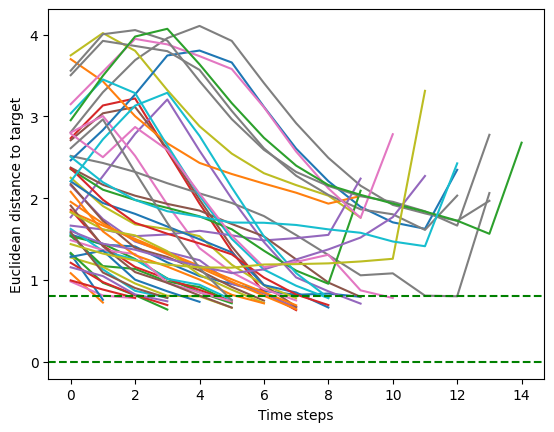

In [45]:
for i in range(50):
    plt.plot(euclids[i])
plt.axhline(y=0.8, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('Euclidean distance to target')
plt.show()